# **STAGE PONTS INSTRUMENTES - Notebook 17**


## Table of Contents

### 0. [Bibliothèques](#0/-Bibliothèques)
### I. [Choix de la LI générée](#I/-Choix-de-la-LI-générée)
1. [I.1 Approximation de la forme de la LI](#I.1-Approximation-de-la-forme-de-la-LI)
2. [I.2 Pondération par un coefficient tiré de l'expérimentation pour obtenir des signaux réalistes](#I.2-Pondération-par-un-coefficient-tiré-de-l'expérimentation-pour-obtenir-des-signaux-réalistes)

### II. [Choix de la configuration des essieux](#II/-Choix-configuration-des-essieux)
### III. [Génération de la vitesse](#III/-Génération-de-la-vitesse)
### IV. [Génération du signal](#IV/-Génération-du-signal)
### V. [Génération des peaks](#V/-Génération-des-peaks)
### VI. [Génération de namedTuple Truck](#VI/-Génération-de-namedTuple-Truck)
### VII. [Procédure](#VII/-Procédure)
1. [VII.1 Fonctions de la procédure](#VII.1-Fonctions-de-la-procédure)

### VIII. [Clustering selon les poids utilisés pour la calibration](#VIII/-Clustering-selon-les-poids-utilisés-pour-la-calibration)
### IX. [Ajout de bruit](#IX/-Ajout-de-bruit)

**Dans ce Notebook, nous allons réaliser la procédure précédente (sur les données récupérées par capteur) sur des données simulées. L'objectif est d'évaluer la robustesse de notre méthode.**

## 0/ Bibliothèques

In [1]:
import numpy as np
from numpy import cos, exp 
import matplotlib.pyplot as plt
from scipy.stats import norm as gauss
from scipy import signal
from Bwifsttar import get_func_li_from_scratch,load_senlis_modified,get_stats3
from Previous_files.bwim import create_toeplitz
import random

## I/ Choix de la LI générée

### I.1 Approximation de la forme de la LI

No handles with labels found to put in legend.


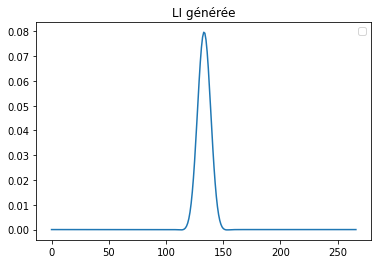

No handles with labels found to put in legend.


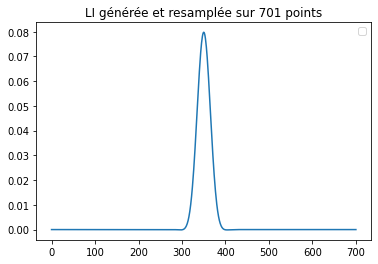

In [3]:
L = 20
S = 0.15
x = np.arange(-L,L,S)
p = gauss.pdf(x)
c = cos(2*np.pi*25/((2*L+1)*1/S)*x) 

li = p*c/5
plt.plot(li)
plt.title('LI générée')
plt.legend()
plt.show()

plt.figure()
li = signal.resample(li,701)
plt.plot(li)
plt.title('LI générée et resamplée sur 701 points')
plt.legend()
plt.show()

### I.2 Pondération par un coefficient tiré de l'expérimentation pour obtenir des signaux réalistes

No handles with labels found to put in legend.


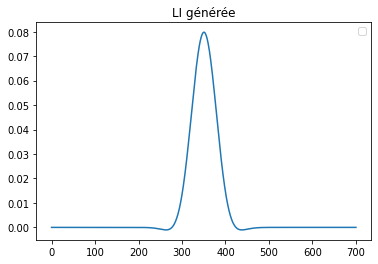

No handles with labels found to put in legend.


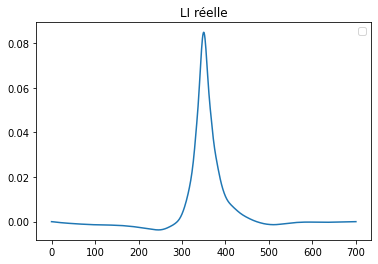

In [4]:
calibration_trucks,traffic_trucks = load_senlis_modified(selected=6) #[3,4,6,7]

func1D = get_func_li_from_scratch(calibration_trucks,traffic_trucks)
infl = func1D(20)

L = 10
S = 0.1
x = np.arange(-L,L,S)
p = gauss.pdf(x)
c = cos(2*np.pi*25/((2*L+1)*1/S)*x) 

li = p*c/5

plt.figure()
li = signal.resample(li,701)
plt.plot(li)
plt.title("LI générée")
plt.legend()
plt.show()



plt.figure()
plt.plot(infl)
plt.title('LI réelle')
plt.legend()
plt.show()
coef = infl/li



### I.3 Génération LI avec coeff et aléa

No handles with labels found to put in legend.


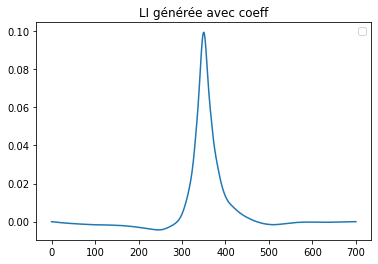

In [5]:
def gen_li():
    L = 10
    S = 0.1
    x = np.arange(-L,L,S)
    p = gauss.pdf(x)
    c = cos(2*np.pi*25/((2*L+1)*1/S)*x) 
    li = p*c/5
    li = signal.resample(li,701)
    rand = random.uniform(0.8, 1.4)
    return rand*li*coef
li = gen_li()
plt.figure()
plt.plot(li)
plt.title("LI générée avec coeff")
plt.legend()
plt.show()

## II/ Choix configuration des essieux

(1000,)


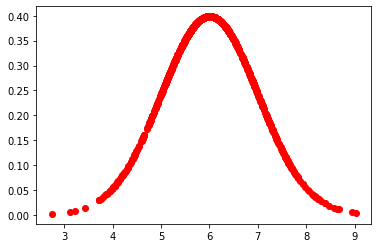

In [6]:
L = 12
S = 0.1
sigma = 1
mu = 6
s = np.random.normal(mu, sigma, 1000)
print(s.shape)
bins= s
plt.plot( s,1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) ),'o',linewidth=2,color='r')
plt.show()

In [7]:
"""## Exemples SENLIS

peaks=array([266, 367, 527, 559, 591]), weights=array([ 6.16068, 10.8499 ,  9.08406,  6.98472,  7.0632 ]))

senlis_weights = {
    'PL1_2015-10-01-09-45-52-576':  np.array([7.35, 11.25, 8.20, 8.10, 8.25]),
    'PL2_2015-10-01-09-55-36-371':  np.array([7.65, 14.10, 6.05, 6.20, 6.30]),
    'PL3_2015-10-01-10-22-34-654':  np.array([7.40, 11.60, 8.35, 8.50, 8.50]),
    'PL4_2015-10-01-10-35-43-279':  np.array([7.60, 12.35, 7.80, 7.70, 7.80]),
    'PL5_2015-10-01-10-59-39-060':  np.array([7.35, 10.50, 9.30, 9.70, 9.45]),
    'PL6_2015-10-01-11-05-36-548':  np.array([7.30, 14.30, 6.80, 6.60, 6.70]),
    'PL7_2015-10-01-11-14-06-712':  np.array([7.05, 13.95, 7.25, 7.55, 7.90]),
    'PL8_2015-10-01-11-42-22-222':  np.array([6.40, 14.05, 6.85, 6.75, 6.65]),
    'PL9_2015-10-01-14-42-22-908':  np.array([8.20, 12.00, 8.35, 8.40, 8.35]),
    'PL10_2015-10-01-14-58-50-212': np.array([6.75, 12.45, 8.00, 8.10, 8.00]),
    'PL11_2015-10-01-15-00-57-826': np.array([7.15, 11.40, 8.05, 8.00, 8.45]),
    'PL12_2015-10-01-15-10-30-906': np.array([7.40, 10.80, 8.80, 9.05, 8.75]),
    'PL13_2015-10-01-15-19-48-718': np.array([8.15, 12.20, 7.30, 8.30, 8.80]),
    'PL14_2015-10-01-15-34-03-982': np.array([6.20,  5.05, 7.95, 7.65, 7.40, 7.65]),
    'PL15_2015-10-01-15-36-13-519': np.array([5.35,  8.25, 8.10, 7.75, 7.80, 7.60]),
}

##PEAKS 

[266 367 527 559 591]
[263 342 471 494 518]
[266 366 526 558 590]
[263 347 480 508 536]
[261 341 472 492 514]
[266 367 527 560 593]
[262 342 467 494 521]
[266 368 528 561 593]
[265 344 470 496 522]
[265 354 492 521 550]
[317 397 522 549 575]
"""

"## Exemples SENLIS\n\npeaks=array([266, 367, 527, 559, 591]), weights=array([ 6.16068, 10.8499 ,  9.08406,  6.98472,  7.0632 ]))\n\nsenlis_weights = {\n    'PL1_2015-10-01-09-45-52-576':  np.array([7.35, 11.25, 8.20, 8.10, 8.25]),\n    'PL2_2015-10-01-09-55-36-371':  np.array([7.65, 14.10, 6.05, 6.20, 6.30]),\n    'PL3_2015-10-01-10-22-34-654':  np.array([7.40, 11.60, 8.35, 8.50, 8.50]),\n    'PL4_2015-10-01-10-35-43-279':  np.array([7.60, 12.35, 7.80, 7.70, 7.80]),\n    'PL5_2015-10-01-10-59-39-060':  np.array([7.35, 10.50, 9.30, 9.70, 9.45]),\n    'PL6_2015-10-01-11-05-36-548':  np.array([7.30, 14.30, 6.80, 6.60, 6.70]),\n    'PL7_2015-10-01-11-14-06-712':  np.array([7.05, 13.95, 7.25, 7.55, 7.90]),\n    'PL8_2015-10-01-11-42-22-222':  np.array([6.40, 14.05, 6.85, 6.75, 6.65]),\n    'PL9_2015-10-01-14-42-22-908':  np.array([8.20, 12.00, 8.35, 8.40, 8.35]),\n    'PL10_2015-10-01-14-58-50-212': np.array([6.75, 12.45, 8.00, 8.10, 8.00]),\n    'PL11_2015-10-01-15-00-57-826': np.array([7

In [8]:

def gen_essieux(poidstot,length):
    
    mu = poidstot /length
    sigma = 1
    axles = np.random.normal(mu, sigma, length)
    while np.sum(axles)>poidstot+0.1 or np.sum(axles)<poidstot-0.1:
        axles = np.random.normal(mu, sigma, length)

    print(np.sum(axles))
    return axles
def gen_essieux2(poidstot,length):
    
    mu = poidstot /length
    sigma = 1
    axles0 = np.random.normal(mu*0.7, sigma, 1)
    axles1 = np.random.normal(mu*1.3,sigma,1)
    axles0 = np.append(axles0,axles1)
    axles = np.append(axles0,np.random.normal(mu*1.4, sigma, length-2))
    while np.sum(axles)>poidstot+0.5 or np.sum(axles)<poidstot-0.5:
        axles = np.append(axles0,np.random.normal(mu*1.2, sigma, length-2))

    return axles


essieux = gen_essieux2(41,5)
print(essieux)
    
     

[6.86716698 8.06193831 9.12816292 8.20501517 8.38406226]


## III/ Génération de la vitesse

In [9]:
def get_speed():
    return np.random.normal(21, 2, 1)[0]
get_speed()

22.179606717442653

## IV/ Génération du signal

In [10]:

def gen_signal(influence,weights,peaks):
    toeplitz  = create_toeplitz(701, 701, peaks)
    T_matrix  = np.sum(weights[:,None,None] * toeplitz, axis=0)
    signal = T_matrix @ influence
    return signal

## V/ Génération des peaks

In [11]:
liste_p0=[]
liste_p1=[]
liste_p2=[]
liste_p3=[]
liste_p4=[]

trucks = [truck for truck in calibration_trucks if(len(truck.weights)==len(truck.peaks))]
trucks_t = [truck for truck in traffic_trucks if(len(truck.weights)==len(truck.peaks))]

for truck in trucks[0:-2]:
    print(len(truck.weights))
    liste_p0.append(truck.peaks[0])
    liste_p1.append(truck.peaks[1])
    liste_p2.append(truck.peaks[2])
    liste_p3.append(truck.peaks[3])
    liste_p4.append(truck.peaks[4])

for truck in trucks_t:
    print(len(truck.weights))
    liste_p0.append(truck.peaks[0])
    liste_p1.append(truck.peaks[1])
    liste_p2.append(truck.peaks[2])
    liste_p3.append(truck.peaks[3])
    liste_p4.append(truck.peaks[4])

liste_p0 = np.array(liste_p0)
liste_p1 = np.array(liste_p1)
liste_p2 = np.array(liste_p2)
liste_p3 = np.array(liste_p3)
liste_p4 = np.array(liste_p4)
print(liste_p1)
print(np.mean(liste_p1))
print(np.std(liste_p1))

m0 = np.mean(liste_p0)
s0 = np.std(liste_p0)

m1 = np.mean(liste_p1)
s1 = np.std(liste_p1)

m2 = np.mean(liste_p2)
s2 = np.std(liste_p2)

m3 = np.mean(liste_p3)
s3 = np.std(liste_p3)

m4 = np.mean(liste_p4)
s4 = np.std(liste_p4)

def gen_peaks(bridge):
    peaks = []
    if bridge=='senlis':
        peaks0 = int(np.random.normal(m0, 1, 1)[0])
        peaks1 = int(np.random.normal(m1, 1, 1)[0])
        peaks2 = int(np.random.normal(m2, 1, 1)[0])
        peaks3 = int(np.random.normal(m3, 1, 1)[0])
        peaks4 = int(np.random.normal(m4, 1, 1)[0])
        peaks.append([peaks0,peaks1,peaks2,peaks3,peaks4])
        return peaks[0]
peaks = gen_peaks('senlis')
    

5
5
5
5
5
5
5
5
5
5
5
5
5
6
5
5
5
5
5
5
5
5
5
[341 342 397 342 347 344 368 366 367 351 355 354 350 399 361 353 349 354
 353 354 350 344 357]
356.4347826086956
14.86117230719183


No handles with labels found to put in legend.


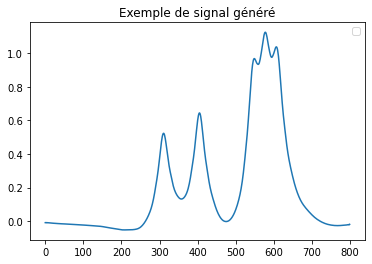

No handles with labels found to put in legend.


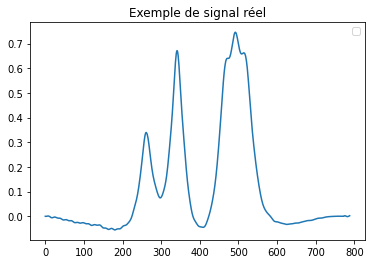

In [12]:
plt.figure()
plt.plot(signal.resample(gen_signal(infl,essieux,peaks),800))
plt.title("Exemple de signal généré")
plt.legend()
plt.show()
plt.figure()
plt.plot(trucks[0].signals)
plt.title("Exemple de signal réel")
plt.legend()
plt.show()

## VI/ Génération de namedTuple Truck

No handles with labels found to put in legend.


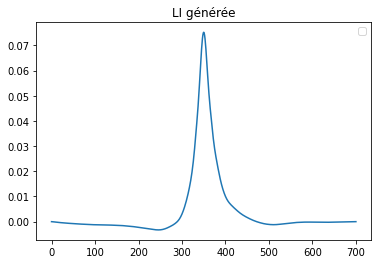

No handles with labels found to put in legend.




Speed :  22.810330308508913
Peaks :  [272, 356, 478, 507, 533]
Weights :  [ 6.25214273 10.2964913   8.08238329  8.63351204  7.66390058]


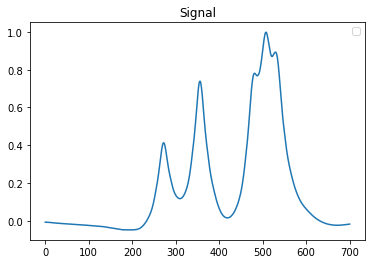

In [13]:
from collections import namedtuple

Truck = namedtuple('Truck', [ 'weights', 'peaks', 'speed', 'signals'])
    

def create_truck(li):
    essieux = gen_essieux2(41,5)
    peaks = gen_peaks('senlis')
    speed = get_speed()
    signal = gen_signal(li,essieux,peaks)
    truck   = Truck(essieux, peaks, speed, signal)
    return truck

li = gen_li()
plt.figure()
plt.plot(li)
plt.title("LI générée")
plt.legend()
plt.show()
truck0 = create_truck(li)

print("\n\nSpeed : ",truck0.speed)
print("Peaks : ",truck0.peaks)
print("Weights : ",truck0.weights)
plt.figure()
plt.plot(truck0.signals)
plt.title("Signal")
plt.legend()
plt.show()

In [15]:
import itertools
import numpy as np
from Previous_files.interpolation_LI import find_best_peaks
from Previous_files.interpolation_LI import get_combinations
from Previous_files.interpolation_LI import estimation_peaks
from Previous_files.interpolation_LI import find_best_position_signal
from Previous_files.interpolation_LI import reconstruction_peaks
from Previous_files.interpolation_LI import eval_LI
from scipy.interpolate import interp1d
import scipy.optimize as so
from scipy.optimize import minimize
from Previous_files.interpolation_LI import time_to_meter_interpolation_mt,prepare_least_squares_mt,get_std,prepare_regularization,estimation
from Previous_files.interpolation_LI import calibration_mt
from Previous_files.interpolation_LI import load_senlis_modified
import random
import matplotlib.pyplot as plt
from Previous_files.plot import compare_weights


## VII/ Procédure

### VII.1 Fonctions de la procédure


In [16]:
li = gen_li()

def get_repartition(repartition_calib,nbre_trucks):
    n_calib = int(repartition_calib * nbre_trucks)
    n_traffic = nbre_trucks - n_calib
    se_calib = np.empty(n_calib,dtype=object)
    se_traffic = np.empty(n_traffic,dtype=object)
    for i in range(n_calib):
        se_calib[i]=create_truck(li)
        se_traffic[i]=create_truck(li)

        #se_calib.append(create_truck(li))
        #se_traffic.append(create_truck(li))
    return se_calib,se_traffic

trucks_c, trucks_t = get_repartition(0.5,10)

In [17]:
def get_poids_Stats(se_Poids,func1D,decalage = None):
    """
        Prend comme paramètre le sous ensemble de poids et la fonction interp LI/Vitesses
        Retourne la liste des poids estimés pour ces camions
    """
    import numpy as np
    from Bwifsttar import find_best_peaks,estimation_peaks,find_best_position_locale,get_position_decalage_stats
    
    print("********** Working on weights... **********")
    list_poids = []
    for i,truck in enumerate(se_Poids):
        if(decalage=='combinaisons'):
        
            dec = find_best_position_locale(truck,2,func1D)
            w = estimation_peaks(truck,dec, func1D(truck.speed))
        elif(decalage=='On_peak'):
            dec = get_position_decalage_stats(truck,func1D)
            w = estimation_peaks(truck,dec, func1D(truck.speed))      
        else :
            w = estimation_peaks(truck,truck.peaks, func1D(truck.speed)) 
            
        list_poids.append(w)
    list_poids = np.array(list_poids)
    return list_poids

        

In [18]:
print(trucks_c.shape)
print(trucks_t.shape)


(5,)
(5,)


In [19]:
func1D(create_truck(li).speed).shape

(701,)

In [20]:
from scipy.optimize import minimize
from scipy.spatial import distance
from Bwifsttar import prepare_least_squares_mt

def calibration_mt(trucks, l2_reg=None, tv_reg=None):# pour le moment aucune régularization
    
    
    As, bs = prepare_least_squares_mt(trucks,701)#retourne T et y
    for a in As:
        a = a.astype(float)
        
    for b in bs:
        b = b.astype(float)
    
    
    #bs = np.expand_dims(bs,axis=1)
    #As = np.expand_dims(As,axis=0)
    #As = np.reshape(As,(-1,788,788))
    
    trucks_calculables = [truck for truck in trucks if(len(truck.weights) == len(truck.peaks))]

    #print("WS : ",ws) #pondération selon niveau de bruit
    
    
    
    
    
    #print(bs.shape)
    #print(As.shape)
    #print(bs[0][0])
    #As, bs = prepare_regularization(As, bs, l2_reg, tv_reg)#Aucune régularisation pour le moment
    #print("Final input a : ", [a for a in As[0]])
    #print("Final input b : ", [b for b in bs[0][0]])

    #influence_0 ,_, _, _ = np.linalg.lstsq([a for a in As],[b for b in bs], rcond=None)# Retourne la solution des moindres carrés de ||y - Th||² avec h notre ligne d'influence (donc donne h)
    #influence_0 = np.linalg.lstsq(As,bs,rcond=None)

    
    infl,_, _, _ = np.linalg.lstsq(As[0],bs[0], rcond=None)  
    #print("Influence 0 shape : ",infl.shape)
    #for i in range(0,As.shape[0]):
        #print(As.shape)
        #print(bs.shape)
        #infl,_, _, _ = np.linalg.lstsq(As[i],bs[i], rcond=None)  
        #print("Ieme influence shape : ",infl.shape)
    #influence ,_, _, _ = np.linalg.lstsq(input_A,input_b , rcond=None)# Retourne la solution des moindres carrés de ||y - Th||² avec h notre ligne d'influence (donc donne h)
    
    def func_to_min(h,i):
        return np.linalg.norm(As[i]*h-np.expand_dims(bs[i],axis=1))**2
    
    def func_finale_to_min(h):
        norm_array = np.array([])
        for i in range(As.shape[0]):
            #norm_array = np.append(norm_array,func_to_min(h,i))
            norm_array = np.append(norm_array,np.linalg.norm(As[i]@h-bs[i])**2)
            
        return np.sum(norm_array)
    
    #print("TEST NORME : ",func_to_min(infl,1))
    #print("ARRAY NORM : ",func_finale_to_min(infl))
    influence_finale = minimize(func_finale_to_min,infl,method='Nelder-Mead',tol=0.1)#utiliser CG pour plus rapidité
    #influence_bundle = time_to_meter_interpolation_mt(trucks[0], influence)#tous les camions ont la même vitesse (ou elle est normalisée)
    return influence_finale.x

def get_LI(se_LI):
    """
        Prend en paramètre le sous ensemble de camions pour interpoler la LI /vitesses
        Retourne la fonction interpolée
    """
    print("********** Working on LI... **********")
    list_speeds = []
    list_infl = []
    for i,truck in enumerate(se_LI):
        list_speeds.append(se_LI[i].speed)
        infl = calibration_mt(se_LI[i:i+1],l2_reg={'strength': 1e3, 'cutoff': 0.01},tv_reg={'strength': 1e3, 'cutoff': 0.95})
        list_infl.append(infl)
        
    func1D   = interp1d(list_speeds, list_infl, fill_value="extrapolate",axis=0)#permet à partir de meters et infuence de trouver une approximation de influence = f(meters)
    return func1D
    #return np.array(list_infl)

#infls = get_LI(trucks_c)
#func = get_LI(trucks_c)

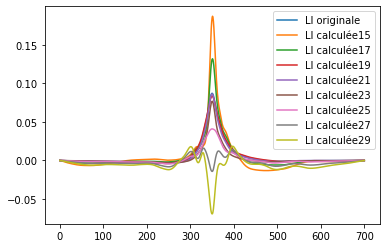

In [21]:
plt.figure()
plt.plot(li,label="LI originale")
for i in range(15,30,2):
    plt.plot(func1D(i),label="LI calculée"+str(i))
plt.legend()
# il n'y a en effet aucun facteur

In [22]:
def reconstruction_peaks(truck, influence_bundle,peaks):
    influence = influence_bundle
    toeplitz  = create_toeplitz(701, influence.size, peaks)
    T_matrix  = np.sum(truck.weights[:,None,None] * toeplitz, axis=0)
    predicted = T_matrix @ influence
    return predicted, influence


def eval_LI(influence_estimee,truck,peaks):

    reconstructed, rescaled = reconstruction_peaks(truck, influence_estimee,peaks)
    diff = truck.signals.T - reconstructed
    de = np.linalg.norm(truck.signals.T - reconstructed)
    #print("Distance euclidienne :" ,de)


    return de


def estimation_peaks(truck,peaks, influence_bundle):
    influence= influence_bundle
    toeplitz = create_toeplitz(truck.signals.shape[-1], influence.size, peaks)
    H_matrix = toeplitz @ influence
    w ,_,_,_ = np.linalg.lstsq(H_matrix.T, truck.signals, rcond=None)
    return w
def find_best_position_signal(truck,pos_dec,peaks0,values,func1D):#décaler essieu par essieu
    
    var= 10000
    peaks = peaks0
    for i in values:

        peaks[pos_dec] = i
        infl = func1D(truck.speed)
        
        
        res = eval_LI(infl,truck,peaks)
        #print(res)
        if(res<var):
            decalage = i
            var = res
            #print(i)
            #print(var)
    print("Décalage trouvé")
    return decalage
def get_position_decalage_(truck,func1D):
    signal = truck.signals
    peaks = truck.peaks
    weights= truck.weights
    print("PEAKS : ",peaks)
    for i,peak in enumerate(peaks):
        
        
        if i==0:
            values = [k for k in range(int(peaks[i])+20) if k%2==0]
        else:
            values = [k for k in range(int(peaks[i])-50,int(peaks[i])+50)]

            
        print("position décalage",i)
        print("peaks0 : ",peak)
        #print("values : ",values)
        
        decalage_found = find_best_position_signal(truck,i,peaks,values,func1D) 
        
        print("decalage found : ",decalage_found)
        
        peaks[i] = decalage_found

    return peaks

def get_poids(se_Poids,func1D):
    """
    
        Prend comme paramètre le sous ensemble de poids et la fonction interp LI/Vitesses
        Retourne la liste des poids estimés pour ces camions
    """
    print("********** Working on weights... **********")
    list_poids = []
    for i,truck in enumerate(se_Poids):
        #print(str(i+1)+"/"+str(len(se_Poids)))
        #decalage  = find_best_position_signal(truck,2,func1D)
        #decalage = find_best_peaks(truck,2,func1D)
        #decalage = truck.peaks
        decalage = get_position_decalage_(truck,func1D)
        w = estimation_peaks(truck,decalage, func1D(truck.speed))
        list_poids.append(w)
    list_poids = np.array(list_poids)
    return list_poids
#w = get_poids(trucks_t,func)

In [25]:
def get_erreur_essieu(se2,list_poids_estimes):
    print("********** Working on errors... **********")
    list_erreurs_essieu = []
    list_erreurs_totales = []
    for i,truck in enumerate(se2):
        poids_reel = truck.weights
        poids_total_reel= np.sum(truck.weights)
        poids_estime = list_poids_estimes[i]
        poids_total_estime = np.sum(list_poids_estimes[i])
        diff = abs(poids_reel-poids_estime)
        diff_totale = abs(poids_total_reel-poids_total_estime)
        list_erreurs_essieu.append(diff)
        list_erreurs_totales.append(diff_totale)
    list_erreurs_essieu = np.array(list_erreurs_essieu)
    list_erreurs_totales = np.array(list_erreurs_totales)
    return list_erreurs_essieu,list_erreurs_totales


In [26]:
def get_metrics(list_erreurs_essieu,list_erreurs_totales,se2):
    print("**********  Working on metrics... **********")
    """
        Prend en params les erreurs sur essieux et les erreurs totales
        
        Retourne :
        - l'erreur total moyenne sur l'ensemble des camions de test, ok
        - la liste des % d'erreur sur le poids total de chaque camion de test ok
        - le % d'erreur moyen sur les poids totaux des camions de test, ok
        - la liste des erreurs moyennes par essieu, ok
        - la liste des % d'erreur moyen par essieu, ok
    """
    poids_totaux = []
    poids = []
    for truck in se2:
        poids_totaux.append(np.sum(truck.weights))
        poids.append(truck.weights)
    poids = np.array(poids)
    poids_essieu_moyen = []
    for poid in poids.T:
        poids_essieu_moyen.append(np.sum(poid)/len(poid))
        
        
    scores_moyen_essieux = []
    percent_moyen_essieux = []
    score_moyen_total = np.sum(list_erreurs_totales)/len(list_erreurs_totales)
    percent_erreur_totale = []
    
    for j,i in enumerate(list_erreurs_essieu.T):
        scores_moyen_essieux.append(np.sum(i)/len(i))
    
    for j,i in enumerate(poids_essieu_moyen):
        val = 1 - (poids_essieu_moyen[j]-scores_moyen_essieux[j])/poids_essieu_moyen[j]
        percent_moyen_essieux.append(val)
    
    for j,i in enumerate(poids_totaux):
        val = 1 - (poids_totaux[j]-list_erreurs_totales[j])/poids_totaux[j]
        percent_erreur_totale.append(val)
    
    percent_erreur_totale_moy = np.sum(percent_erreur_totale)/len(percent_erreur_totale)
    
    return np.array(score_moyen_total),np.array([percent_erreur_totale])*100,np.array([percent_erreur_totale_moy])*100,np.array(scores_moyen_essieux),100*np.array(percent_moyen_essieux)


In [28]:
import matplotlib.pyplot as plt
import collections 
from Previous_files.plot import compare_weights
from scipy.interpolate import interp1d

def get_stats3(iterations,repartition):
    """
        Prend en params le nombre d'itérations voulues et la repartition dans les sous ensemble
        Retourne :
            - L'erreur totale moyenne (t)
            - L'erreur moyenne par essieu (t)
            - Le % d'erreur moyen total (%)
            - Le % d'erreur moyen total par essieu (%)
        Affiche :
            - Le diagramme baton des erreurs sur les poids totaux
            - Le diagrame baton des erreurs sur les poids totaux redressés
            - Le diagramme baton des erreurs par essieu
    """
    list_erreur_tot_moy = []
    list_erreur_essieu_moy = np.zeros(5)
    list_percent_erreur_moy_tot = []
    list_percent_erreur_essieu = np.zeros(5)
    list_erreurs_tot = []
    list_erreurs_tot_redr = []
    list_erreur_essieu1 = []
    list_erreur_essieu2 = []
    list_erreur_essieu3 = []
    list_erreur_essieu4 = []
    list_erreur_essieu5 = []

    list_percent_tot = []
    list_trucks_anormaux = []
    for i in range(iterations):
        
        print("Itération n° : "+str(i+1)+"/"+str(iterations))
        se1,se2 = get_repartition(repartition,100)
        
        list_speed_li = [truck.speed for truck in se1]
        
        print("LEN SE1 : ",len(se1))
        print("LEN SE2 : ",len(se2))
        func = get_LI(se1)
        poids_estimes = get_poids(se2,func)
        scores,scores_totaux = get_erreur_essieu(se2,poids_estimes)
        erreur_tot_moy,list_percent_err_poids_tot,percent_err_moy,list_err_moy_essieux,list_percent_moy_essieux = get_metrics(scores,scores_totaux,se2)
        for a,j in enumerate(poids_estimes):
            print("ERREUR : ",np.sum(j)-np.sum(se2[a].weights))
            
            #if(((np.sum(j)-np.sum(se2[a].weights)) > 20) or ((np.sum(j)-np.sum(se2[a].weights ))< -20) ):
            if(se2[a].speed > max(list_speed_li) or se2[a].speed < min(list_speed_li)):
                list_trucks_anormaux.append(se2[a])
                print("SPEED : ",se2[a].speed)
                #plt.figure()
                #plt.plot(se2[a].signals)
                #plt.show()
                #print(eval_LI(func(se2[a].speed),se2[a],se2[a].peaks))
                #reconstructed, rescaled = reconstruction_peaks(se2[a], func(se2[a].speed),se2[a].peaks)
                #meters = se2[a].speed*se2[a].time
                #plt.plot(meters[:len(reconstructed)], reconstructed[:len(meters)], linewidth=2, label='Recon.')
                #plt.plot(meters[:len(se2[a].signals.T)], se2[a].signals.T[:len(meters)], label='Observed', alpha=0.7)
                #plt.legend()
                #plt.show()
            else:
                print("Comparing weights")
                compare_weights(j,se2[a].weights)
                try:
                    list_erreurs_tot.append(np.sum(j)-np.sum(se2[a].weights))
                    

                    list_erreurs_tot_redr.append(abs(np.sum(j)-np.sum(se2[a].weights)))

                    list_percent_tot.append(100*(list_erreurs_tot[a]/np.sum(se2[a].weights)))
                except:
                    continue
            #print(1-100*(list_erreurs_tot[a]/np.sum(se2[a].weights)))
                try:
                    for a,j in enumerate(poids_estimes.T[0]):
                        try:
                            list_erreur_essieu1.append(j-se2[a].weights[0])
                        except:
                            continue
                    for a,j in enumerate(poids_estimes.T[1]):
                        try:
                            list_erreur_essieu2.append(j-se2[a].weights[1])
                        except:
                            continue

                    for a,j in enumerate(poids_estimes.T[2]):
                        try:
                            list_erreur_essieu3.append(j-se2[a].weights[2])
                        except:

                            continue
                    for a,j in enumerate(poids_estimes.T[3]):
                        try:
                            list_erreur_essieu4.append(j-se2[a].weights[3])
                        except:
                            continue
                    for a,j in enumerate(poids_estimes.T[4]):
                        try:
                            list_erreur_essieu5.append(j-se2[a].weights[4])
                        except:
                            continue
                except:
                    pass
                np.save("erreurs_simu/erreurs_tot.npy",list_erreurs_tot)
                np.save("erreurs_simu/erreurs_tot_redr.npy",list_erreurs_tot_redr)
                np.save("erreurs_simu/erreur_essieu1.npy",list_erreur_essieu1)
                np.save("erreurs_simu/erreur_essieu2.npy",list_erreur_essieu2)
                np.save("erreurs_simu/erreur_essieu3.npy",list_erreur_essieu3)
                np.save("erreurs_simu/erreur_essieu4.npy",list_erreur_essieu4)
                np.save("erreurs_simu/erreur_essieu5.npy",list_erreur_essieu5)
        #print("\n\n\n\nMetrics sur les poids totaux : \n\n")
        #print("Liste des erreurs totales (t) : ",scores_totaux)
        #print("\nErreur totale moyenne sur l'ensemble des camions de test (t) : ",erreur_tot_moy)
        list_erreur_tot_moy.append(erreur_tot_moy)
        #print("\nListe des % d'erreur sur le poids total de chaque camion de test (%)",list_percent_err_poids_tot)
        #print("\n% d'erreur moyen sur les poids totaux des camions de test (%)",percent_err_moy)
        list_percent_erreur_moy_tot.append(percent_err_moy)
        #print("\n\nMetrics sur les poids par essieu : \n\n")
        #print("Scores par essieu (t) \n", scores)
        #print("\nListe des erreurs moyennes par essieu (t) : ",list_err_moy_essieux)
        #list_erreur_essieu_moy = np.add(list_erreur_essieu_moy,list_err_moy_essieux)
        #print("\nListe des % d'erreur moyen par essieu (%) : ",list_percent_moy_essieux)
        #list_percent_erreur_essieu = np.add(list_percent_erreur_essieu,list_percent_moy_essieux)
        
        #erreur_tot_moy = np.sum(np.array(list_erreur_tot_moy)/len(list_erreur_tot_moy))
        #erreur_essieu_moy =list_erreur_essieu_moy/len(list_erreur_essieu_moy)
        #percent_err_tot_moy = np.sum(list_percent_erreur_moy_tot)/len(list_percent_erreur_moy_tot)
        #percent_erreur_essieux = list_percent_erreur_essieu/len(list_percent_erreur_essieu)
    list_erreurs_tot=np.array(list_erreurs_tot)
    list_erreurs_tot_redr=np.array(list_erreurs_tot_redr)
    list_erreur_essieu1=np.array(list_erreur_essieu1)
    list_erreur_essieu2=np.array(list_erreur_essieu2)
    list_erreur_essieu3=np.array(list_erreur_essieu3)
    list_erreur_essieu4=np.array(list_erreur_essieu4)
    list_erreur_essieu5=np.array(list_erreur_essieu5)

    
    
    return list_trucks_anormaux,list_erreurs_tot,list_erreurs_tot_redr,list_percent_tot,list_erreur_essieu1,list_erreur_essieu2,list_erreur_essieu3,list_erreur_essieu4,list_erreur_essieu5
#lta,let,letr,lpt,lee1,lee2,lee3,lee4,lee5= get_stats3(40,0.5
 #                                                )

In [54]:
lta,let,letr,lpt,lee1,lee2,lee3,lee4,lee5= get_stats3(40,0.5)

Itération n° : 1/40
LEN SE1 :  50
LEN SE2 :  50
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 356, 477, 506, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 355, 477, 506, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 478, 507, 533]
position décalage 0
peaks0 :  274
Décalage t

KeyboardInterrupt: 

## VIII/ Clustering selon les poids utilisés pour la calibration

In [29]:
li = gen_li()

def create_truck(li,pt,nbre_essieux):
    essieux = gen_essieux2(pt,nbre_essieux)
    peaks = gen_peaks('senlis')
    speed = get_speed()
    signal = gen_signal(li,essieux,peaks)
    truck   = Truck(essieux, peaks, speed, signal)
    return truck

liste_trucks = []

for i in range(100):
    pt = int(np.random.uniform(20,40))
    #print(pt)
    liste_trucks.append(create_truck(li,pt,5))
    
ls_clust = []
for truck in liste_trucks:
    ls_clust.append(truck.weights)
ls_clust = np.array(ls_clust)

In [56]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=0).fit(ls_clust)
print(kmeans.labels_)
for i in range(len(kmeans.cluster_centers_)):
    print(kmeans.cluster_centers_[i])

[1 1 2 1 1 0 2 1 1 2 0 1 1 2 1 0 2 1 2 1 0 0 0 1 1 1 0 0 0 2 0 1 1 0 1 2 1
 2 2 0 2 2 2 1 2 0 2 2 2 2 0 1 1 2 0 2 1 2 2 1 0 2 1 1 0 2 1 1 0 0 2 1 1 0
 0 2 2 2 1 2 1 1 0 2 2 0 1 1 0 1 2 1 2 1 1 1 2 1 0 2]
[4.051555   6.58430933 6.22043537 6.13394164 5.44469893]
[4.87664394 9.18745058 6.90056062 7.01943482 6.8817064 ]
[3.3118012  5.78245479 4.40618388 4.77208262 4.3577103 ]


In [57]:
targets = ["Normal","Très chargé","Peu chargé"]
for i in range(20,40,2):
    print("Poids total : ", str(i))
    print(targets[kmeans.predict(np.array([create_truck(li,i,5).weights]))[0]])
    print("\n")

Poids total :  20
Peu chargé


Poids total :  22
Peu chargé


Poids total :  24
Peu chargé


Poids total :  26
Peu chargé


Poids total :  28
Normal


Poids total :  30
Normal


Poids total :  32
Très chargé


Poids total :  34
Très chargé


Poids total :  36
Très chargé


Poids total :  38
Très chargé




## IX/ Ajout de bruit 

In [30]:
from Bwifsttar import get_idx_five_meters,load_senlis_modified


<Figure size 432x288 with 0 Axes>

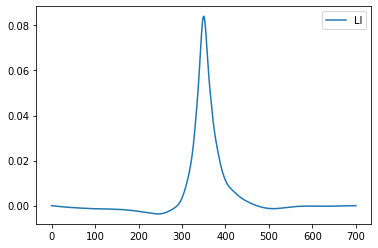

<Figure size 432x288 with 0 Axes>

In [31]:
calibration_trucks , traffic_trucks = load_senlis_modified(6)
#trucks_c, trucks_t = get_repartition(0.5,20)
li = gen_li()

plt.figure()
plt.plot(li,label='LI')
plt.legend()
plt.figure()

idx 5m :  107


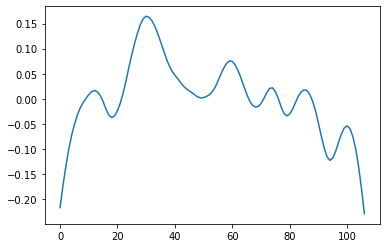

In [32]:
truck = calibration_trucks[0]

idx_5m = get_idx_five_meters(truck.time*truck.speed,5)
print("idx 5m : ",idx_5m)

import numpy as np
import scipy.signal
import matplotlib.pyplot as plt

y = np.random.rand(idx_5m)
win = scipy.signal.hann(20)
filtered = scipy.signal.convolve(y, win, mode='same') / sum(win)

plt.figure()
plt.plot((filtered-np.mean(filtered)))

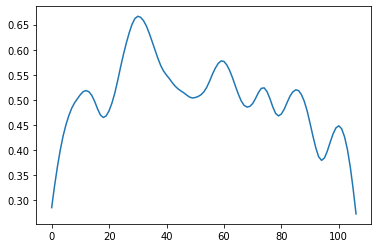

In [33]:
filtered = scipy.signal.resample(filtered,idx_5m)
plt.figure()
plt.plot(filtered)

In [34]:
calibration_trucks,traffic_trucks = load_senlis_modified(6)
truck = calibration_trucks[0]
signals = truck.signals

In [35]:
import random
import math

def aleaGauss(sigma):
    U1 = random.random()
    U2 = random.random()
    return sigma*math.sqrt(-2*math.log(U1))*math.cos(2*math.pi*U2) 


sigma = 0
for i,s in enumerate(signals):
    #s += aleaGauss(sigma)
    signals[i] = signals[i]+aleaGauss(sigma)

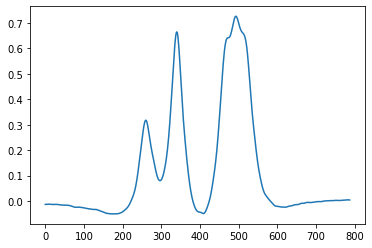

In [36]:
plt.figure()
plt.plot(signals)

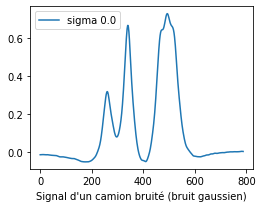

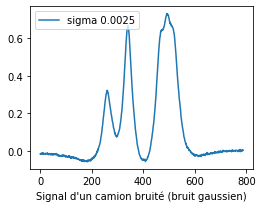

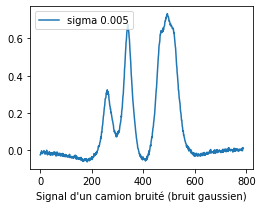

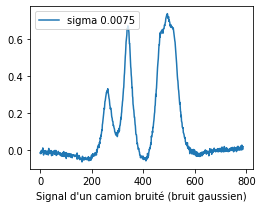

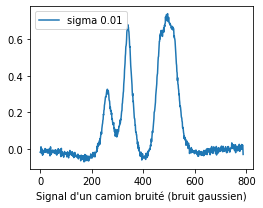

In [37]:
rang = np.linspace(0,0.01,5)
for i in rang:
    plt.figure(figsize=(4,3))

    calibration_trucks,traffic_trucks = load_senlis_modified(6)
    truck = calibration_trucks[0]
    signals = truck.signals
    
    for j,s in enumerate(signals):
        #s += aleaGauss(sigma)
        signals[j] = signals[j]+aleaGauss(i)
    plt.plot(signals,label="sigma "+str(i))
    plt.xlabel("Signal d'un camion bruité (bruit gaussien)")
    plt.legend()
plt.show()

In [38]:
def create_truck_noise(li,pt,nbre_essieux,sigma=0):
    def aleaGauss(sigma):
        U1 = random.random()
        U2 = random.random()
        return sigma*math.sqrt(-2*math.log(U1))*math.cos(2*math.pi*U2) 

    essieux = gen_essieux2(pt,nbre_essieux)
    peaks = gen_peaks('senlis')
    speed = get_speed()
    signal = gen_signal(li,essieux,peaks)
    for i,s in enumerate(signals):
        signals[i] = signals[i]+aleaGauss(sigma)
    truck   = Truck(essieux, peaks, speed, signal)
    return truck
def get_repartition_noise(repartition_calib,nbre_trucks,sigma=0):
    n_calib = int(repartition_calib * nbre_trucks)
    n_traffic = nbre_trucks - n_calib
    se_calib = np.empty(n_calib,dtype=object)
    se_traffic = np.empty(n_traffic,dtype=object)
    for i in range(n_calib):
        se_calib[i]=create_truck_noise(li,41,5,sigma=sigma)
        se_traffic[i]=create_truck_noise(li,41,5,sigma=sigma)

        #se_calib.append(create_truck(li))
        #se_traffic.append(create_truck(li))
    return se_calib,se_traffic

In [47]:
def get_stats3_noise(iterations,repartition,sigma=0):
    """
        Prend en params le nombre d'itérations voulues et la repartition dans les sous ensemble
        Retourne :
            - L'erreur totale moyenne (t)
            - L'erreur moyenne par essieu (t)
            - Le % d'erreur moyen total (%)
            - Le % d'erreur moyen total par essieu (%)
        Affiche :
            - Le diagramme baton des erreurs sur les poids totaux
            - Le diagrame baton des erreurs sur les poids totaux redressés
            - Le diagramme baton des erreurs par essieu
    """
    list_erreur_tot_moy = []
    list_erreur_essieu_moy = np.zeros(5)
    list_percent_erreur_moy_tot = []
    list_percent_erreur_essieu = np.zeros(5)
    list_erreurs_tot = []
    list_erreurs_tot_redr = []
    list_erreur_essieu1 = []
    list_erreur_essieu2 = []
    list_erreur_essieu3 = []
    list_erreur_essieu4 = []
    list_erreur_essieu5 = []

    list_percent_tot = []
    list_trucks_anormaux = []
    print("SIGMA FOR NOISE : ",sigma)
    for i in range(iterations):
        
        print("Itération n° : "+str(i+1)+"/"+str(iterations))
        se1,se2 = get_repartition_noise(repartition,50,sigma=sigma)
        
        list_speed_li = [truck.speed for truck in se1]
        
        print("LEN SE1 : ",len(se1))
        print("LEN SE2 : ",len(se2))
        func = get_LI(se1)
        poids_estimes = get_poids(se2,func)
        scores,scores_totaux = get_erreur_essieu(se2,poids_estimes)
        erreur_tot_moy,list_percent_err_poids_tot,percent_err_moy,list_err_moy_essieux,list_percent_moy_essieux = get_metrics(scores,scores_totaux,se2)
        for a,j in enumerate(poids_estimes):
            print("ERREUR : ",np.sum(j)-np.sum(se2[a].weights))
            
            #if(((np.sum(j)-np.sum(se2[a].weights)) > 20) or ((np.sum(j)-np.sum(se2[a].weights ))< -20) ):
            if(se2[a].speed > max(list_speed_li) or se2[a].speed < min(list_speed_li)):
                list_trucks_anormaux.append(se2[a])
                print("SPEED : ",se2[a].speed)
                #plt.figure()
            else:
                print("Comparing weights")
                compare_weights(j,se2[a].weights)
                try:
                    list_erreurs_tot.append(np.sum(j)-np.sum(se2[a].weights))
                    

                    list_erreurs_tot_redr.append(abs(np.sum(j)-np.sum(se2[a].weights)))

                    list_percent_tot.append(100*(list_erreurs_tot[a]/np.sum(se2[a].weights)))
                except:
                    continue
            #print(1-100*(list_erreurs_tot[a]/np.sum(se2[a].weights)))
                try:
                    for a,j in enumerate(poids_estimes.T[0]):
                        try:
                            list_erreur_essieu1.append(j-se2[a].weights[0])
                        except:
                            continue
                    for a,j in enumerate(poids_estimes.T[1]):
                        try:
                            list_erreur_essieu2.append(j-se2[a].weights[1])
                        except:
                            continue

                    for a,j in enumerate(poids_estimes.T[2]):
                        try:
                            list_erreur_essieu3.append(j-se2[a].weights[2])
                        except:

                            continue
                    for a,j in enumerate(poids_estimes.T[3]):
                        try:
                            list_erreur_essieu4.append(j-se2[a].weights[3])
                        except:
                            continue
                    for a,j in enumerate(poids_estimes.T[4]):
                        try:
                            list_erreur_essieu5.append(j-se2[a].weights[4])
                        except:
                            continue
                except:
                    pass
                path = "Errors/erreurs_simu/noisy/erreurs_simu_"+str(sigma)+"_"
                np.save(path+"erreurs_tot.npy",list_erreurs_tot)
                np.save(path+"erreurs_tot_redr.npy",list_erreurs_tot_redr)
                np.save(path+"erreur_essieu1.npy",list_erreur_essieu1)
                np.save(path+"erreur_essieu2.npy",list_erreur_essieu2)
                np.save(path+"erreur_essieu3.npy",list_erreur_essieu3)
                np.save(path+"erreur_essieu4.npy",list_erreur_essieu4)
                np.save(path+"erreur_essieu5.npy",list_erreur_essieu5)
        list_erreur_tot_moy.append(erreur_tot_moy)
        list_percent_erreur_moy_tot.append(percent_err_moy)

    list_erreurs_tot=np.array(list_erreurs_tot)
    list_erreurs_tot_redr=np.array(list_erreurs_tot_redr)
    list_erreur_essieu1=np.array(list_erreur_essieu1)
    list_erreur_essieu2=np.array(list_erreur_essieu2)
    list_erreur_essieu3=np.array(list_erreur_essieu3)
    list_erreur_essieu4=np.array(list_erreur_essieu4)
    list_erreur_essieu5=np.array(list_erreur_essieu5)

    
    
    return list_trucks_anormaux,list_erreurs_tot,list_erreurs_tot_redr,list_percent_tot,list_erreur_essieu1,list_erreur_essieu2,list_erreur_essieu3,list_erreur_essieu4,list_erreur_essieu5

SIGMA FOR NOISE :  0.0
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 354, 478, 507, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 478, 506, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 356, 476, 506, 533]
position décalage 0
pe

Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [273, 355, 478, 506, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 356, 477, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :

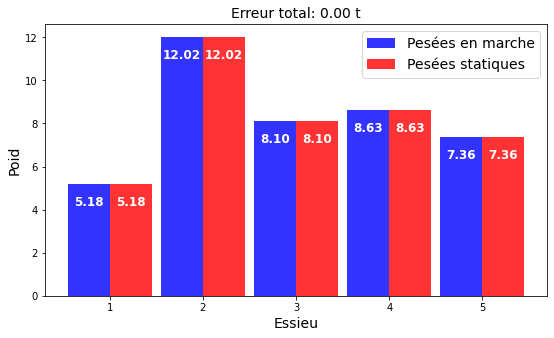

ERREUR :  1.4210854715202004e-14
Comparing weights


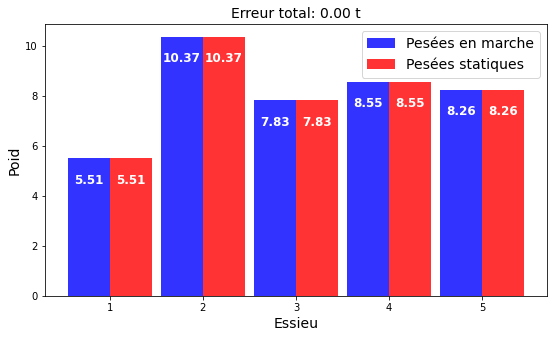

ERREUR :  -4.618527782440651e-13
Comparing weights


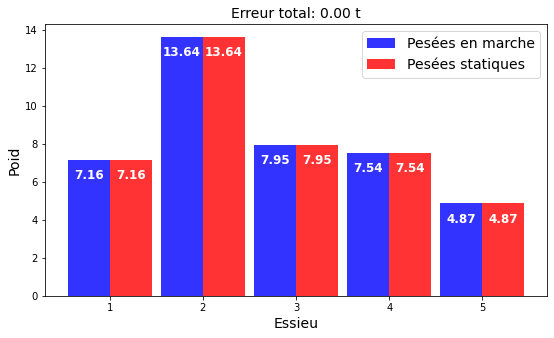

ERREUR :  4.244713814216539e-06
Comparing weights


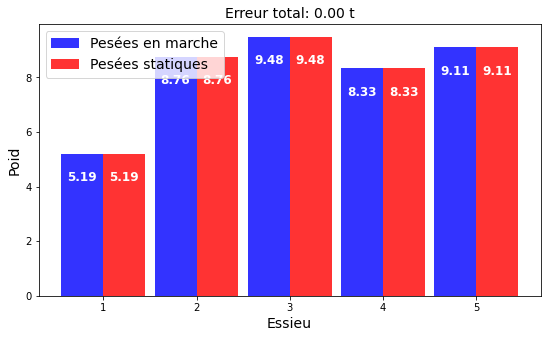

ERREUR :  0.01865776660027052
Comparing weights


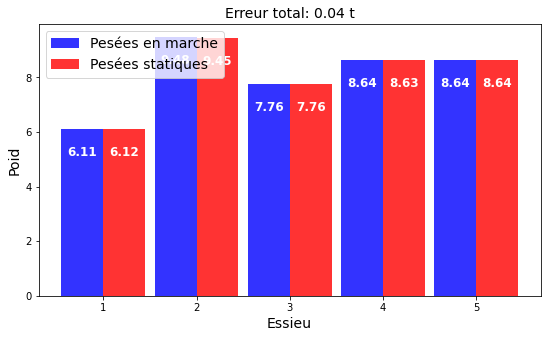

ERREUR :  0.01823517187686008
Comparing weights


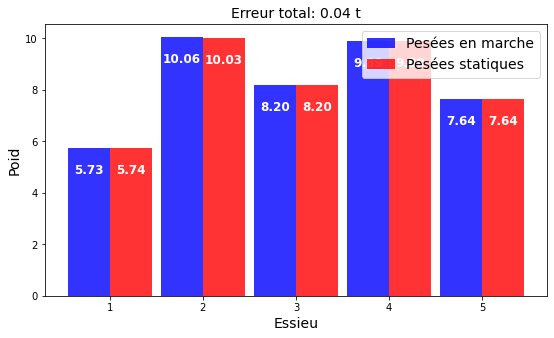

ERREUR :  1.7947375070548333e-06
Comparing weights


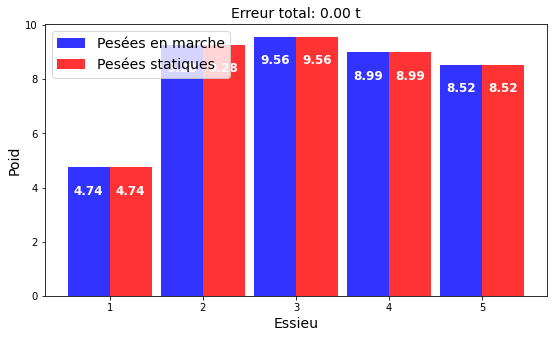

ERREUR :  -0.031481711302561166
Comparing weights


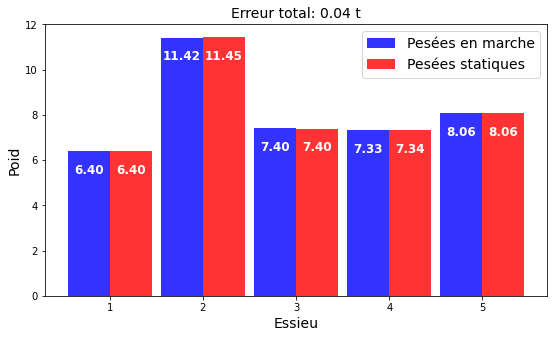

ERREUR :  -0.00016656135890258383
Comparing weights


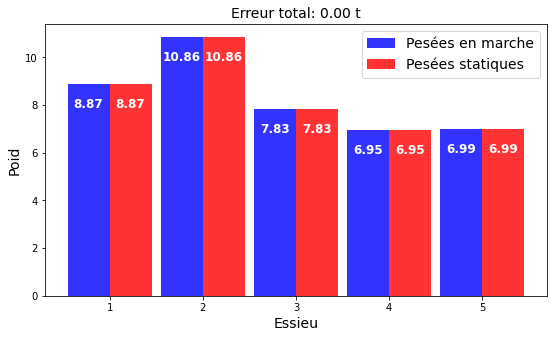

ERREUR :  0.020897908778351848
Comparing weights


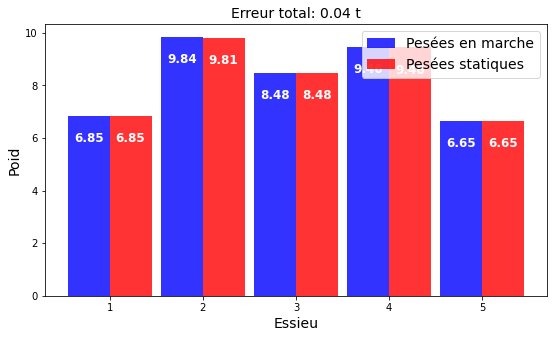

ERREUR :  0.015525696351353702
SPEED :  24.86598383688795
ERREUR :  4.973799150320701e-14
Comparing weights


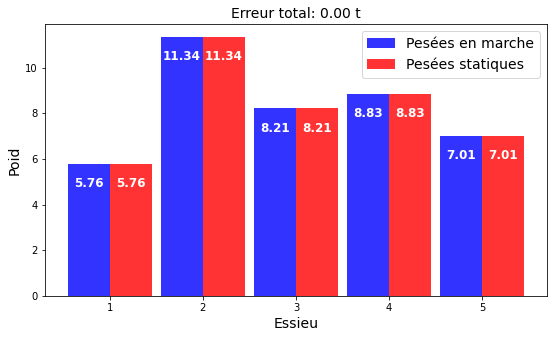

ERREUR :  -1.4210854715202004e-13
Comparing weights


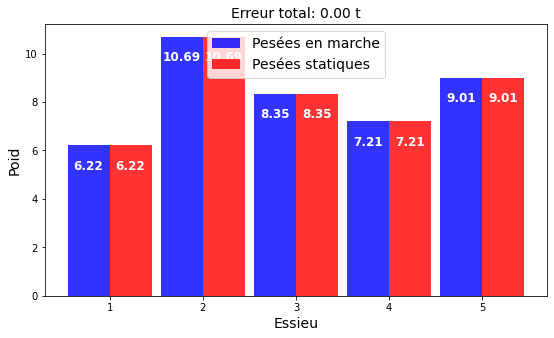

ERREUR :  0.01712362324310135
Comparing weights


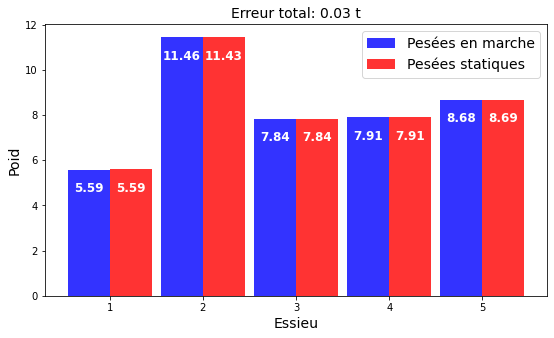

ERREUR :  5.027204394991713e-06
Comparing weights


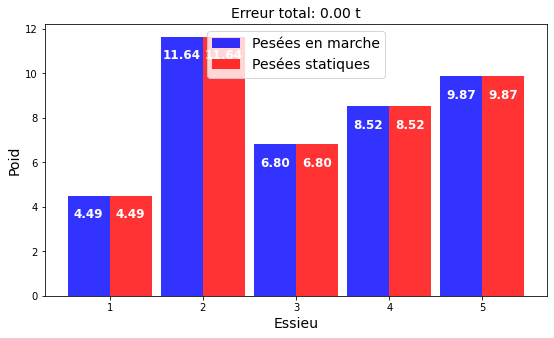

ERREUR :  -2.4158453015843406e-13
Comparing weights


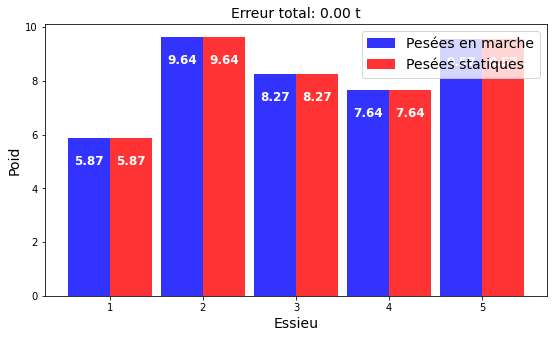

ERREUR :  2.842170943040401e-14
Comparing weights


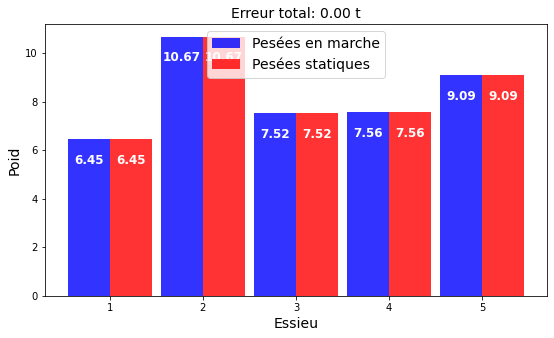

ERREUR :  -2.1316282072803006e-14
Comparing weights


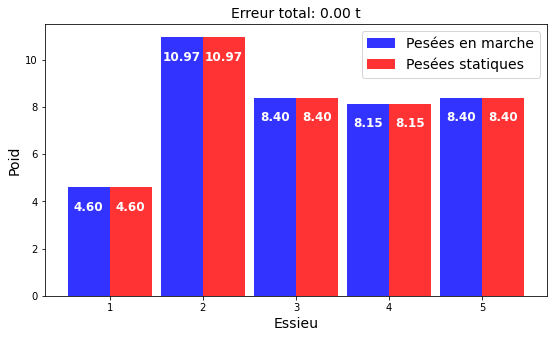

ERREUR :  -0.037458575199345034
Comparing weights


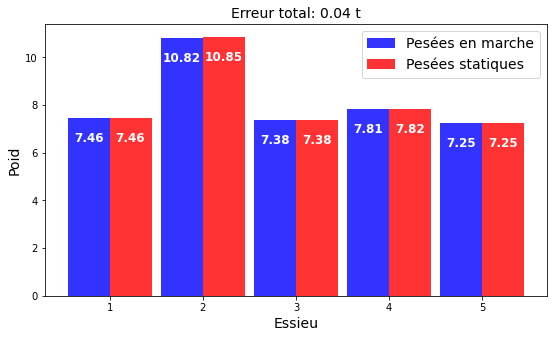

ERREUR :  -0.0336223031329439
Comparing weights


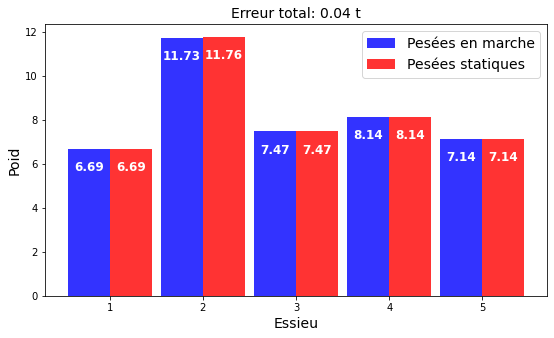

ERREUR :  0.01896869052663419
Comparing weights


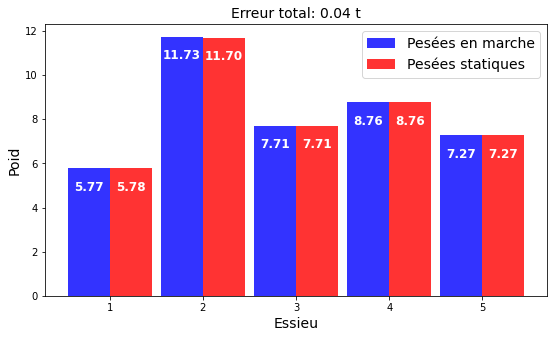

ERREUR :  0.017342456731185507
Comparing weights


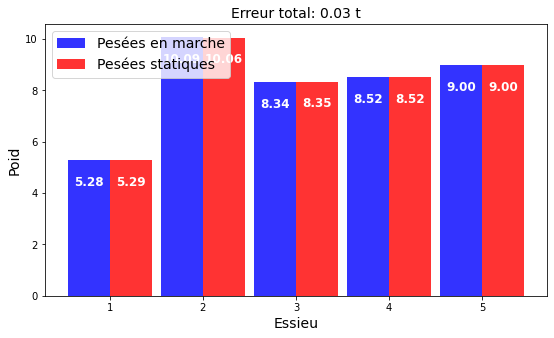

ERREUR :  0.022764880968658474
Comparing weights


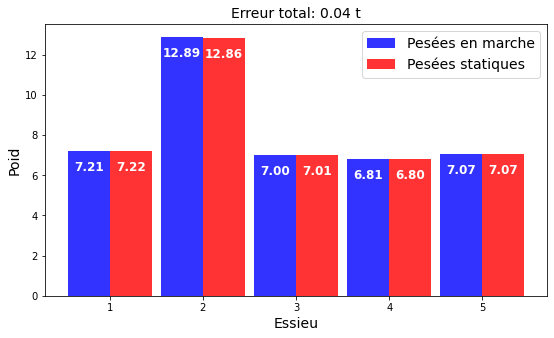

ERREUR :  -4.6215046161535156e-05
Comparing weights


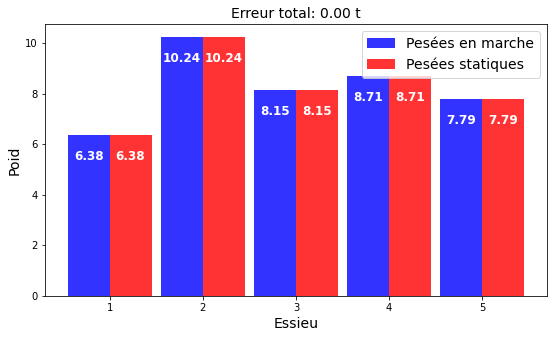

ERREUR :  -8.526512829121202e-14
Comparing weights


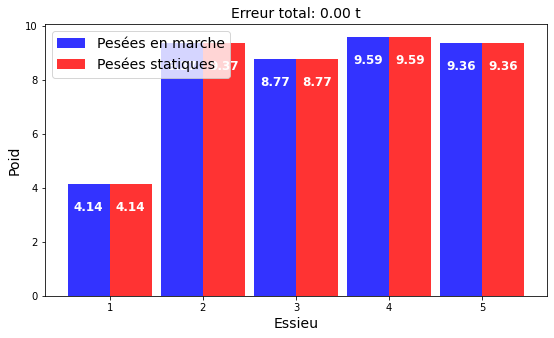

Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 357, 479, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 355, 479, 505, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 356, 477, 508, 536]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  504
Décalage trouvé
decalage found :  504
position décalage 4
peaks0 :  531
Décalage trouvé
decalage found :  531
PEAKS :  [273, 357, 477, 508, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 480, 509, 535]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  480
Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  509
Décalage trouvé
decalage found :  509
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 356, 477, 507

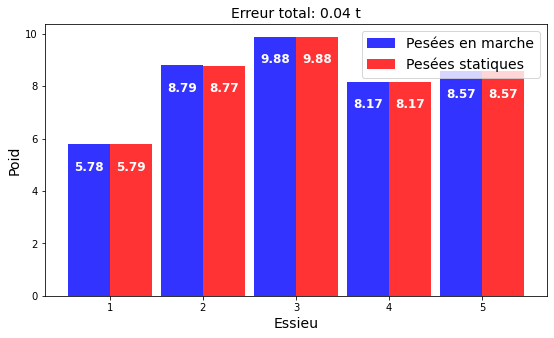

ERREUR :  0.014646934666131983
Comparing weights


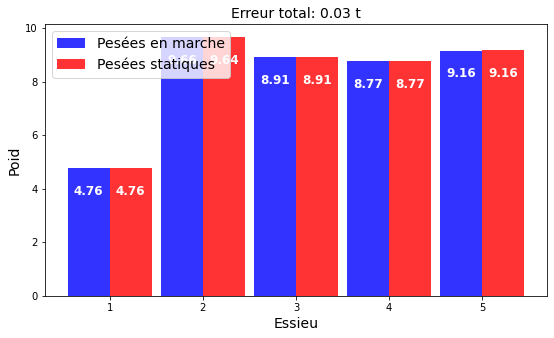

ERREUR :  -7.105427357601002e-15
Comparing weights


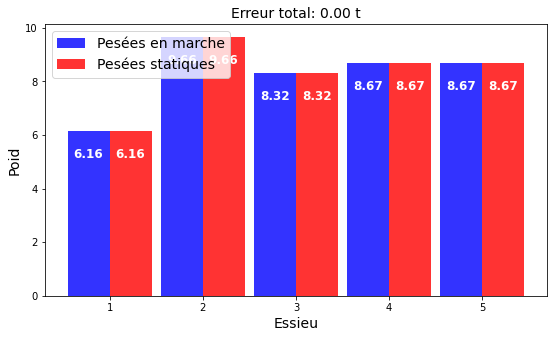

ERREUR :  0.012881754294205905
Comparing weights


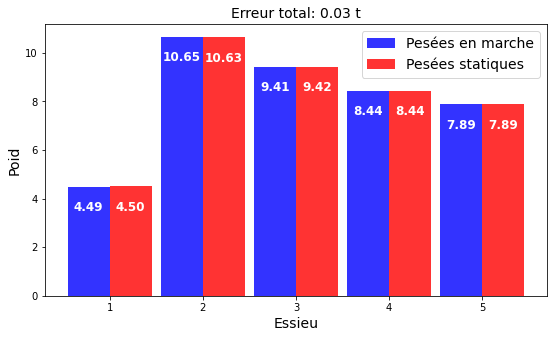

ERREUR :  0.025158343029367813
Comparing weights


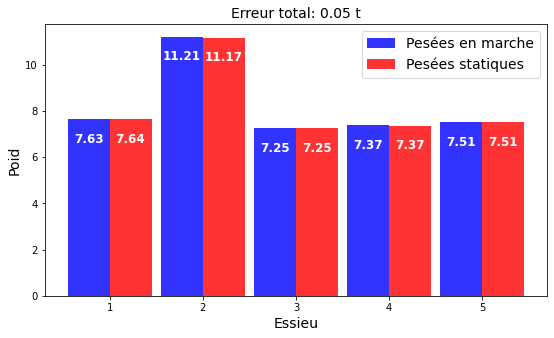

ERREUR :  0.01271359973784314
Comparing weights


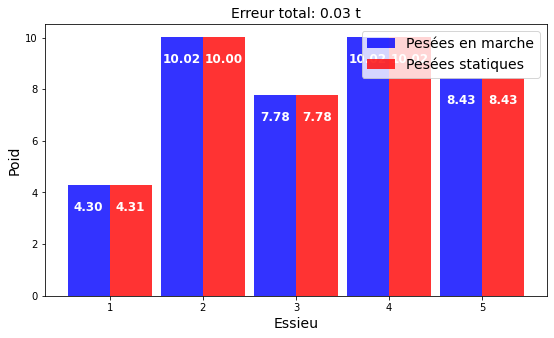

ERREUR :  0.016200007731882238
Comparing weights


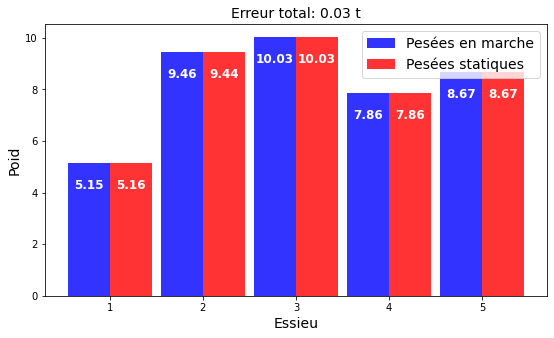

ERREUR :  0.020964906180282128
Comparing weights


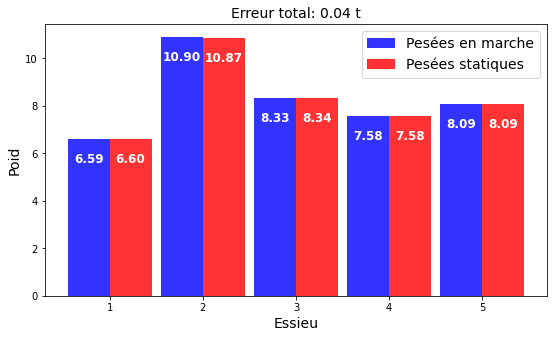

ERREUR :  0.018149714628492575
Comparing weights


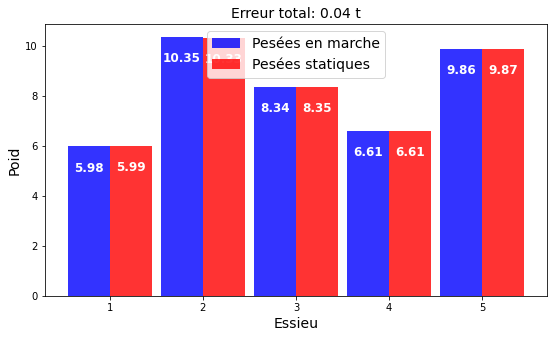

ERREUR :  0.01139469793665171
Comparing weights


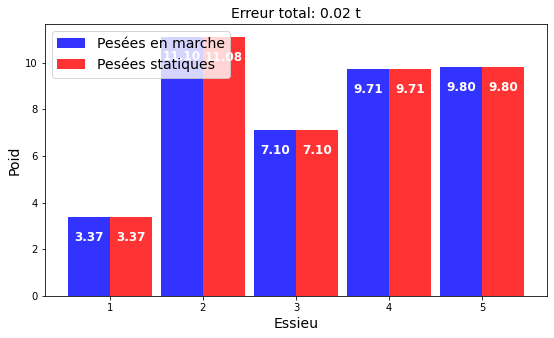

ERREUR :  0.020772757893283256
Comparing weights


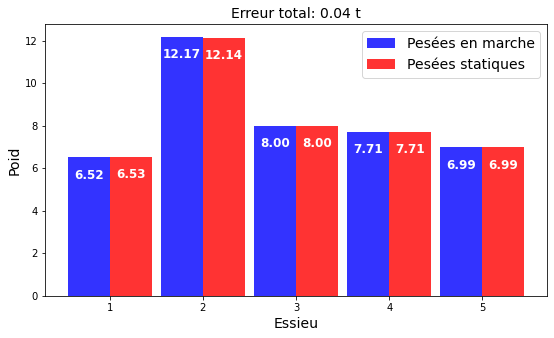

ERREUR :  0.019737611267885313
Comparing weights


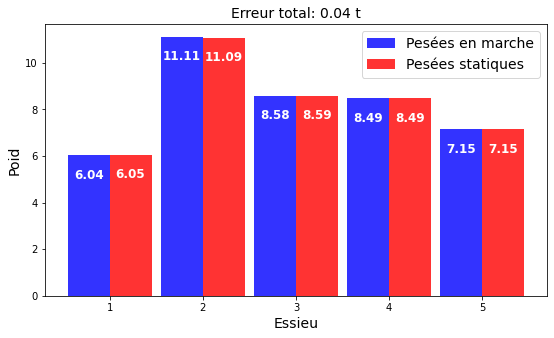

ERREUR :  1.4210854715202004e-14
Comparing weights


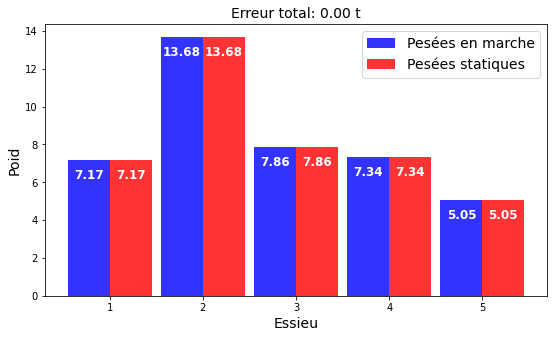

ERREUR :  0.01947279004931346
Comparing weights


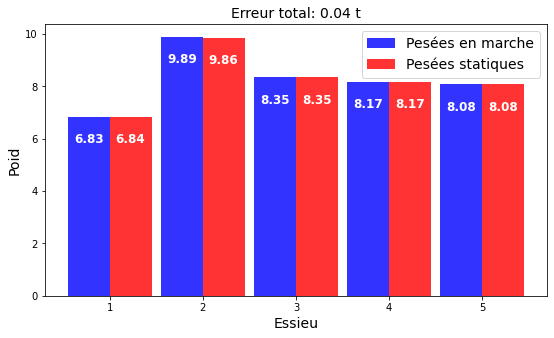

ERREUR :  0.013083909901318691
Comparing weights


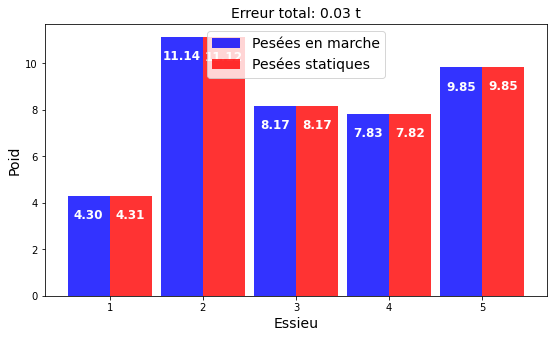

ERREUR :  -4.973799150320701e-14
Comparing weights


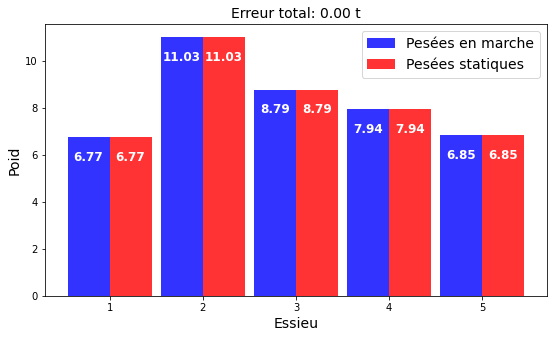

ERREUR :  -3.552713678800501e-14
Comparing weights


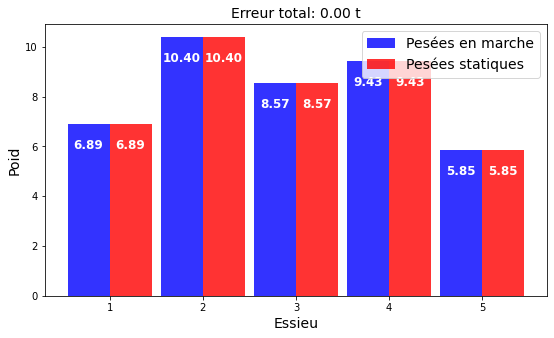

ERREUR :  6.394884621840902e-14
Comparing weights


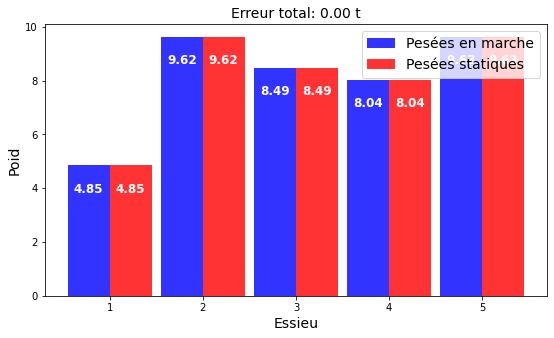

ERREUR :  7.105427357601002e-15
Comparing weights


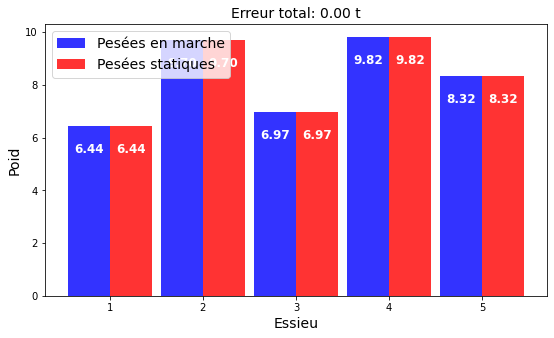

ERREUR :  0.01830056920857004
Comparing weights


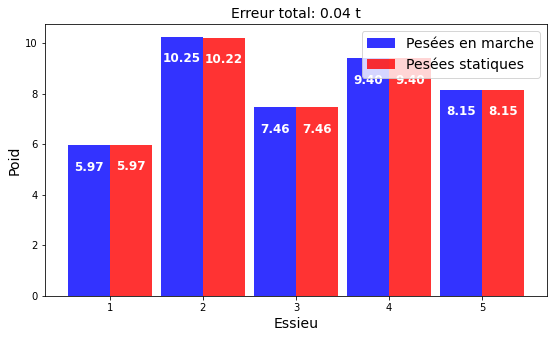

ERREUR :  0.014414950092714207
Comparing weights


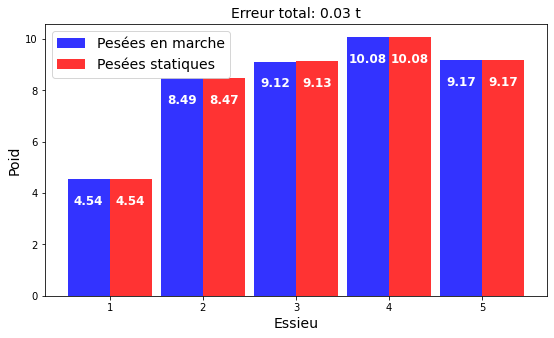

ERREUR :  0.017739028821949887
Comparing weights


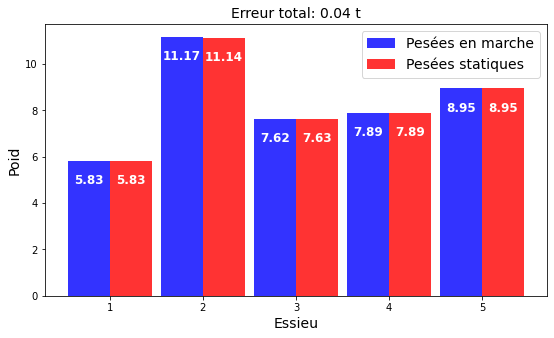

ERREUR :  -1.0658141036401503e-13
Comparing weights


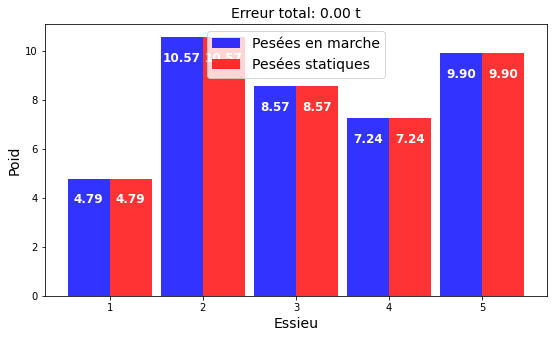

ERREUR :  2.1316282072803006e-14
Comparing weights


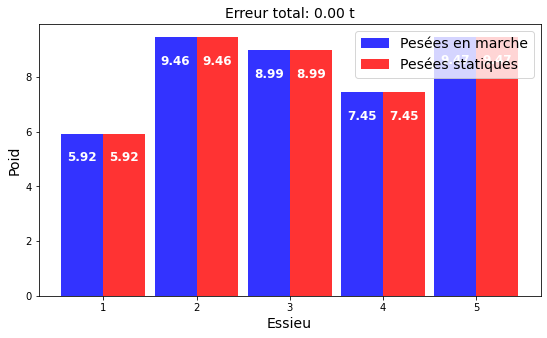

ERREUR :  0.01883991873491908
Comparing weights


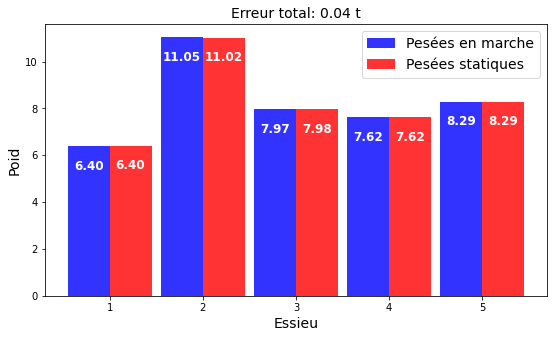

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [271, 357, 477, 507, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 355, 477, 507, 535]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 354, 477, 507, 533]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 356, 478, 507, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 478, 508, 535]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [276, 354, 478, 507

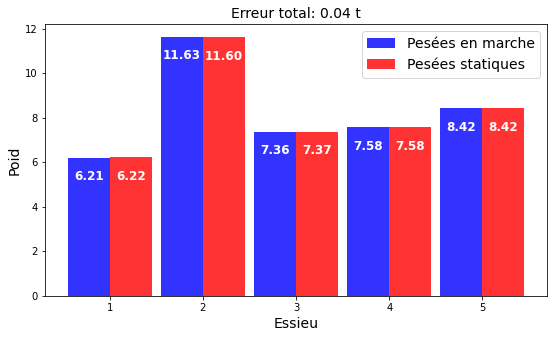

ERREUR :  -3.552713678800501e-14
Comparing weights


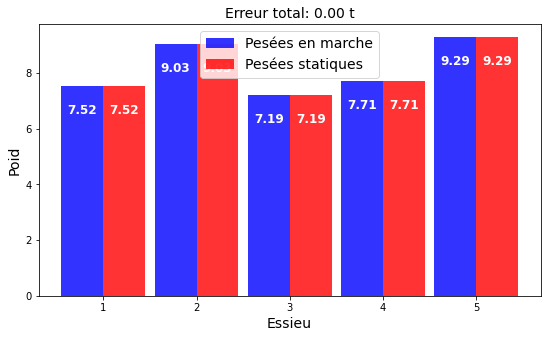

ERREUR :  0.02222163764282925
Comparing weights


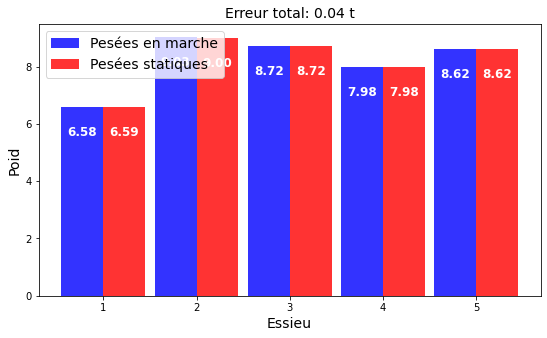

ERREUR :  0.01912525346137528
Comparing weights


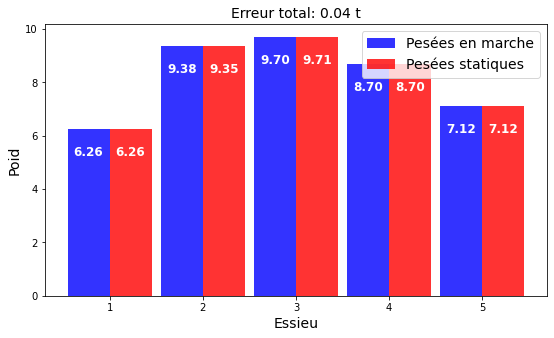

ERREUR :  -0.04265910735236389
Comparing weights


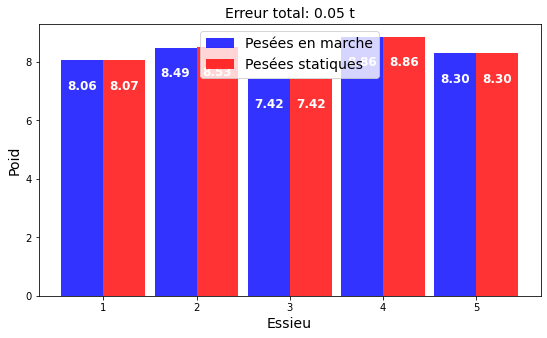

ERREUR :  1.2796519399671524e-09
Comparing weights


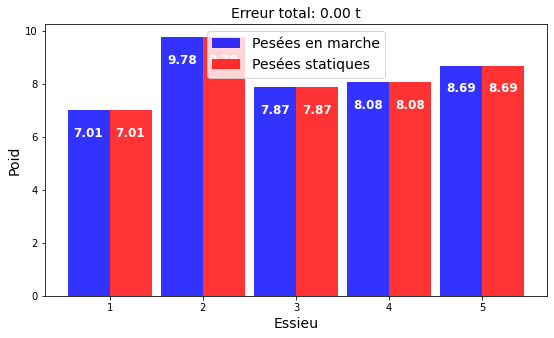

ERREUR :  -1.9184653865522705e-13
Comparing weights


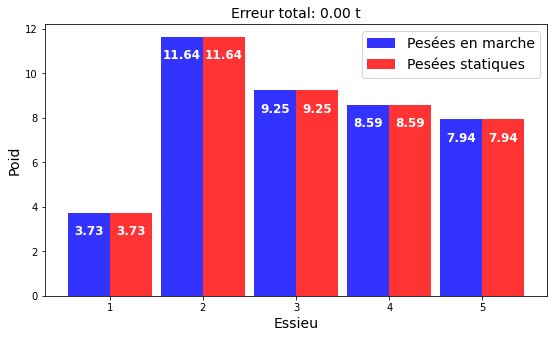

ERREUR :  0.014253967979811932
Comparing weights


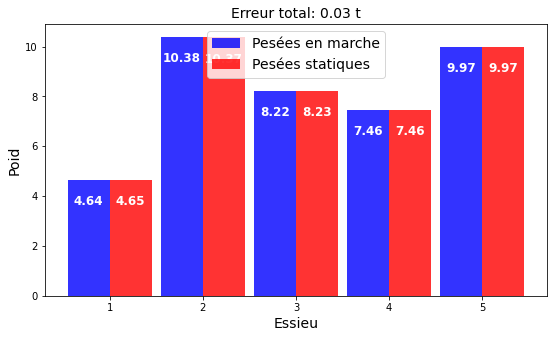

ERREUR :  0.01902823707241197
Comparing weights


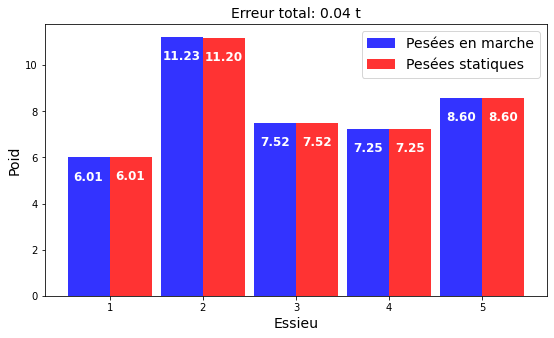

ERREUR :  0.01581837041285894
Comparing weights


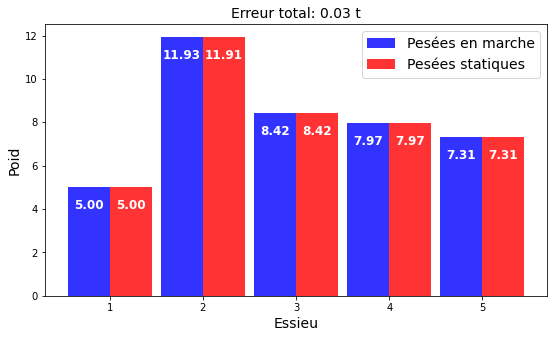

ERREUR :  -4.263256414560601e-14
Comparing weights


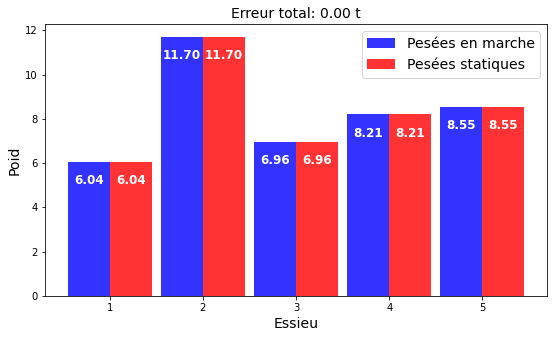

ERREUR :  1.0658141036401503e-13
Comparing weights


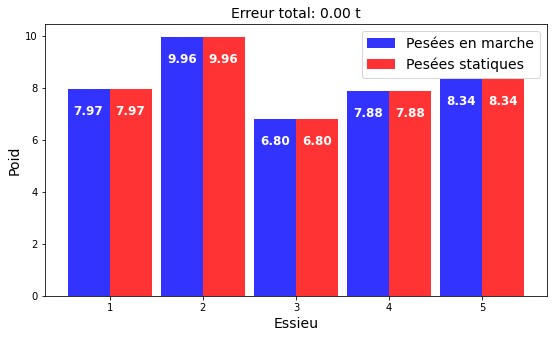

ERREUR :  1.4210854715202004e-14
Comparing weights


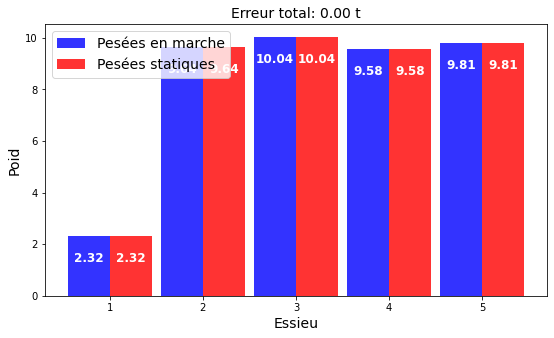

ERREUR :  0.02001735033594798
Comparing weights


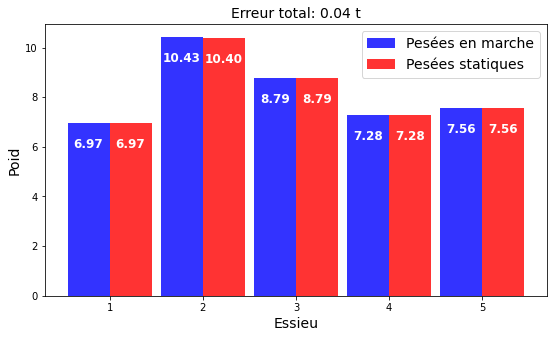

ERREUR :  -4.263256414560601e-14
Comparing weights


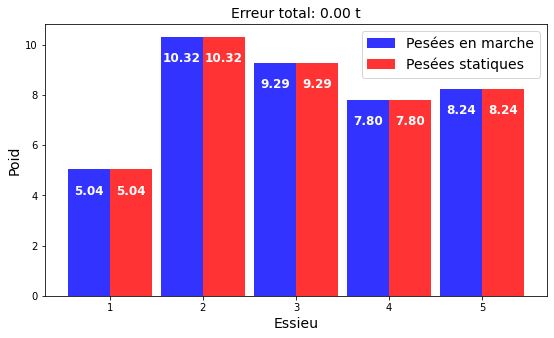

ERREUR :  -9.237055564881302e-14
Comparing weights


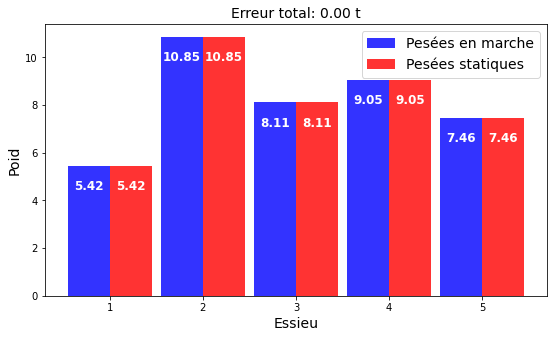

ERREUR :  -1.4210854715202004e-14
Comparing weights


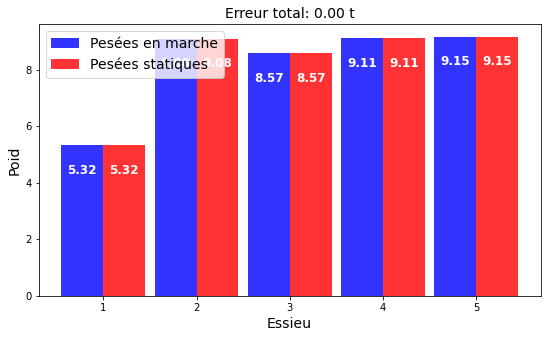

ERREUR :  2.1316282072803006e-14
Comparing weights


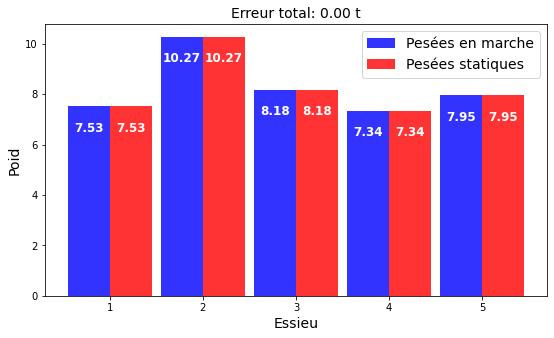

ERREUR :  -1.4210854715202004e-13
Comparing weights


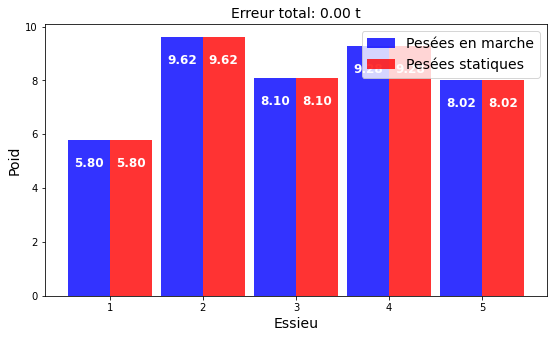

ERREUR :  -9.947598300641403e-14
Comparing weights


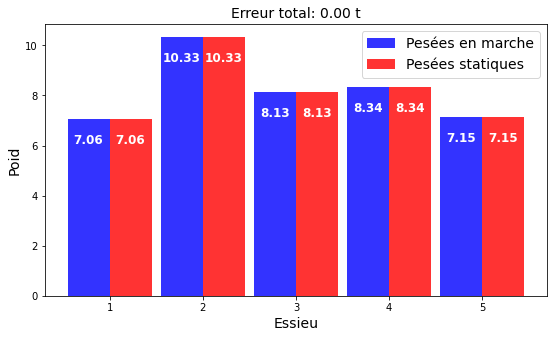

ERREUR :  7.105427357601002e-15
Comparing weights


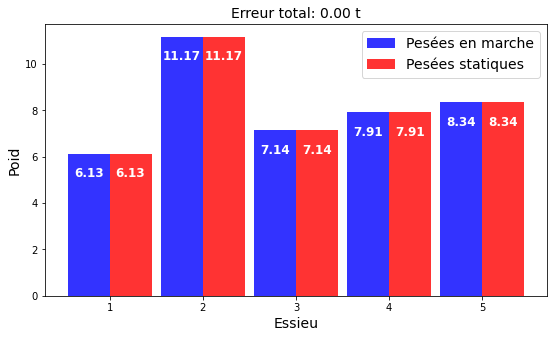

ERREUR :  0.015524684483658291
Comparing weights


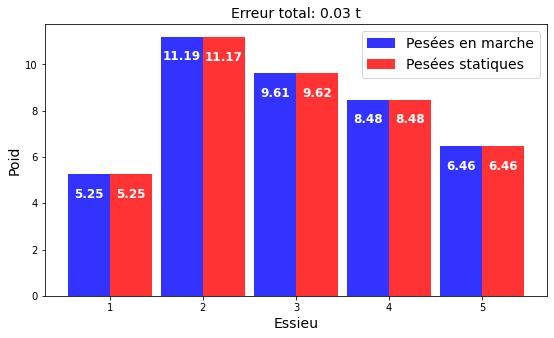

ERREUR :  -3.552713678800501e-14
Comparing weights


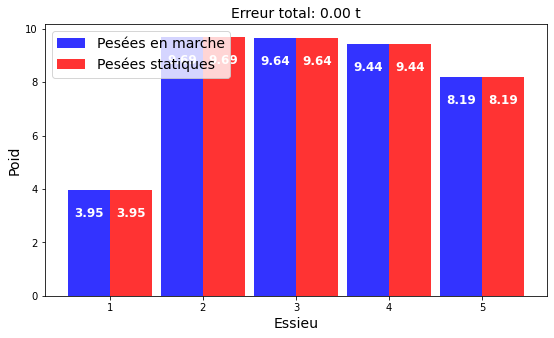

ERREUR :  -1.9533530348780914e-10
Comparing weights


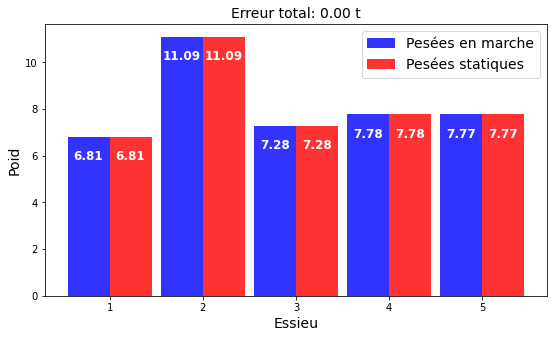

ERREUR :  4.6799897290839e-10
Comparing weights


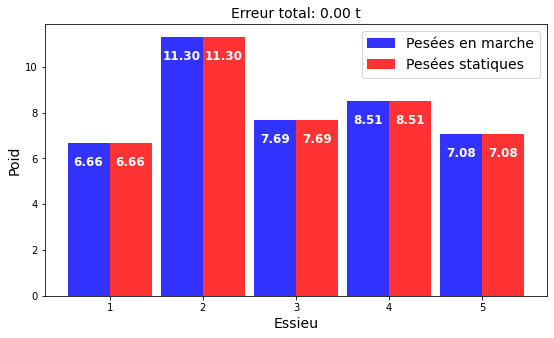

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 356, 479, 504, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  504
Décalage trouvé
decalage found :  504
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 357, 478, 507, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 353, 477, 507, 535]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [272, 356, 478, 508, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 355, 478, 505, 534]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 477, 507

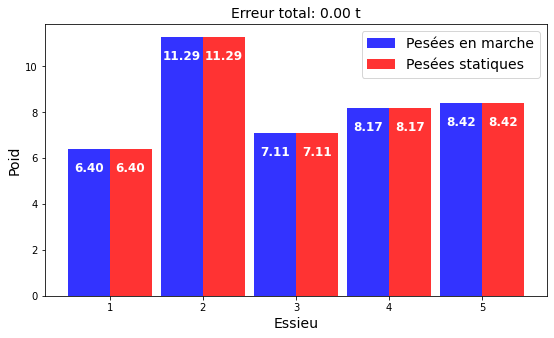

ERREUR :  0.016608390249615468
Comparing weights


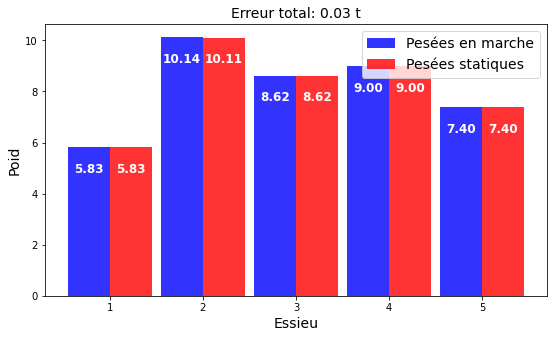

ERREUR :  0.016736190101134696
Comparing weights


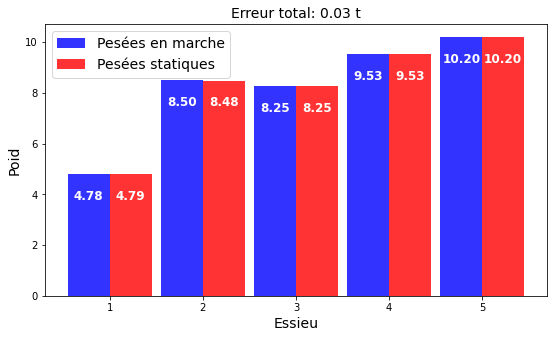

ERREUR :  -2.1316282072803006e-14
Comparing weights


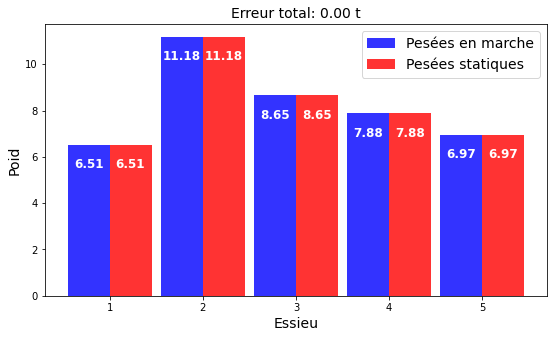

ERREUR :  2.842170943040401e-14
Comparing weights


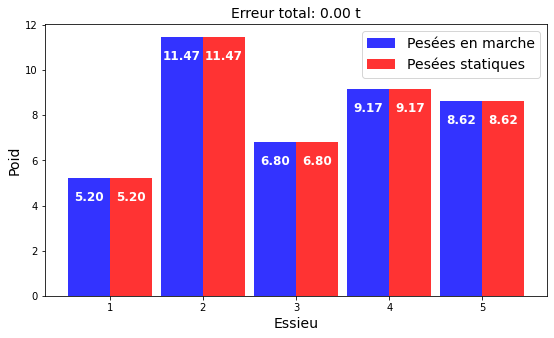

ERREUR :  2.1316282072803006e-14
Comparing weights


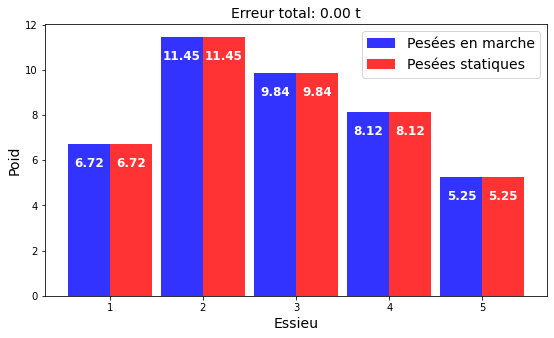

ERREUR :  0.018642733979987725
Comparing weights


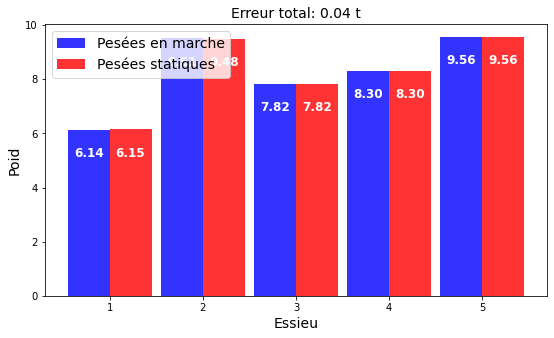

ERREUR :  2.1316282072803006e-14
Comparing weights


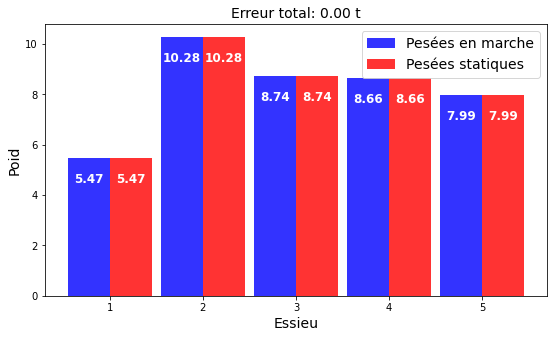

ERREUR :  0.012538412438331648
Comparing weights


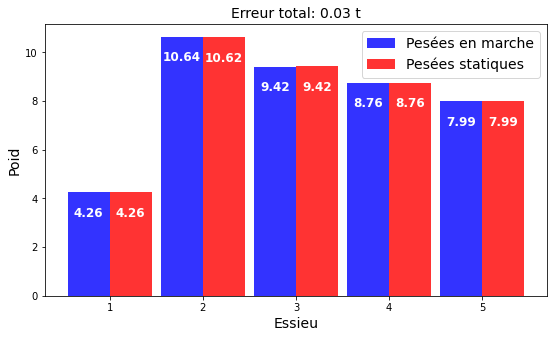

ERREUR :  5.684341886080802e-14
Comparing weights


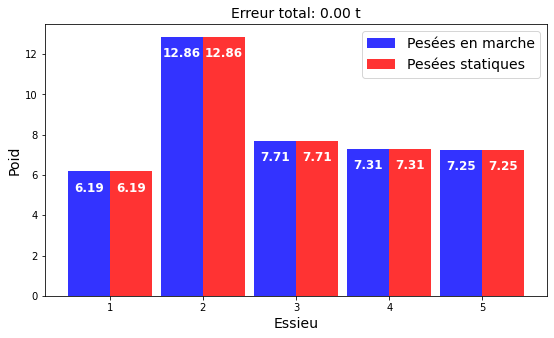

ERREUR :  -1.4210854715202004e-14
Comparing weights


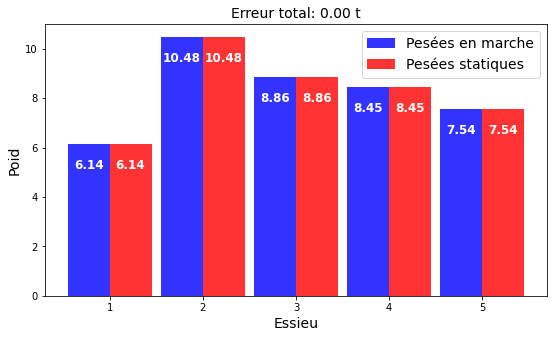

ERREUR :  0.0
Comparing weights


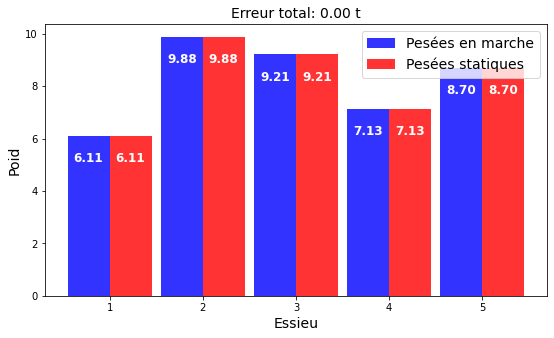

ERREUR :  -7.105427357601002e-15
Comparing weights


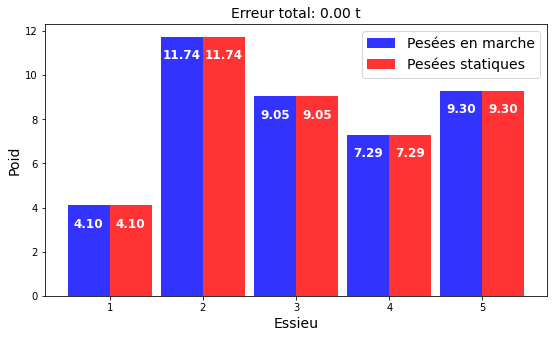

ERREUR :  4.263256414560601e-14
Comparing weights


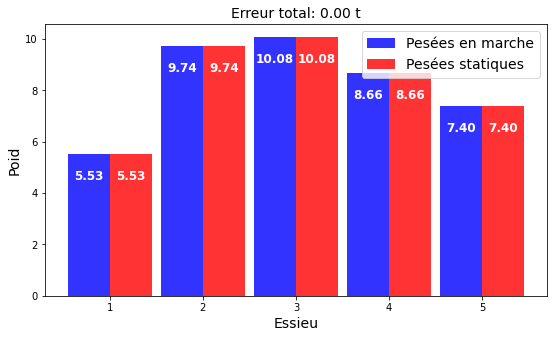

ERREUR :  -3.979039320256561e-13
Comparing weights


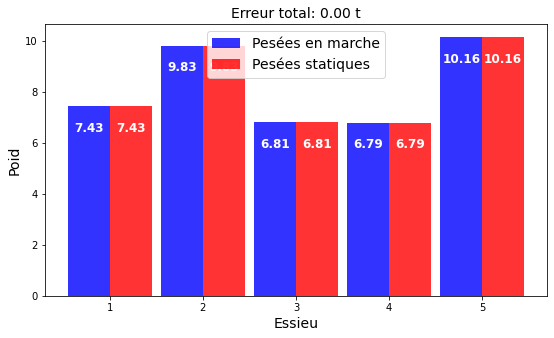

ERREUR :  0.022889591012074106
Comparing weights


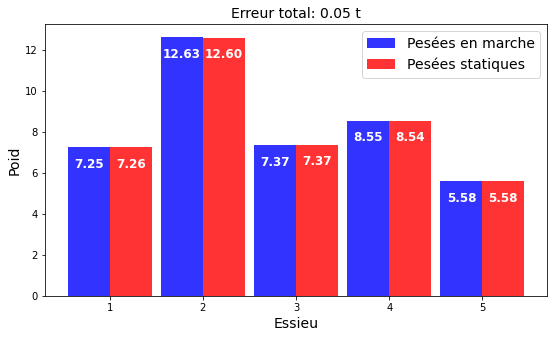

ERREUR :  7.105427357601002e-15
Comparing weights


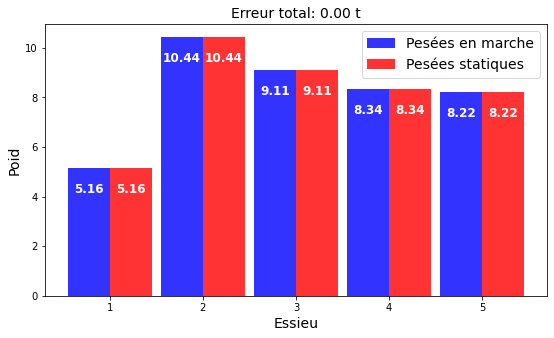

ERREUR :  0.019932838436055533
Comparing weights


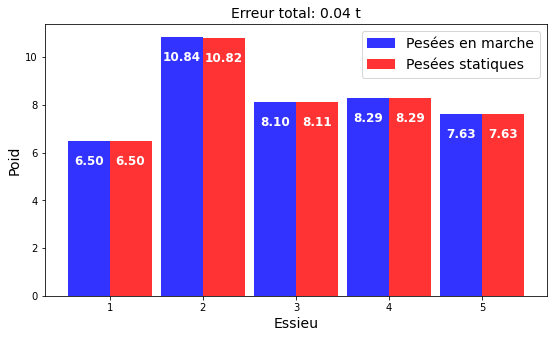

ERREUR :  0.013872905453283124
SPEED :  17.404310733358926
ERREUR :  0.0
Comparing weights


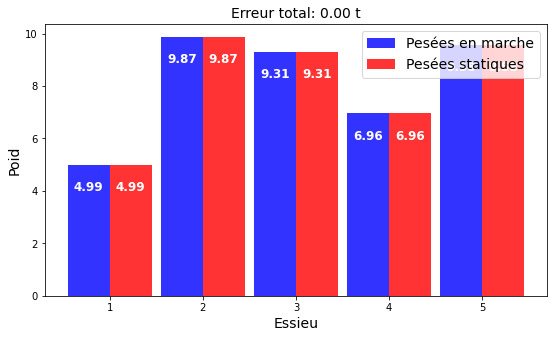

ERREUR :  0.020222017091555244
Comparing weights


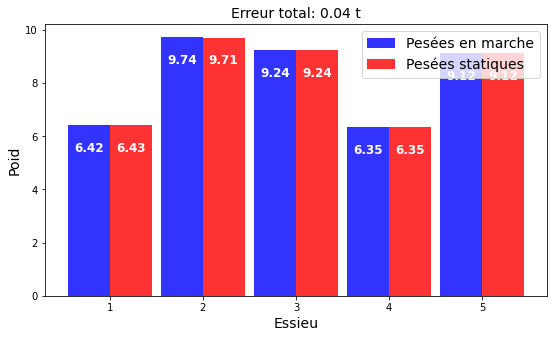

ERREUR :  1.4210854715202004e-14
Comparing weights


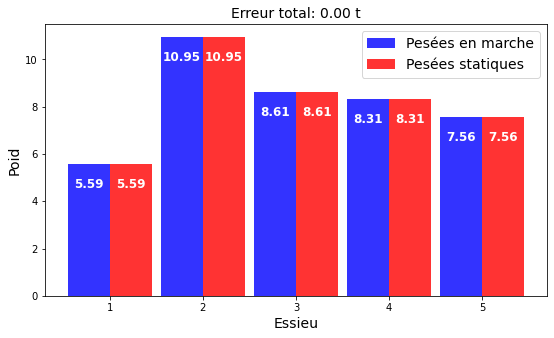

ERREUR :  7.105427357601002e-15
Comparing weights


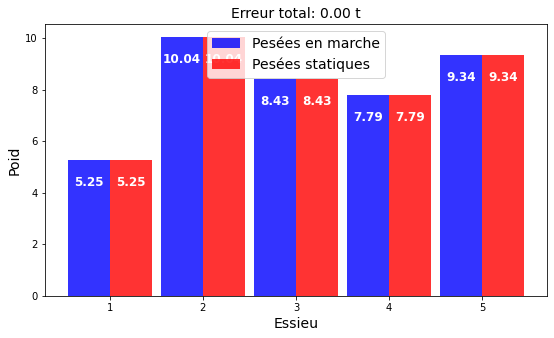

ERREUR :  3.552713678800501e-14
SPEED :  17.41820605895179
ERREUR :  1.3223200312495464e-11
Comparing weights


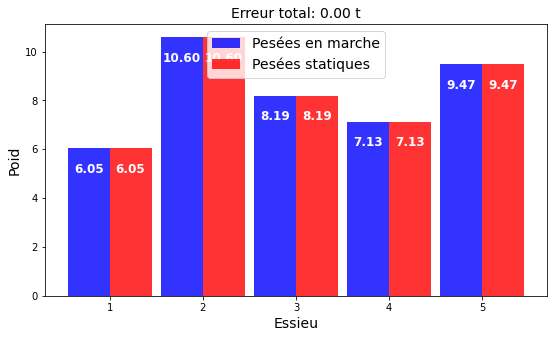

Itération n° : 5/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 356, 478, 508, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 357, 480, 507, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  480
Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 356, 477, 507, 535]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 357, 477, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 357, 477, 505, 534]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 353, 478, 509

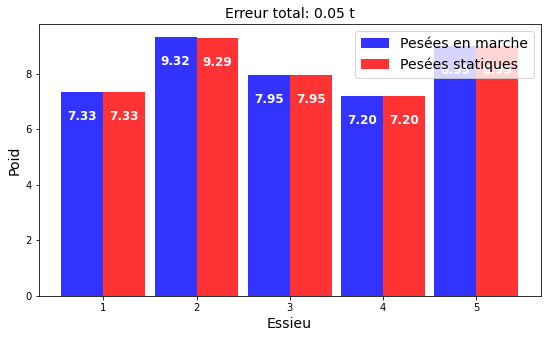

ERREUR :  0.016106954939736795
Comparing weights


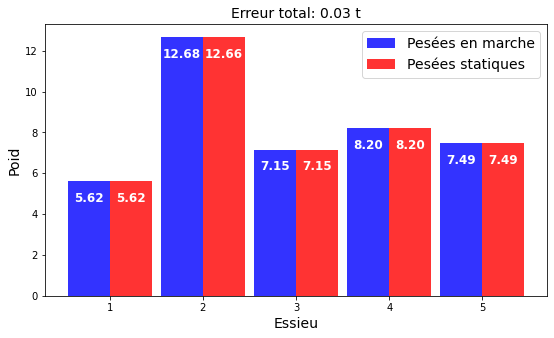

ERREUR :  -2.1316282072803006e-13
Comparing weights


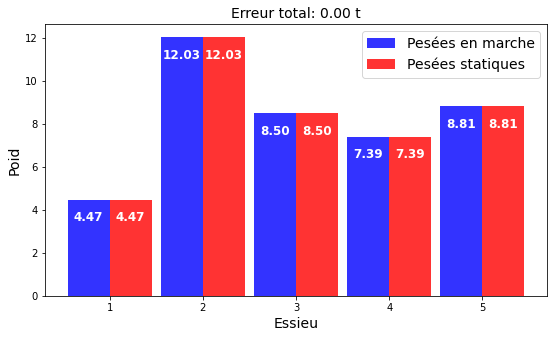

ERREUR :  -2.842170943040401e-14
Comparing weights


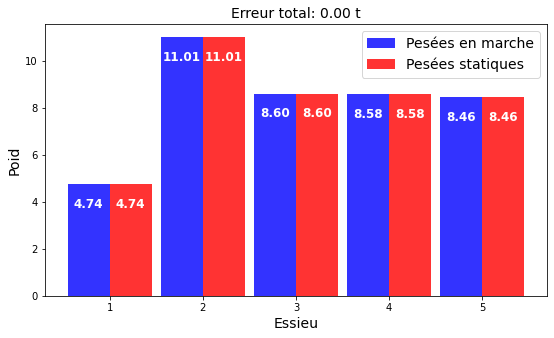

ERREUR :  -2.5579538487363607e-13
Comparing weights


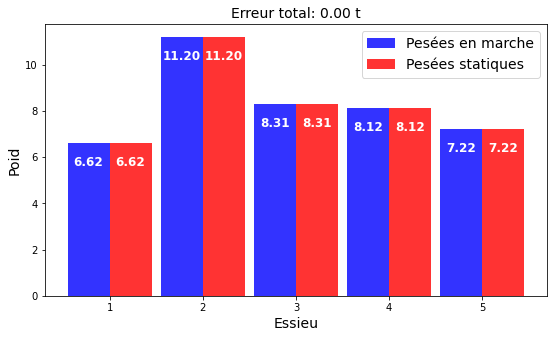

ERREUR :  -7.105427357601002e-15
Comparing weights


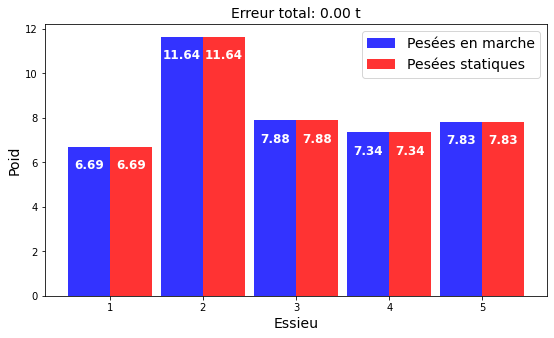

ERREUR :  7.105427357601002e-15
Comparing weights


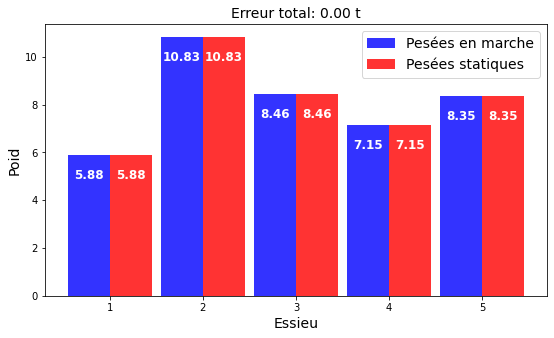

ERREUR :  -3.552713678800501e-14
Comparing weights


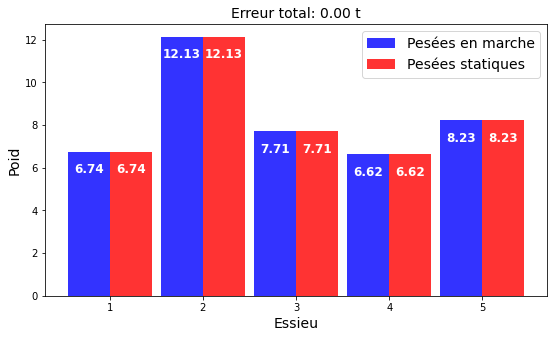

ERREUR :  -2.1316282072803006e-14
Comparing weights


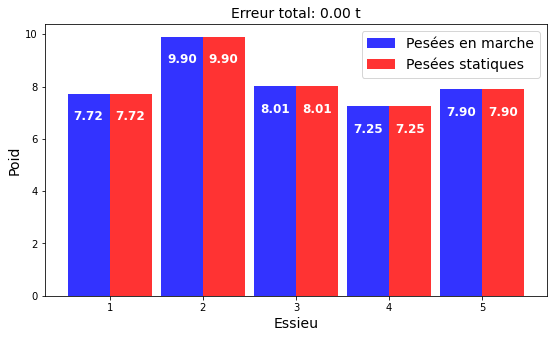

ERREUR :  0.01920977668996926
Comparing weights


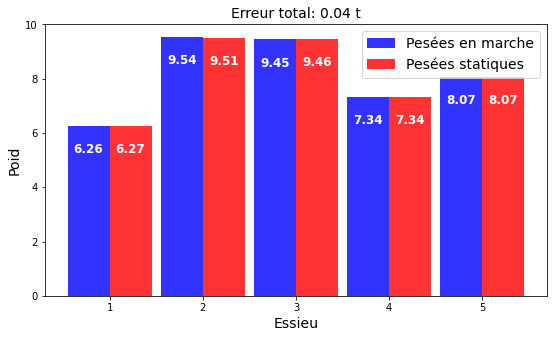

ERREUR :  7.105427357601002e-15
Comparing weights


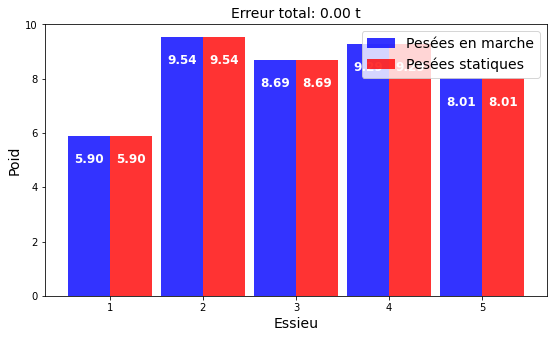

ERREUR :  -3.552713678800501e-14
Comparing weights


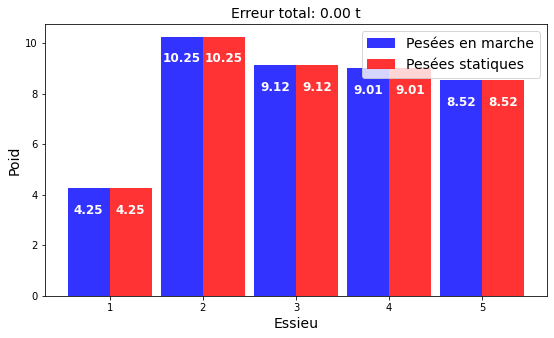

ERREUR :  0.018439958088400488
Comparing weights


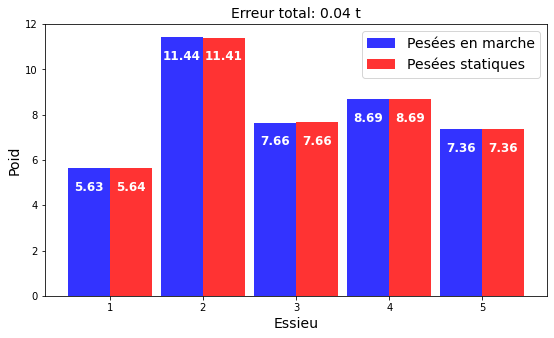

ERREUR :  -3.552713678800501e-14
Comparing weights


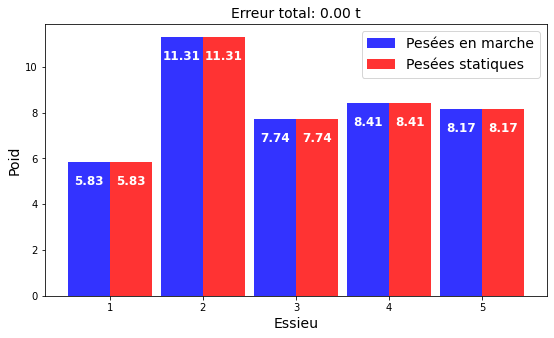

ERREUR :  0.0
Comparing weights


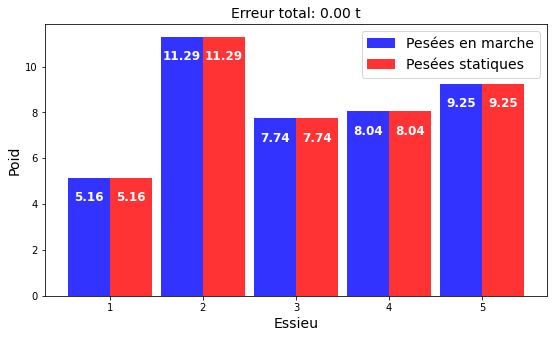

ERREUR :  7.105427357601002e-15
Comparing weights


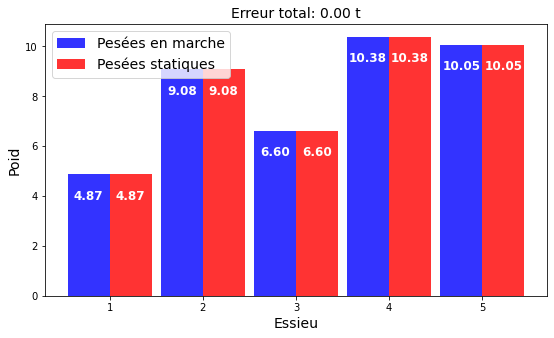

ERREUR :  0.01474052746004162
Comparing weights


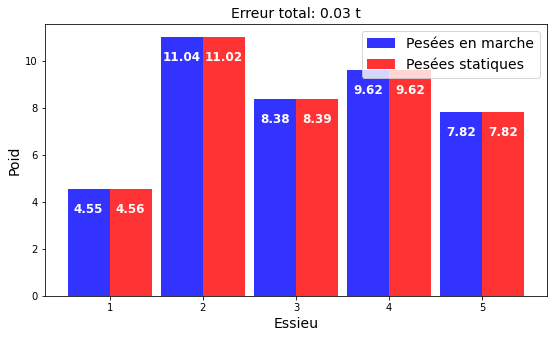

ERREUR :  4.263256414560601e-14
Comparing weights


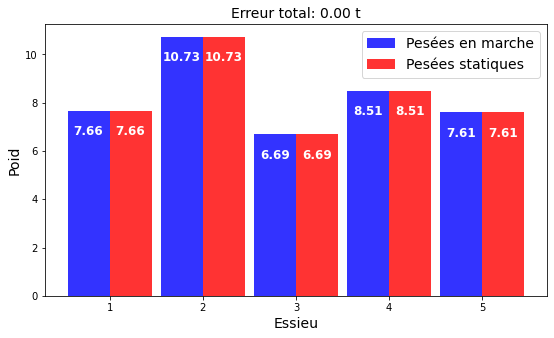

ERREUR :  -7.148059921746608e-12
Comparing weights


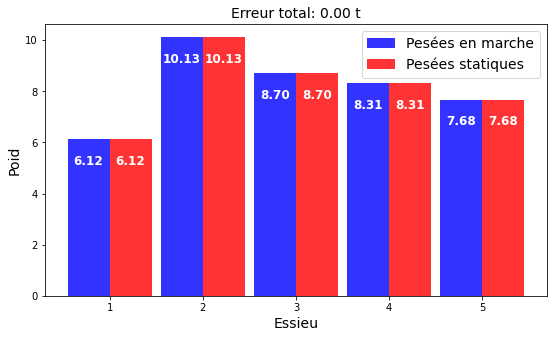

ERREUR :  0.018579104301863936
Comparing weights


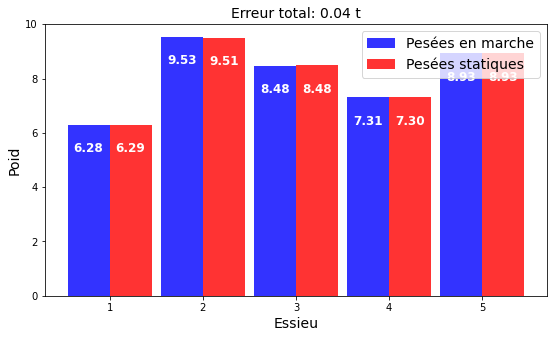

ERREUR :  -7.105427357601002e-15
Comparing weights


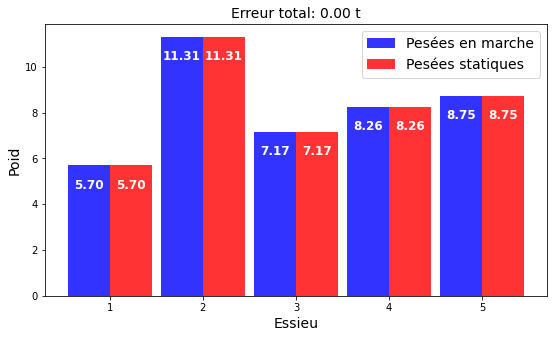

ERREUR :  0.02137315259160033
Comparing weights


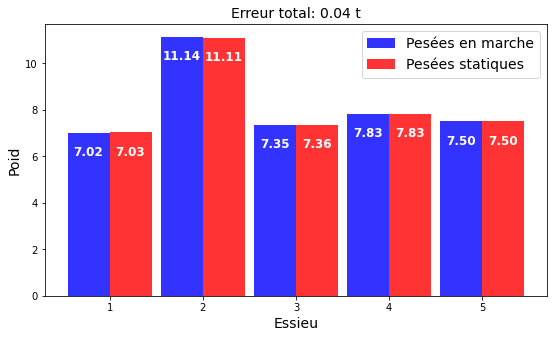

ERREUR :  -2.1316282072803006e-14
Comparing weights


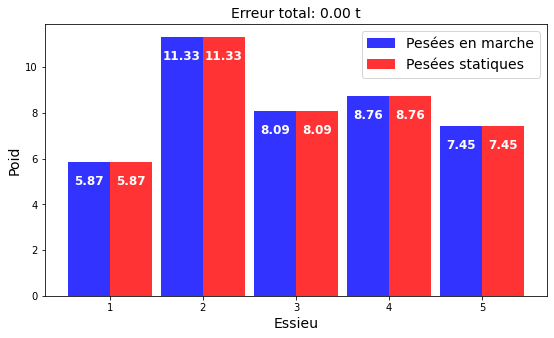

ERREUR :  0.0
Comparing weights


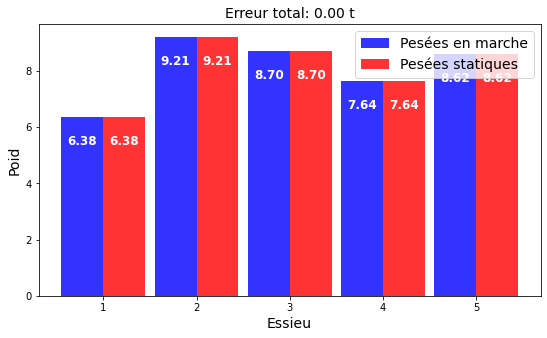

ERREUR :  -1.4210854715202004e-14
Comparing weights


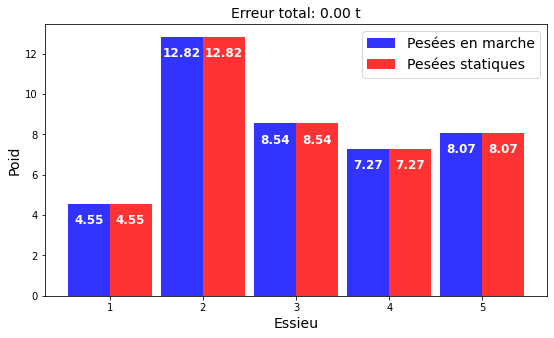

SIGMA FOR NOISE :  0.005555555555555556
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [271, 355, 477, 507, 533]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 356, 478, 506, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [274, 357, 478, 509, 534]
posit

Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 477, 507, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 356, 477, 508, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :

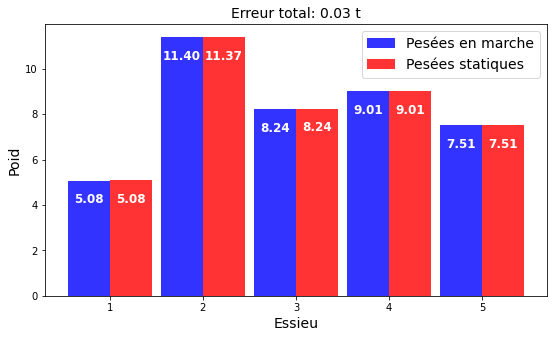

ERREUR :  0.01938027084352001
Comparing weights


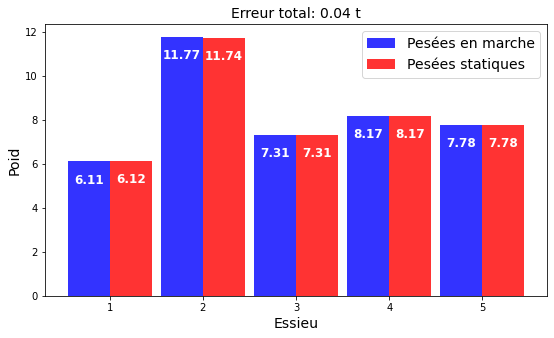

ERREUR :  1.4210854715202004e-14
Comparing weights


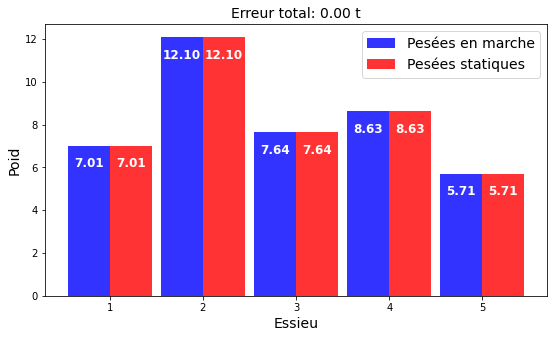

ERREUR :  -1.4210854715202004e-14
Comparing weights


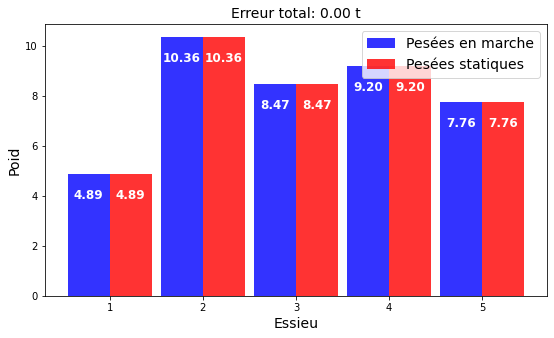

ERREUR :  -3.055333763768431e-13
Comparing weights


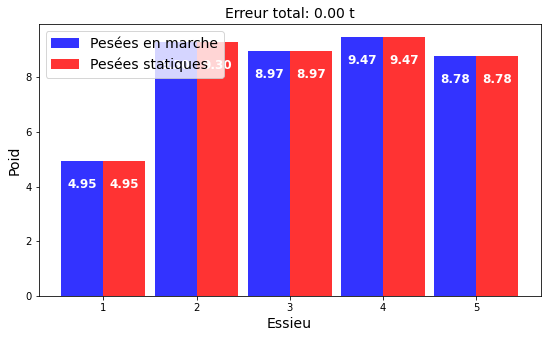

ERREUR :  0.01633205024071316
Comparing weights


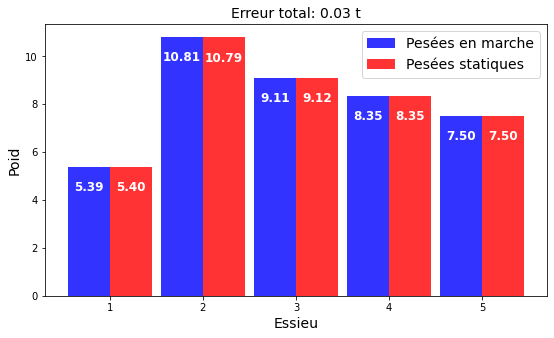

ERREUR :  0.020584262597537872
Comparing weights


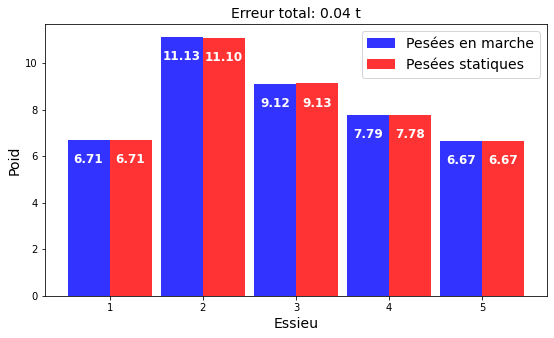

ERREUR :  0.01637501375927286
Comparing weights


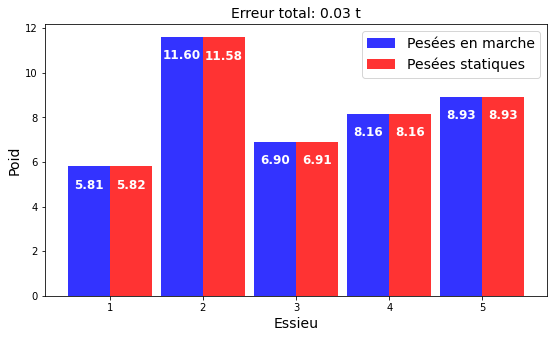

ERREUR :  -2.842170943040401e-14
Comparing weights


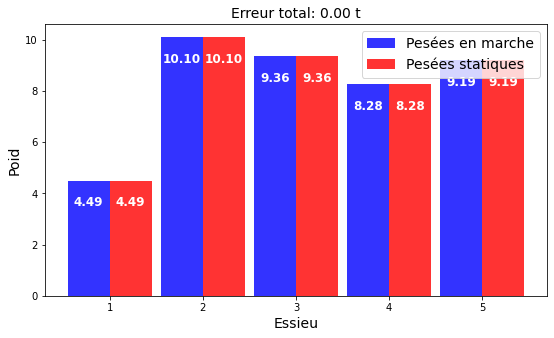

ERREUR :  -7.105427357601002e-15
Comparing weights


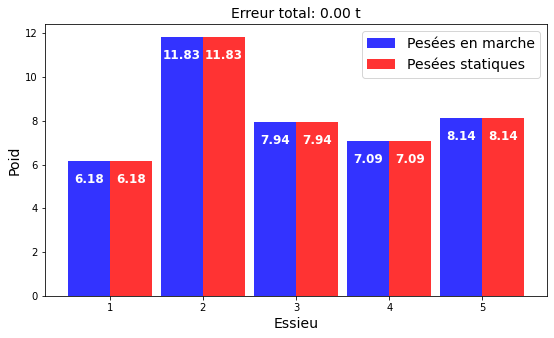

ERREUR :  1.4210854715202004e-14
Comparing weights


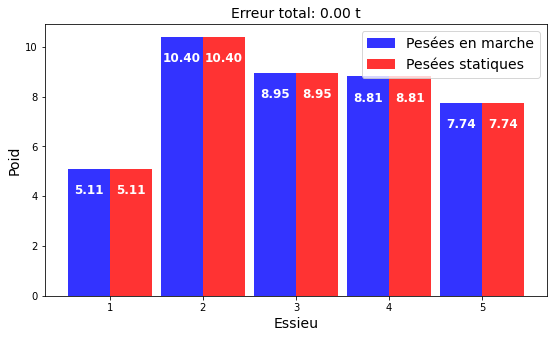

ERREUR :  1.4210854715202004e-14
Comparing weights


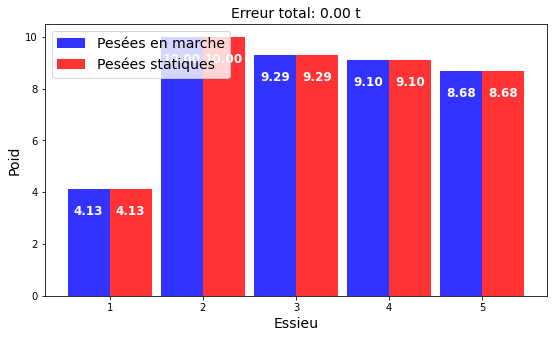

ERREUR :  2.842170943040401e-14
Comparing weights


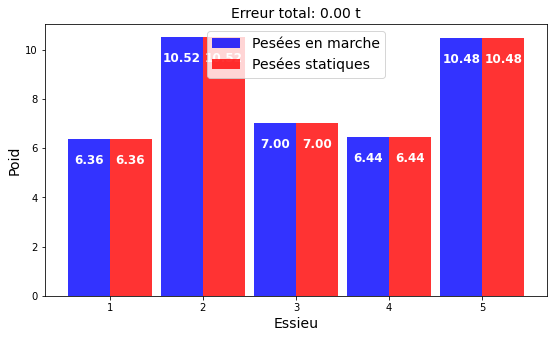

ERREUR :  0.0
Comparing weights


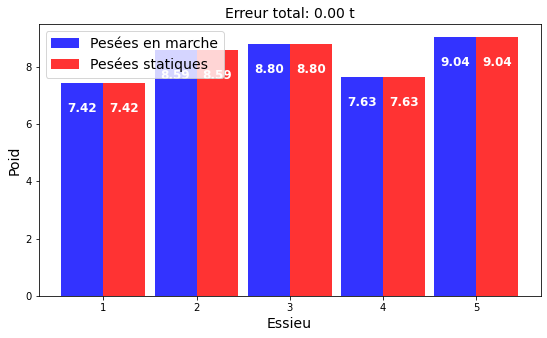

ERREUR :  0.01337251590943822
Comparing weights


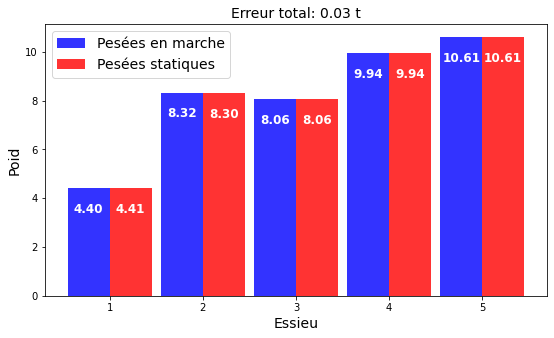

ERREUR :  0.015198472800051377
Comparing weights


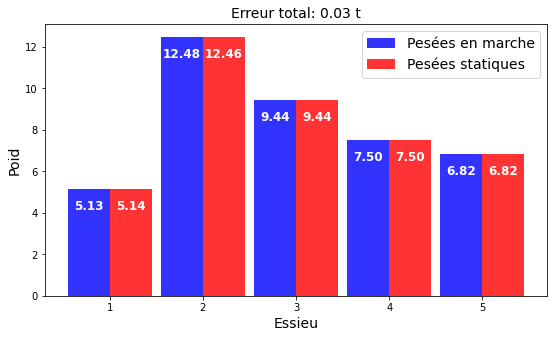

ERREUR :  0.016008170854497905
Comparing weights


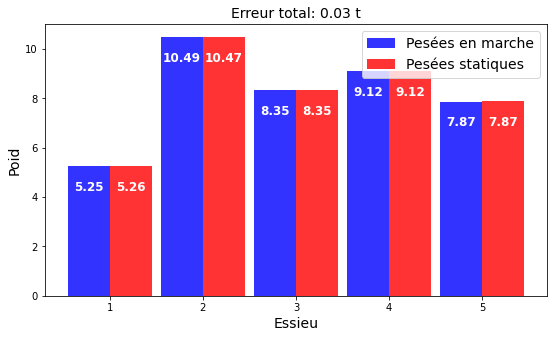

ERREUR :  3.765876499528531e-13
Comparing weights


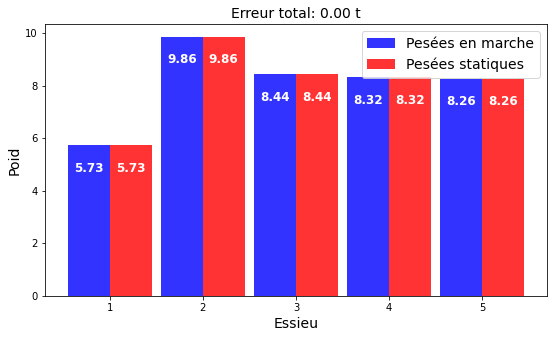

ERREUR :  0.021032285710020915
SPEED :  24.373289713079124
ERREUR :  0.023307765624750232
Comparing weights


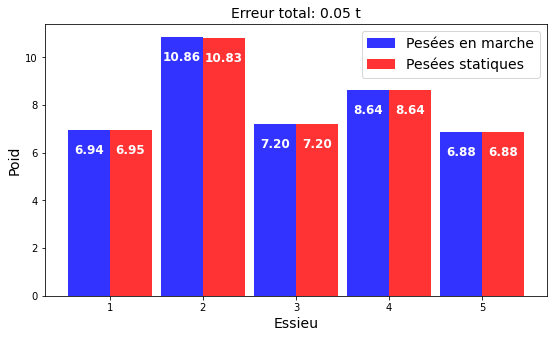

ERREUR :  -7.105427357601002e-15
Comparing weights


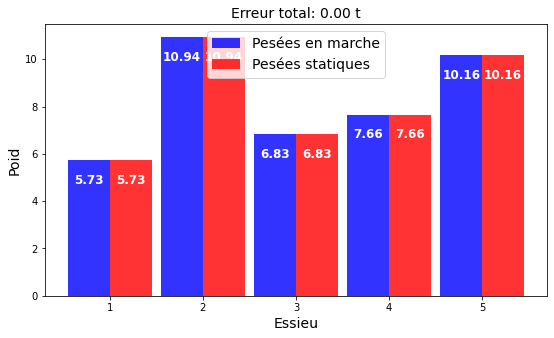

ERREUR :  2.1316282072803006e-14
Comparing weights


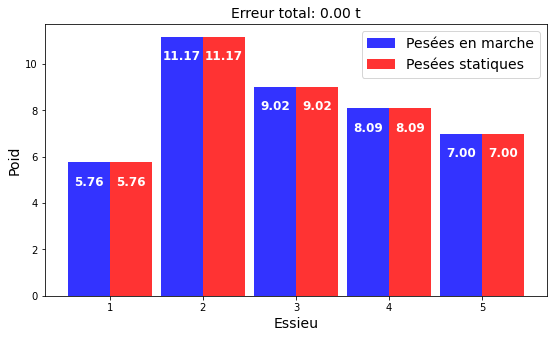

ERREUR :  0.01841031509523816
Comparing weights


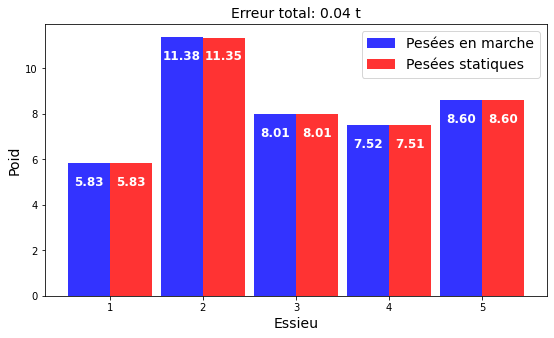

ERREUR :  0.01525239022088698
Comparing weights


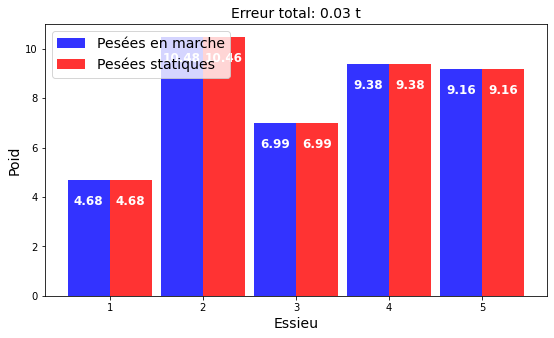

ERREUR :  0.01962999386800135
Comparing weights


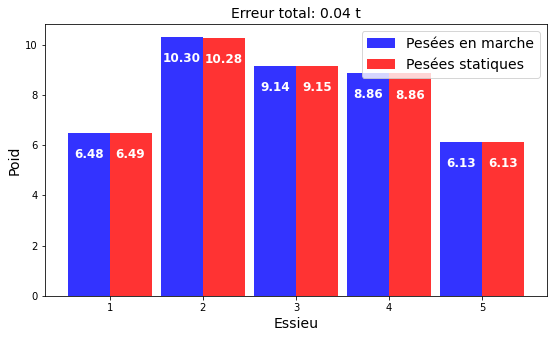

Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 355, 477, 507, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 355, 477, 507, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 356, 479, 508, 535]
position décalage 0
peaks0 :  271
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 478, 507, 533]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 480, 504, 536]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  480
Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  504
Décalage trouvé
decalage found :  504
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [272, 356, 478, 506

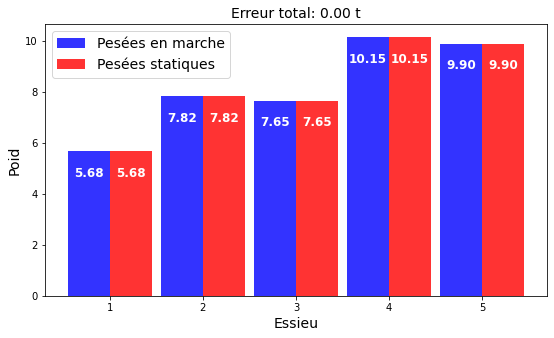

ERREUR :  0.014236535407846418
Comparing weights


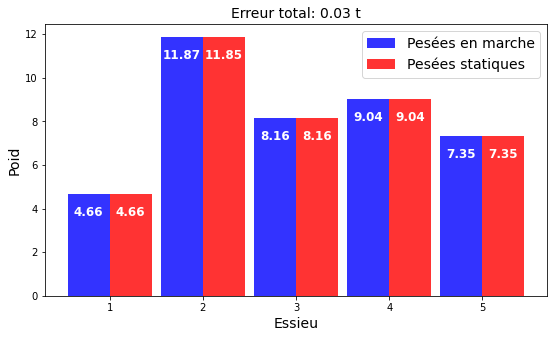

ERREUR :  0.01723051443244117
Comparing weights


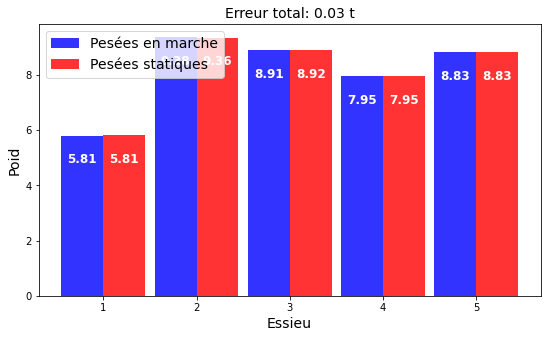

ERREUR :  -2.842170943040401e-14
Comparing weights


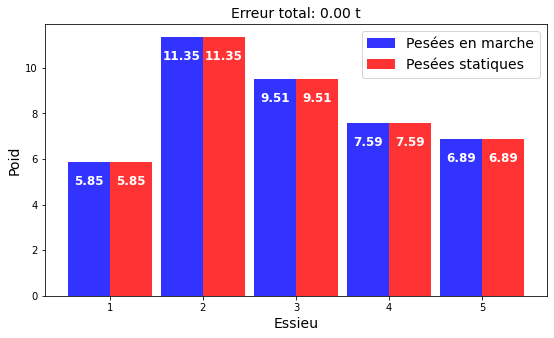

ERREUR :  0.013613288719405148
Comparing weights


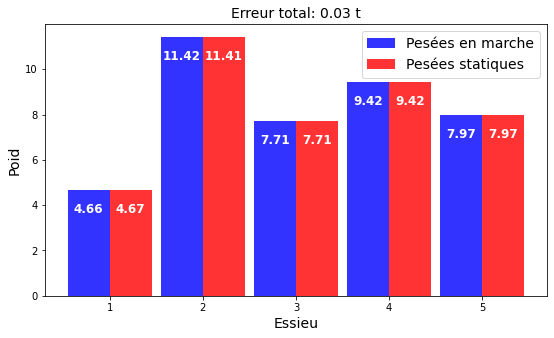

ERREUR :  7.105427357601002e-15
Comparing weights


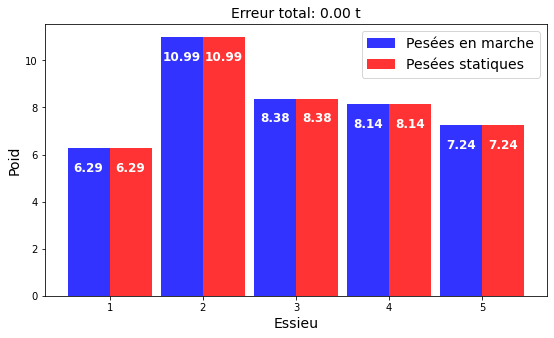

ERREUR :  0.014110341401824655
Comparing weights


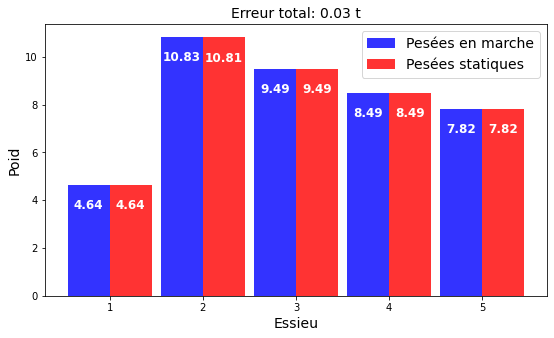

ERREUR :  0.018610577043482124
Comparing weights


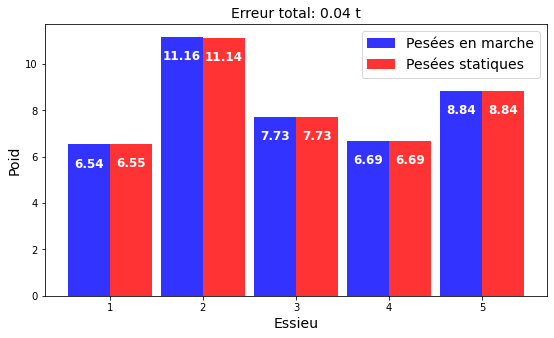

ERREUR :  0.021055144205931242
Comparing weights


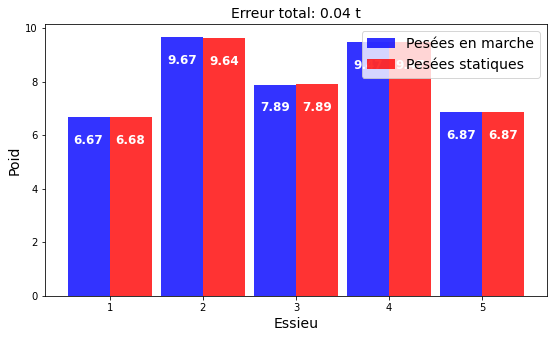

ERREUR :  0.01928842984334267
Comparing weights


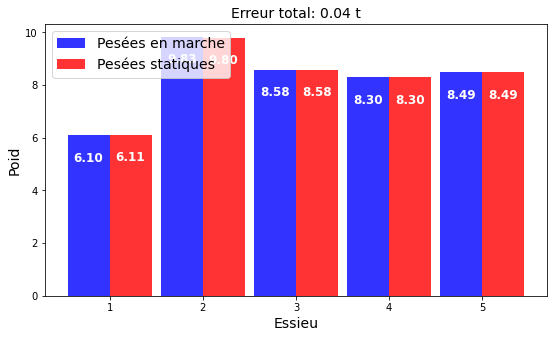

ERREUR :  2.842170943040401e-14
Comparing weights


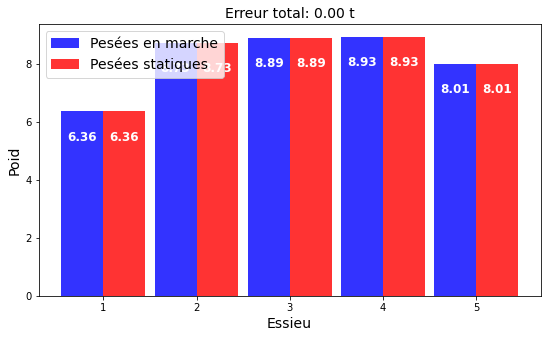

ERREUR :  0.014030435671912755
Comparing weights


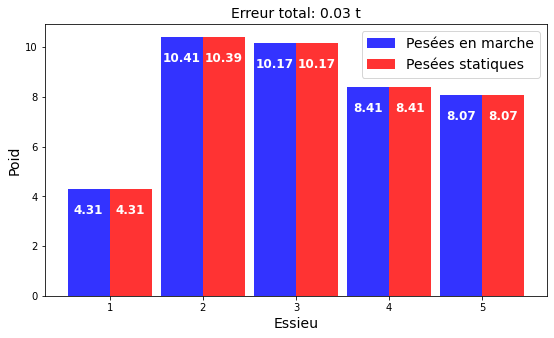

ERREUR :  4.263256414560601e-14
Comparing weights


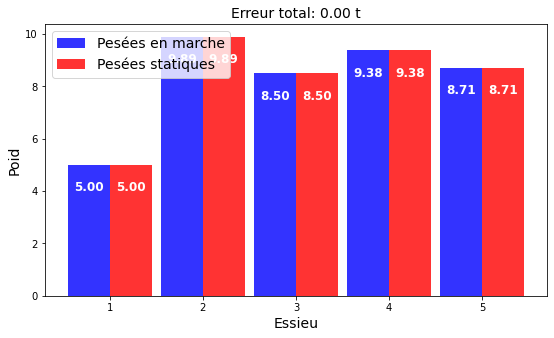

ERREUR :  2.842170943040401e-14
Comparing weights


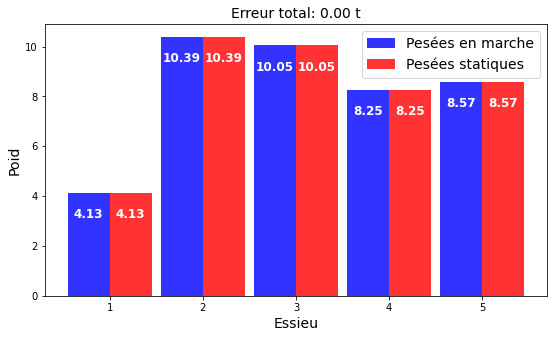

ERREUR :  -8.242295734817162e-13
Comparing weights


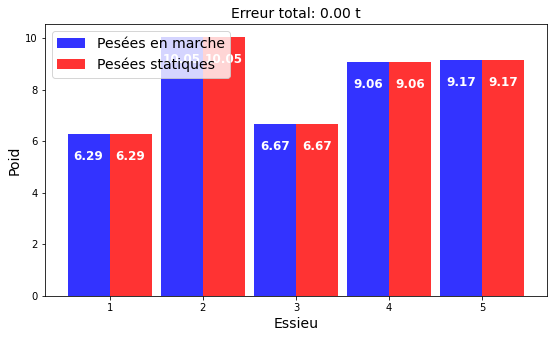

ERREUR :  -5.684341886080802e-14
Comparing weights


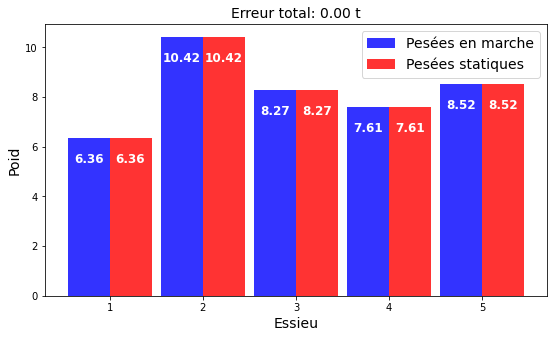

ERREUR :  3.552713678800501e-14
Comparing weights


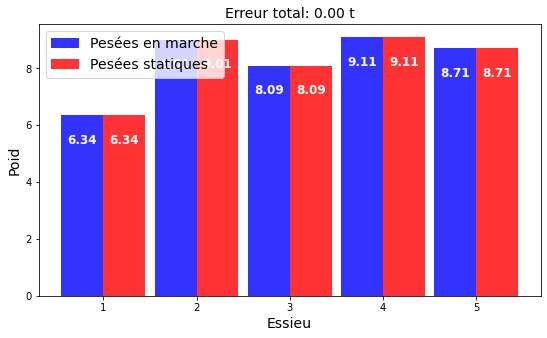

ERREUR :  -1.1368683772161603e-13
Comparing weights


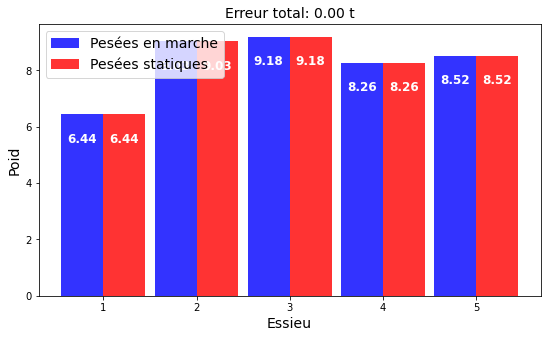

ERREUR :  0.0
Comparing weights


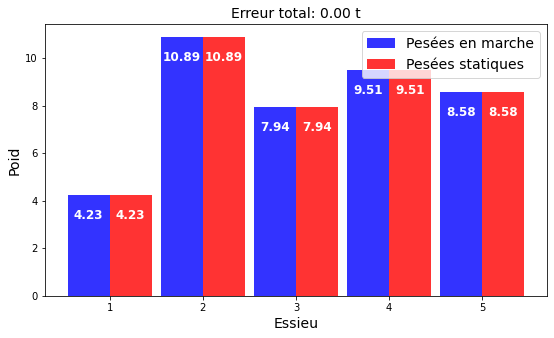

ERREUR :  0.013181375962602715
Comparing weights


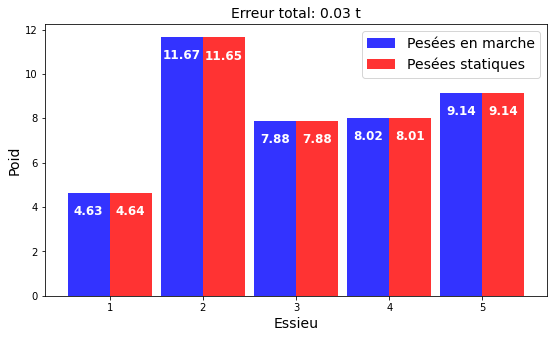

ERREUR :  2.842170943040401e-14
Comparing weights


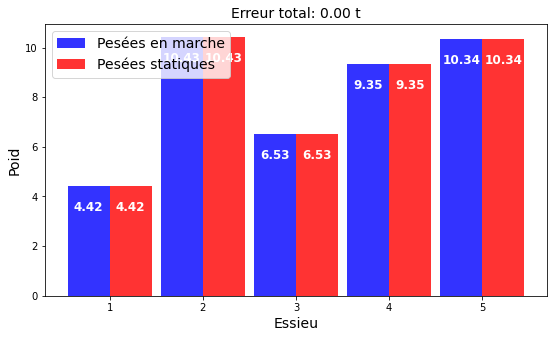

ERREUR :  7.105427357601002e-15
Comparing weights


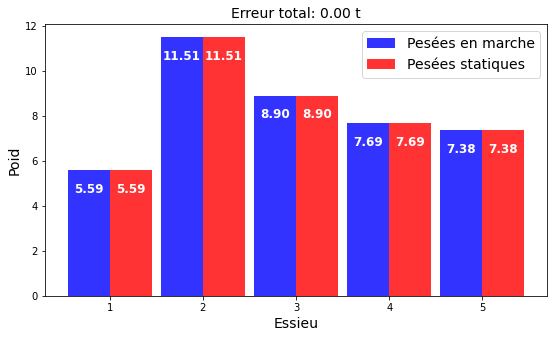

ERREUR :  -1.4210854715202004e-14
Comparing weights


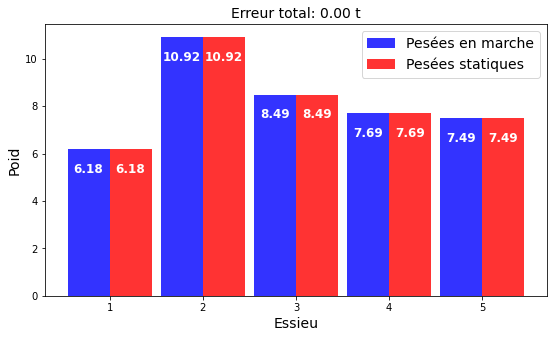

ERREUR :  -5.684341886080802e-14
Comparing weights


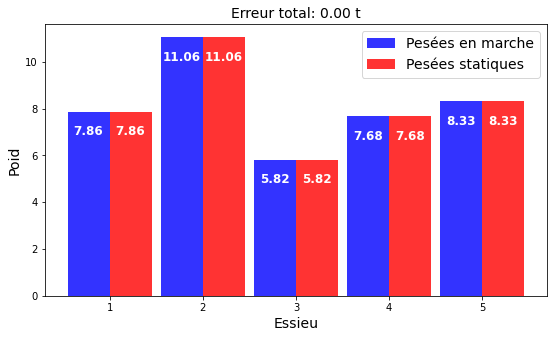

ERREUR :  -2.1316282072803006e-14
Comparing weights


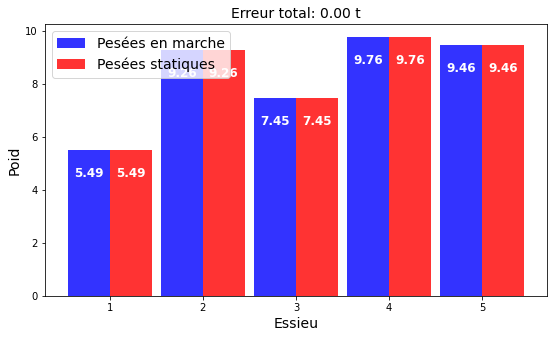

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 357, 479, 505, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 358, 478, 506, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [270, 356, 479, 506, 534]
position décalage 0
peaks0 :  270
Décalage tr

Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 478, 507, 532]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  532
Décalage trouvé
decalage found :  532
PEAKS :  [273, 356, 476, 507, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 356, 477, 507

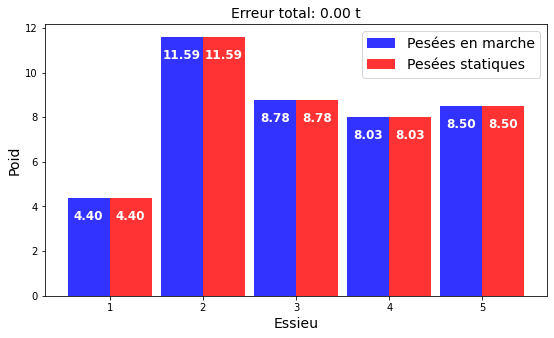

ERREUR :  0.016139995441633914
Comparing weights


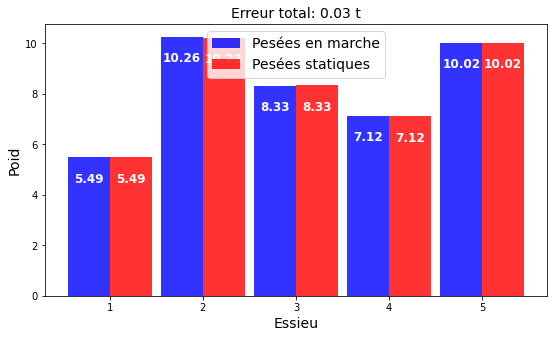

ERREUR :  4.263256414560601e-14
Comparing weights


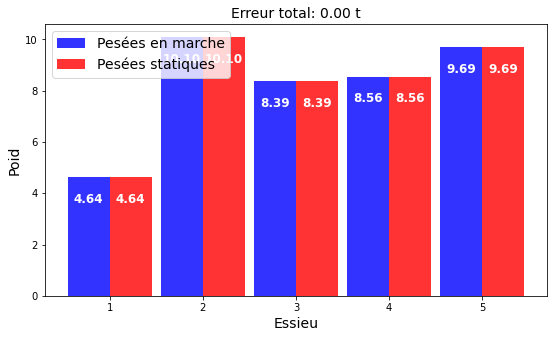

ERREUR :  -7.105427357601002e-15
Comparing weights


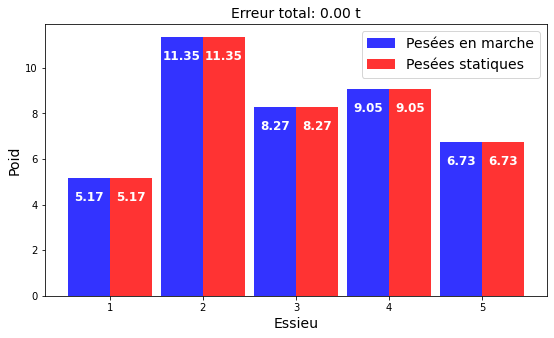

ERREUR :  -7.105427357601002e-14
Comparing weights


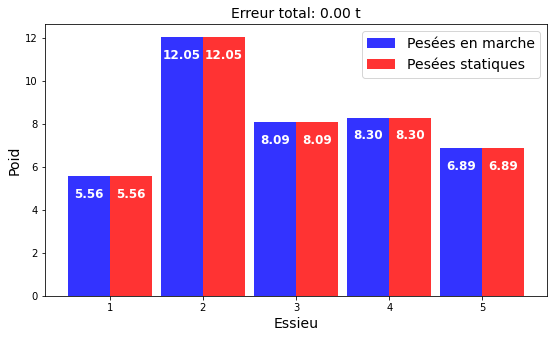

ERREUR :  7.105427357601002e-15
Comparing weights


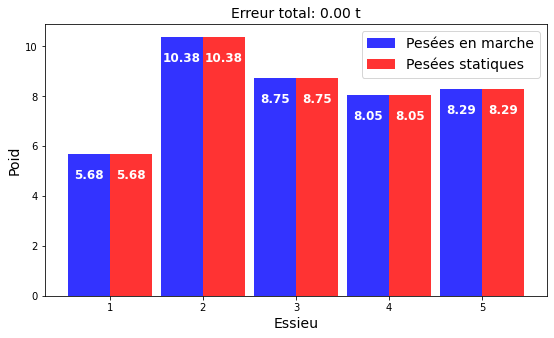

ERREUR :  0.01767295417320014
Comparing weights


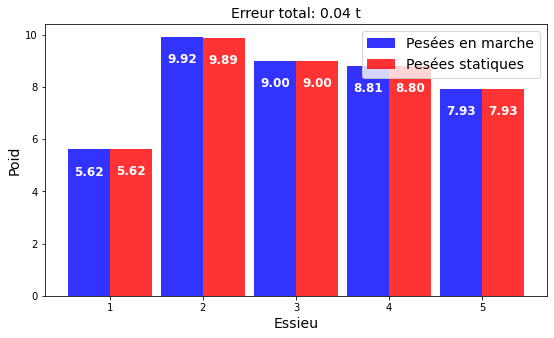

ERREUR :  -3.552713678800501e-14
Comparing weights


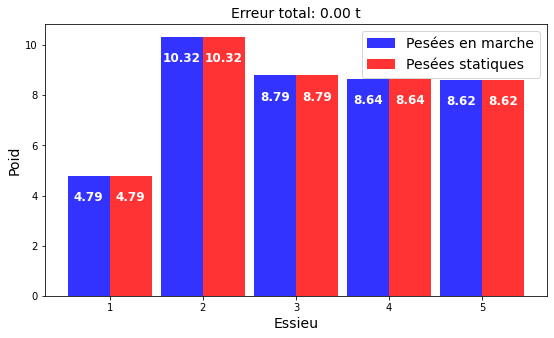

ERREUR :  0.01520682848582311
Comparing weights


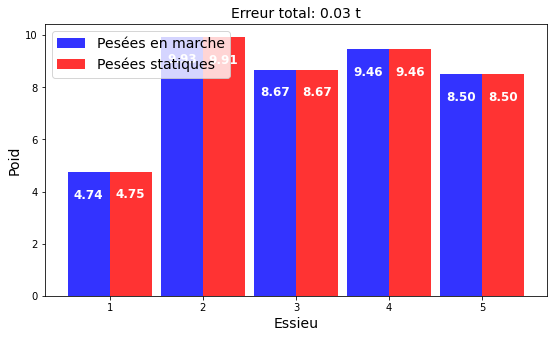

ERREUR :  1.2789769243681803e-13
Comparing weights


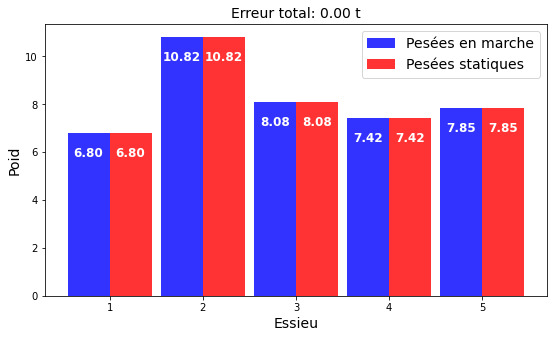

ERREUR :  0.015021897746365198
Comparing weights


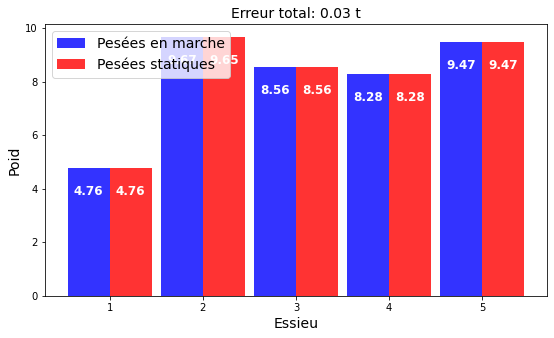

ERREUR :  -0.027209125487281938
Comparing weights


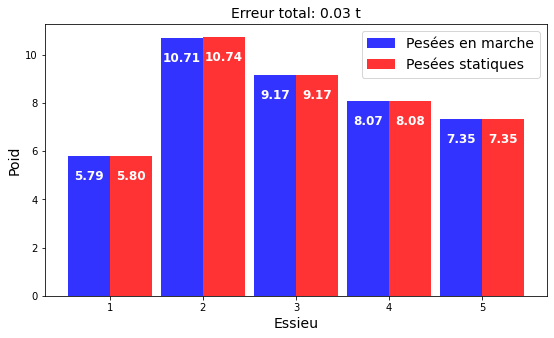

ERREUR :  0.019351138477951224
Comparing weights


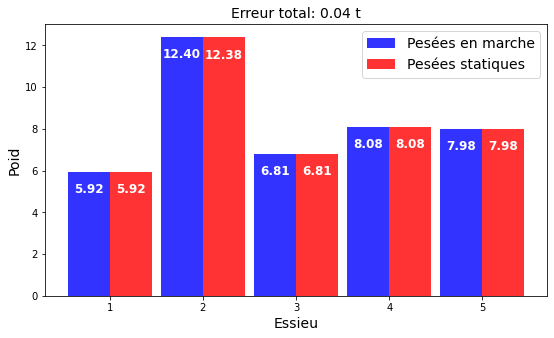

ERREUR :  0.01846622773400952
Comparing weights


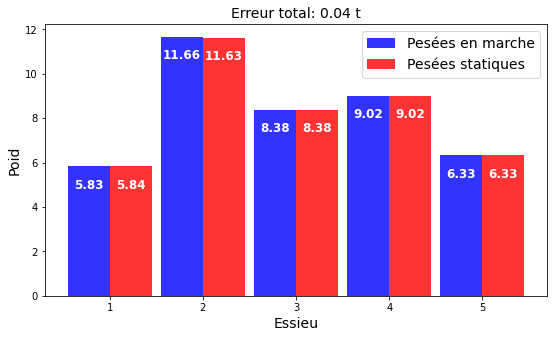

ERREUR :  0.0002632670139988136
Comparing weights


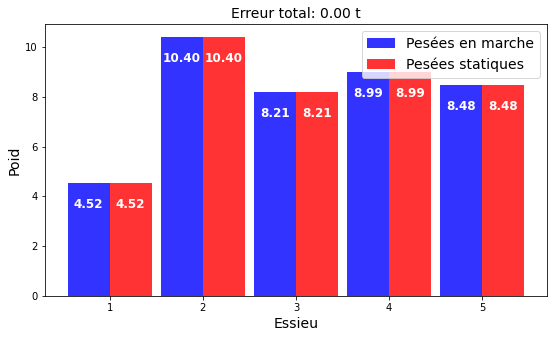

ERREUR :  1.1510792319313623e-12
Comparing weights


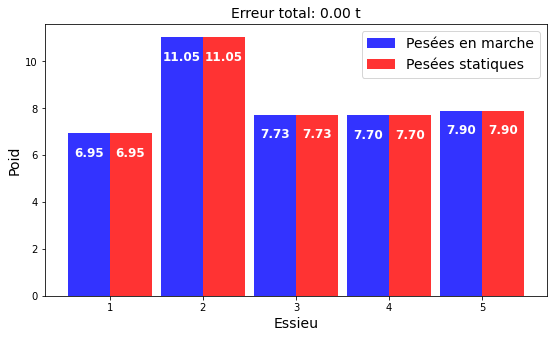

ERREUR :  0.01684446023136843
Comparing weights


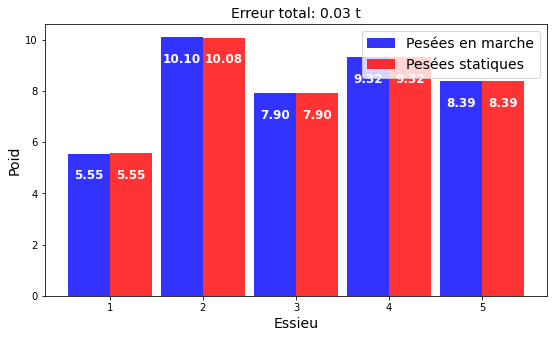

ERREUR :  0.0
Comparing weights


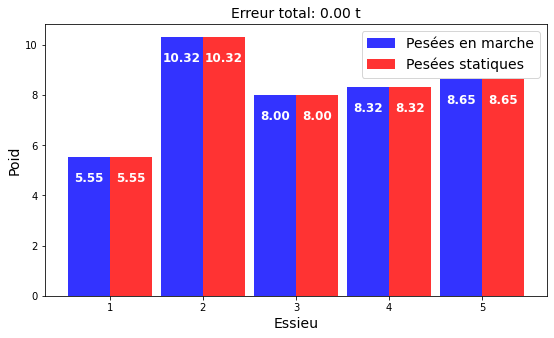

ERREUR :  -0.00010736966510194179
Comparing weights


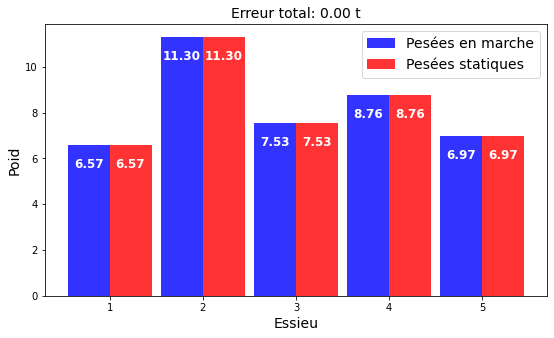

ERREUR :  0.014818635275020142
Comparing weights


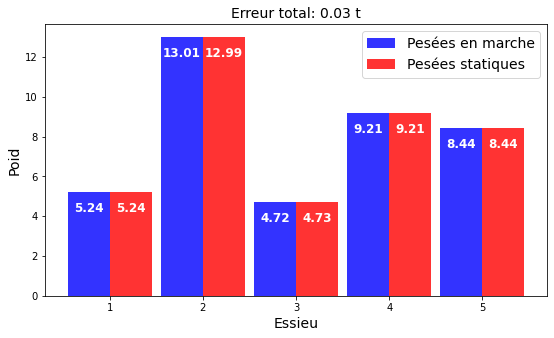

ERREUR :  0.017353639031632895
Comparing weights


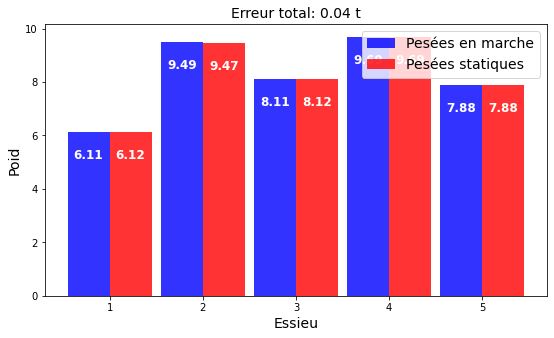

ERREUR :  8.526512829121202e-14
Comparing weights


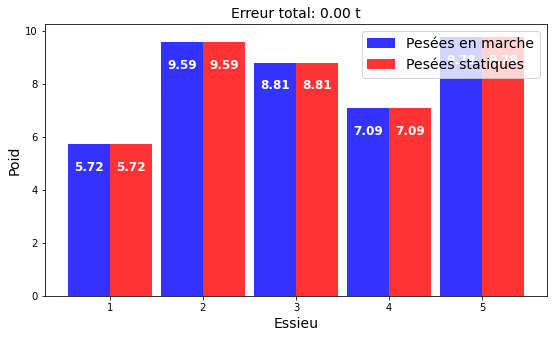

ERREUR :  0.012769781040724126
Comparing weights


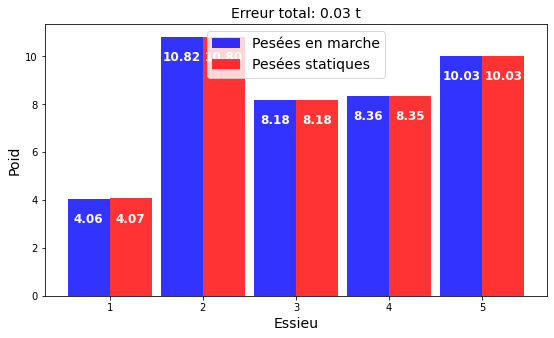

ERREUR :  -2.842170943040401e-14
Comparing weights


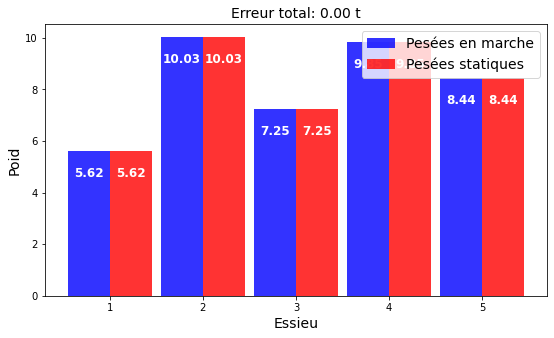

ERREUR :  0.016348652057374125
Comparing weights


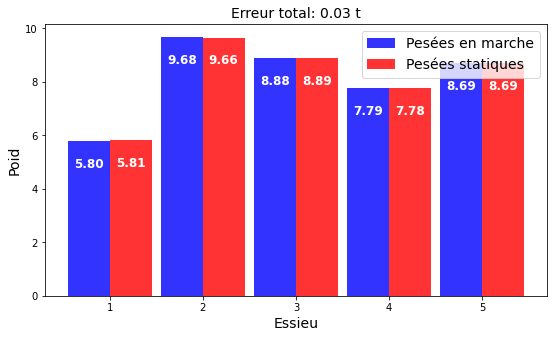

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [271, 356, 479, 508, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 358, 477, 507, 535]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 356, 479, 506, 536]
position décalage 0
peaks0 :  271
Décalage tr

Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 479, 508, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 355, 477, 505, 536]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [275, 355, 477, 507

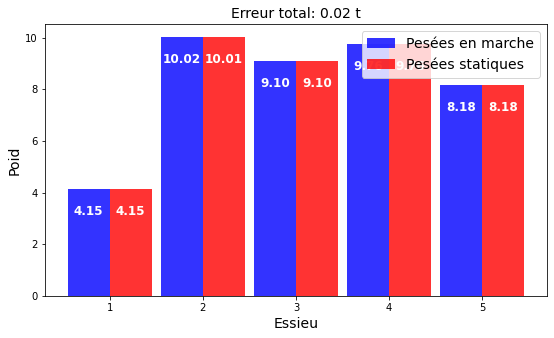

ERREUR :  -8.526512829121202e-14
Comparing weights


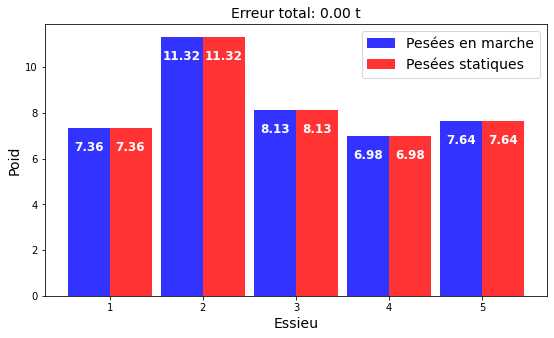

ERREUR :  0.018077899130815922
Comparing weights


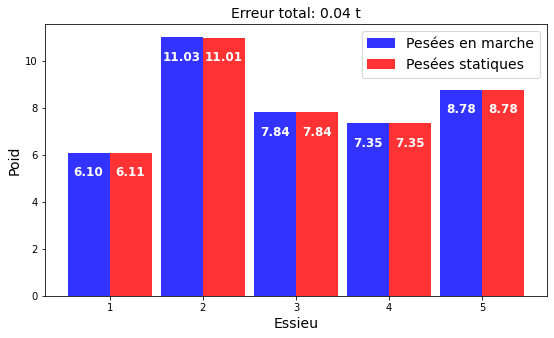

ERREUR :  3.552713678800501e-14
Comparing weights


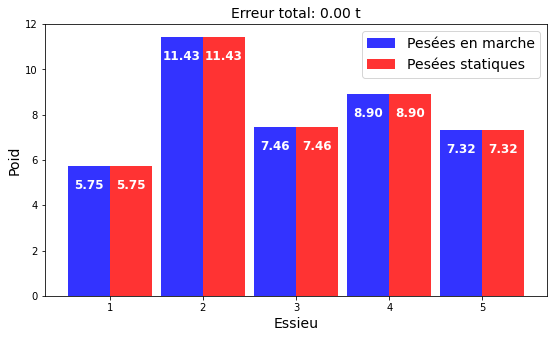

ERREUR :  2.842170943040401e-14
Comparing weights


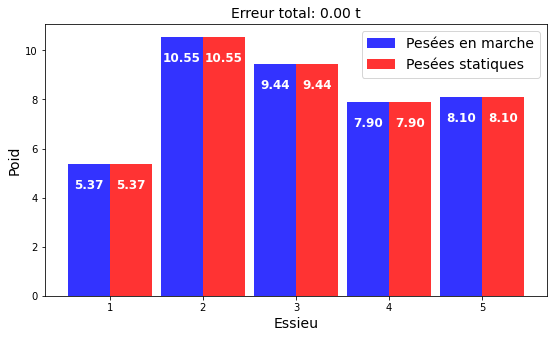

ERREUR :  9.947598300641403e-14
Comparing weights


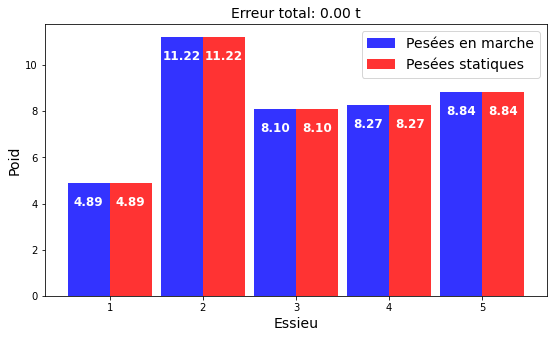

ERREUR :  0.015362410782074676
Comparing weights


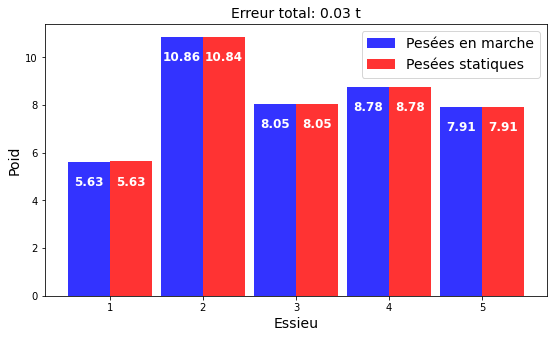

ERREUR :  -3.8625295758265565e-05
Comparing weights


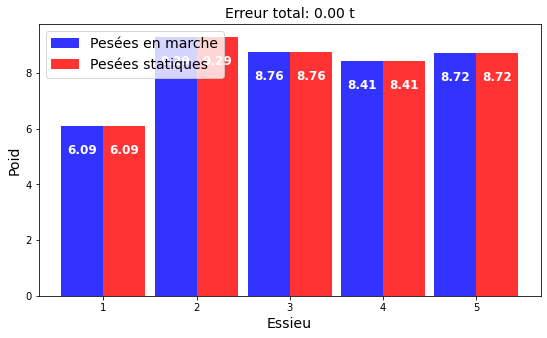

ERREUR :  4.973799150320701e-14
Comparing weights


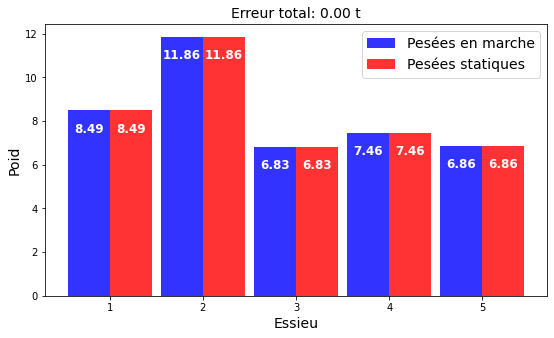

ERREUR :  -4.973799150320701e-14
Comparing weights


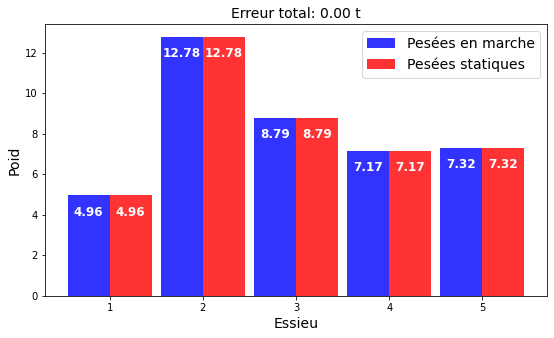

ERREUR :  0.021729060679994916
SPEED :  25.71478441242172
ERREUR :  0.020403945281593394
Comparing weights


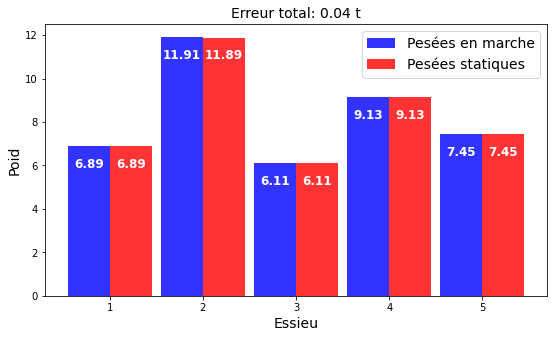

ERREUR :  -0.0004926967475995525
Comparing weights


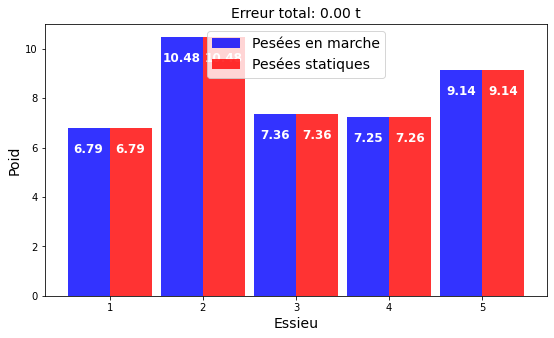

ERREUR :  0.019925391394458813
Comparing weights


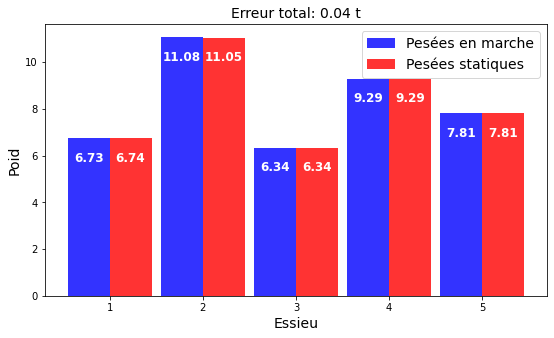

ERREUR :  -7.105427357601002e-15
SPEED :  24.186918848131878
ERREUR :  1.1368683772161603e-13
Comparing weights


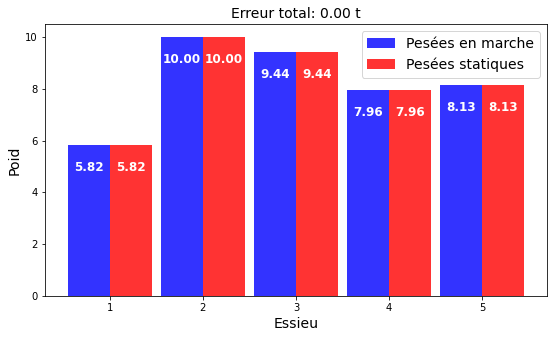

ERREUR :  1.4210854715202004e-14
Comparing weights


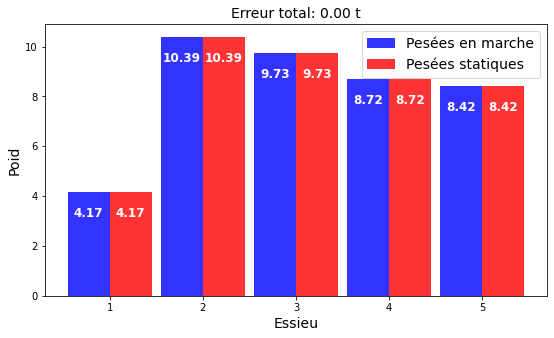

ERREUR :  7.105427357601002e-15
Comparing weights


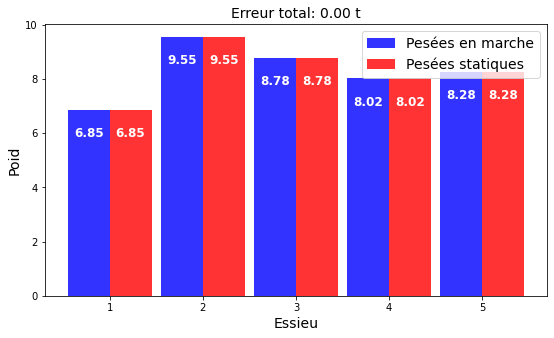

ERREUR :  0.0010652345338968416
Comparing weights


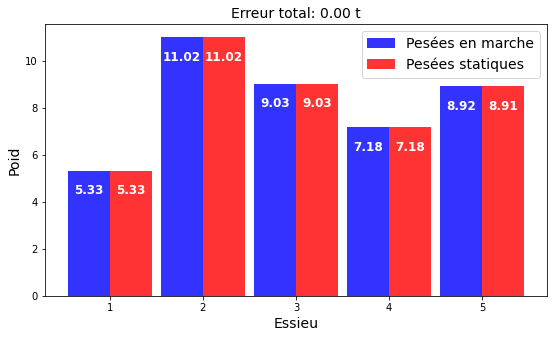

ERREUR :  0.01896952324742074
Comparing weights


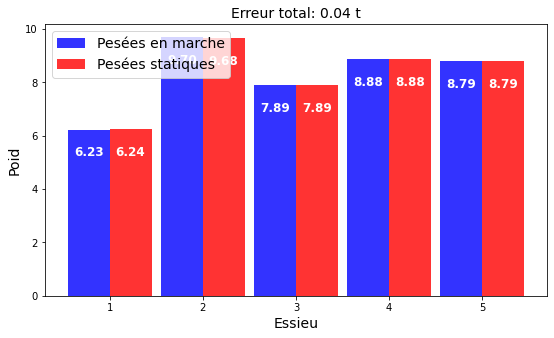

ERREUR :  0.020987539960522383
Comparing weights


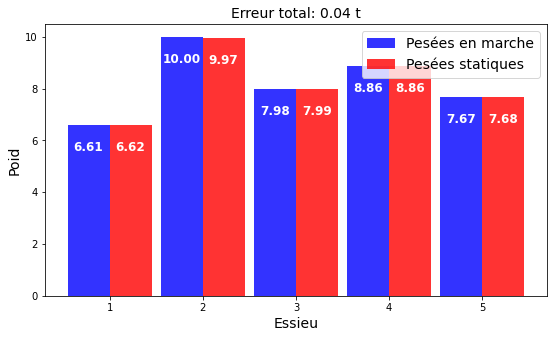

ERREUR :  0.013642782133260312
Comparing weights


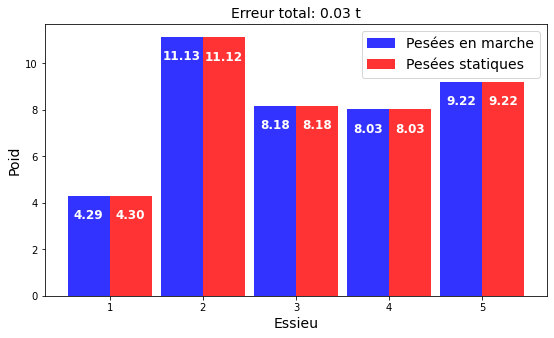

ERREUR :  4.263256414560601e-14
Comparing weights


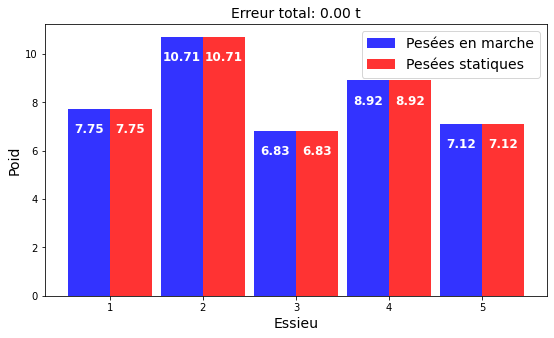

ERREUR :  -0.04376611062389202
Comparing weights


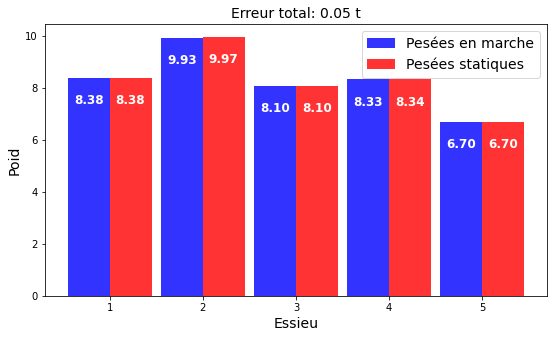

ERREUR :  7.105427357601002e-14
Comparing weights


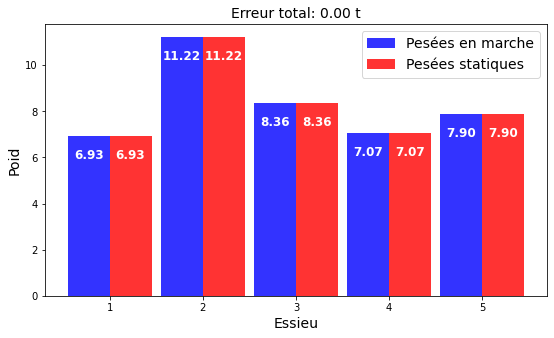

Itération n° : 5/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [274, 356, 479, 507, 535]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 355, 477, 505, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 357, 479, 508, 535]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 476, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 477, 506, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 358, 479, 508

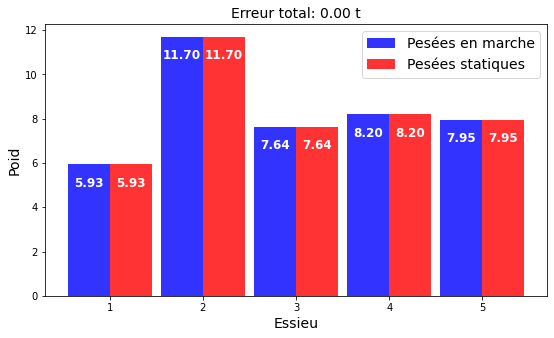

ERREUR :  -5.267537517283927e-10
Comparing weights


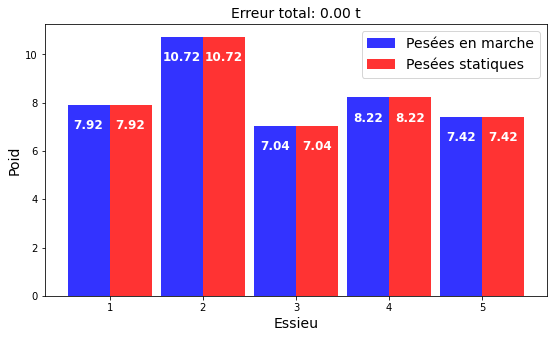

ERREUR :  0.01858407148835539
Comparing weights


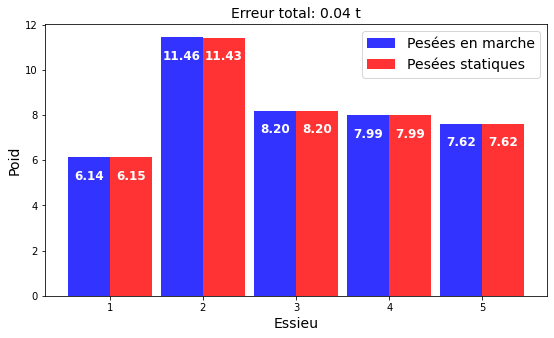

ERREUR :  -0.0005204838729611083
SPEED :  25.60137428344529
ERREUR :  -0.0001417690052747389
Comparing weights


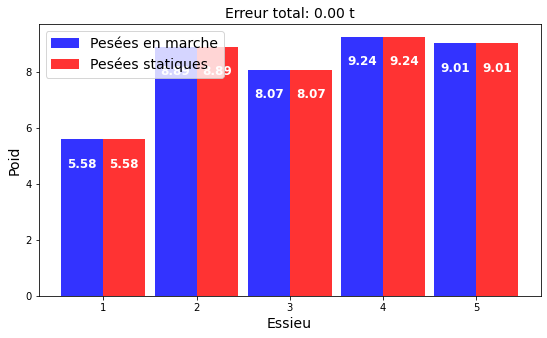

ERREUR :  0.01953471145385066
Comparing weights


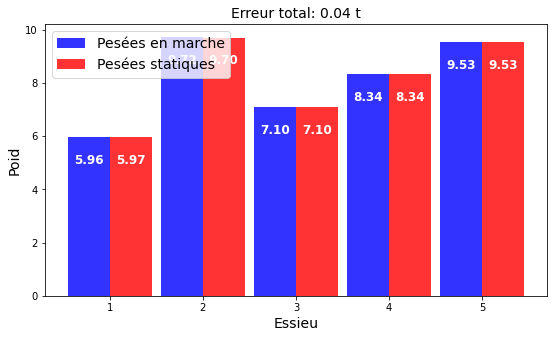

ERREUR :  1.4210854715202004e-14
Comparing weights


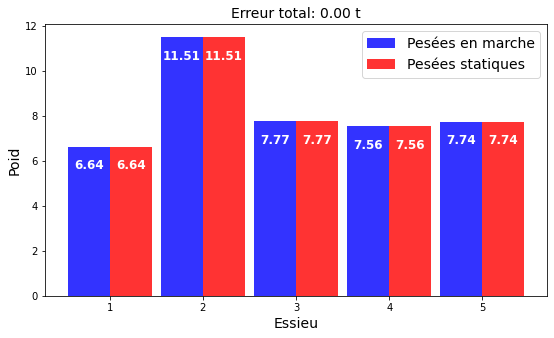

ERREUR :  -0.00010686682509941647
Comparing weights


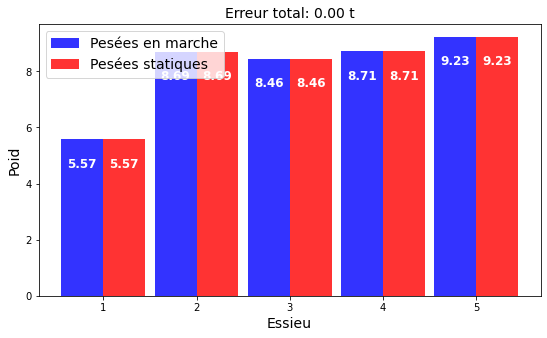

ERREUR :  -4.973799150320701e-14
Comparing weights


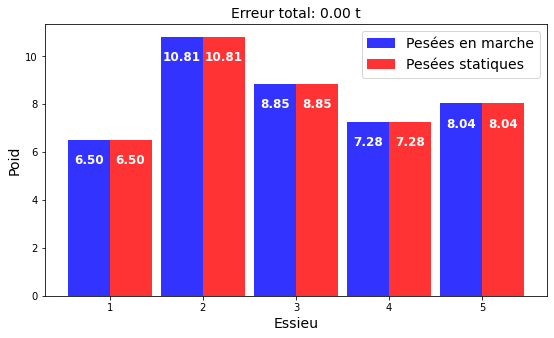

ERREUR :  -1.213038558489643e-09
Comparing weights


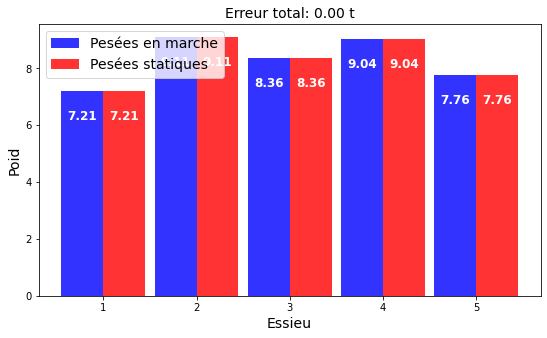

ERREUR :  0.01754684645320026
Comparing weights


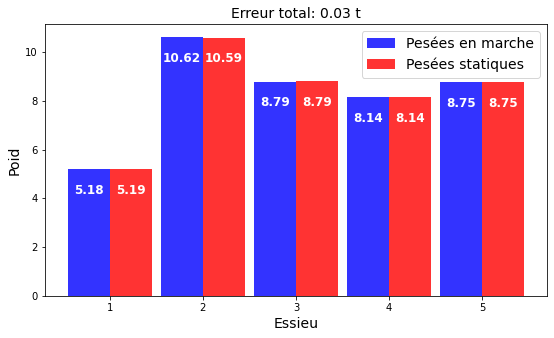

ERREUR :  0.01587092410294133
Comparing weights


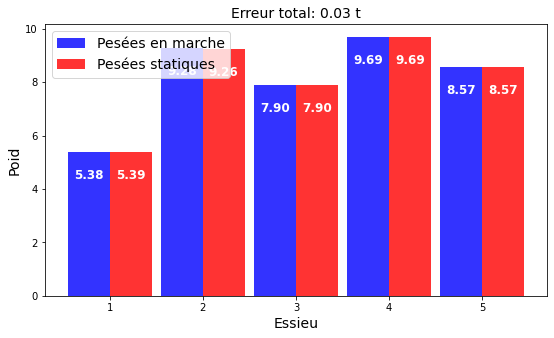

ERREUR :  0.014002148481516485
Comparing weights


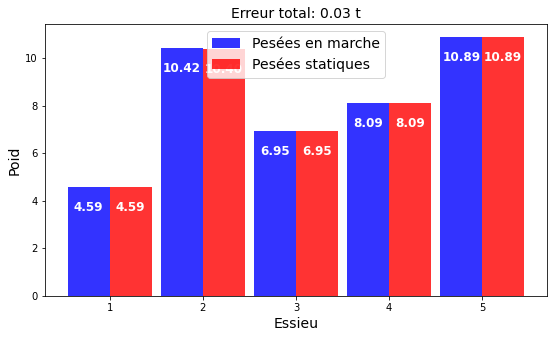

ERREUR :  0.016636566055794333
Comparing weights


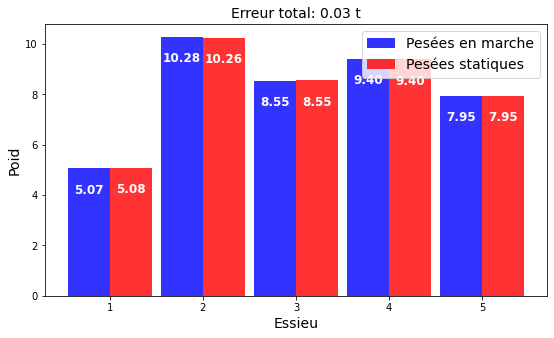

ERREUR :  7.304570843302827e-06
SPEED :  16.98307157913965
ERREUR :  0.022878341172827277
Comparing weights


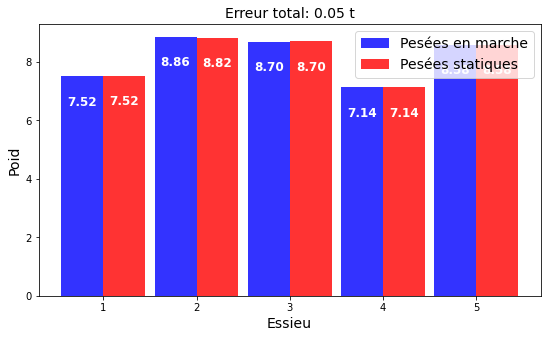

ERREUR :  0.021098709907988678
Comparing weights


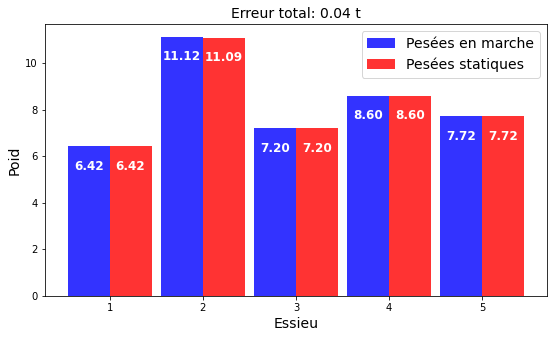

ERREUR :  6.127720553195104e-11
Comparing weights


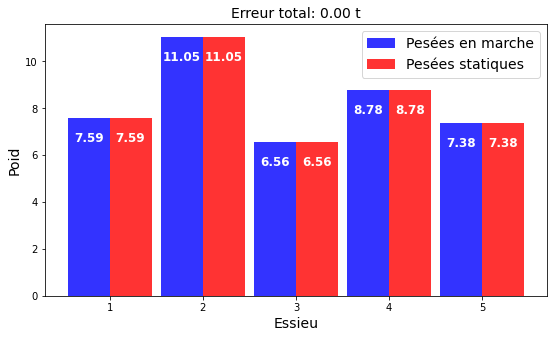

ERREUR :  2.1316282072803006e-14
Comparing weights


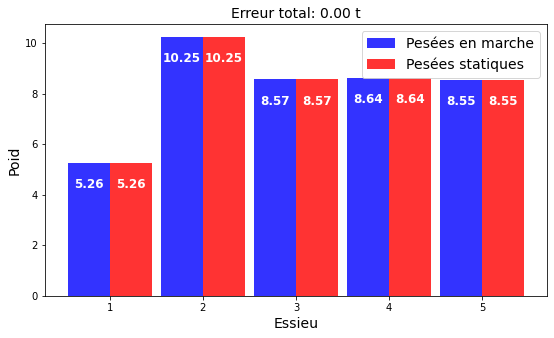

ERREUR :  -0.03293008814855369
Comparing weights


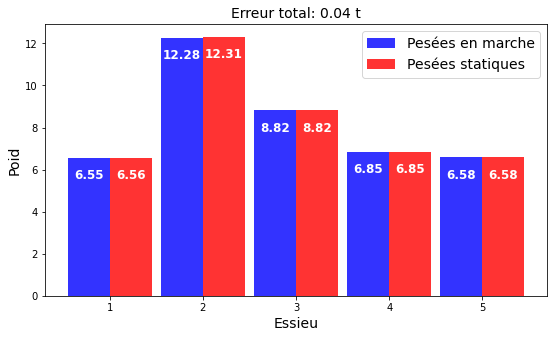

ERREUR :  -0.00016610622648016715
Comparing weights


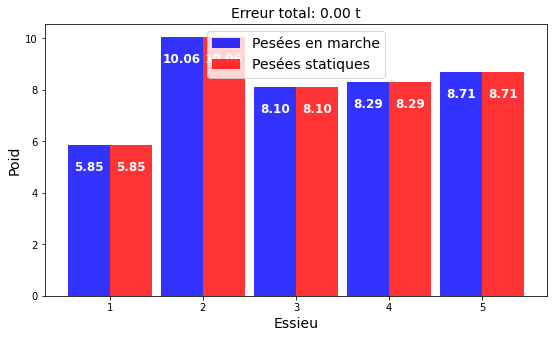

ERREUR :  0.017340277576934682
Comparing weights


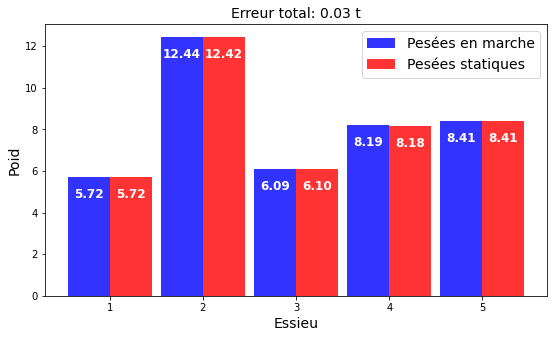

ERREUR :  1.4210854715202004e-14
Comparing weights


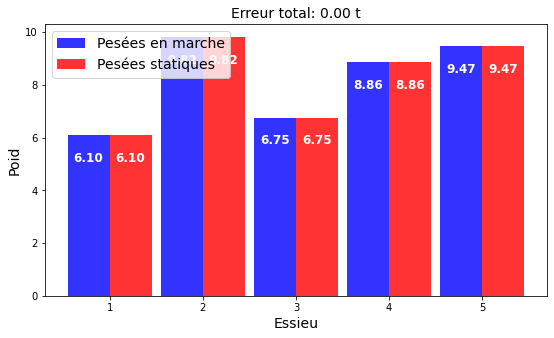

ERREUR :  0.0
Comparing weights


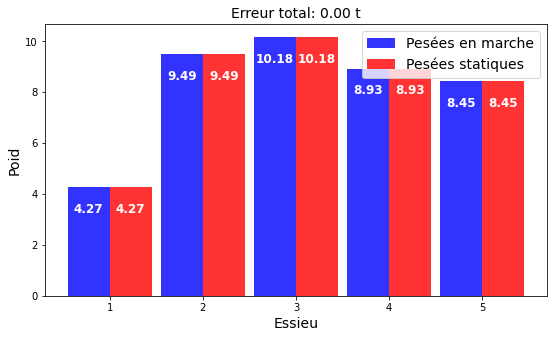

ERREUR :  -0.02316057456267373
SPEED :  15.945950462081221
SIGMA FOR NOISE :  0.011111111111111112
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 356, 476, 505, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 478, 507, 532]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  532
Décalage trouvé
dec

Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 476, 507, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 354, 478, 507, 537]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :

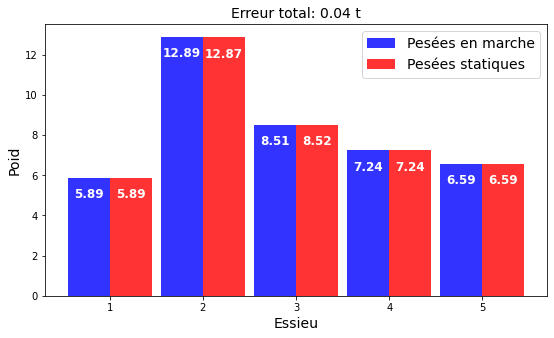

ERREUR :  0.019014815987084432
Comparing weights


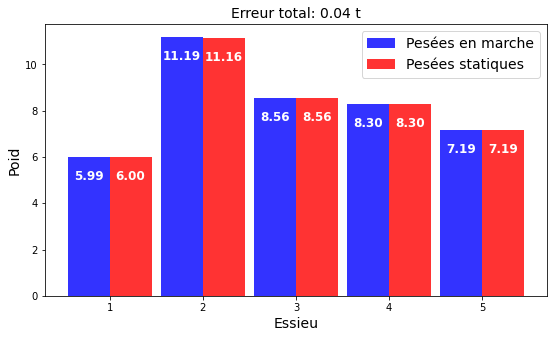

ERREUR :  0.0
Comparing weights


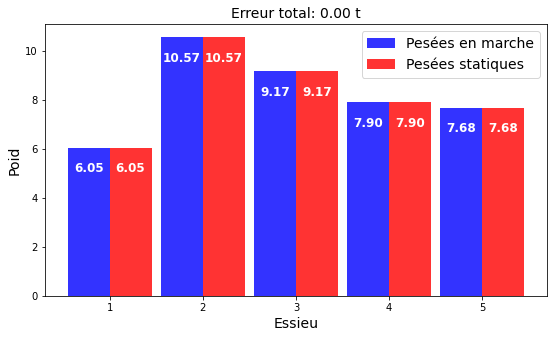

ERREUR :  9.947598300641403e-14
SPEED :  23.977627192100524
ERREUR :  -4.973799150320701e-14
Comparing weights


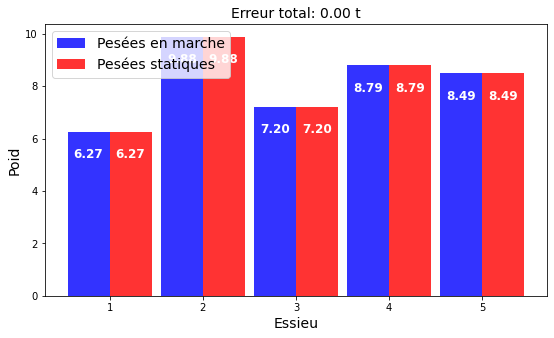

ERREUR :  0.01187472109219101
Comparing weights


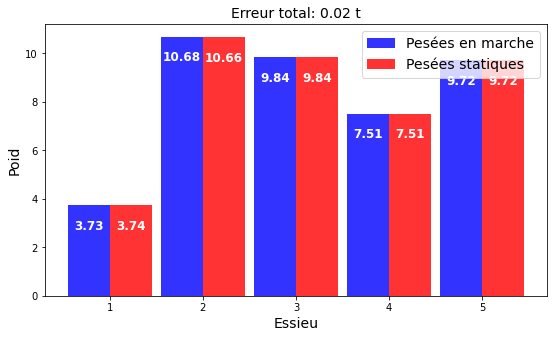

ERREUR :  7.105427357601002e-15
Comparing weights


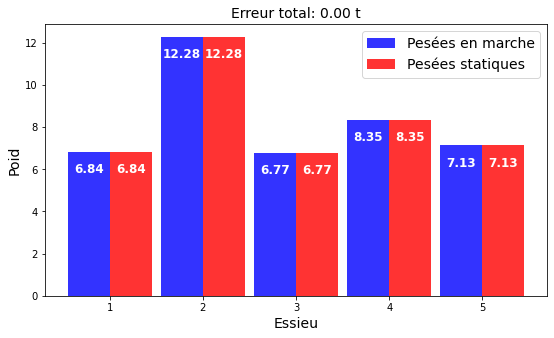

ERREUR :  0.020413957014802975
SPEED :  25.22738606549966
ERREUR :  0.01594666894880703
Comparing weights


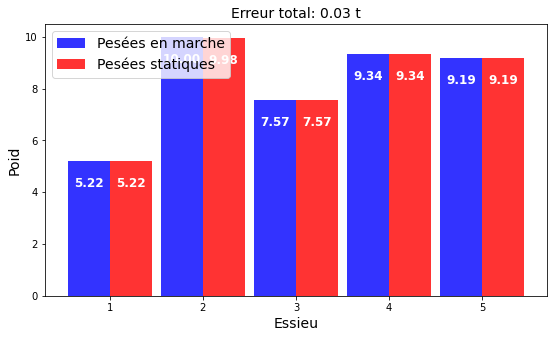

ERREUR :  0.013894651078423692
Comparing weights


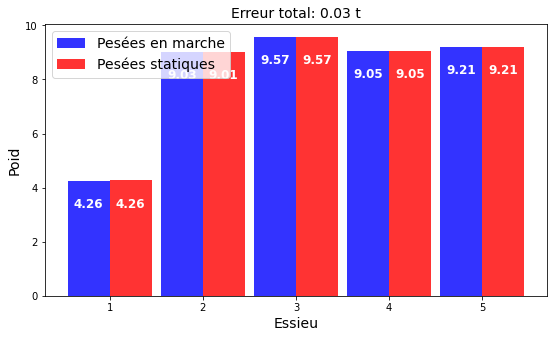

ERREUR :  -3.552713678800501e-14
Comparing weights


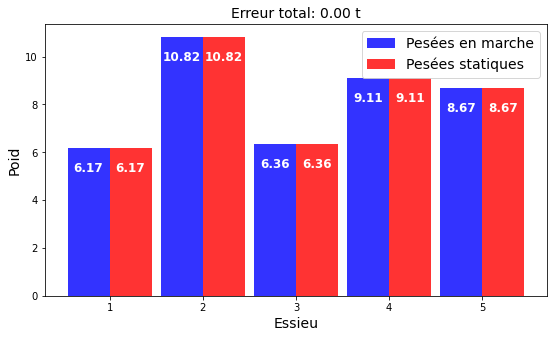

ERREUR :  1.4210854715202004e-14
Comparing weights


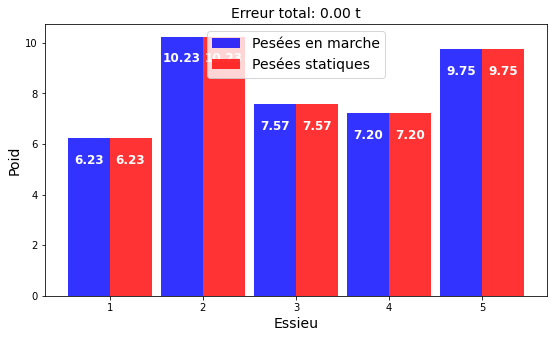

ERREUR :  0.014486546367329822
Comparing weights


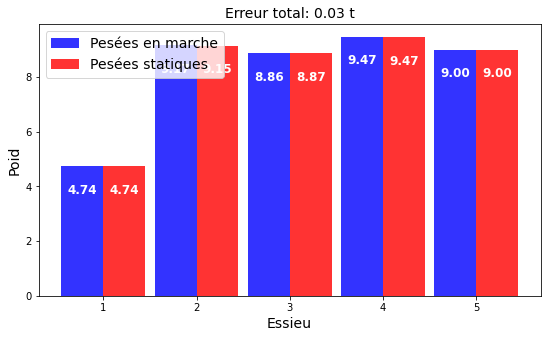

ERREUR :  -1.4210854715202004e-14
Comparing weights


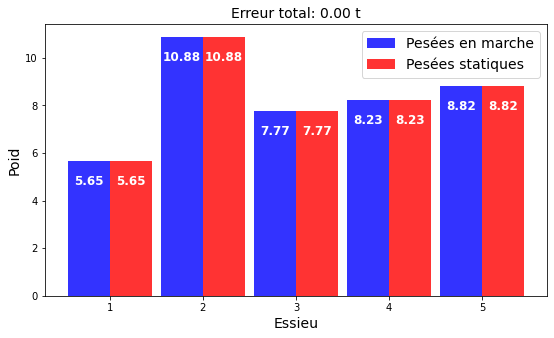

ERREUR :  0.015182219828339782
SPEED :  24.366873155525862
ERREUR :  0.01557100566380143
Comparing weights


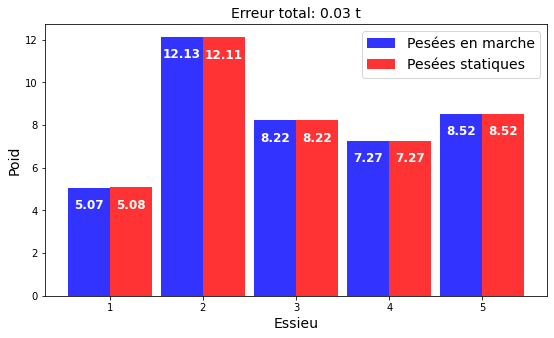

ERREUR :  0.01969909061354258
Comparing weights


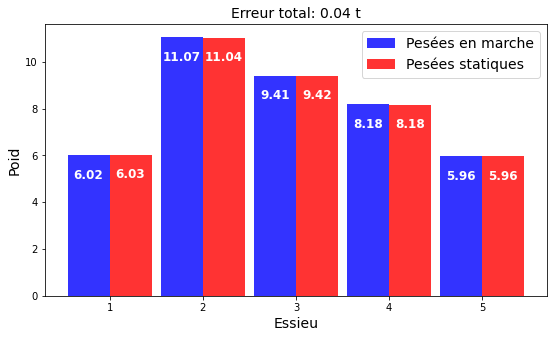

ERREUR :  4.405364961712621e-13
SPEED :  25.200206289875155
ERREUR :  -5.613287612504791e-13
Comparing weights


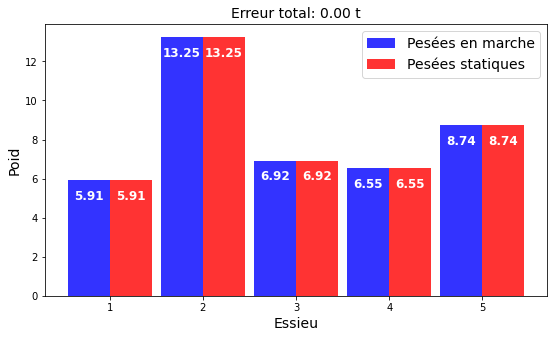

ERREUR :  1.6342482922482304e-13
SPEED :  24.494715888587987
ERREUR :  -1.1368683772161603e-13
Comparing weights


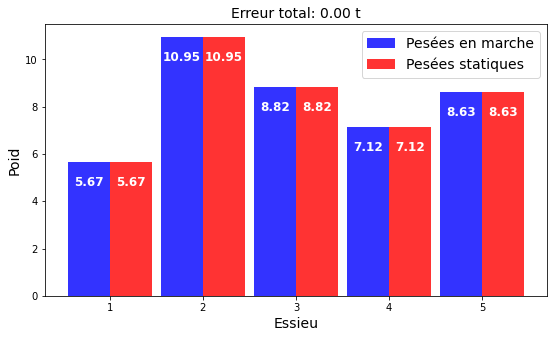

ERREUR :  7.105427357601002e-15
Comparing weights


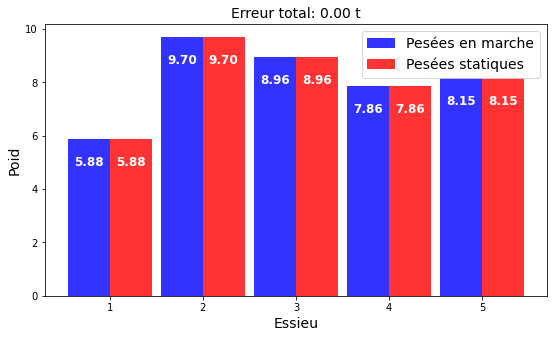

ERREUR :  0.02105998814836596
Comparing weights


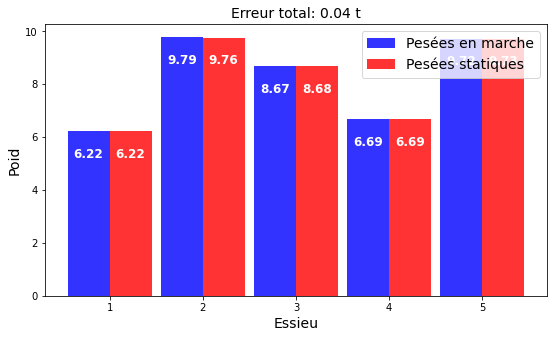

ERREUR :  0.0189250771661591
Comparing weights


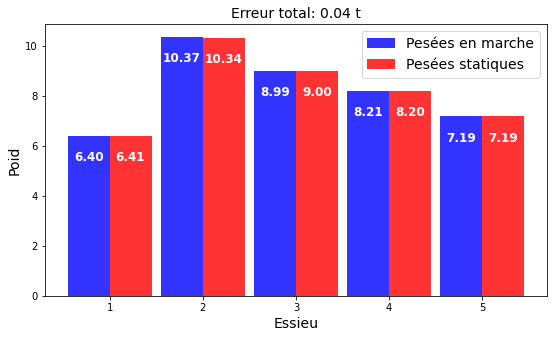

ERREUR :  -1.4210854715202004e-14
Comparing weights


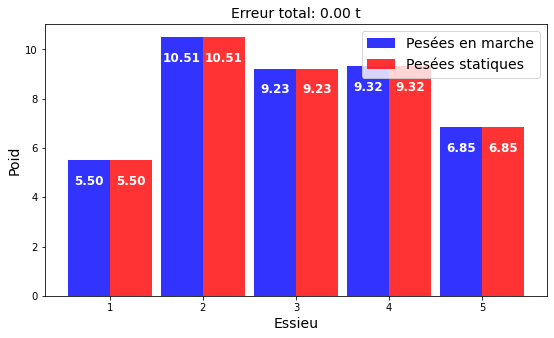

Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [271, 356, 477, 506, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 358, 476, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 478, 506, 534]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 477, 507, 536]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [273, 356, 478, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 479, 506

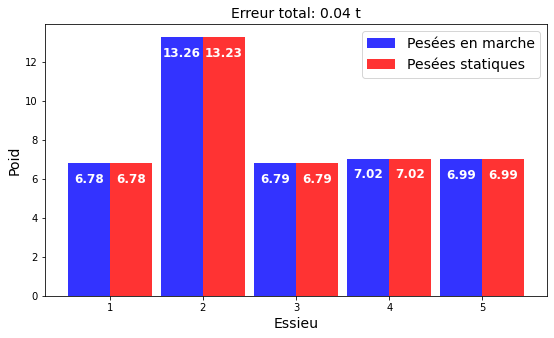

ERREUR :  0.01667038947102384
Comparing weights


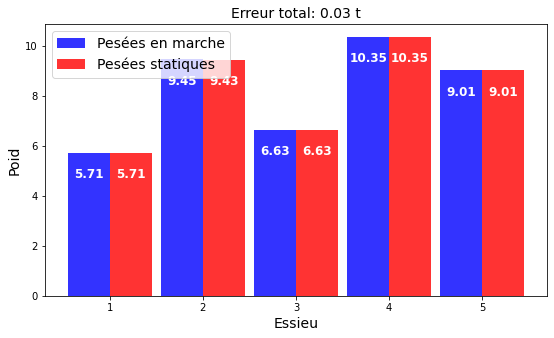

ERREUR :  -1.4210854715202004e-14
Comparing weights


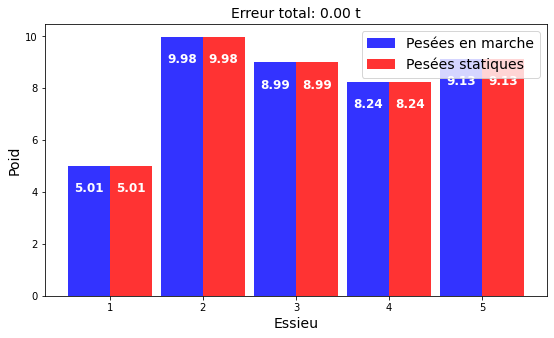

ERREUR :  0.0162529796434967
Comparing weights


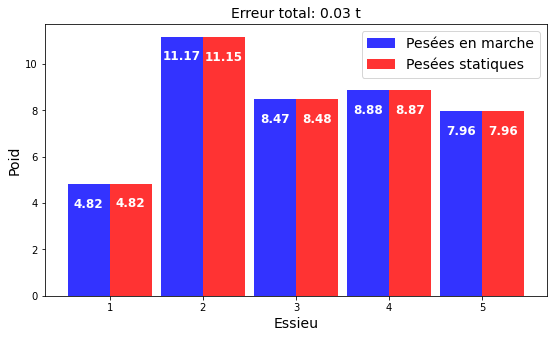

ERREUR :  1.1155520951433573e-12
SPEED :  15.981288015659985
ERREUR :  0.020819305161559498
SPEED :  17.948509576052025
ERREUR :  0.02336053162380125
Comparing weights


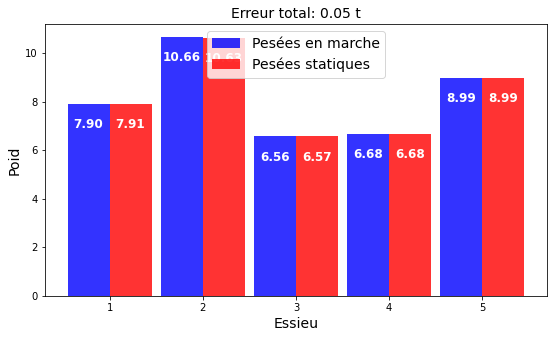

ERREUR :  0.02032300622173011
SPEED :  18.02024529810764
ERREUR :  7.105427357601002e-14
Comparing weights


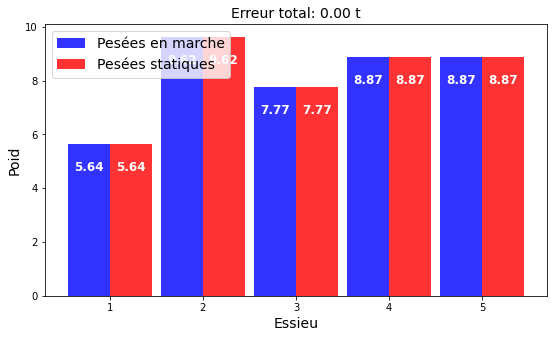

ERREUR :  0.019795964849855352
Comparing weights


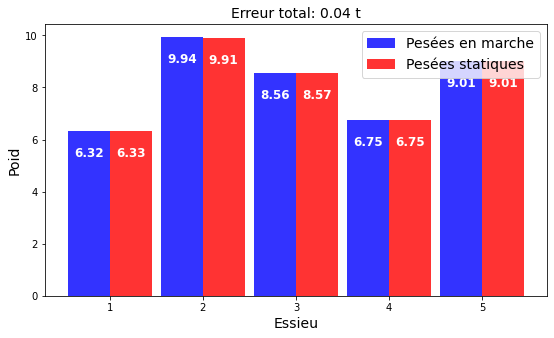

ERREUR :  0.02352978315858678
Comparing weights


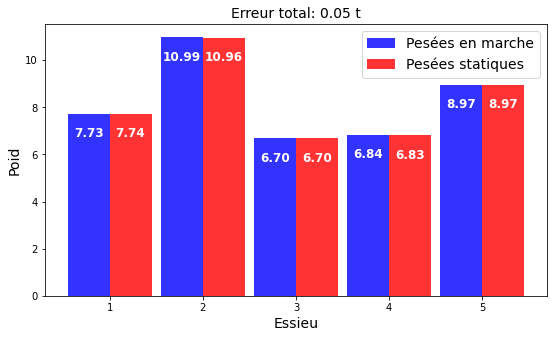

ERREUR :  1.3500311979441904e-13
Comparing weights


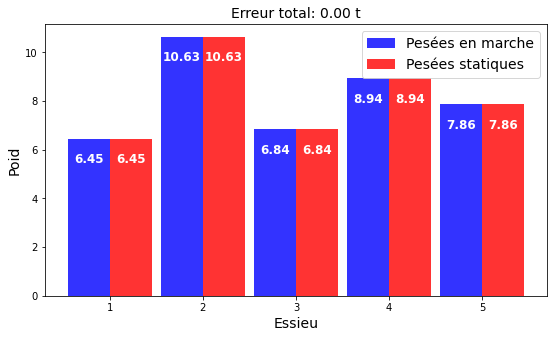

ERREUR :  4.263256414560601e-14
Comparing weights


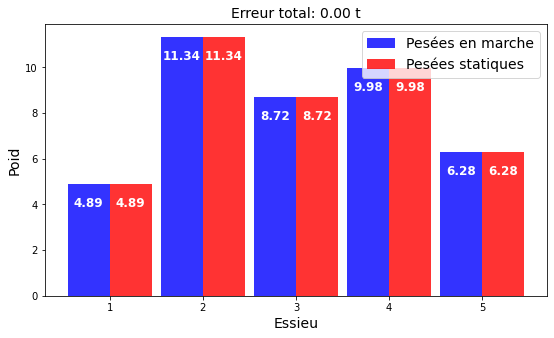

ERREUR :  3.126388037344441e-13
SPEED :  18.039722752568856
ERREUR :  0.016231378771706773
Comparing weights


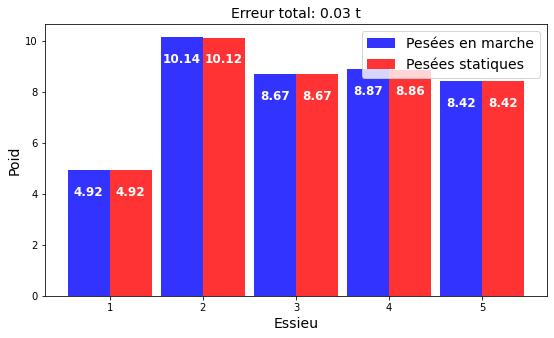

ERREUR :  1.4210854715202004e-14
Comparing weights


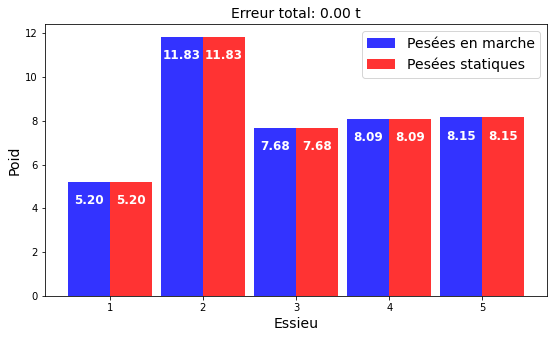

ERREUR :  0.019671804761927092
Comparing weights


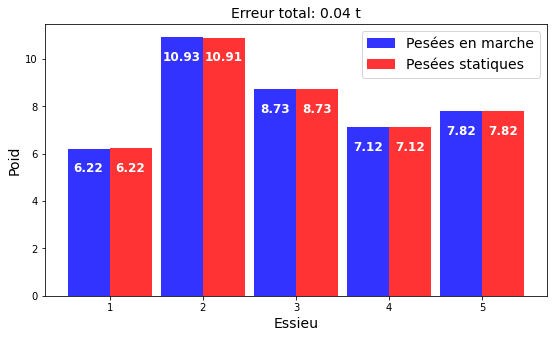

ERREUR :  0.011859219212098537
Comparing weights


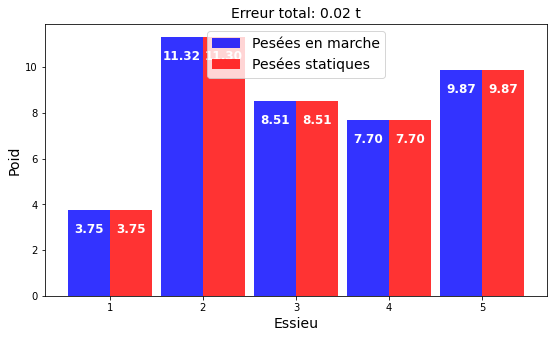

ERREUR :  -2.842170943040401e-14
Comparing weights


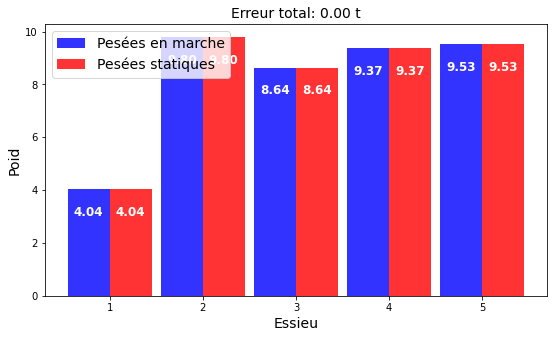

ERREUR :  1.4210854715202004e-14
Comparing weights


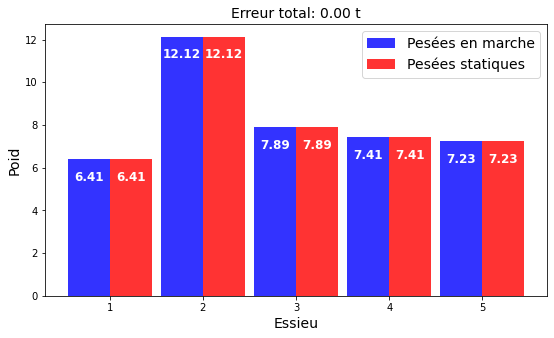

ERREUR :  0.01714425655094942
Comparing weights


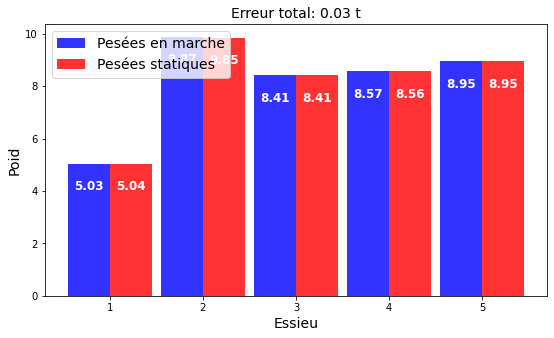

ERREUR :  -4.263256414560601e-14
Comparing weights


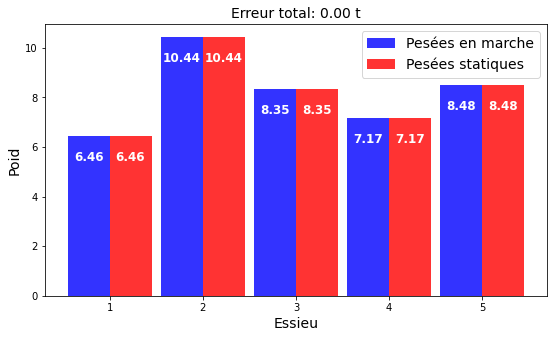

ERREUR :  0.0177010415664256
SPEED :  17.699808448994528
ERREUR :  0.013049985445817924
Comparing weights


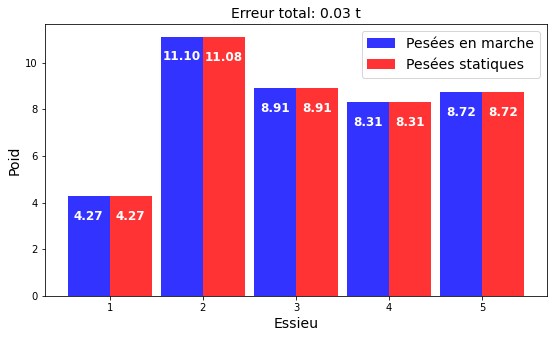

ERREUR :  -2.1316282072803006e-14
Comparing weights


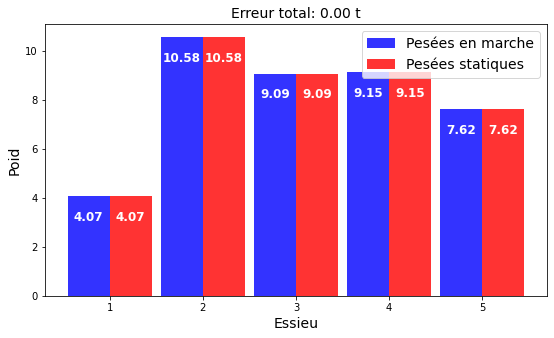

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [270, 355, 478, 507, 533]
position décalage 0
peaks0 :  270
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 478, 508, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 357, 476, 506, 535]
position décalage 0
peaks0 :  274
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  509
Décalage trouvé
decalage found :  509
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 355, 478, 506, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [271, 356, 477, 507, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 478, 507

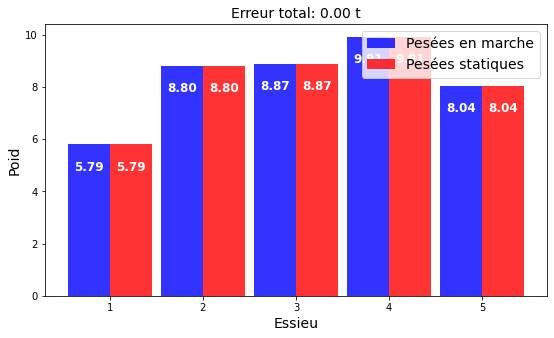

ERREUR :  9.237055564881302e-14
Comparing weights


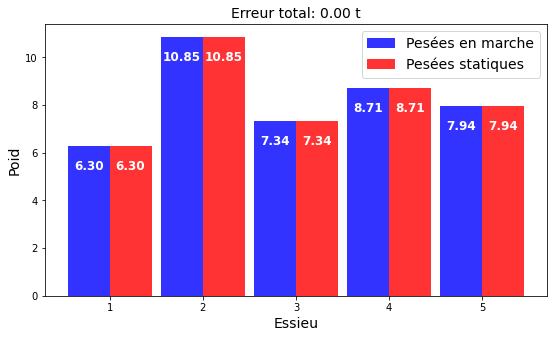

ERREUR :  1.9184653865522705e-13
Comparing weights


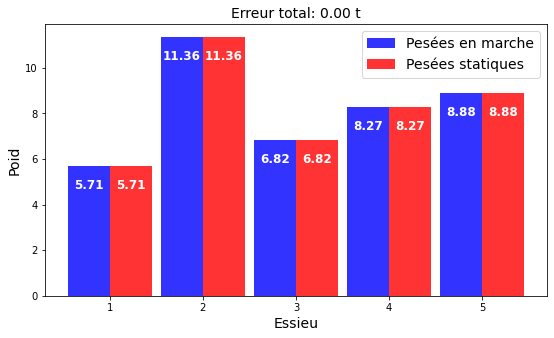

ERREUR :  4.902744876744691e-13
Comparing weights


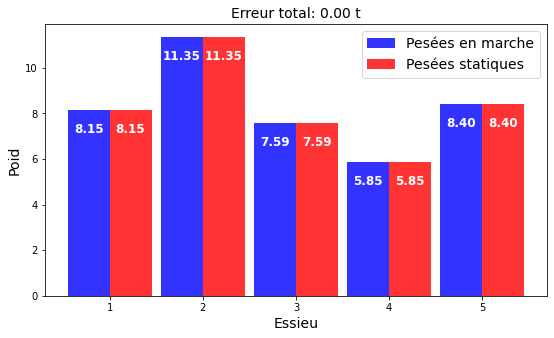

ERREUR :  0.01609638771483901
Comparing weights


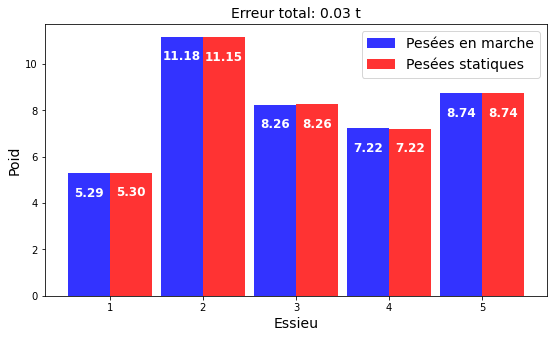

ERREUR :  2.842170943040401e-14
Comparing weights


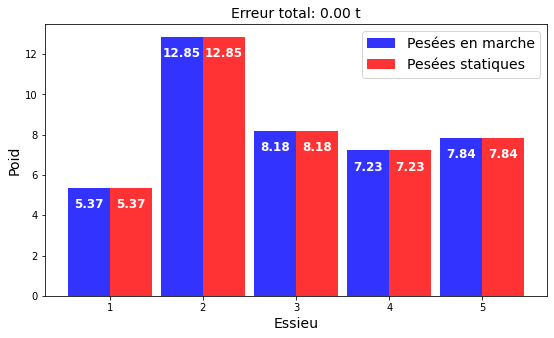

ERREUR :  0.015945315337205557
Comparing weights


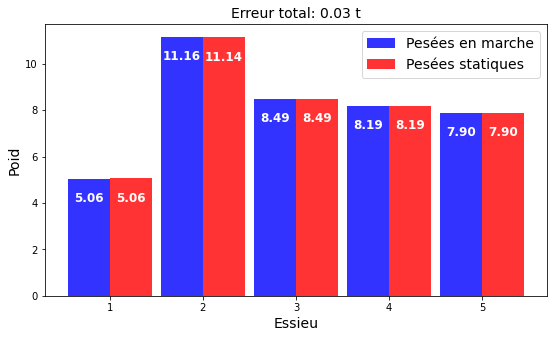

ERREUR :  6.465938895416912e-13
Comparing weights


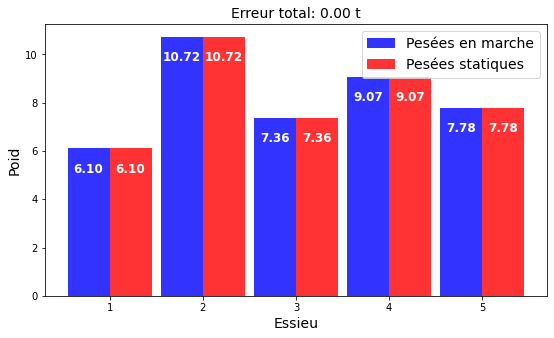

ERREUR :  0.021160604374919956
Comparing weights


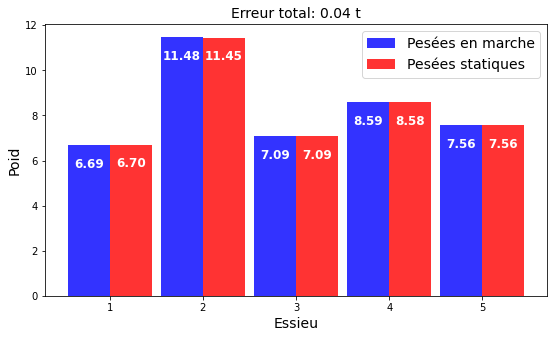

ERREUR :  2.1316282072803006e-13
Comparing weights


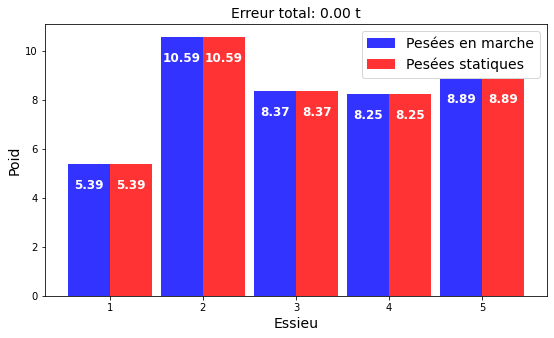

ERREUR :  0.01795294756721688
Comparing weights


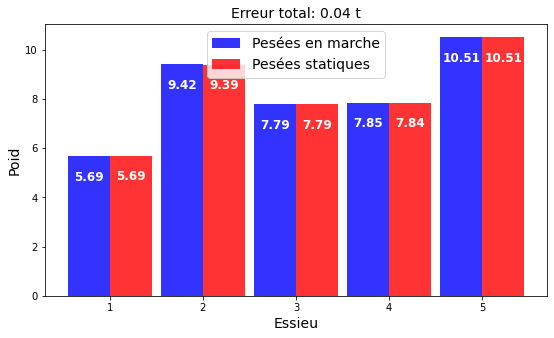

ERREUR :  0.020909874659494676
Comparing weights


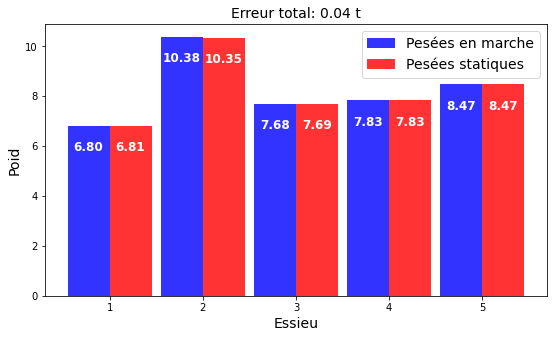

ERREUR :  9.237055564881302e-14
Comparing weights


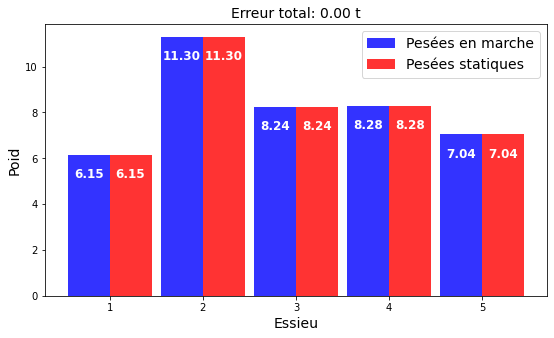

ERREUR :  0.020608475056135944
Comparing weights


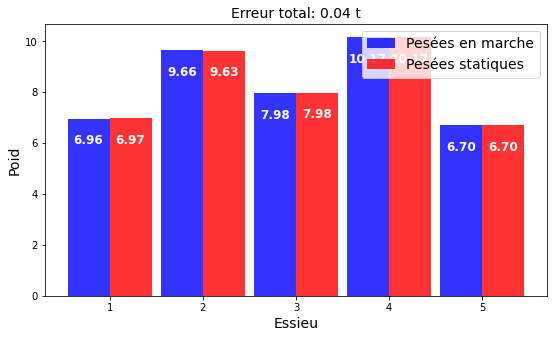

ERREUR :  8.526512829121202e-14
Comparing weights


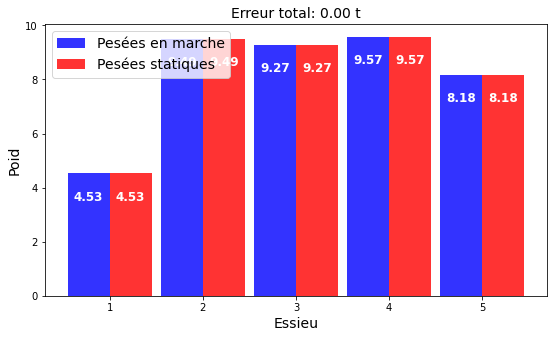

ERREUR :  0.020728329521460864
Comparing weights


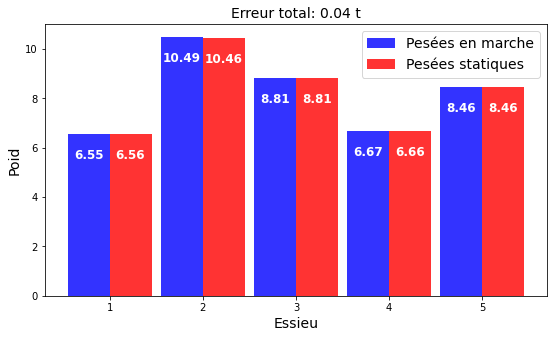

ERREUR :  9.237055564881302e-14
Comparing weights


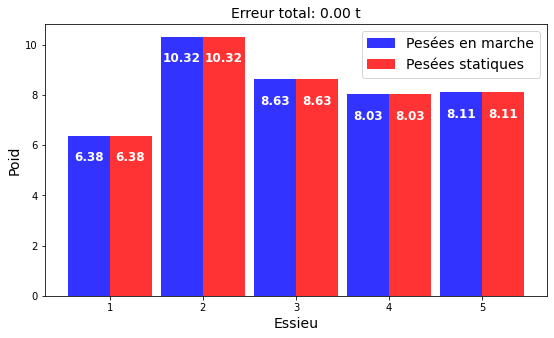

ERREUR :  4.263256414560601e-14
Comparing weights


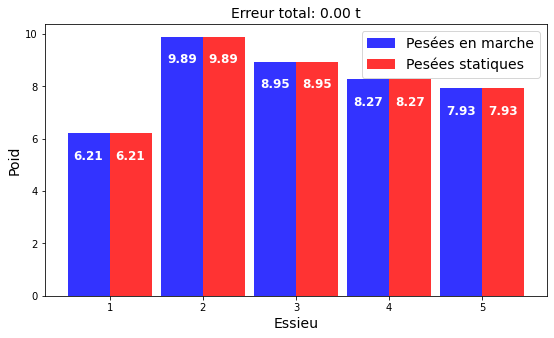

ERREUR :  0.019089481087320337
Comparing weights


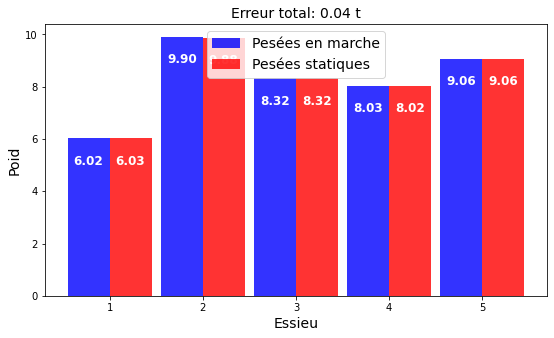

ERREUR :  0.019173788833853678
Comparing weights


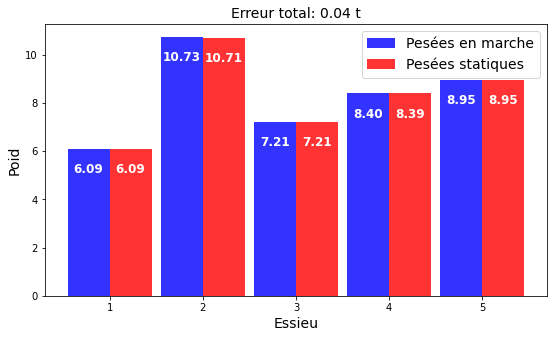

ERREUR :  0.01720660347174885
Comparing weights


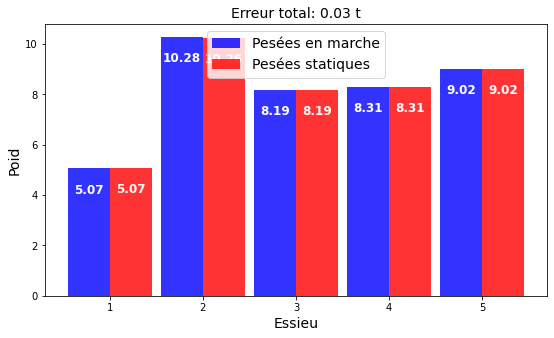

ERREUR :  0.01844599069081454
Comparing weights


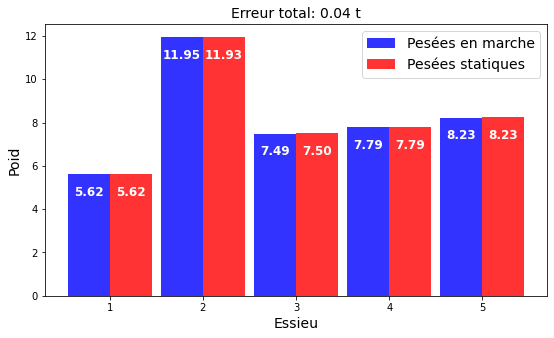

ERREUR :  0.015155734537295018
Comparing weights


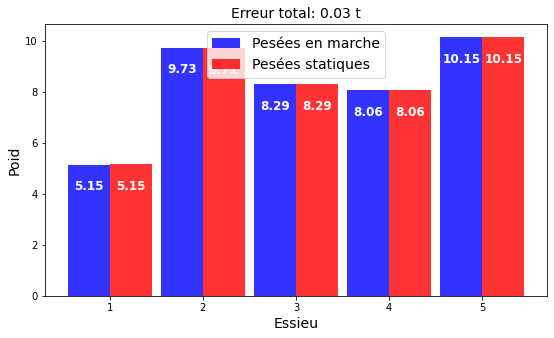

ERREUR :  0.020652930981270856
Comparing weights


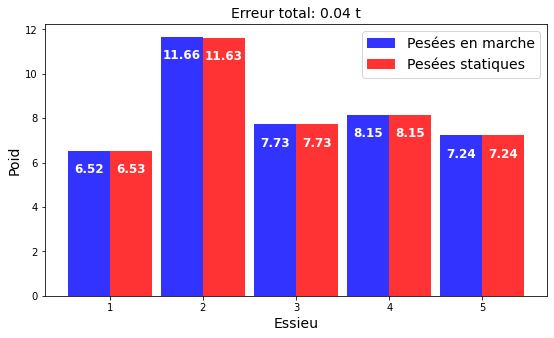

ERREUR :  0.01806648936091193
Comparing weights


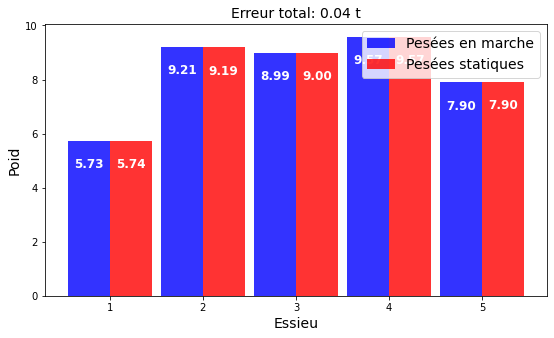

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 356, 478, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 478, 508, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 357, 478, 508, 535]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [270, 355, 476, 507, 535]
position décalage 0
peaks0 :  270
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 355, 478, 506, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 355, 477, 504

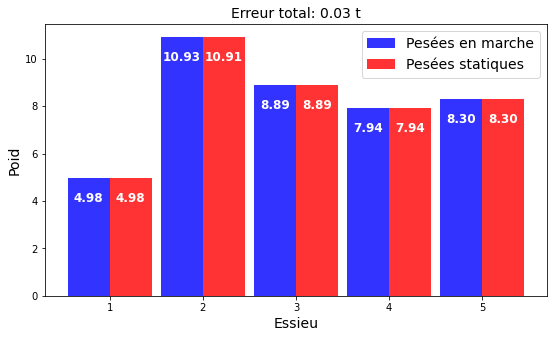

ERREUR :  2.842170943040401e-14
Comparing weights


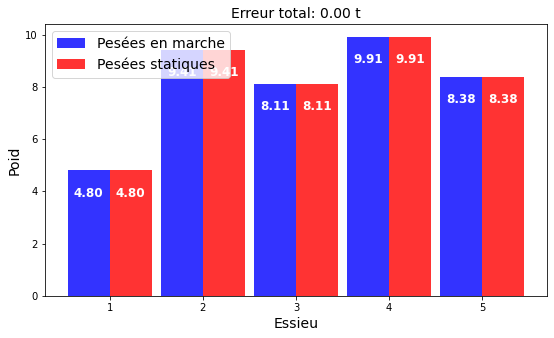

ERREUR :  0.020080026614067492
Comparing weights


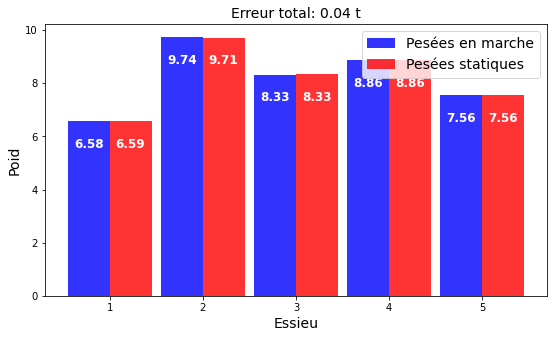

ERREUR :  1.4210854715202004e-14
Comparing weights


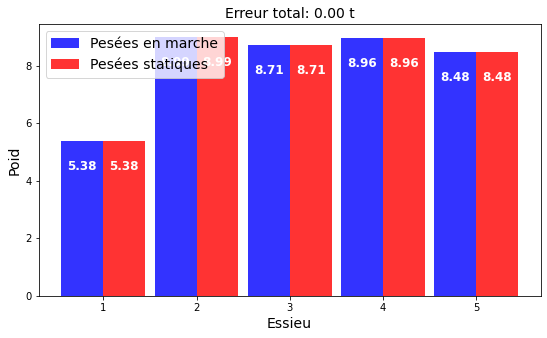

ERREUR :  0.018158624314388305
Comparing weights


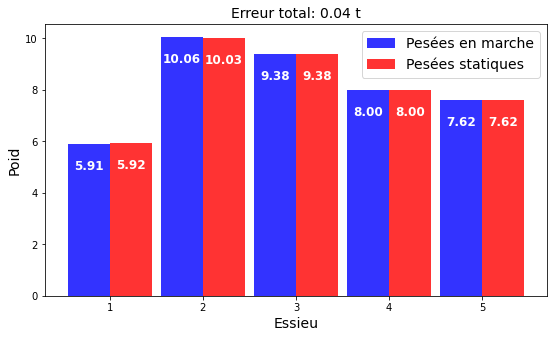

ERREUR :  0.02078720971607595
Comparing weights


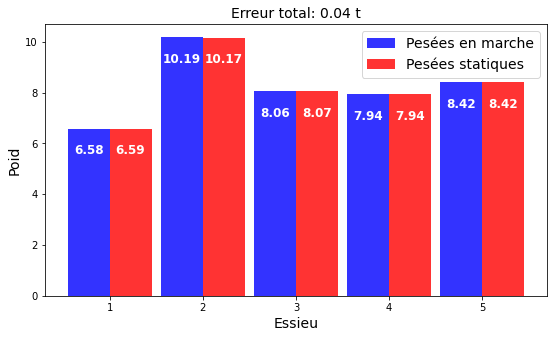

ERREUR :  0.020650298606156525
Comparing weights


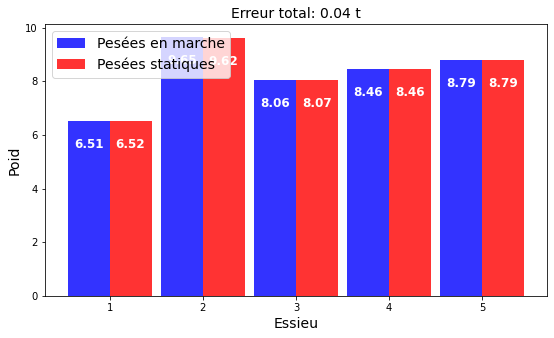

ERREUR :  0.013981045890950838
Comparing weights


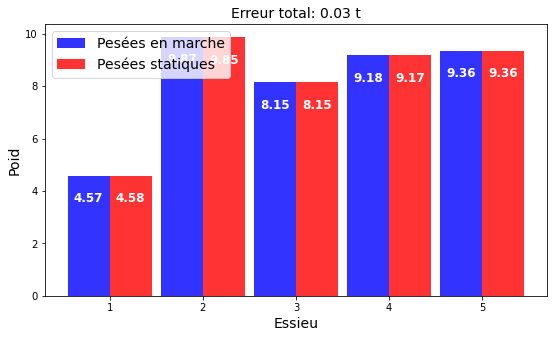

ERREUR :  -7.105427357601002e-15
Comparing weights


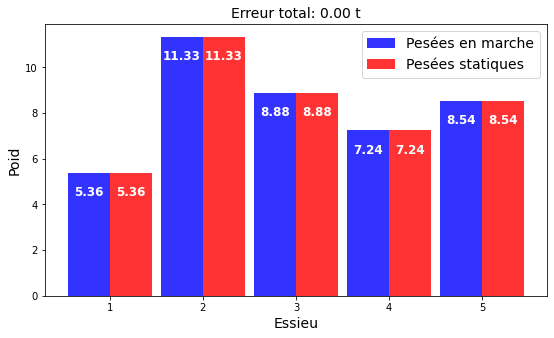

ERREUR :  0.021475957749210295
Comparing weights


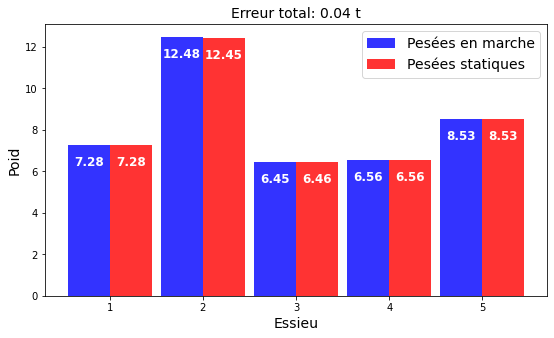

ERREUR :  2.1316282072803006e-14
Comparing weights


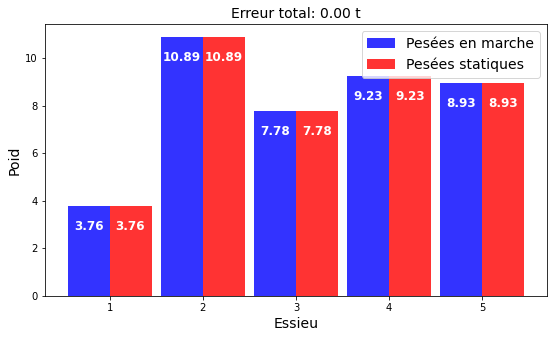

ERREUR :  -7.460698725481052e-13
Comparing weights


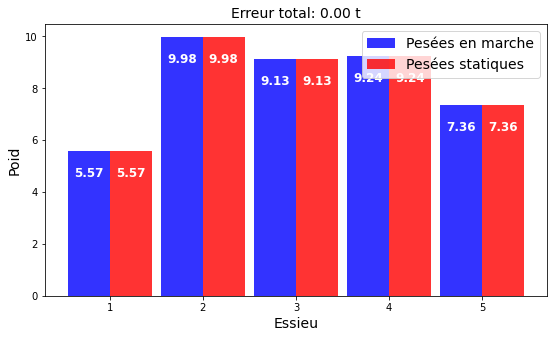

ERREUR :  -7.105427357601002e-15
Comparing weights


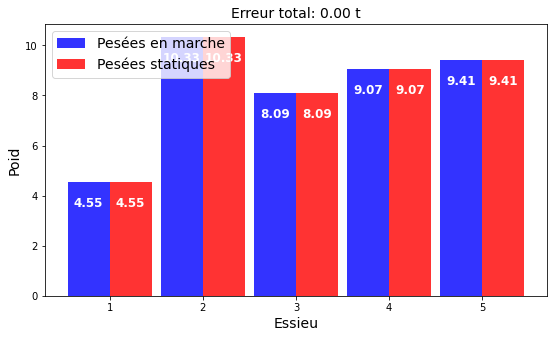

ERREUR :  -1.4210854715202004e-14
SPEED :  15.123703637391838
ERREUR :  -7.105427357601002e-15
Comparing weights


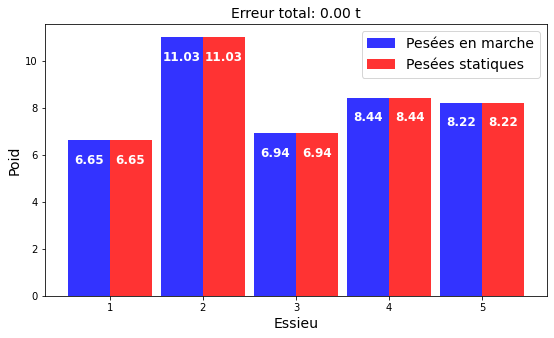

ERREUR :  0.02536401395631316
Comparing weights


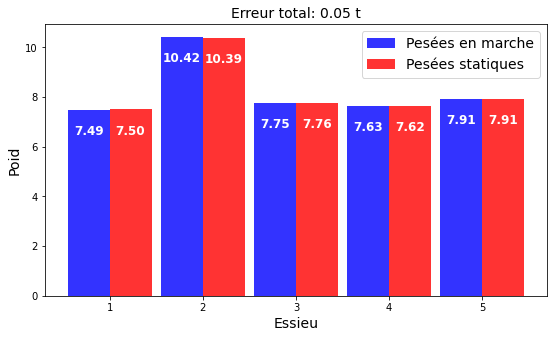

ERREUR :  0.02255759672707569
Comparing weights


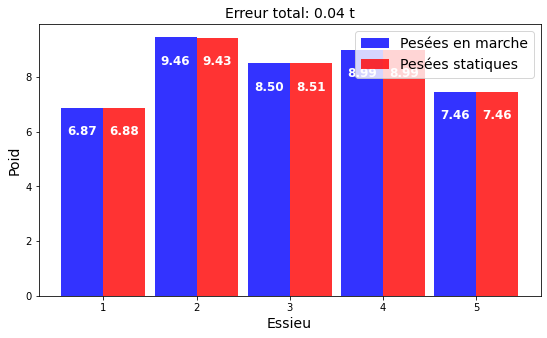

ERREUR :  -5.684341886080802e-14
Comparing weights


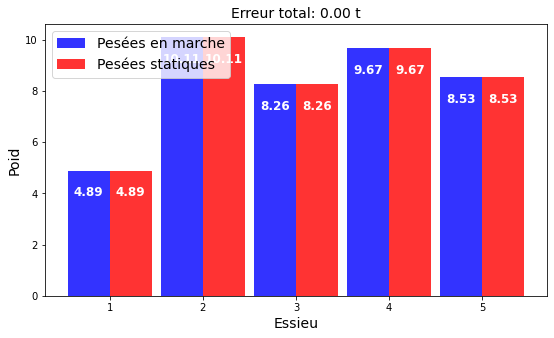

ERREUR :  2.1316282072803006e-14
SPEED :  27.729550971573588
ERREUR :  0.019477819038527855
Comparing weights


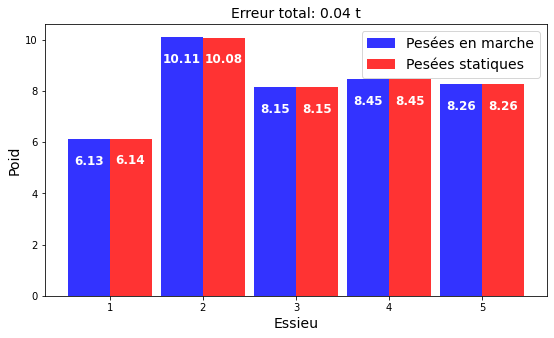

ERREUR :  0.01818343995370242
Comparing weights


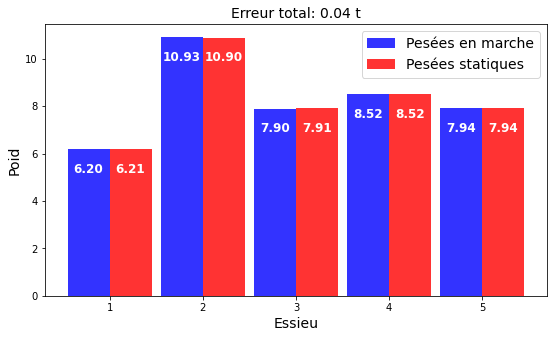

ERREUR :  1.4210854715202004e-14
Comparing weights


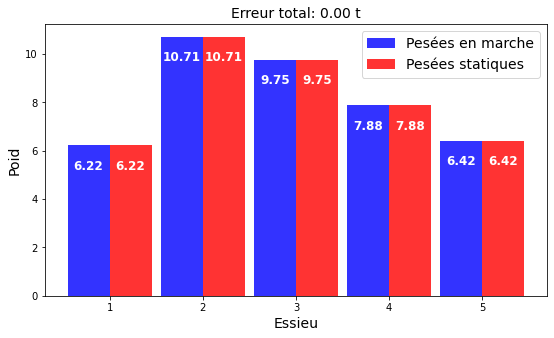

ERREUR :  0.01663437895415143
Comparing weights


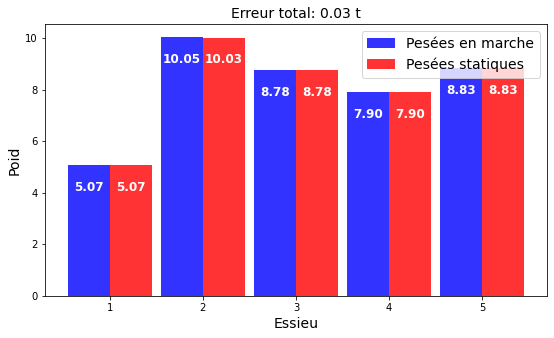

ERREUR :  0.012061130069817239
Comparing weights


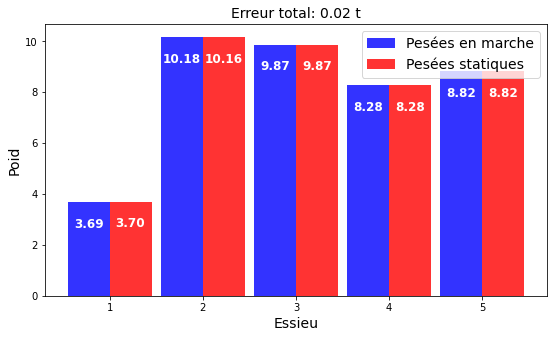

ERREUR :  0.0
Comparing weights


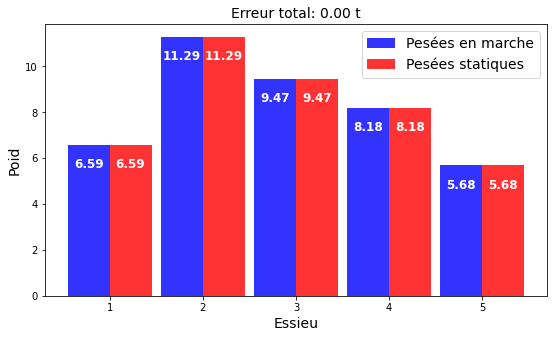

Itération n° : 5/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 355, 476, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 355, 477, 505, 533]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 356, 476, 505, 533]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 355, 478, 508, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 354, 477, 508, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 478, 506

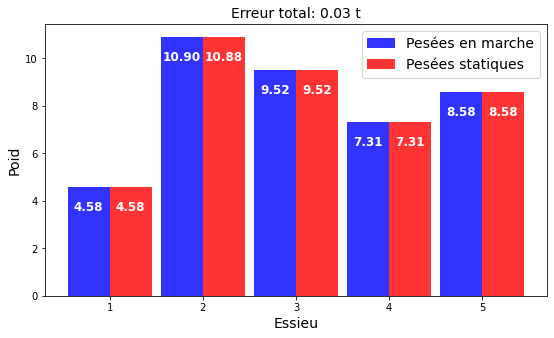

ERREUR :  -2.842170943040401e-14
Comparing weights


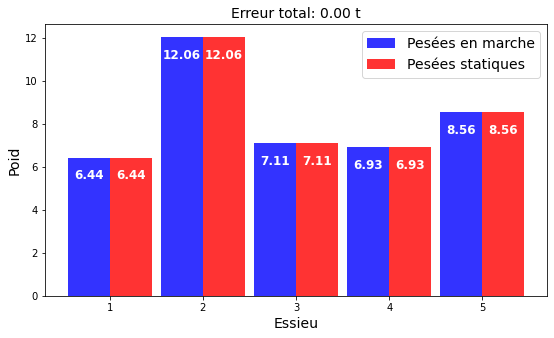

ERREUR :  1.4210854715202004e-14
Comparing weights


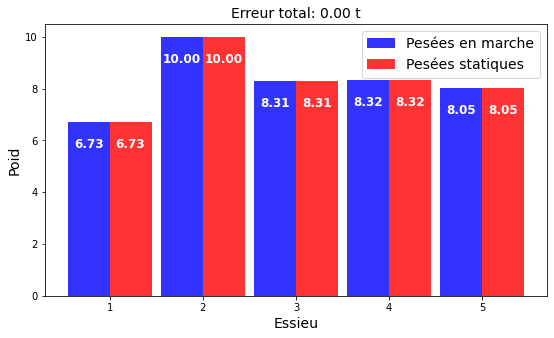

ERREUR :  0.019848882445728577
Comparing weights


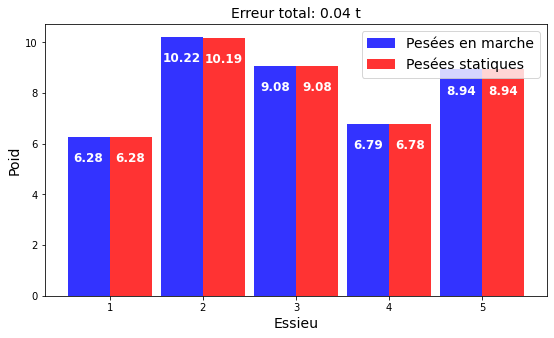

ERREUR :  0.014296415677669927
Comparing weights


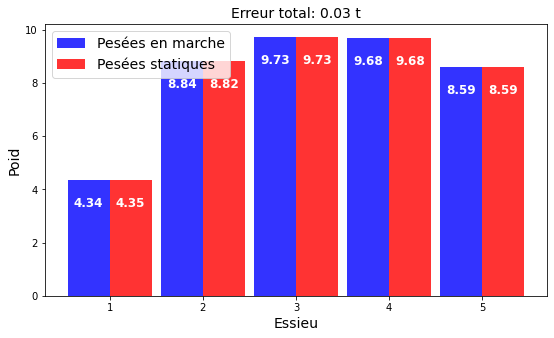

ERREUR :  0.01594759039452498
Comparing weights


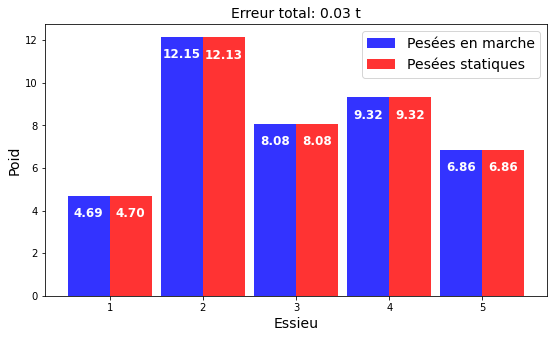

ERREUR :  2.1316282072803006e-14
Comparing weights


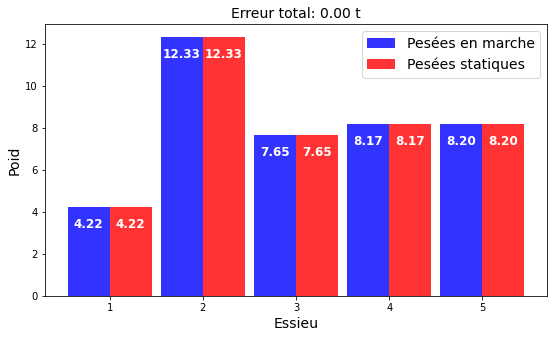

ERREUR :  0.026622460718826346
Comparing weights


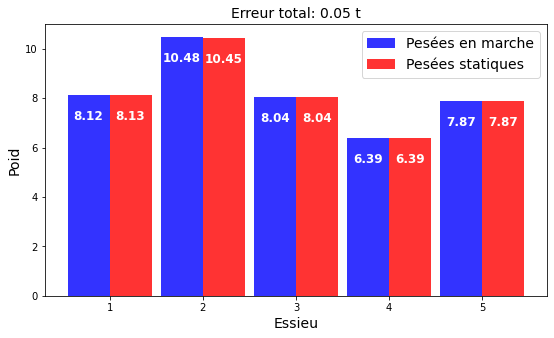

ERREUR :  2.842170943040401e-14
Comparing weights


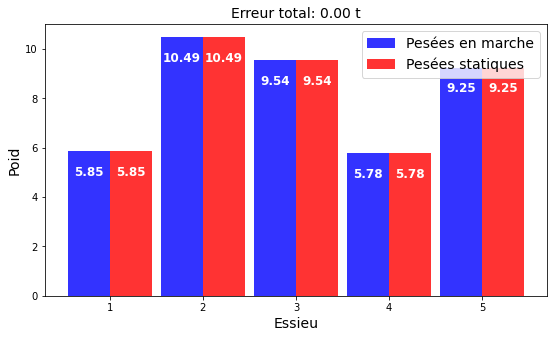

ERREUR :  -1.5560885913146194e-12
Comparing weights


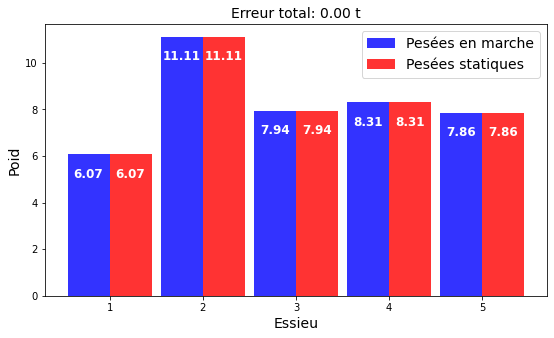

ERREUR :  -7.105427357601002e-15
Comparing weights


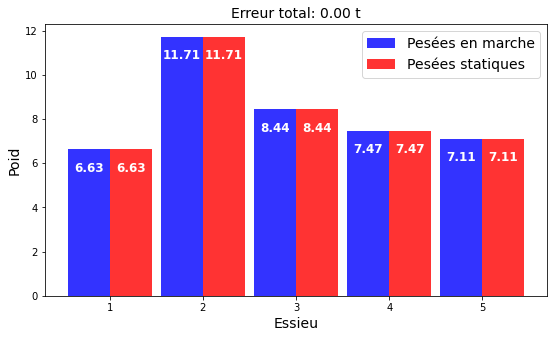

ERREUR :  0.016083700668005463
Comparing weights


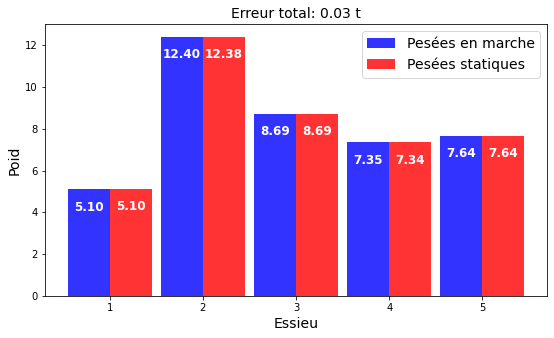

ERREUR :  -1.0231815394945443e-12
Comparing weights


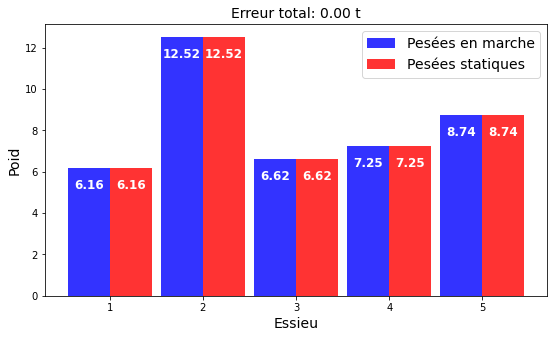

ERREUR :  -4.973799150320701e-14
Comparing weights


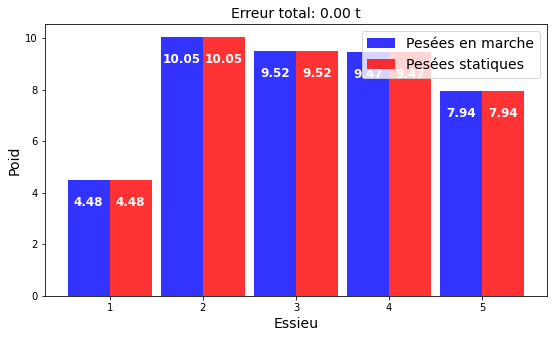

ERREUR :  -1.2079226507921703e-13
Comparing weights


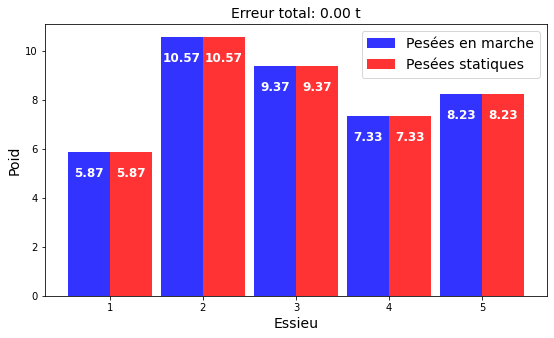

ERREUR :  -1.9895196601282805e-13
Comparing weights


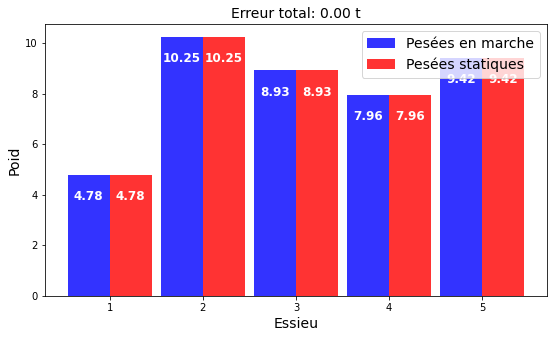

ERREUR :  -5.733685270570277e-06
Comparing weights


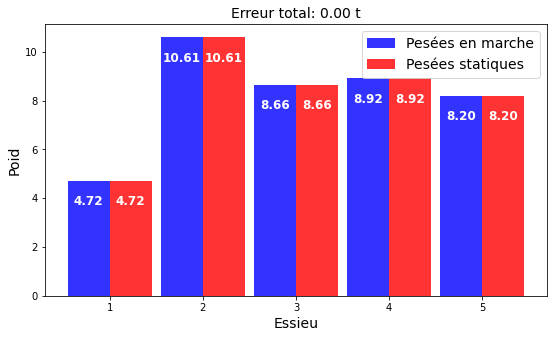

ERREUR :  0.021582811973487992
SPEED :  23.90559867498841
ERREUR :  0.015967999177355807
SPEED :  24.0417368156309
ERREUR :  0.014831004360431166
Comparing weights


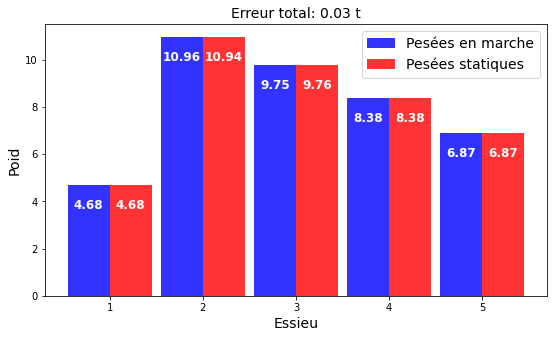

ERREUR :  1.2363443602225743e-12
Comparing weights


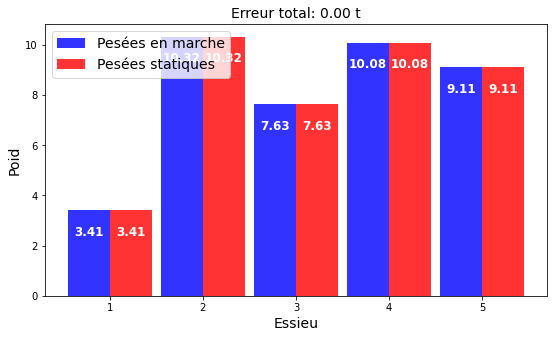

ERREUR :  3.765876499528531e-13
Comparing weights


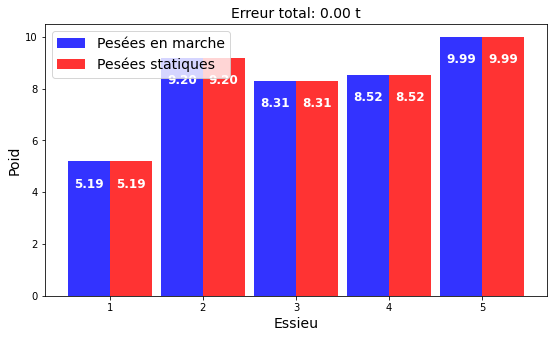

ERREUR :  0.01691777948336437
Comparing weights


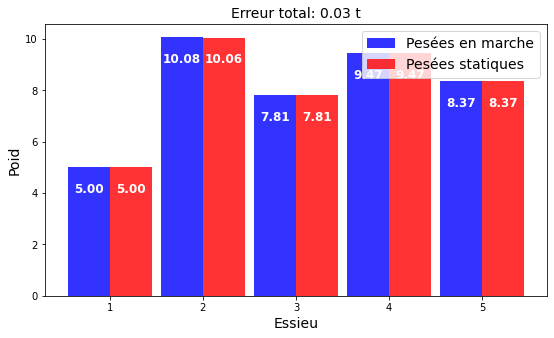

ERREUR :  0.01253045411878162
Comparing weights


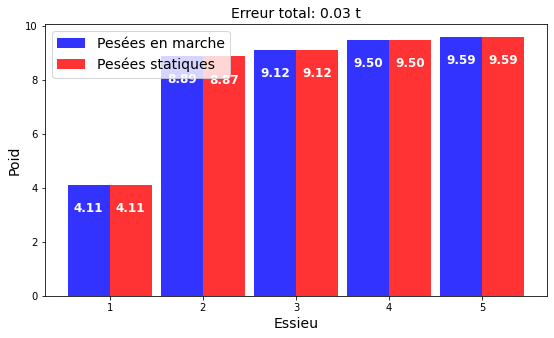

ERREUR :  -9.023892744153272e-13
Comparing weights


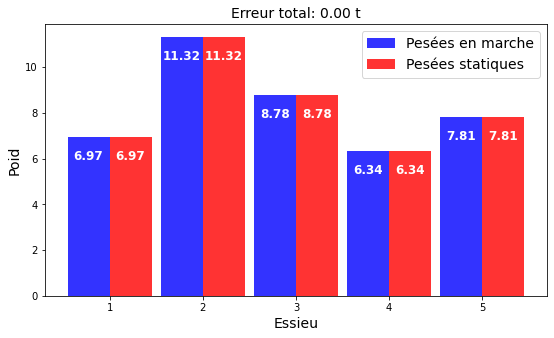

SIGMA FOR NOISE :  0.016666666666666666
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 357, 478, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 355, 478, 504, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  504
Décalage trouvé
decalage found :  504
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 357, 478, 507, 535]
posit

Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 357, 478, 508, 533]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 354, 477, 506, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :

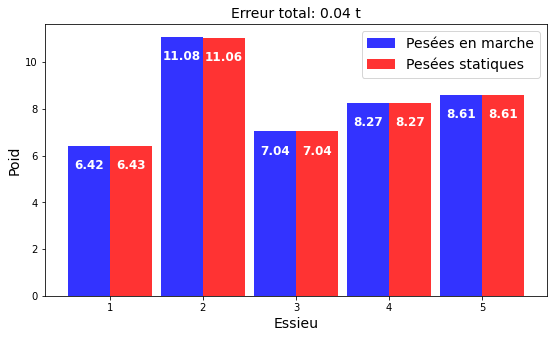

ERREUR :  7.105427357601002e-15
Comparing weights


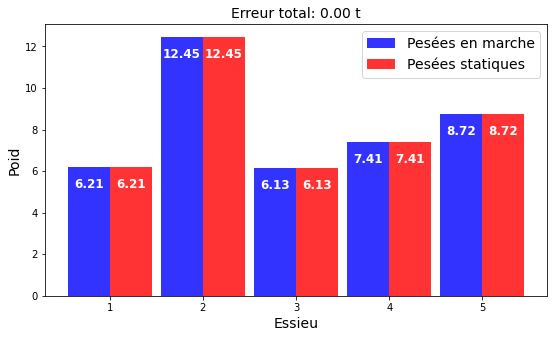

ERREUR :  -1.4210854715202004e-14
Comparing weights


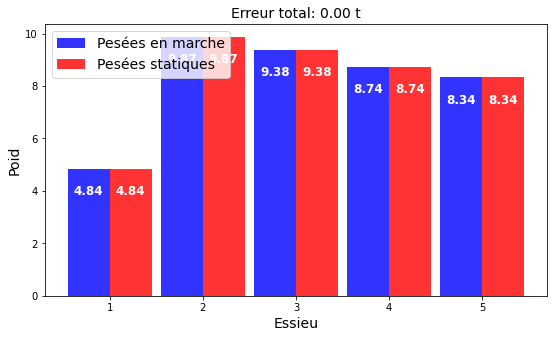

ERREUR :  0.01707040369440449
Comparing weights


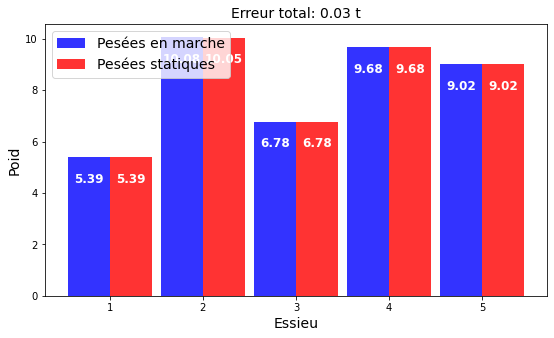

ERREUR :  0.020348809262188183
Comparing weights


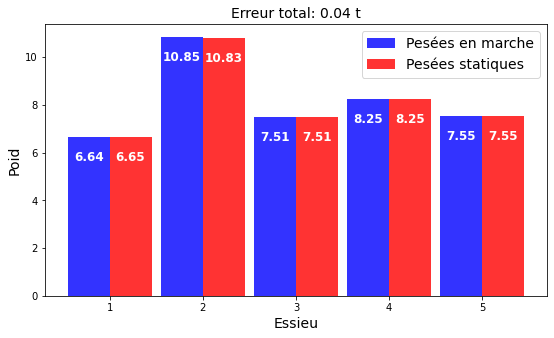

ERREUR :  -2.1316282072803006e-14
Comparing weights


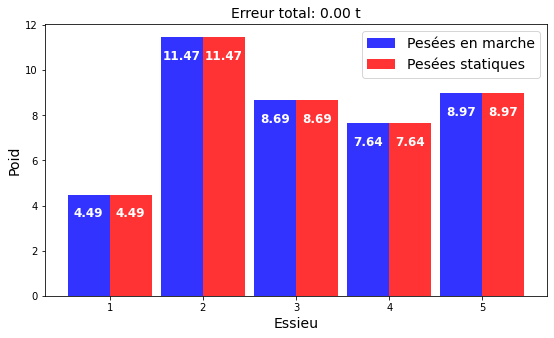

ERREUR :  0.018187804189018664
Comparing weights


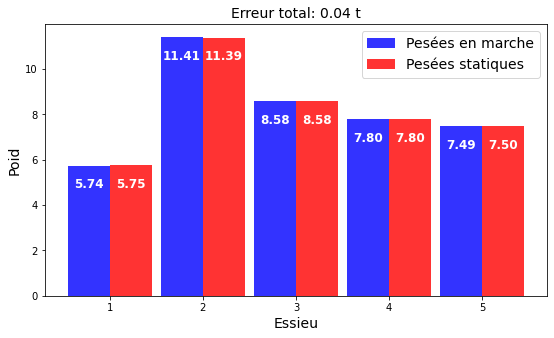

ERREUR :  0.017909475541365794
Comparing weights


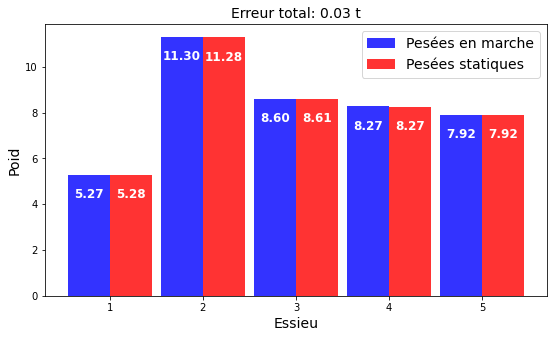

ERREUR :  0.0
Comparing weights


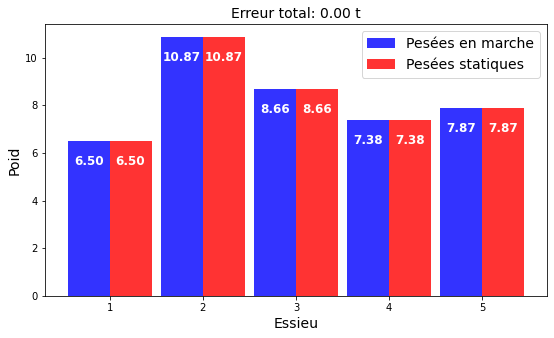

ERREUR :  4.973799150320701e-14
Comparing weights


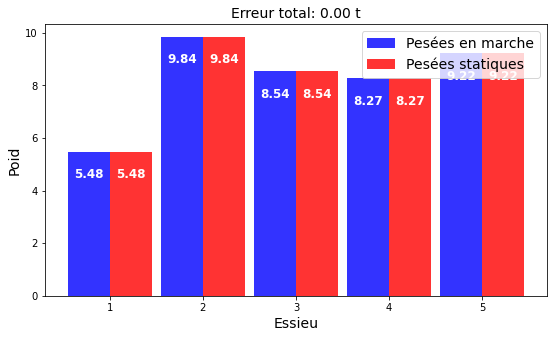

ERREUR :  0.01997015758209386
Comparing weights


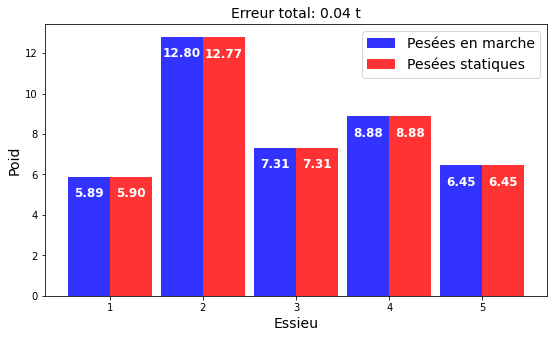

ERREUR :  -7.105427357601002e-15
Comparing weights


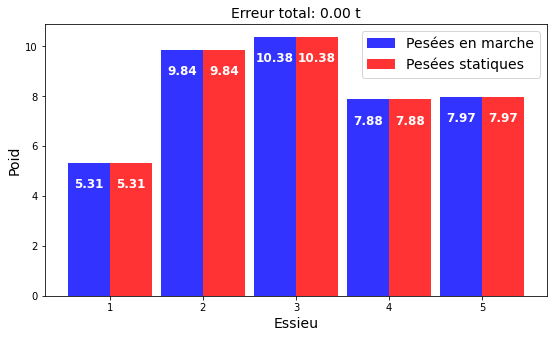

ERREUR :  3.552713678800501e-14
Comparing weights


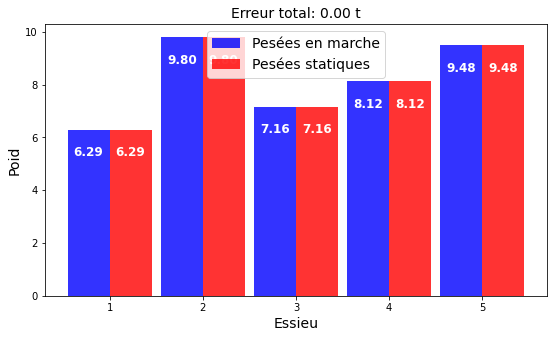

ERREUR :  6.394884621840902e-14
Comparing weights


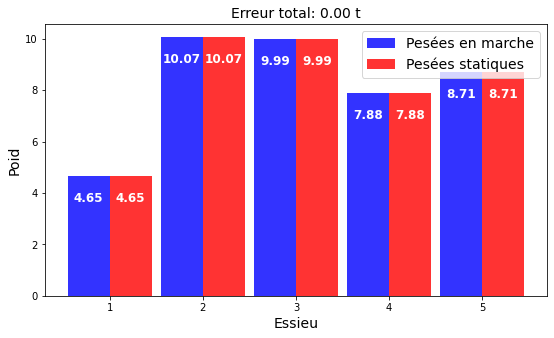

ERREUR :  -2.3803181647963356e-12
SPEED :  25.529020936784423
ERREUR :  7.105427357601002e-15
Comparing weights


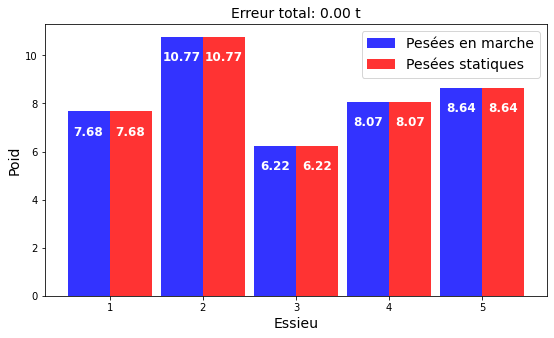

ERREUR :  -1.4210854715202004e-14
Comparing weights


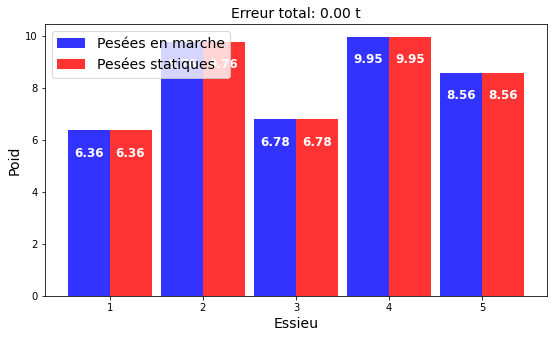

ERREUR :  0.017508430091751848
Comparing weights


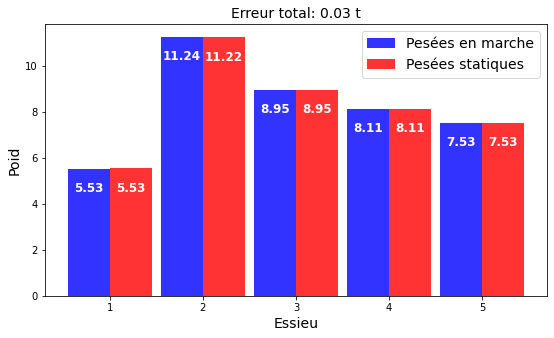

ERREUR :  0.017142302677328303
Comparing weights


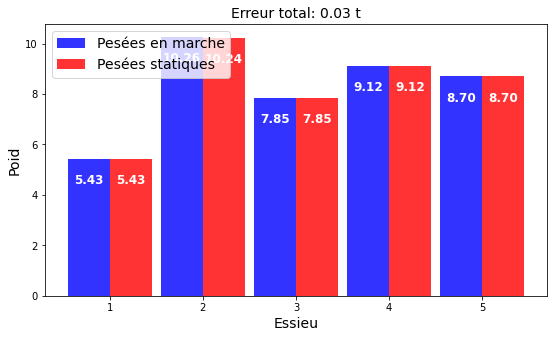

ERREUR :  0.015877612288946352
Comparing weights


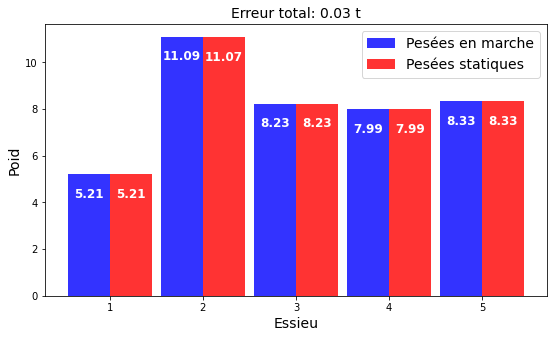

ERREUR :  8.526512829121202e-14
Comparing weights


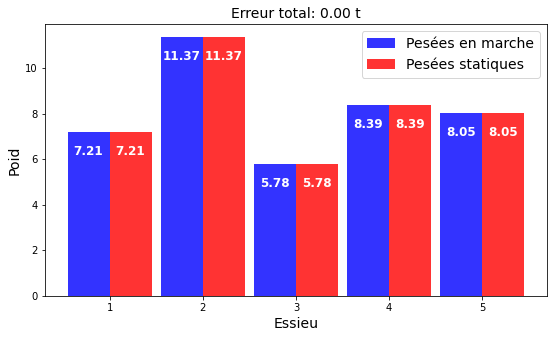

ERREUR :  0.016990571635631113
Comparing weights


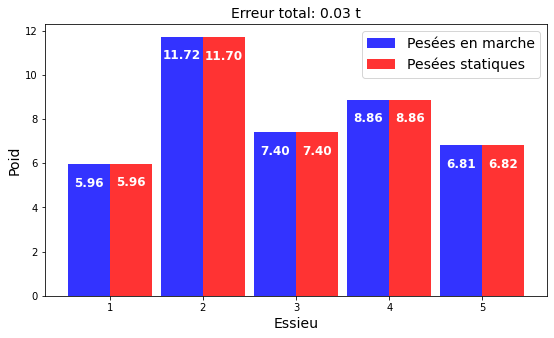

ERREUR :  2.1316282072803006e-14
Comparing weights


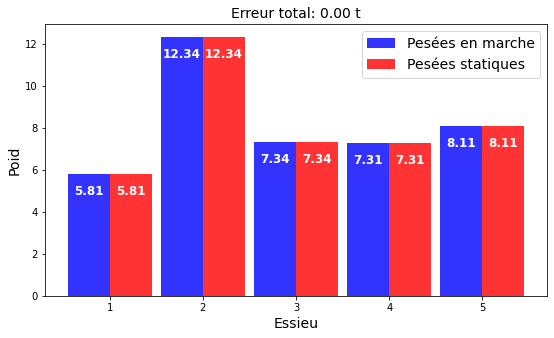

ERREUR :  -4.973799150320701e-14
Comparing weights


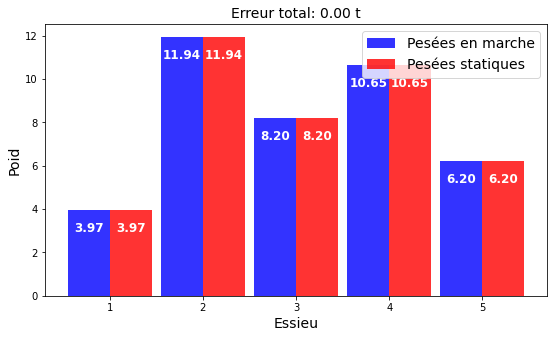

ERREUR :  0.01876179603306838
SPEED :  18.066064504101753
Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 355, 479, 508, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 355, 476, 507, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 355, 47

Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  509
Décalage trouvé
decalage found :  509
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 478, 508, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 479, 507, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :

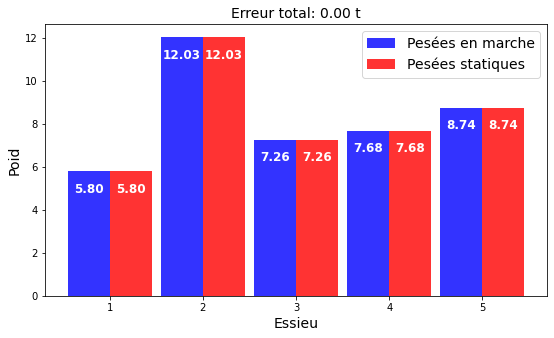

ERREUR :  5.471179065352771e-13
Comparing weights


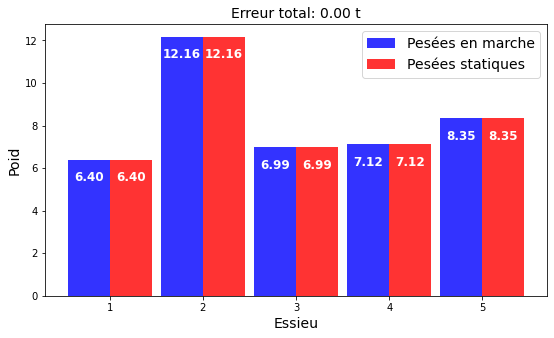

ERREUR :  0.02002770409844601
Comparing weights


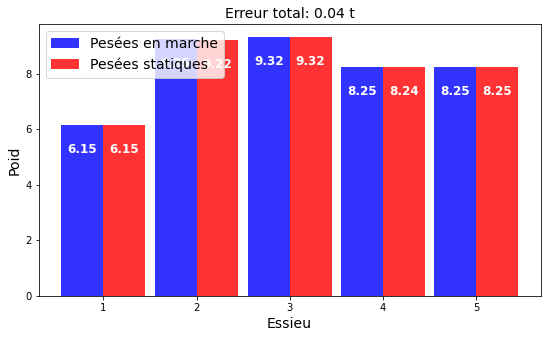

ERREUR :  0.017920743941566286
Comparing weights


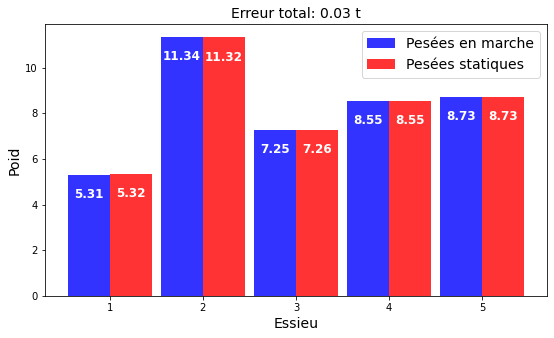

ERREUR :  0.025775911828333165
Comparing weights


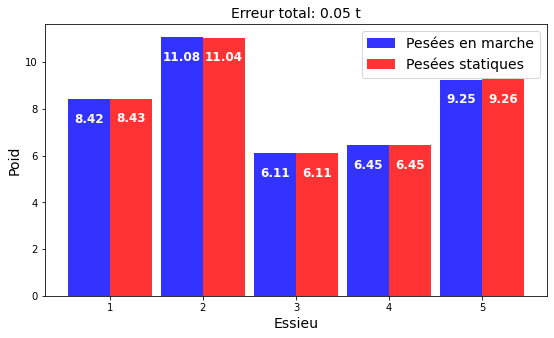

ERREUR :  -2.1742607714259066e-12
SPEED :  16.222205417158914
ERREUR :  0.02269052504935587
Comparing weights


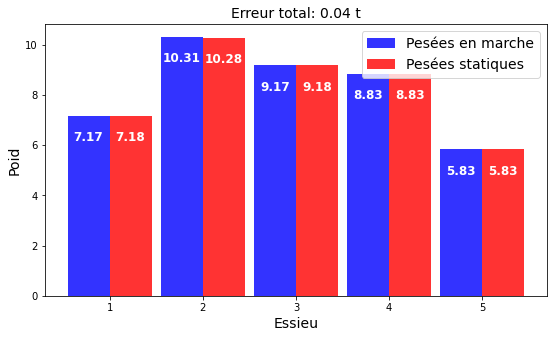

ERREUR :  0.019093987681060298
Comparing weights


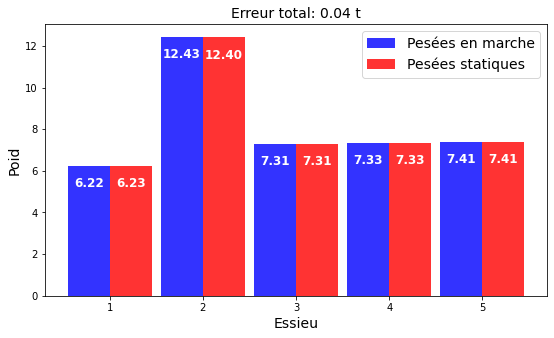

ERREUR :  2.2737367544323206e-13
Comparing weights


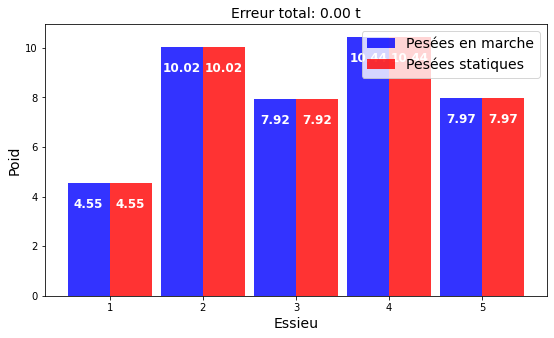

ERREUR :  0.02550165920602865
SPEED :  24.391872689651986
ERREUR :  5.684341886080802e-14
Comparing weights


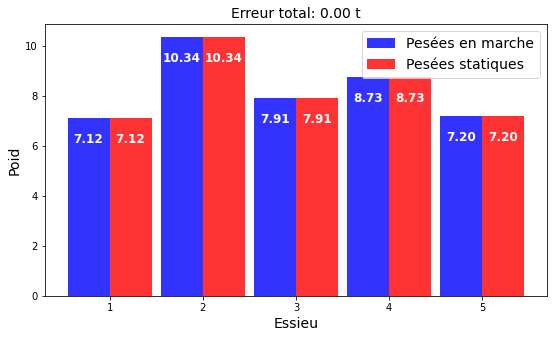

ERREUR :  0.020258712847862625
Comparing weights


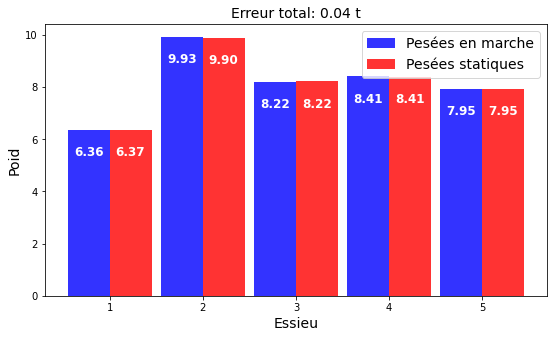

ERREUR :  0.017312739490456863
SPEED :  17.901007177322036
ERREUR :  -8.526512829121202e-14
Comparing weights


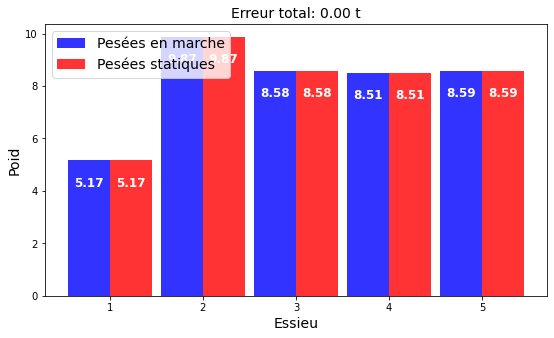

ERREUR :  -1.4210854715202004e-14
Comparing weights


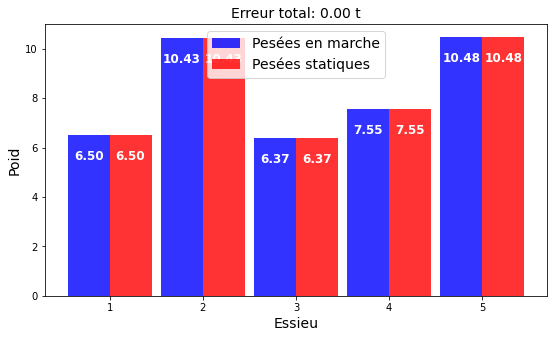

ERREUR :  0.019161216633030165
Comparing weights


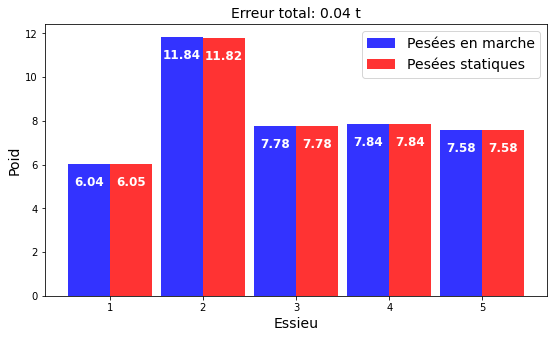

ERREUR :  -9.947598300641403e-13
SPEED :  17.555865712379315
ERREUR :  0.016917493392362815
Comparing weights


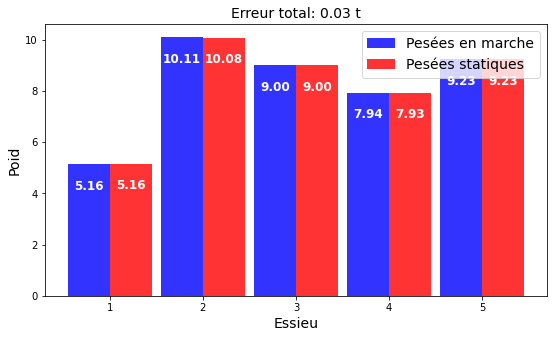

ERREUR :  0.017179534682206565
Comparing weights


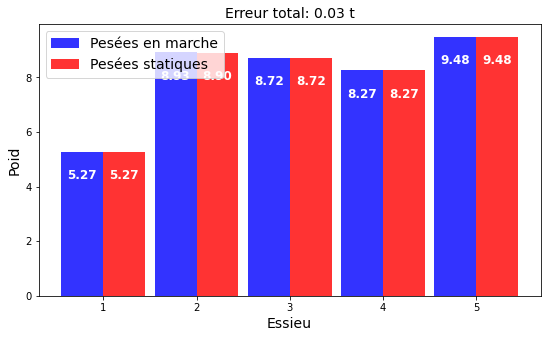

ERREUR :  0.018330664576225786
SPEED :  17.91428744625847
ERREUR :  4.263256414560601e-14
Comparing weights


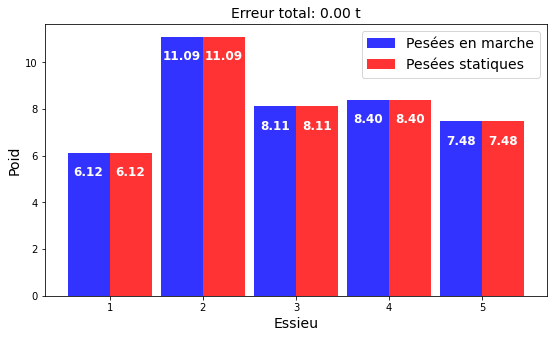

ERREUR :  7.105427357601002e-15
Comparing weights


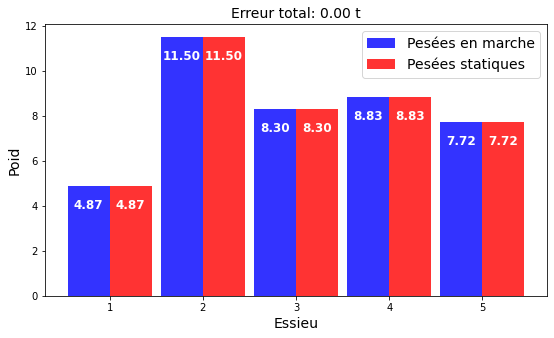

ERREUR :  0.019623074687700637
Comparing weights


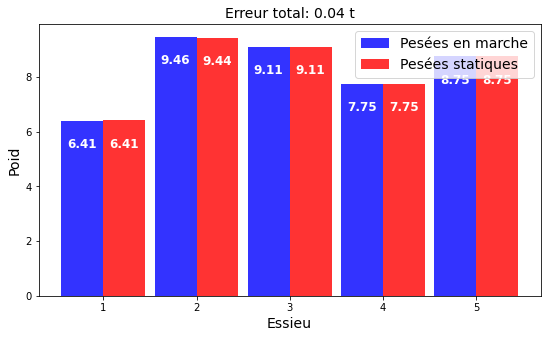

ERREUR :  7.105427357601002e-15
Comparing weights


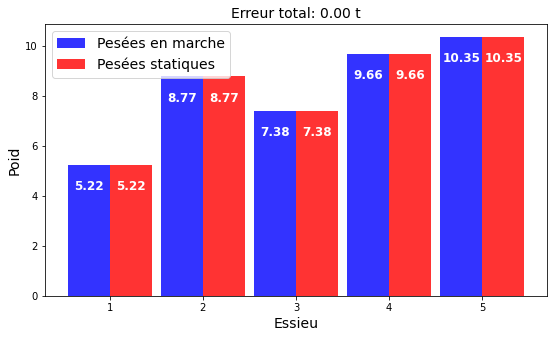

ERREUR :  1.3500311979441904e-13
Comparing weights


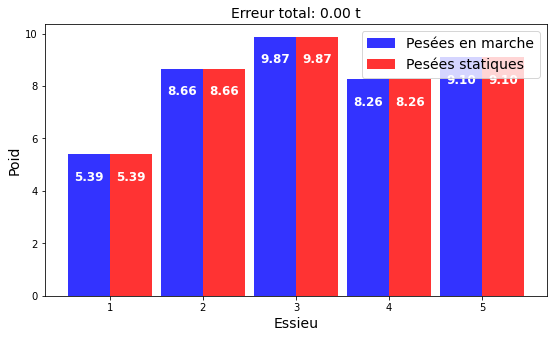

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 356, 478, 506, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 478, 508, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [274, 356, 478, 506, 535]
position décalage 0
peaks0 :  274
Décalage tr

Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 355, 477, 507, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 354, 476, 506, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [274, 356, 477, 508

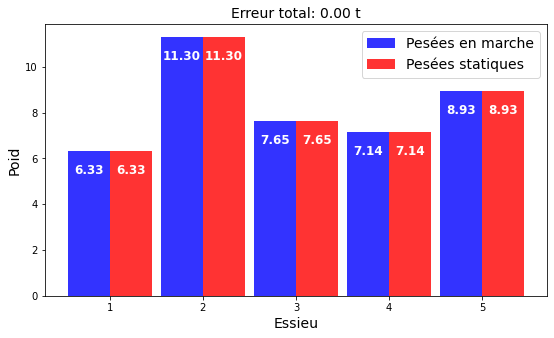

ERREUR :  0.012396945962699135
Comparing weights


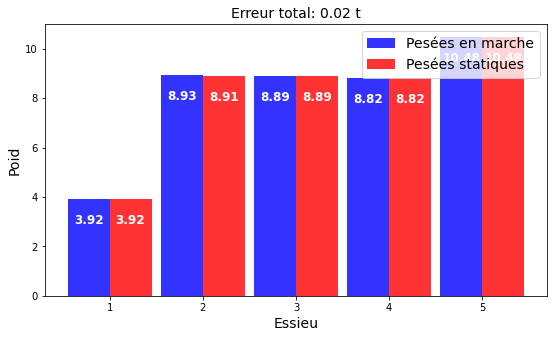

ERREUR :  -7.105427357601002e-15
Comparing weights


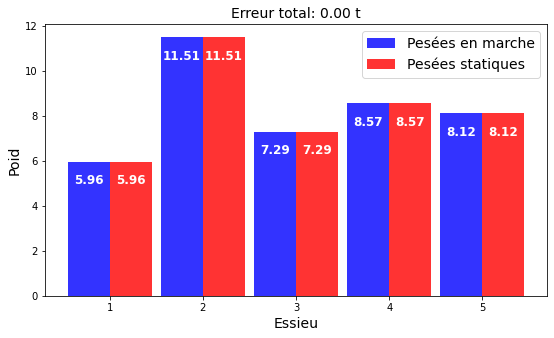

ERREUR :  0.0
Comparing weights


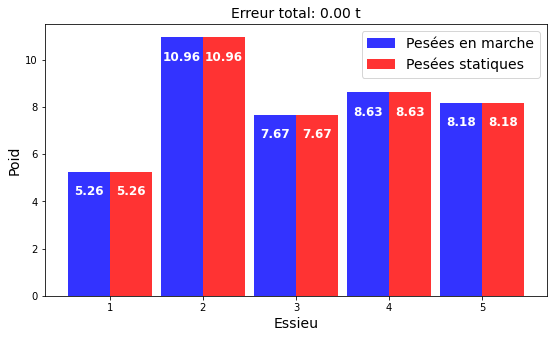

ERREUR :  -1.4210854715202004e-14
Comparing weights


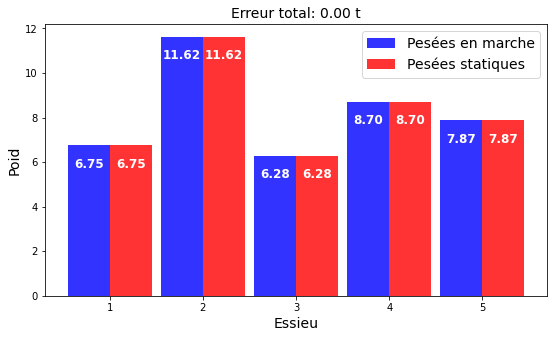

ERREUR :  0.0178029736437324
Comparing weights


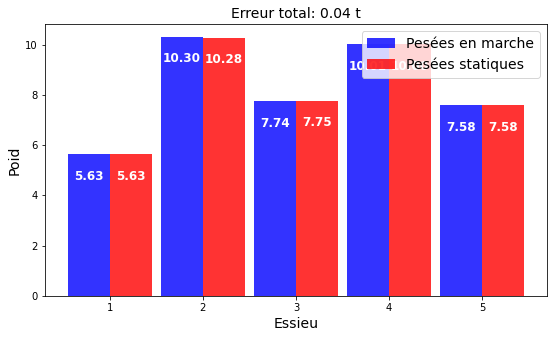

ERREUR :  -1.4210854715202004e-14
Comparing weights


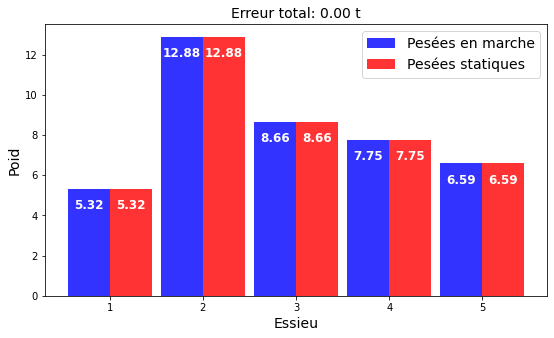

ERREUR :  6.394884621840902e-14
Comparing weights


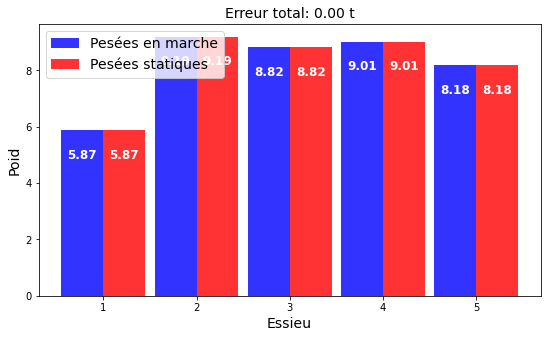

ERREUR :  1.4210854715202004e-14
Comparing weights


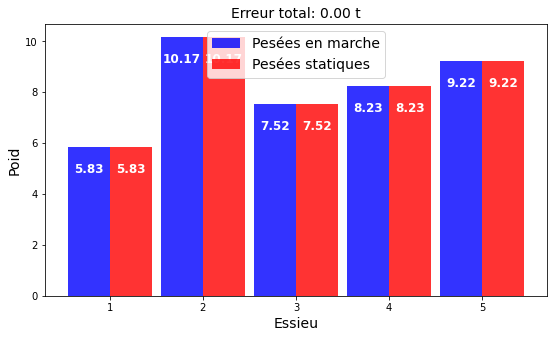

ERREUR :  -2.1316282072803006e-14
Comparing weights


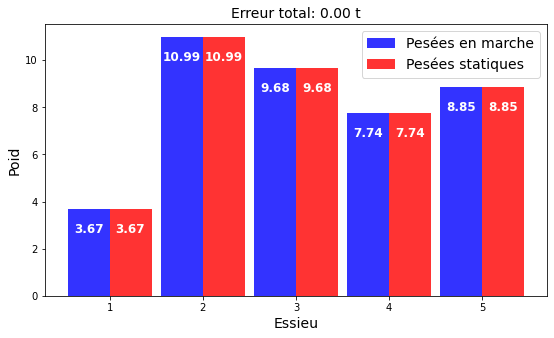

ERREUR :  0.019352518668142693
Comparing weights


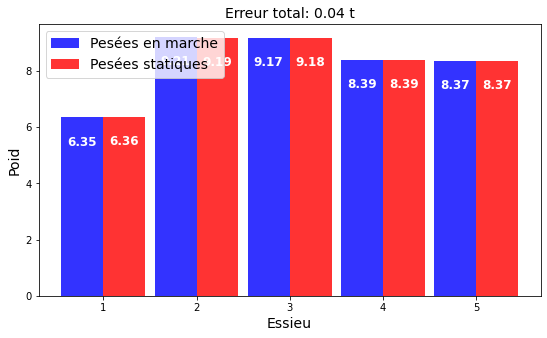

ERREUR :  0.017900375171024052
Comparing weights


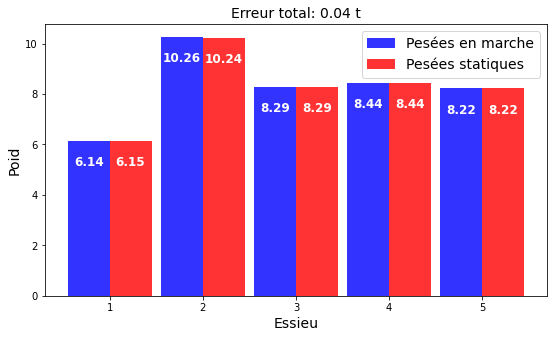

ERREUR :  0.02132226679123761
Comparing weights


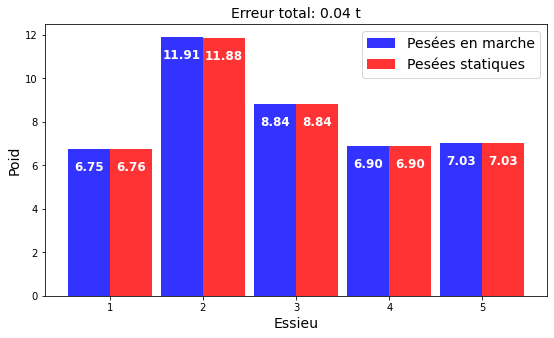

ERREUR :  1.7053025658242404e-13
Comparing weights


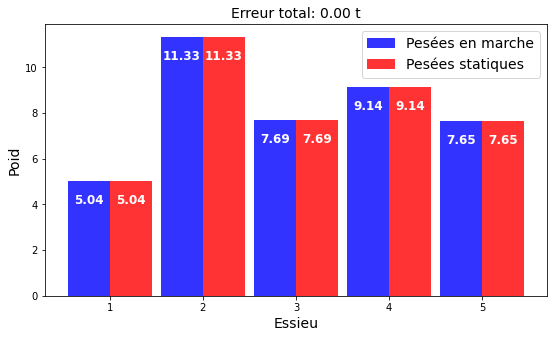

ERREUR :  0.017945318805658417
Comparing weights


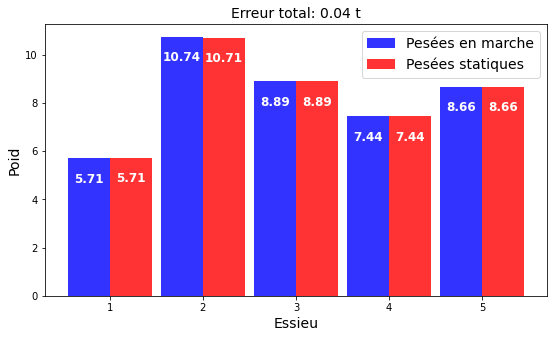

ERREUR :  0.018147085543724017
Comparing weights


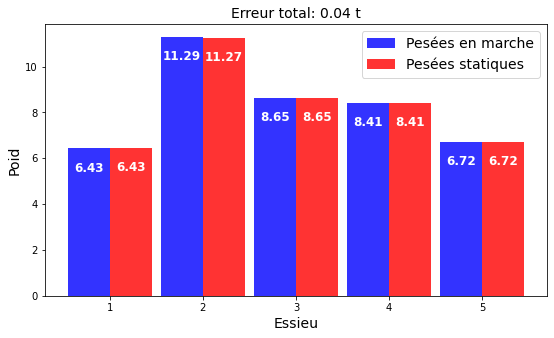

ERREUR :  6.394884621840902e-14
Comparing weights


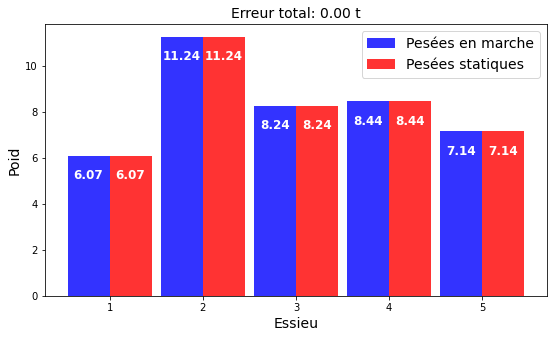

ERREUR :  0.019907106359923432
Comparing weights


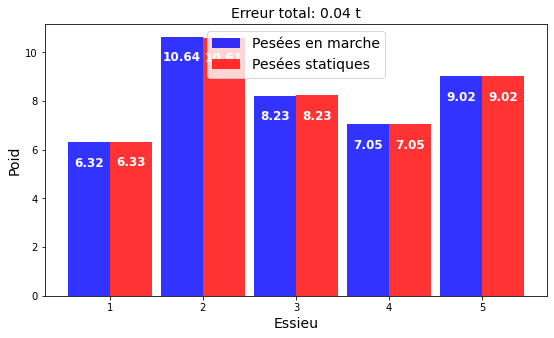

ERREUR :  -7.105427357601002e-14
Comparing weights


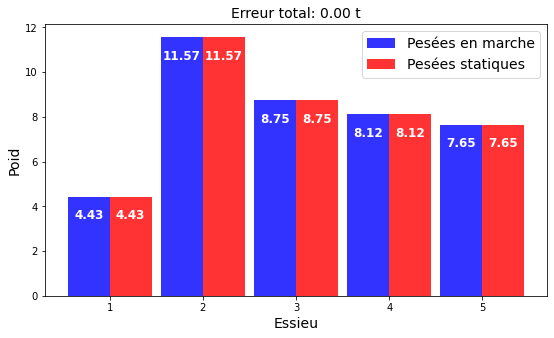

ERREUR :  0.012776682820302199
Comparing weights


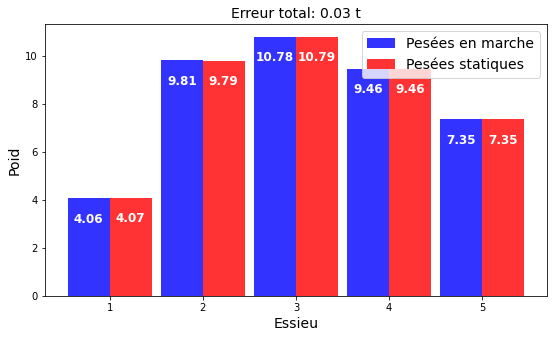

ERREUR :  0.015820039640836114
Comparing weights


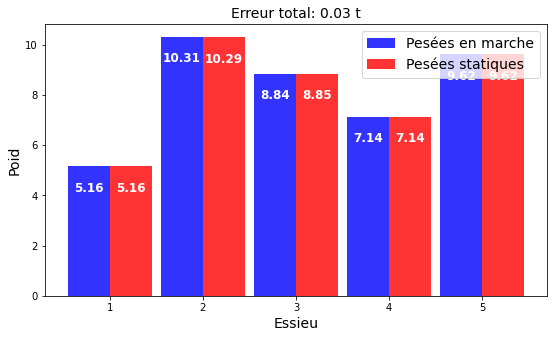

ERREUR :  0.013419459744056894
Comparing weights


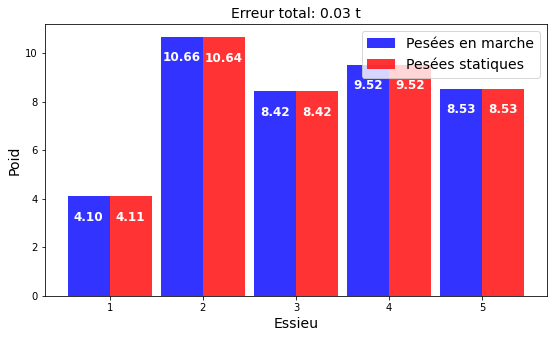

ERREUR :  -7.105427357601002e-15
Comparing weights


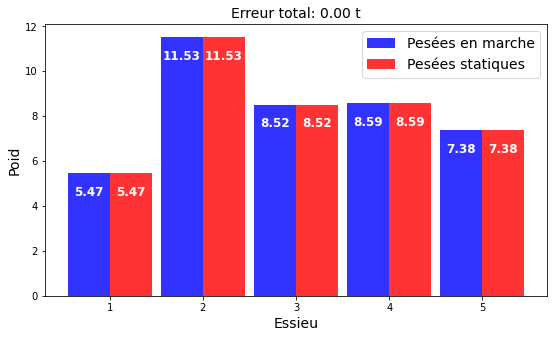

ERREUR :  3.552713678800501e-14
Comparing weights


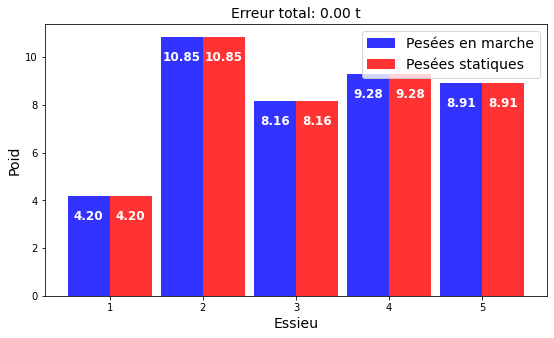

ERREUR :  2.842170943040401e-14
Comparing weights


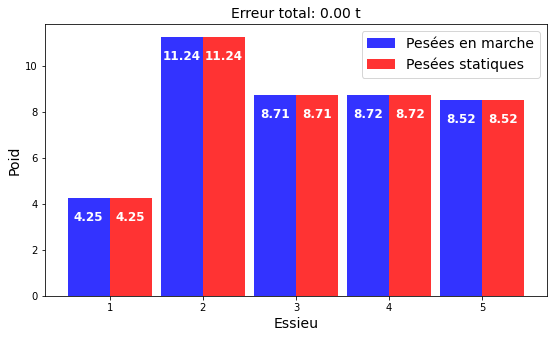

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 356, 478, 508, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 357, 476, 507, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 479, 507, 533]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 477, 507, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 354, 478, 505, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 355, 477, 507

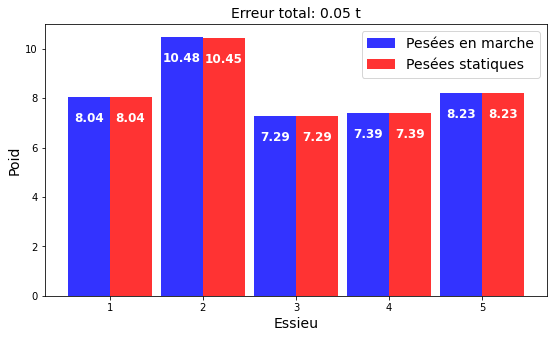

ERREUR :  -1.3500311979441904e-13
Comparing weights


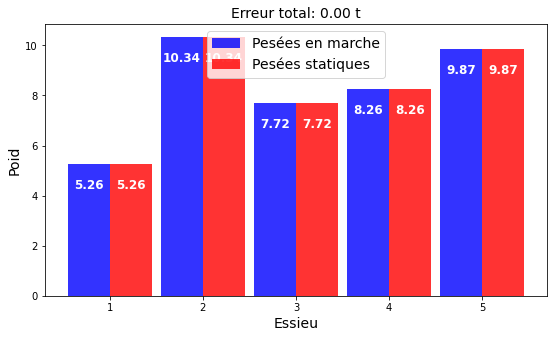

ERREUR :  -0.029504313872884325
Comparing weights


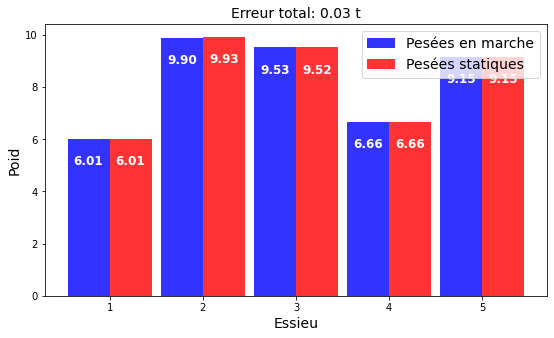

ERREUR :  1.4210854715202004e-14
Comparing weights


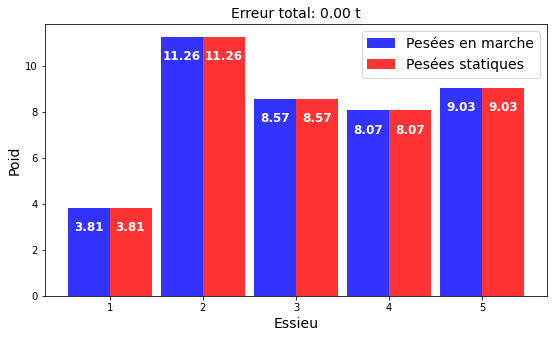

ERREUR :  9.921360315701122e-05
Comparing weights


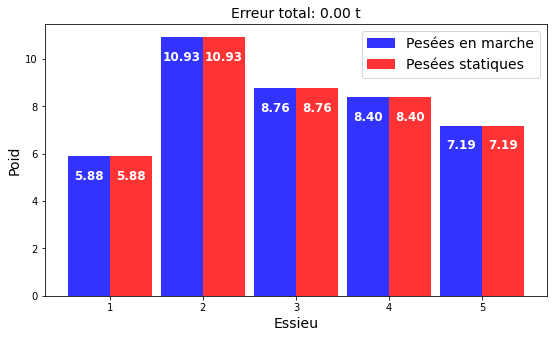

ERREUR :  -7.105427357601002e-15
Comparing weights


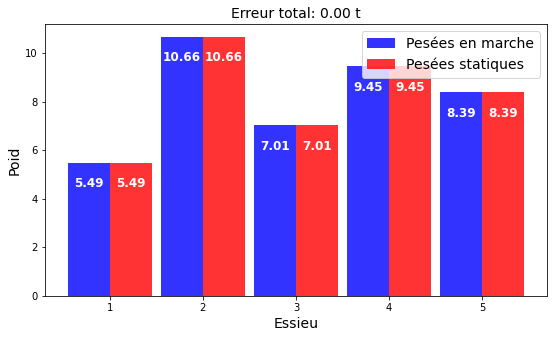

ERREUR :  0.01901717259750768
Comparing weights


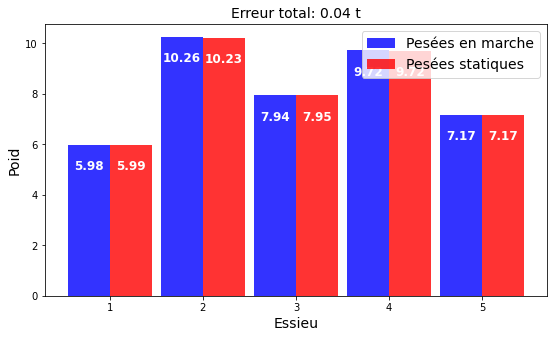

ERREUR :  0.015086950938432153
Comparing weights


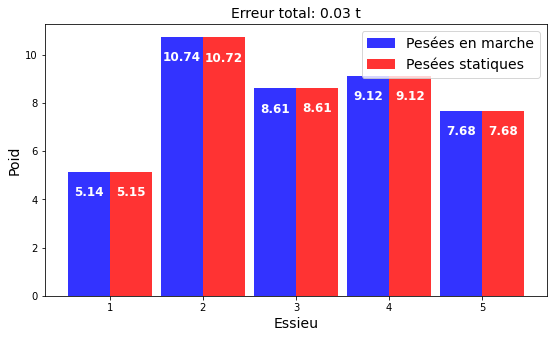

ERREUR :  -0.03227117595533002
Comparing weights


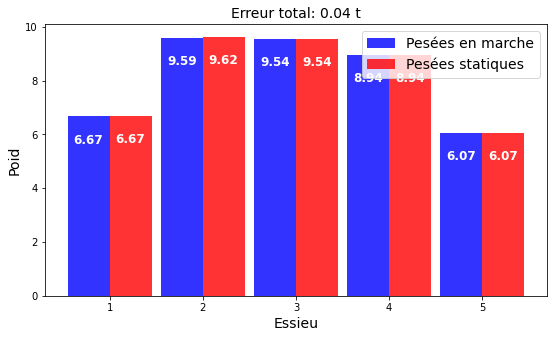

ERREUR :  -0.03758305846186971
Comparing weights


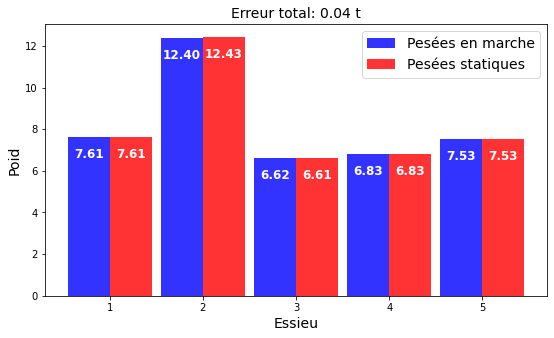

ERREUR :  2.842170943040401e-14
Comparing weights


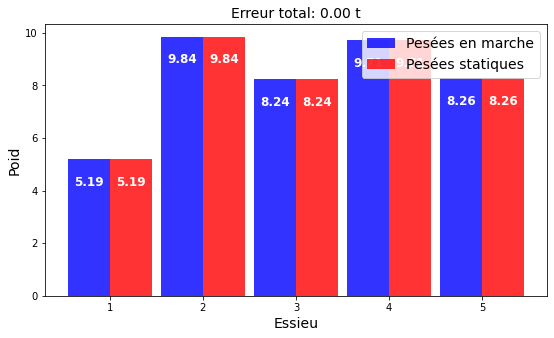

ERREUR :  0.02026381624870055
Comparing weights


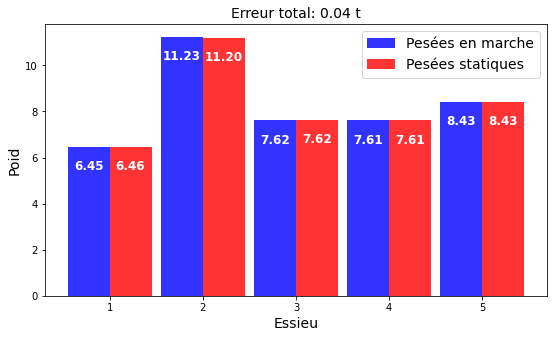

ERREUR :  0.01751232180694018
Comparing weights


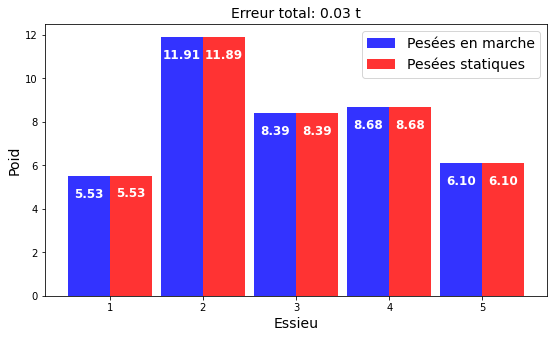

ERREUR :  0.018843842178462467
Comparing weights


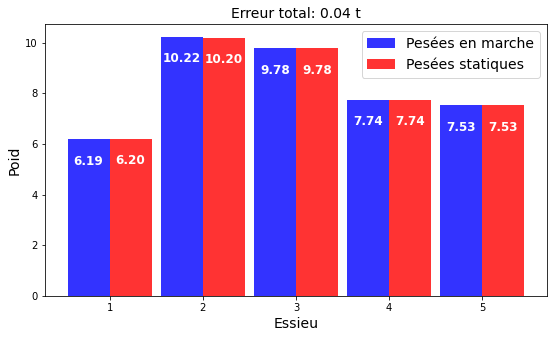

ERREUR :  0.00010244060231201502
Comparing weights


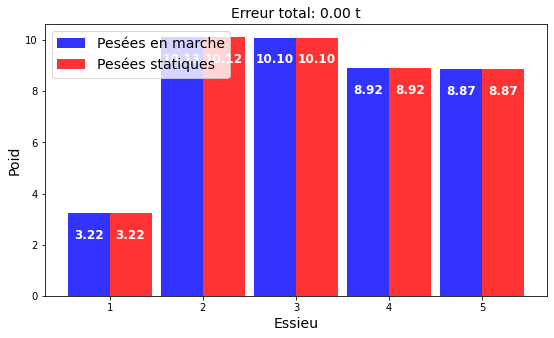

ERREUR :  1.4210854715202004e-14
Comparing weights


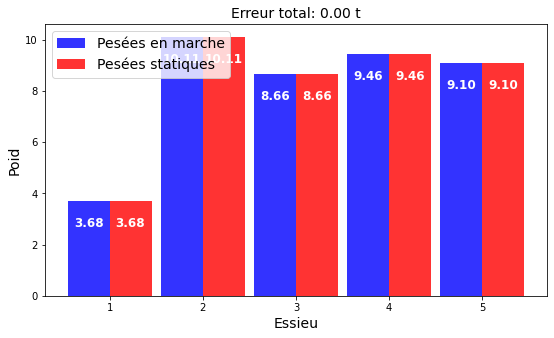

ERREUR :  -2.842170943040401e-14
Comparing weights


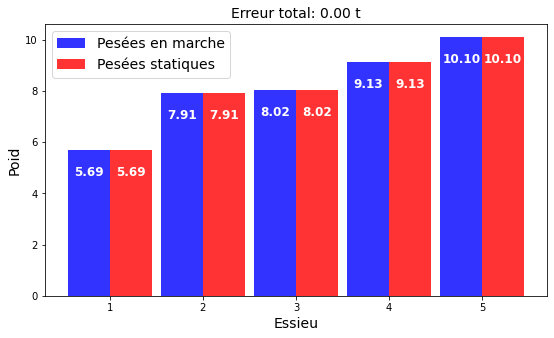

ERREUR :  -1.2901998623249256e-05
Comparing weights


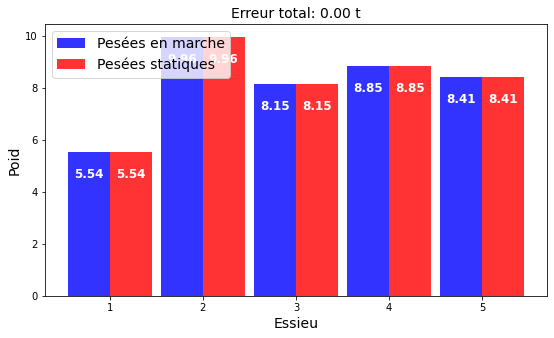

ERREUR :  -2.842170943040401e-14
Comparing weights


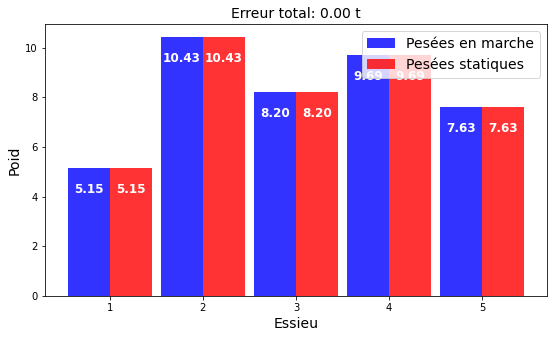

ERREUR :  -2.842170943040401e-14
Comparing weights


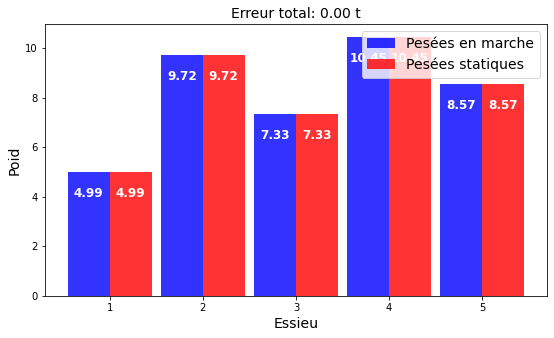

ERREUR :  0.013693264824439666
Comparing weights


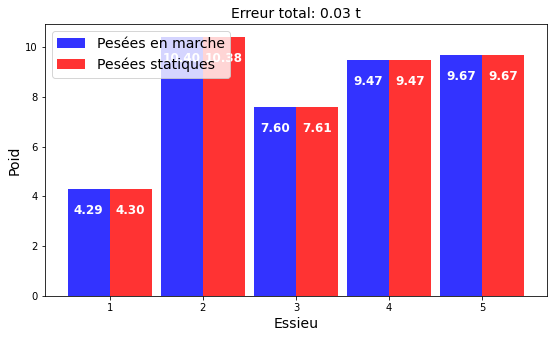

ERREUR :  -3.322452708687251e-05
Comparing weights


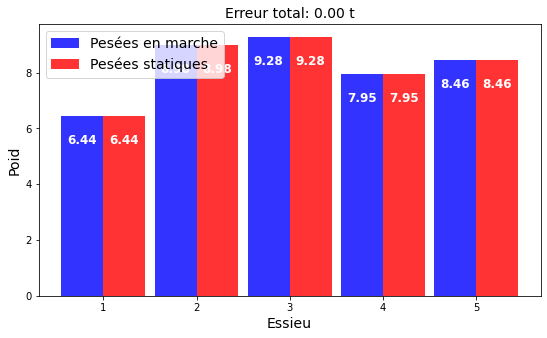

ERREUR :  0.01949470309414636
Comparing weights


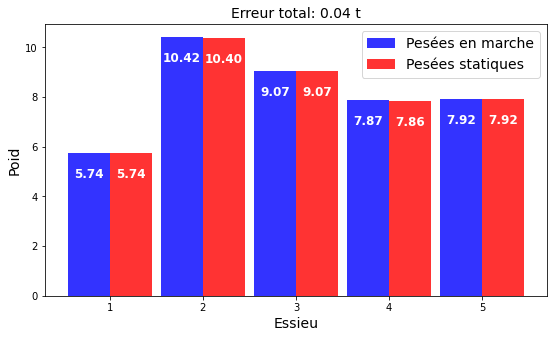

ERREUR :  0.01648044672800353
Comparing weights


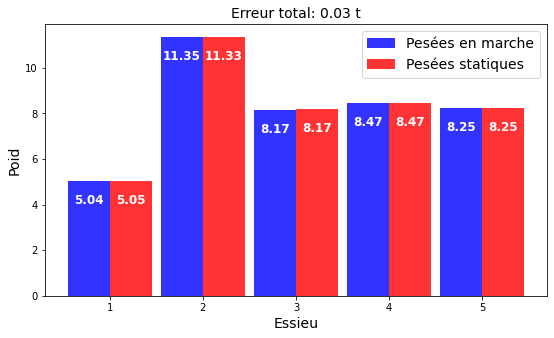

ERREUR :  0.015069671110239824
Comparing weights


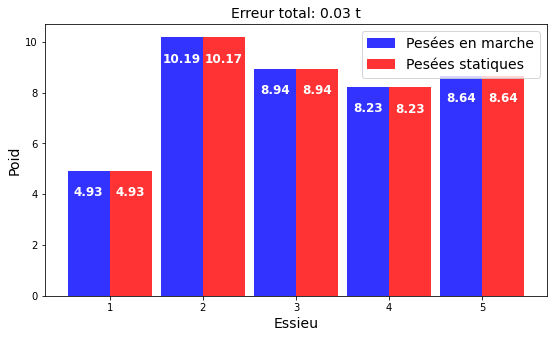

Itération n° : 5/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [274, 358, 478, 507, 533]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 357, 477, 506, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 355, 479, 507, 535]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [271, 356, 478, 508, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 356, 478, 507, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 356, 477, 507

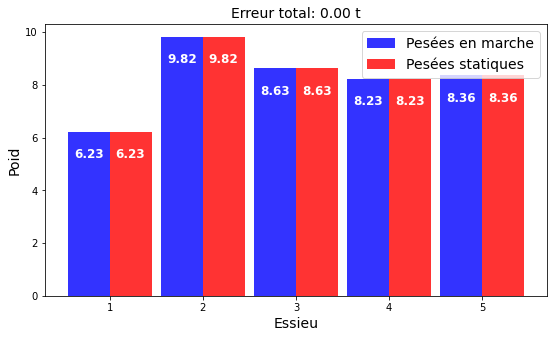

ERREUR :  0.017743611276451077
SPEED :  16.44479740659364
ERREUR :  0.01887830582349892
Comparing weights


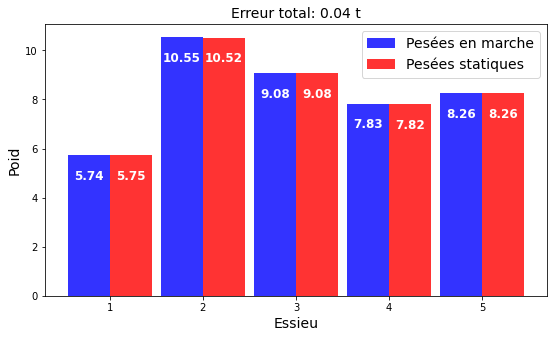

ERREUR :  3.552713678800501e-14
Comparing weights


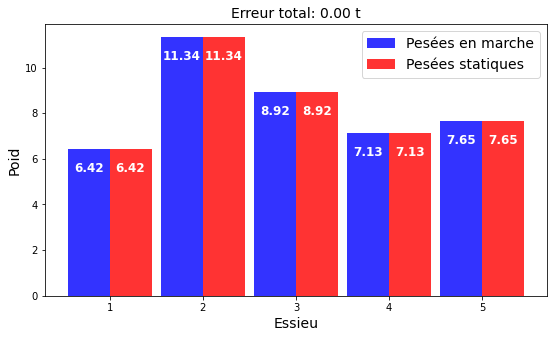

ERREUR :  8.526512829121202e-14
Comparing weights


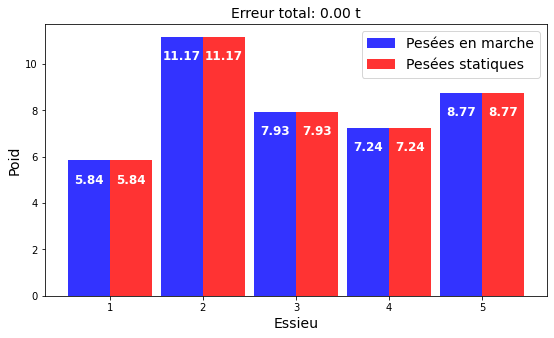

ERREUR :  0.015856812585674618
Comparing weights


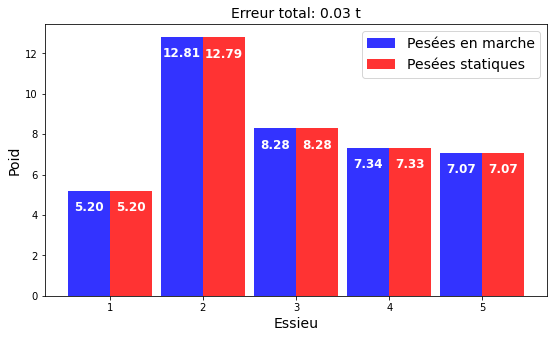

ERREUR :  1.8474111129762605e-13
Comparing weights


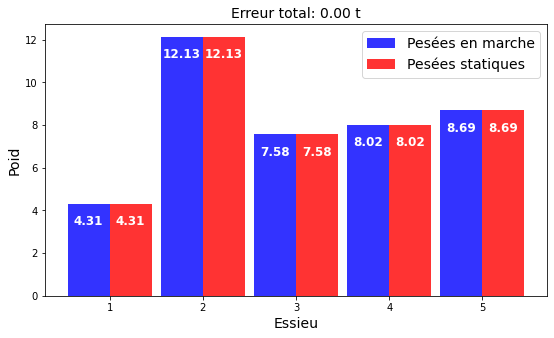

ERREUR :  0.017054793911000843
Comparing weights


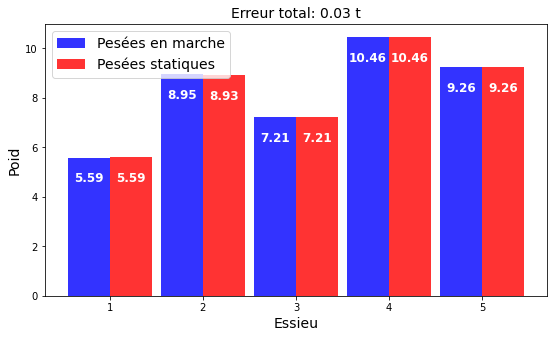

ERREUR :  0.013385690525211658
Comparing weights


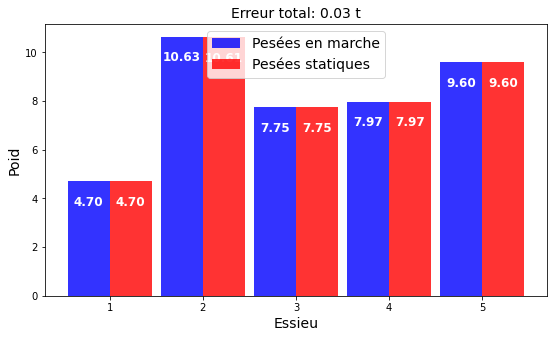

ERREUR :  -2.1316282072803006e-13
Comparing weights


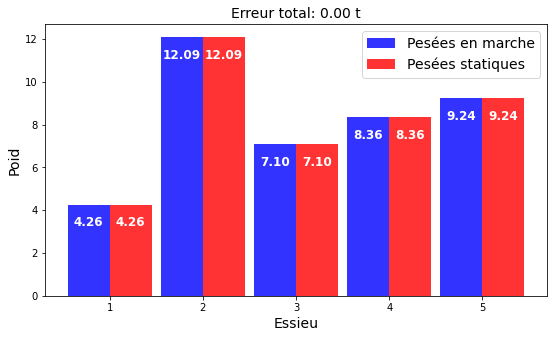

ERREUR :  4.263256414560601e-14
Comparing weights


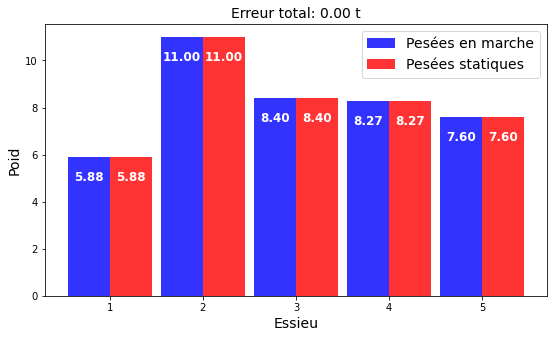

ERREUR :  0.02258672337941192
Comparing weights


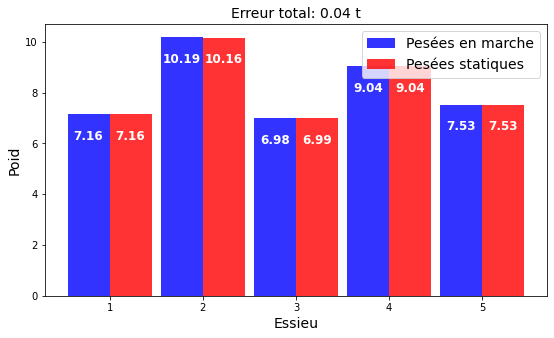

ERREUR :  -2.842170943040401e-14
Comparing weights


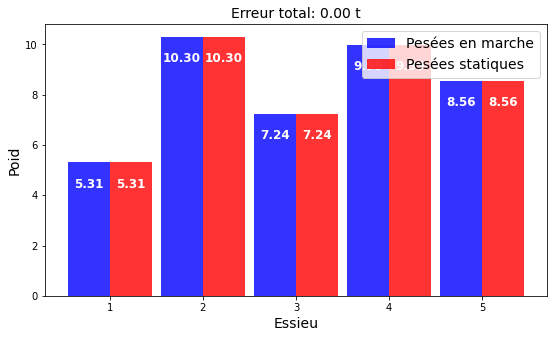

ERREUR :  0.0
Comparing weights


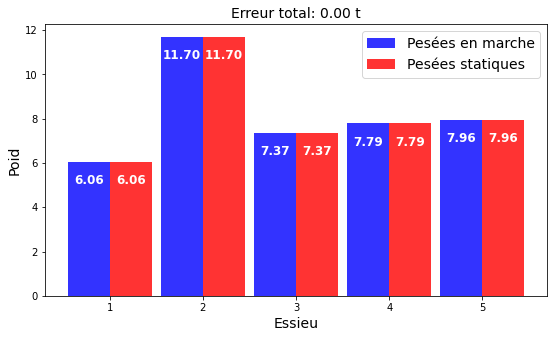

ERREUR :  7.105427357601002e-15
Comparing weights


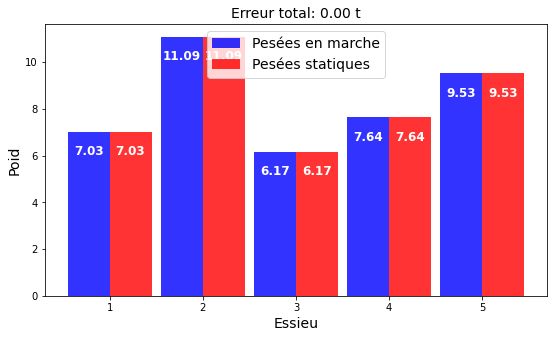

ERREUR :  0.016994592655841245
Comparing weights


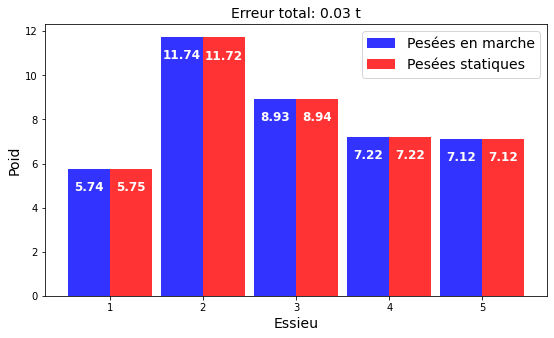

ERREUR :  0.01729350600938062
Comparing weights


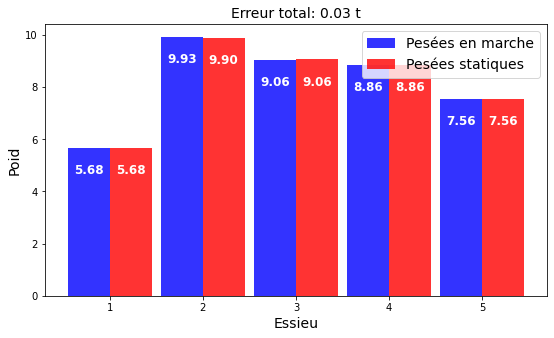

ERREUR :  1.4210854715202004e-14
Comparing weights


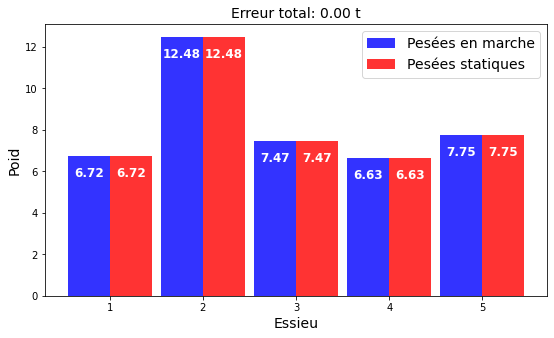

ERREUR :  -2.1316282072803006e-14
Comparing weights


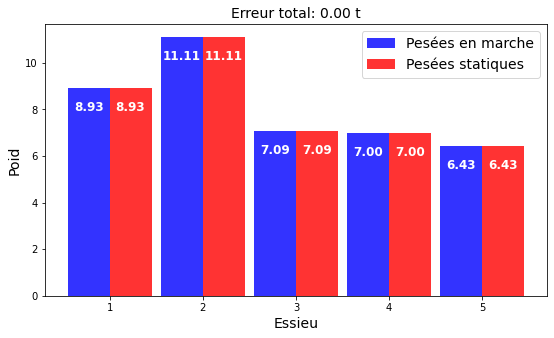

ERREUR :  0.02446376735144895
Comparing weights


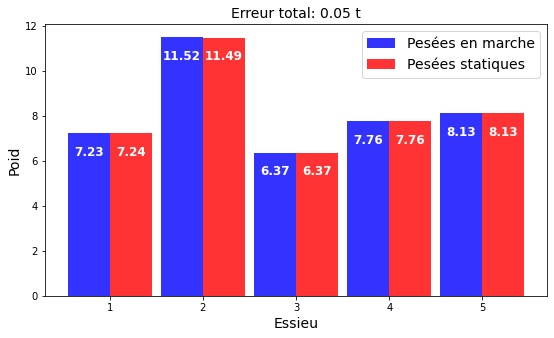

ERREUR :  0.01578030046124468
Comparing weights


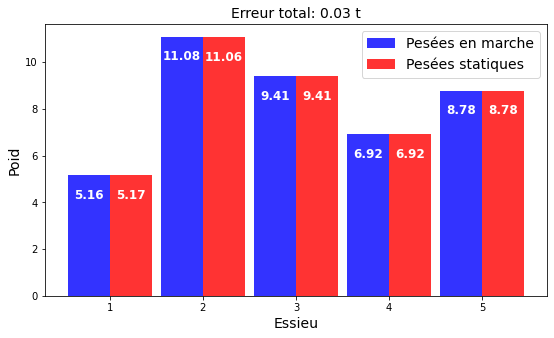

ERREUR :  0.021242037868681507
Comparing weights


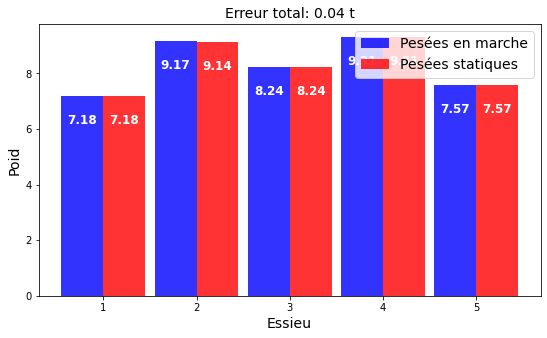

ERREUR :  0.01868485850912549
Comparing weights


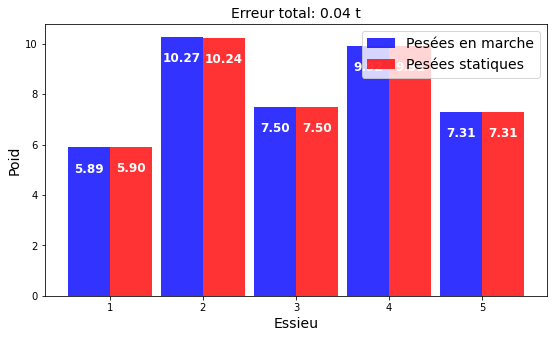

ERREUR :  -0.0357360902331223
Comparing weights


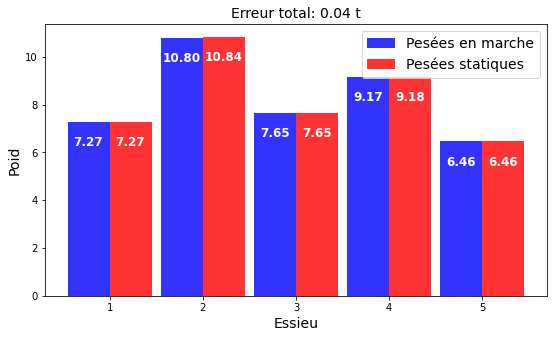

ERREUR :  1.4210854715202004e-14
Comparing weights


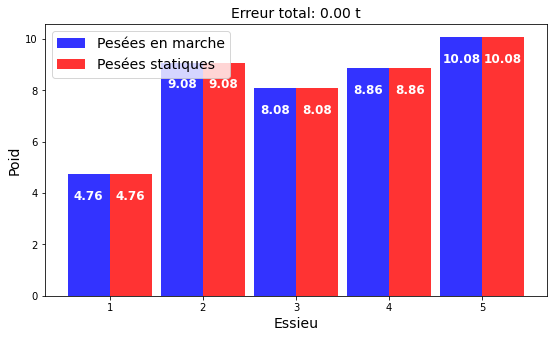

SIGMA FOR NOISE :  0.022222222222222223
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 357, 476, 504, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  504
Décalage trouvé
decalage found :  504
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 357, 477, 505, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 356, 477, 507, 534]
posit

Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 477, 508, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 356, 478, 505, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :

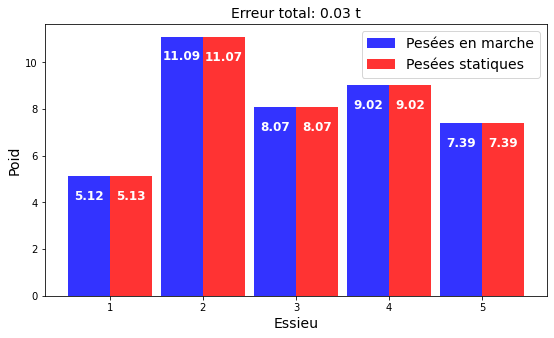

ERREUR :  0.017283570818740657
Comparing weights


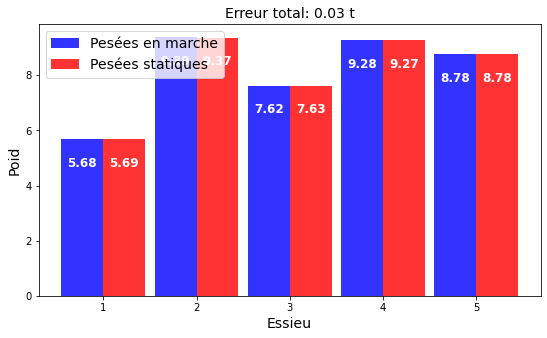

ERREUR :  0.020041715321525544
Comparing weights


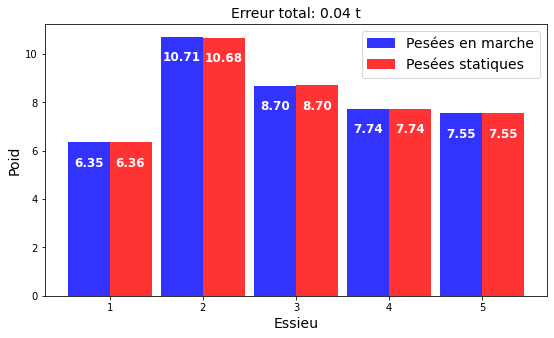

ERREUR :  3.552713678800501e-14
Comparing weights


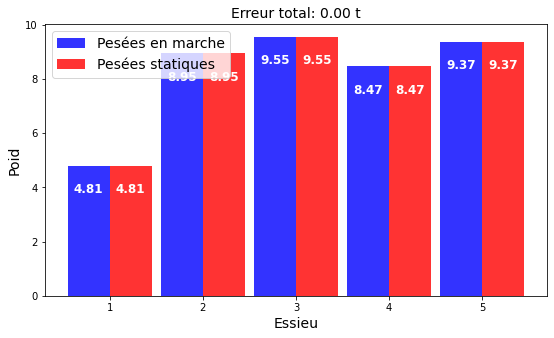

ERREUR :  -4.263256414560601e-14
Comparing weights


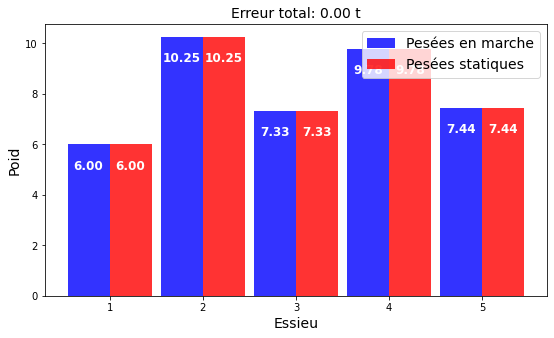

ERREUR :  -7.105427357601002e-15
Comparing weights


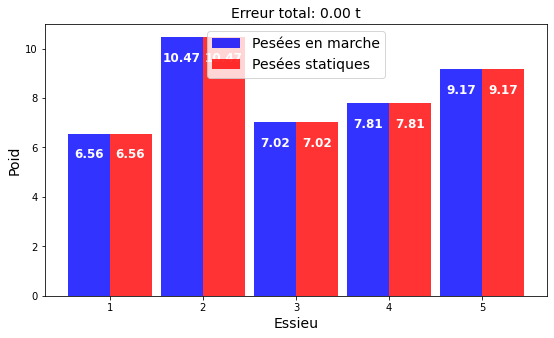

ERREUR :  0.012029999791998591
Comparing weights


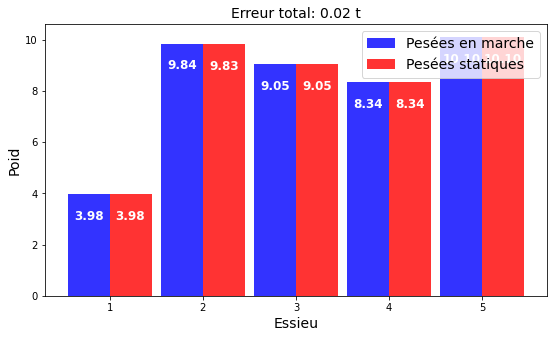

ERREUR :  -1.4210854715202004e-14
Comparing weights


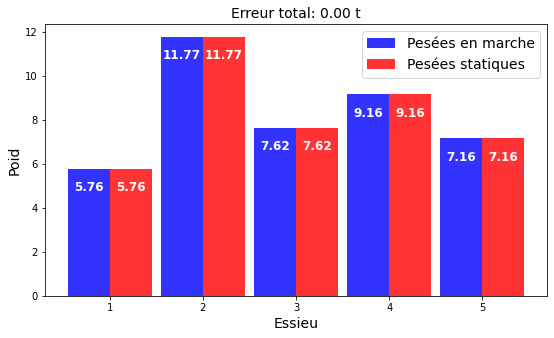

ERREUR :  0.022621545352969008
Comparing weights


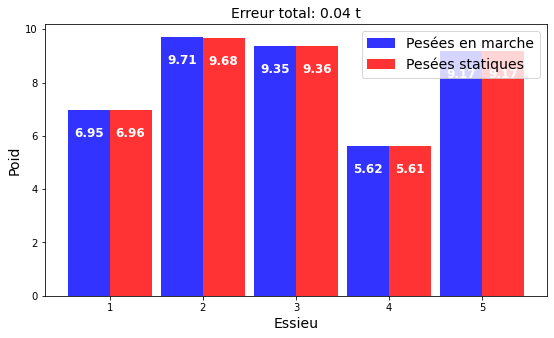

ERREUR :  4.263256414560601e-14
Comparing weights


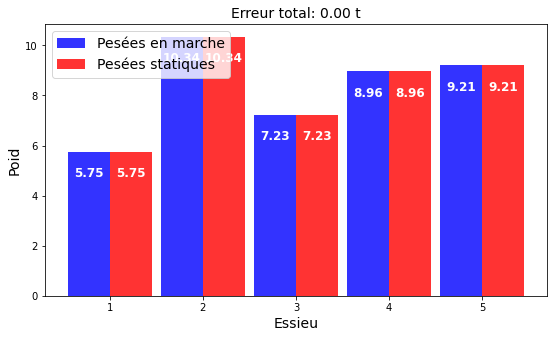

ERREUR :  0.015814462540227225
Comparing weights


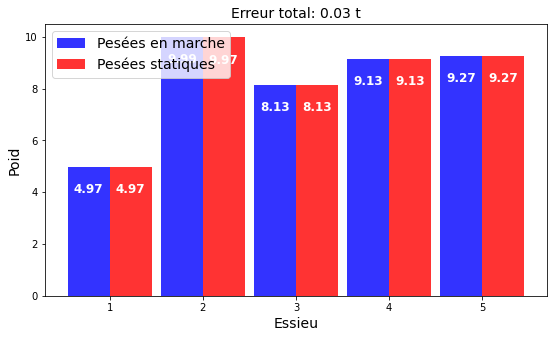

ERREUR :  0.022695428150747432
Comparing weights


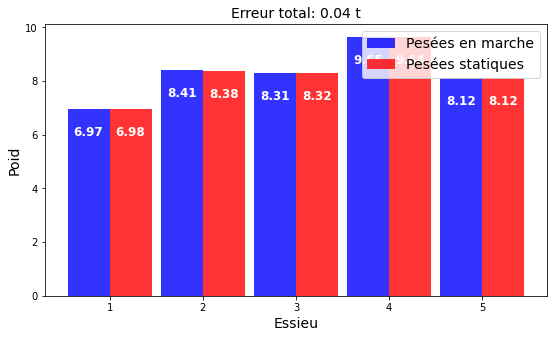

ERREUR :  -7.105427357601002e-13
Comparing weights


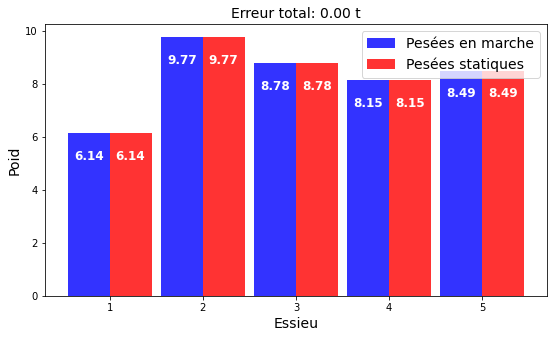

ERREUR :  -2.1316282072803006e-14
Comparing weights


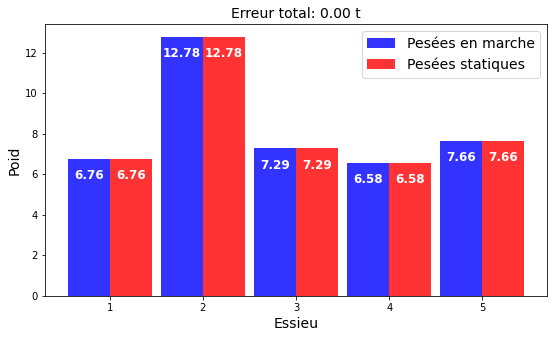

ERREUR :  0.014282608773363847
Comparing weights


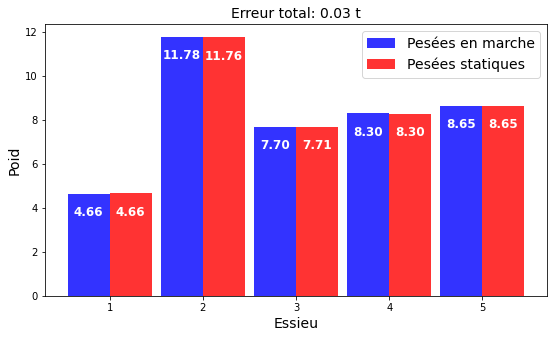

ERREUR :  7.105427357601002e-15
Comparing weights


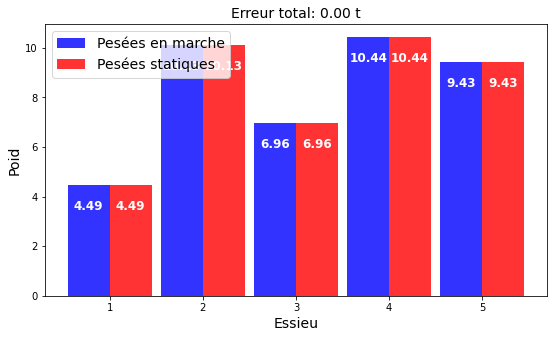

ERREUR :  -1.1112888387287967e-11
Comparing weights


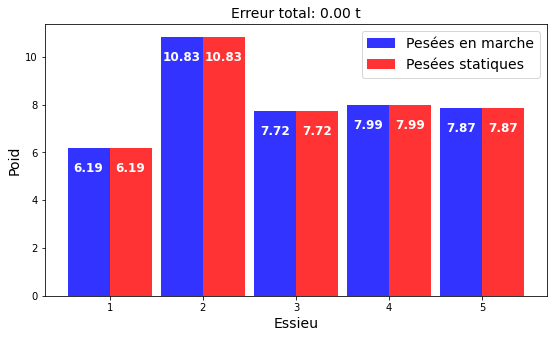

ERREUR :  0.022632800331869873
Comparing weights


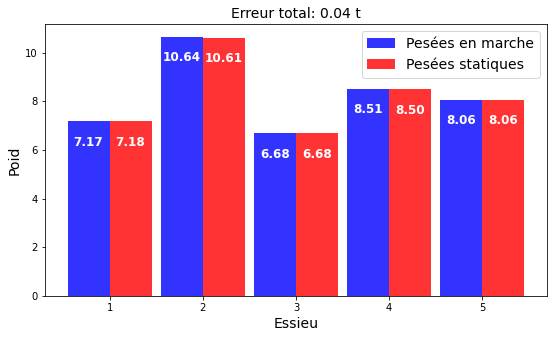

ERREUR :  0.017165609017148142
SPEED :  17.484336371700113
ERREUR :  0.013039437073658178
Comparing weights


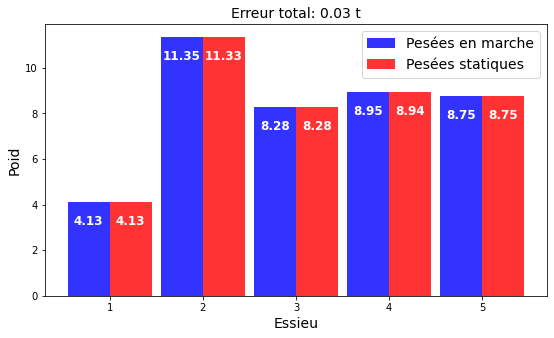

ERREUR :  0.020651124731642767
Comparing weights


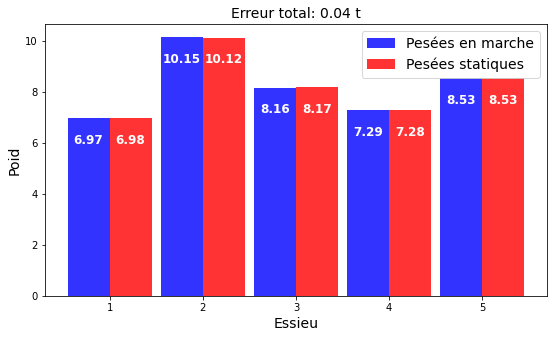

ERREUR :  1.9184653865522705e-13
SPEED :  27.229368614806635
ERREUR :  0.015340015749181646
SPEED :  17.63866644904578
ERREUR :  0.013997942474354375
Comparing weights


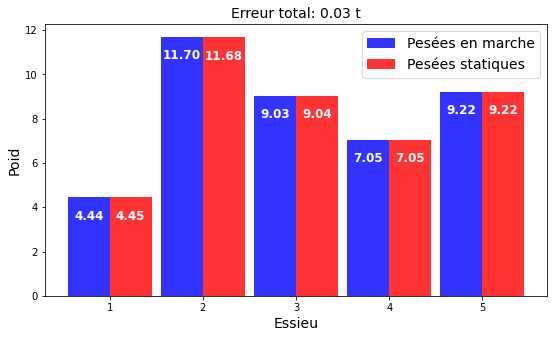

ERREUR :  0.01949034985322129
Comparing weights


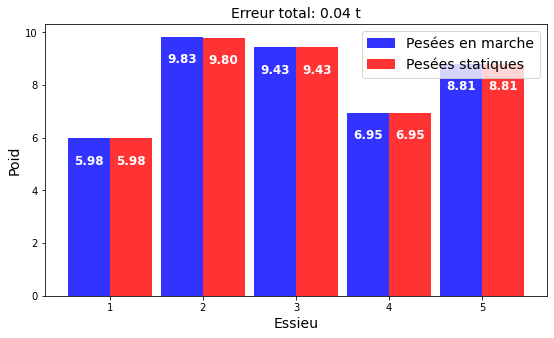

Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 359, 478, 506, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  359
Décalage trouvé
decalage found :  359
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 480, 507, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  480
Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 480, 508, 535]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 358, 479, 507, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [271, 357, 478, 506, 533]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 355, 478, 508

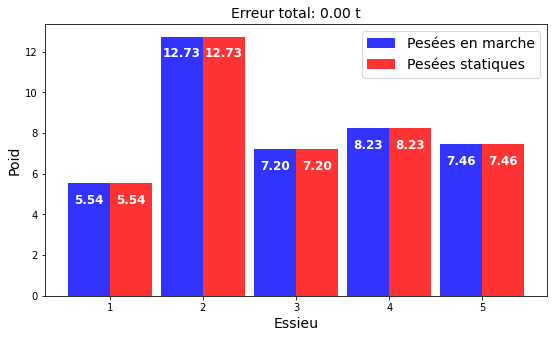

ERREUR :  0.013885772883256209
Comparing weights


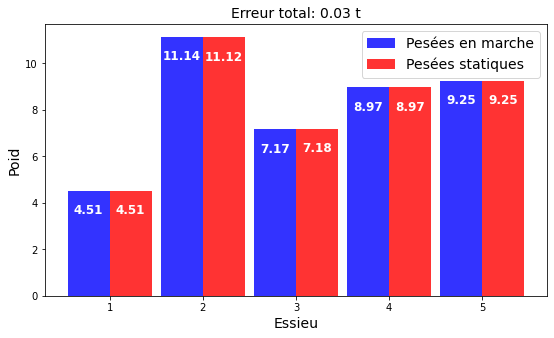

ERREUR :  -1.4210854715202004e-14
Comparing weights


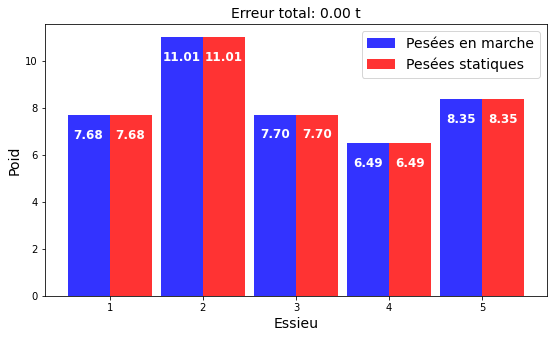

ERREUR :  0.01851857116818678
Comparing weights


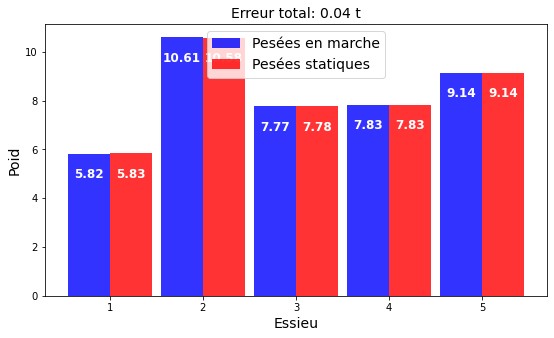

ERREUR :  1.297948415412975e-10
Comparing weights


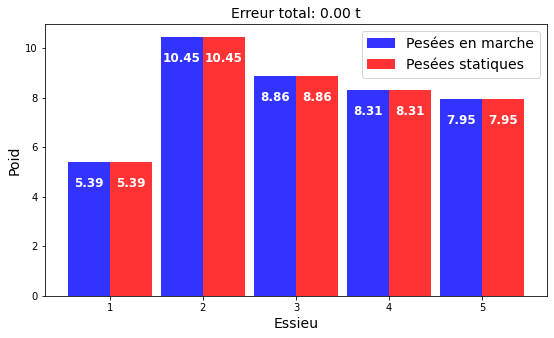

ERREUR :  -0.00017724506325578204
Comparing weights


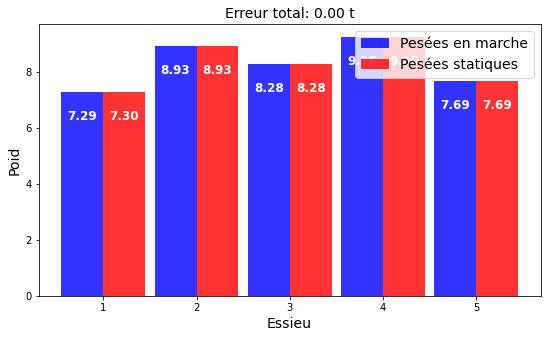

ERREUR :  2.1316282072803006e-14
Comparing weights


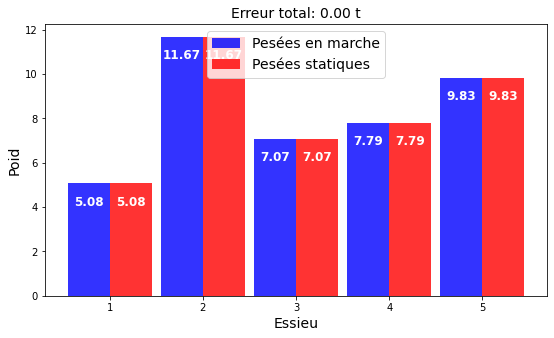

ERREUR :  0.02106483538503312
Comparing weights


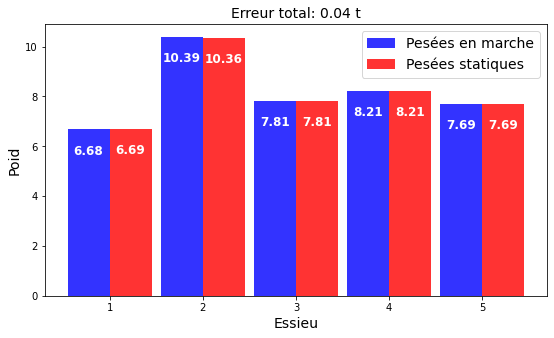

ERREUR :  0.017256925257939315
SPEED :  17.39759276904815
ERREUR :  -4.192202140984591e-13
Comparing weights


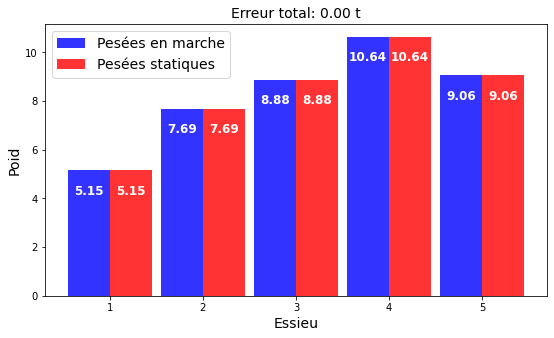

ERREUR :  6.892264536872972e-13
SPEED :  26.701215822986537
ERREUR :  0.015459459677359177
Comparing weights


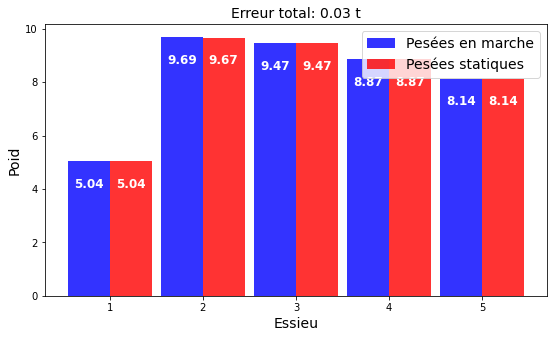

ERREUR :  0.015438229577419804
Comparing weights


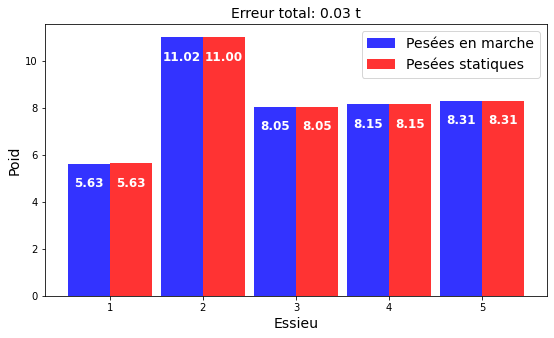

ERREUR :  1.1368683772161603e-13
Comparing weights


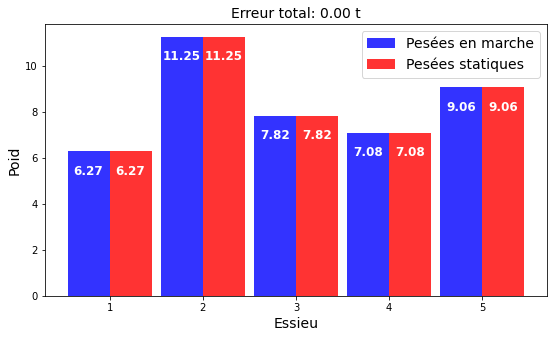

ERREUR :  0.01882170005816164
Comparing weights


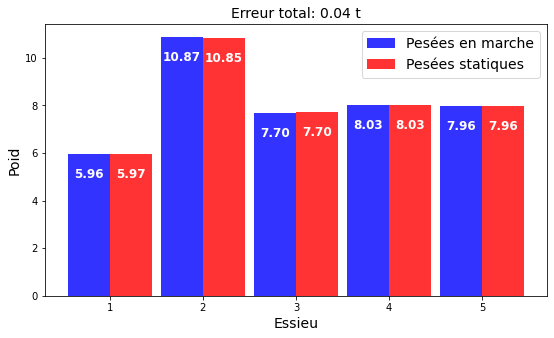

ERREUR :  -1.85155668290804e-05
Comparing weights


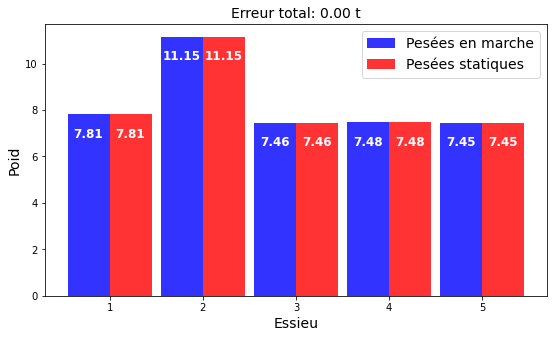

ERREUR :  1.2789769243681803e-13
SPEED :  15.370090476536813
ERREUR :  3.552713678800501e-14
Comparing weights


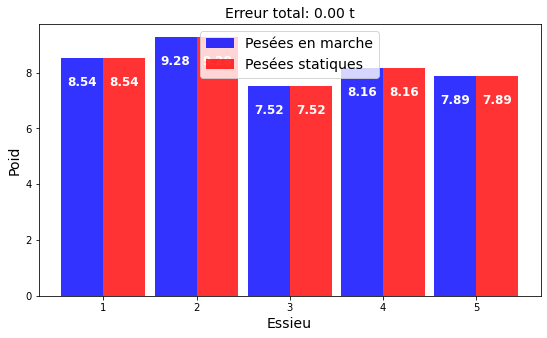

ERREUR :  0.011439255937105486
SPEED :  17.78554641841107
ERREUR :  0.017218791175920956
Comparing weights


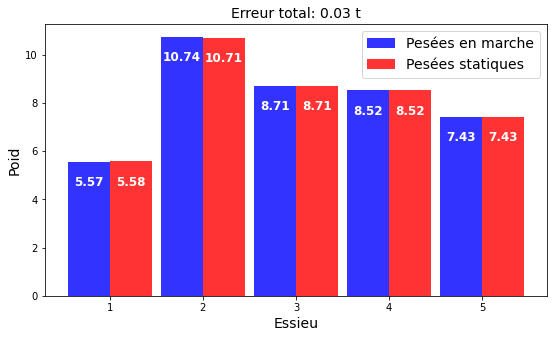

ERREUR :  0.021519093234999787
SPEED :  17.768264951834094
ERREUR :  0.017508778841296646
Comparing weights


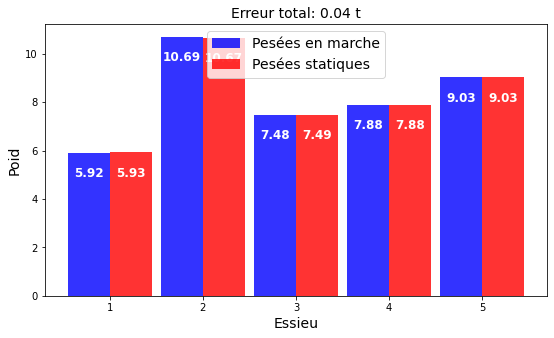

ERREUR :  -0.02456851746771349
Comparing weights


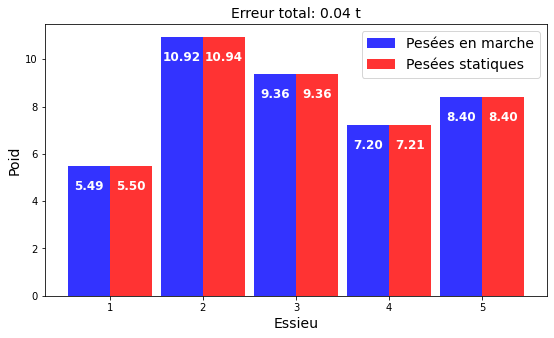

ERREUR :  0.0005544002743960164
Comparing weights


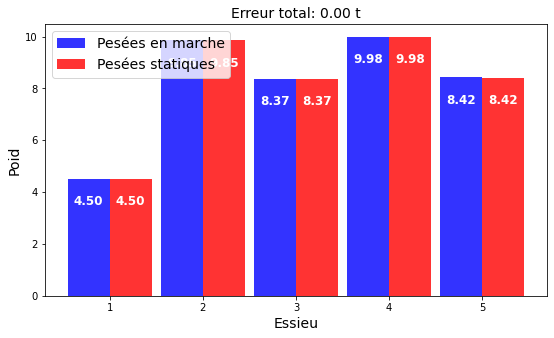

ERREUR :  0.017469201135099865
Comparing weights


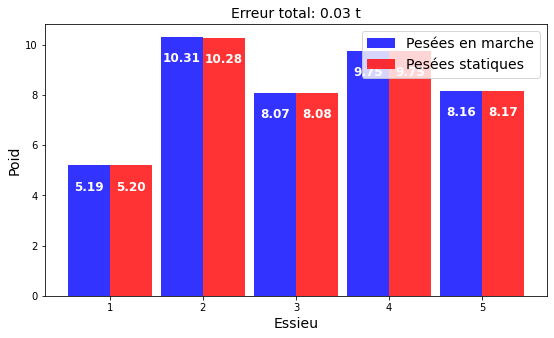

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 357, 479, 507, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 355, 477, 508, 533]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 356, 477, 506, 535]
position décalage 0
peaks0 :  272
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 356, 479, 505, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 355, 479, 508, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 477, 507

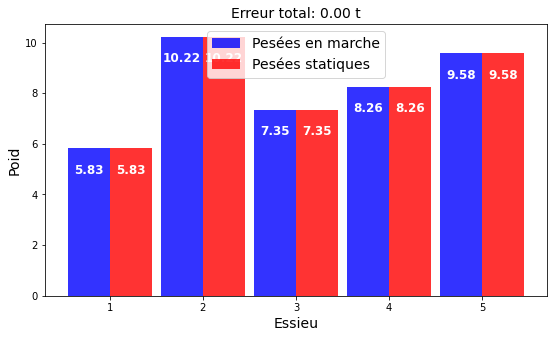

ERREUR :  0.01599474079225871
Comparing weights


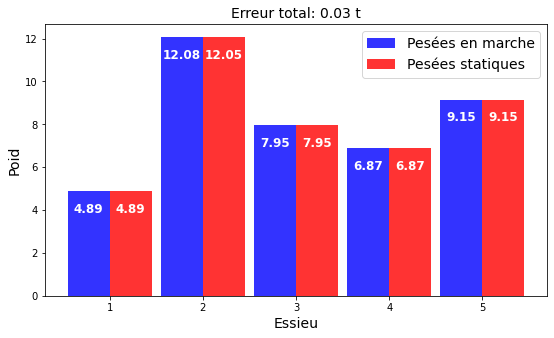

ERREUR :  9.947598300641403e-14
SPEED :  16.997835191344233
ERREUR :  0.015308248758977072
Comparing weights


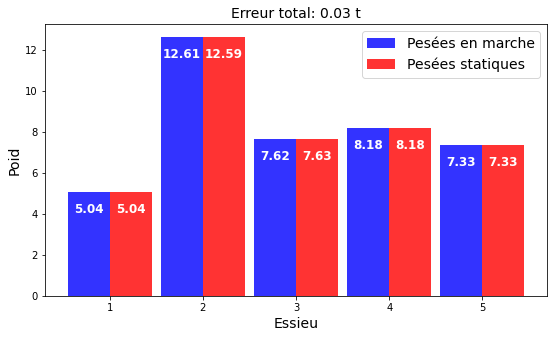

ERREUR :  -6.252776074688882e-13
Comparing weights


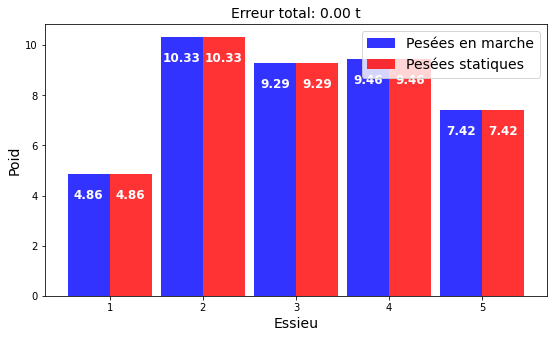

ERREUR :  -2.842170943040401e-14
Comparing weights


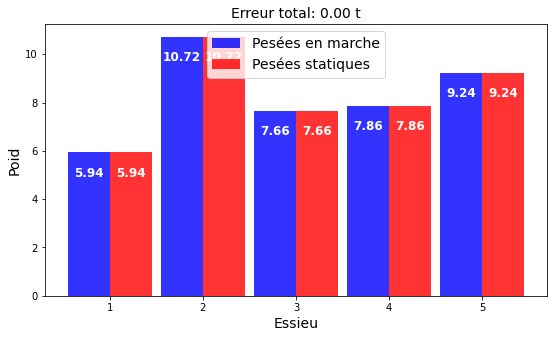

ERREUR :  -0.02759036837886697
SPEED :  24.285703851895356
ERREUR :  -6.394884621840902e-14
Comparing weights


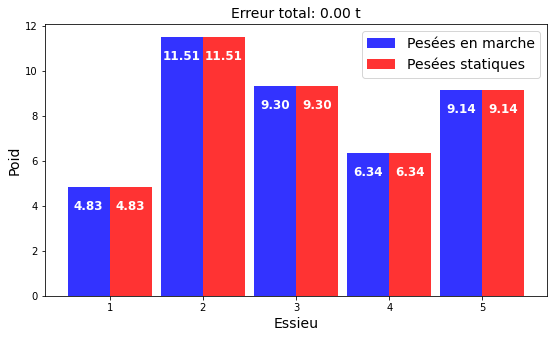

ERREUR :  -0.029843876089969967
Comparing weights


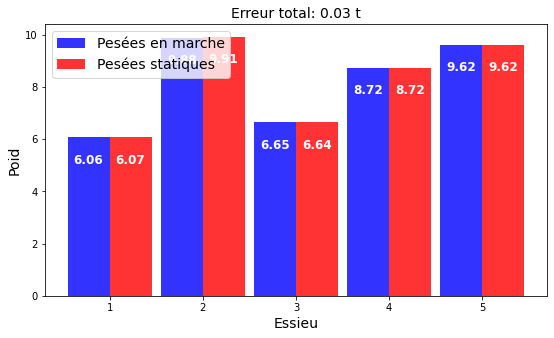

ERREUR :  1.2576606422953773e-12
Comparing weights


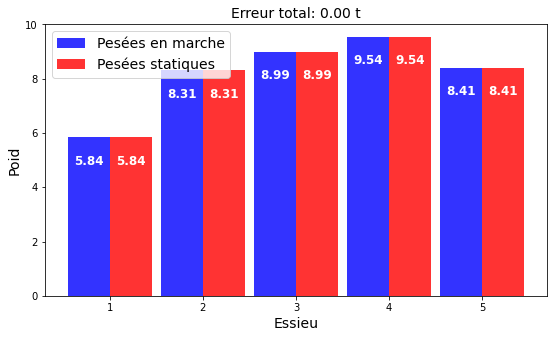

ERREUR :  0.009875380326398897
Comparing weights


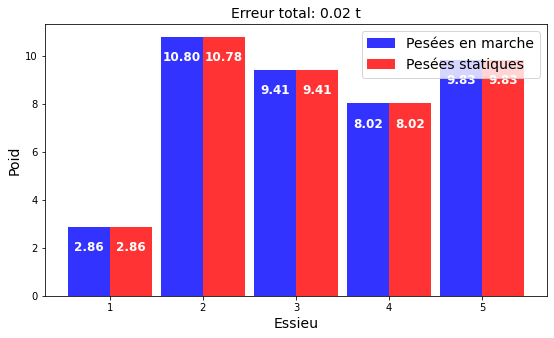

ERREUR :  0.020676429802094276
Comparing weights


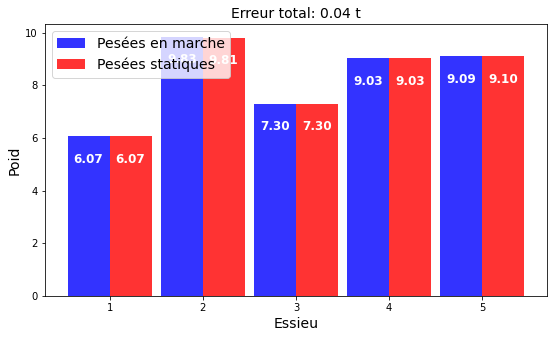

ERREUR :  0.014621733856102992
Comparing weights


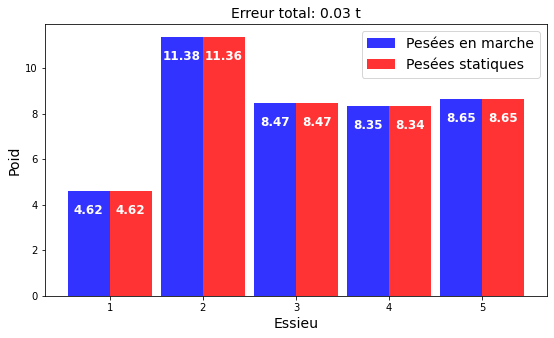

ERREUR :  0.0
Comparing weights


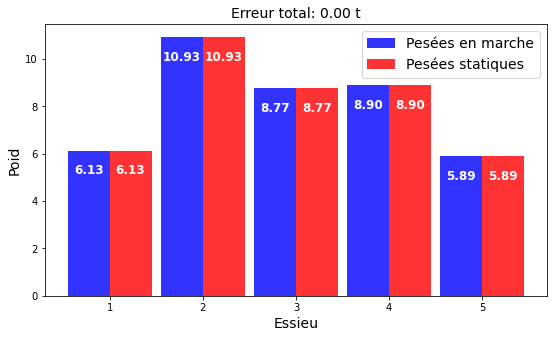

ERREUR :  -0.02550382325826206
Comparing weights


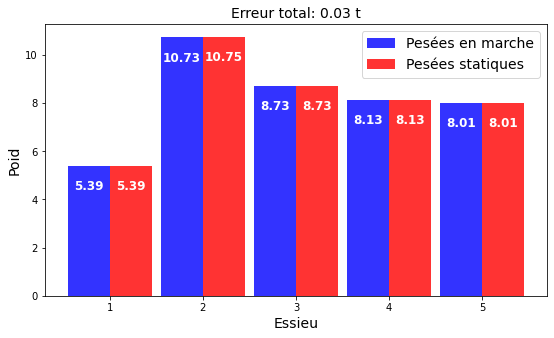

ERREUR :  0.016636522796325437
Comparing weights


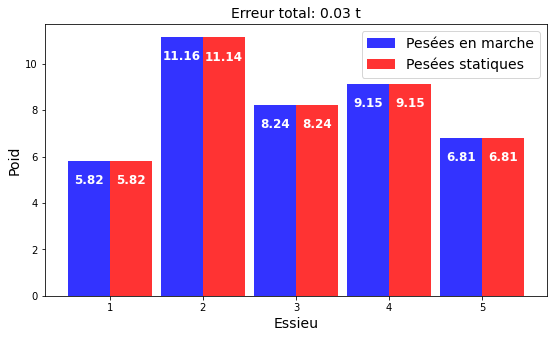

ERREUR :  -0.033130482821022156
SPEED :  24.8660410535119
ERREUR :  0.015826000268923224
SPEED :  17.9582750529688
ERREUR :  -1.5418777365994174e-12
Comparing weights


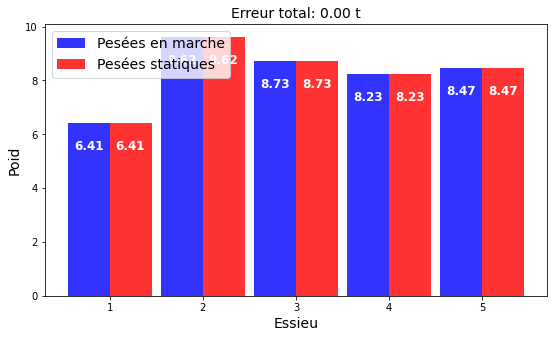

ERREUR :  -0.02421483005457503
Comparing weights


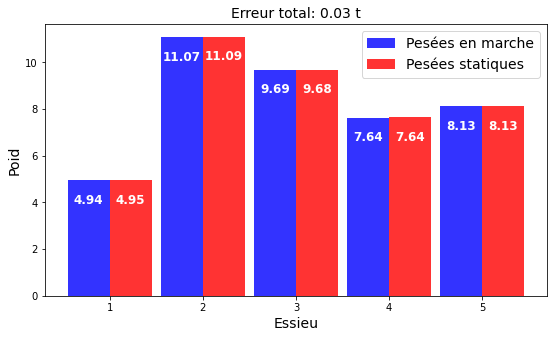

ERREUR :  0.02112292455490916
Comparing weights


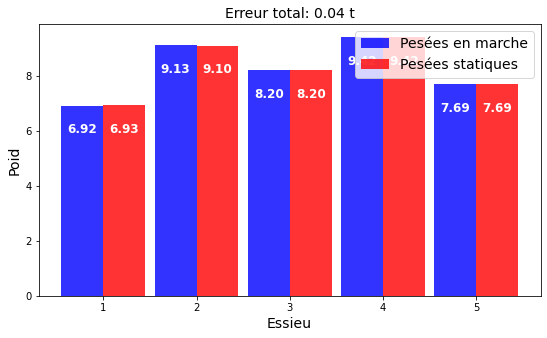

ERREUR :  1.4210854715202004e-14
Comparing weights


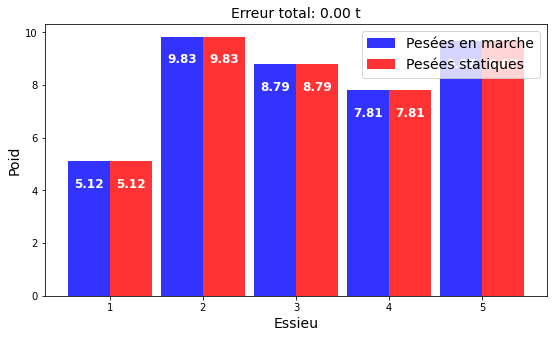

ERREUR :  2.1316282072803006e-14
Comparing weights


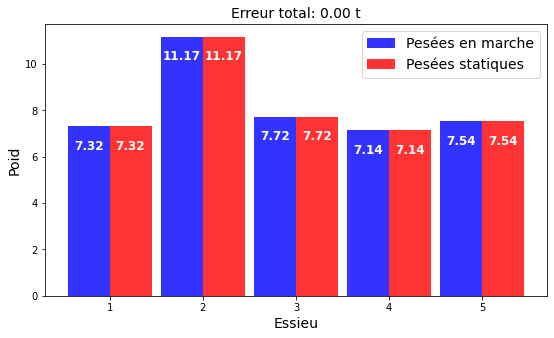

ERREUR :  3.552713678800501e-14
SPEED :  18.048872599575645
ERREUR :  -0.023338098636450866
Comparing weights


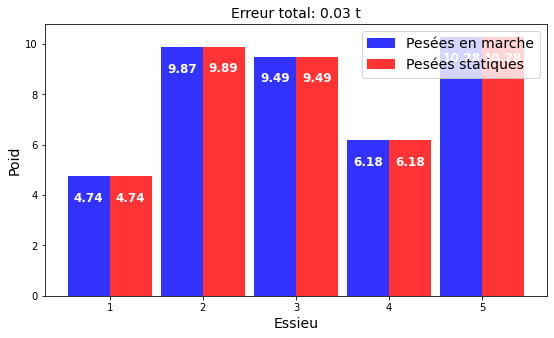

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [274, 355, 475, 507, 534]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  475
Décalage trouvé
decalage found :  475
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 478, 506, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 356, 478, 507, 534]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 356, 478, 507, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 357, 479, 507, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 356, 477, 507

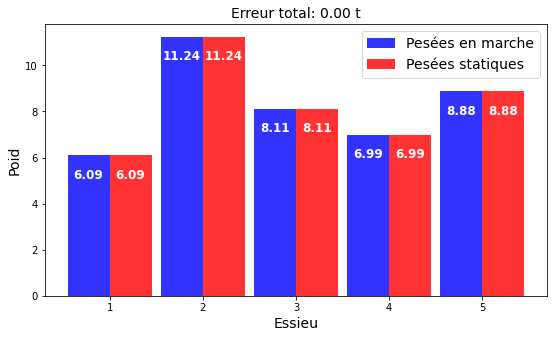

ERREUR :  0.0
Comparing weights


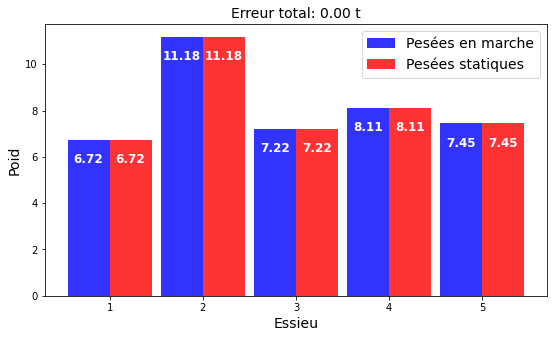

ERREUR :  0.015734325285052364
Comparing weights


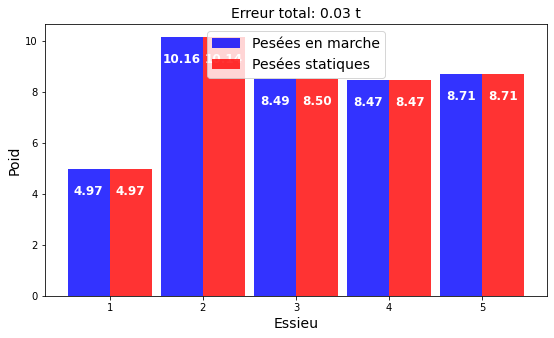

ERREUR :  0.019338768828369268
Comparing weights


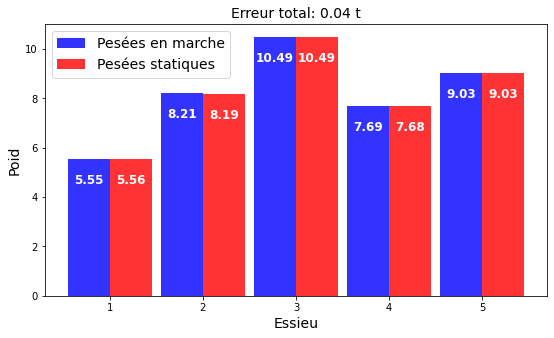

ERREUR :  7.105427357601002e-15
Comparing weights


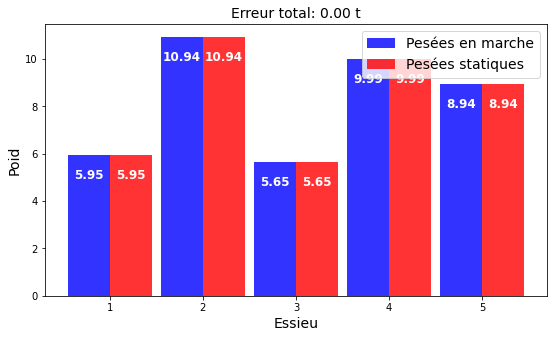

ERREUR :  7.105427357601002e-15
Comparing weights


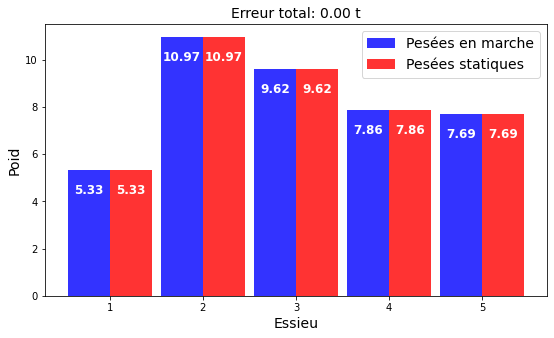

ERREUR :  0.015188281201830023
Comparing weights


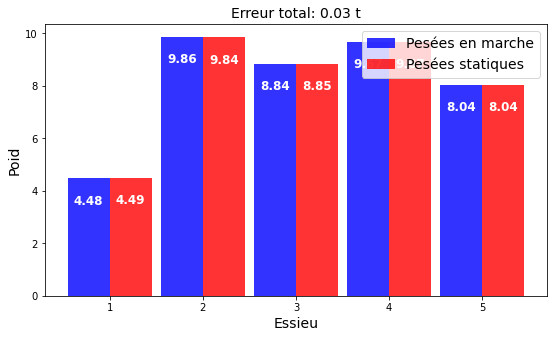

ERREUR :  0.02142424564078027
SPEED :  16.487201942840105
ERREUR :  0.0156201970769132
Comparing weights


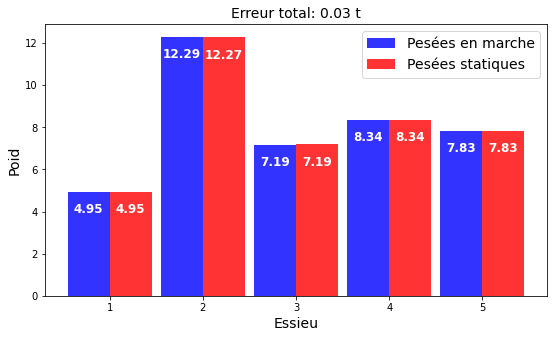

ERREUR :  3.552713678800501e-14
Comparing weights


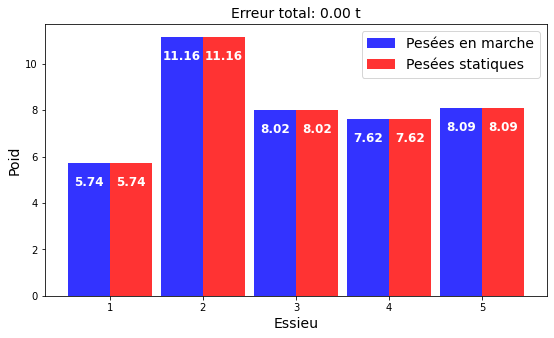

ERREUR :  3.552713678800501e-14
Comparing weights


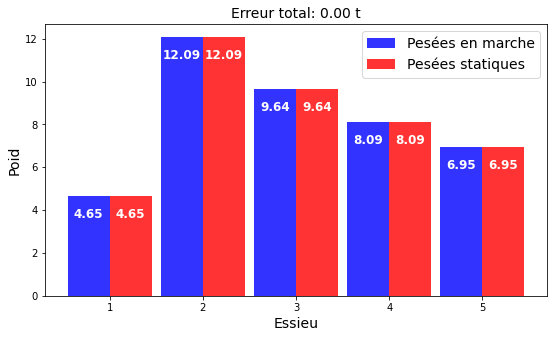

ERREUR :  0.0
Comparing weights


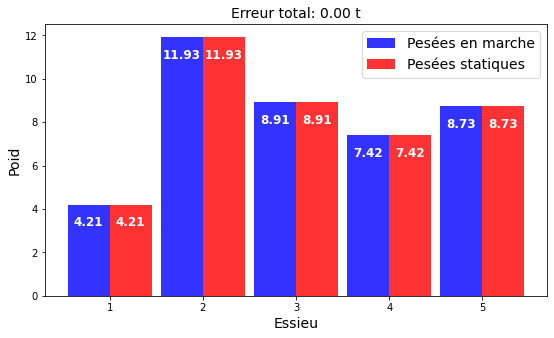

ERREUR :  -7.105427357601002e-15
Comparing weights


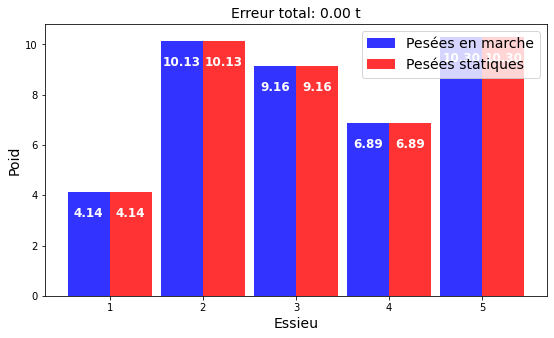

ERREUR :  1.8609087248933065e-06
Comparing weights


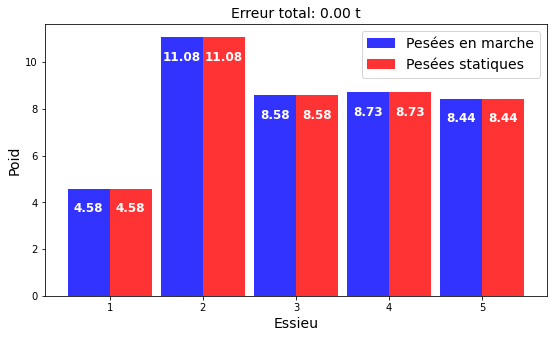

ERREUR :  3.268496584496461e-13
Comparing weights


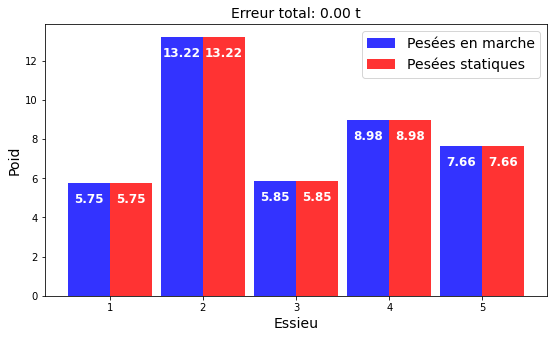

ERREUR :  0.012357702987330299
Comparing weights


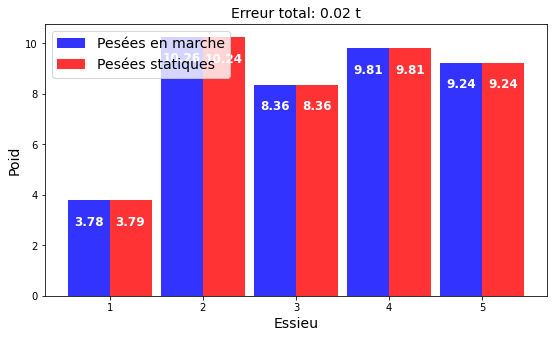

ERREUR :  0.021440074321006364
Comparing weights


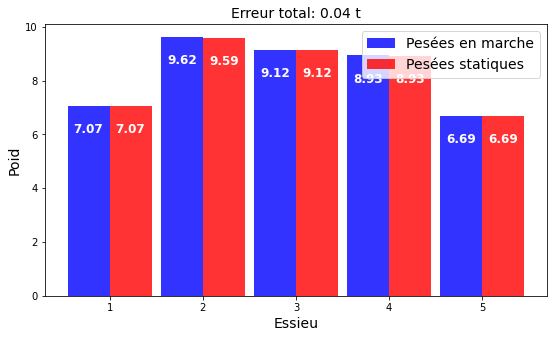

ERREUR :  -7.105427357601002e-15
Comparing weights


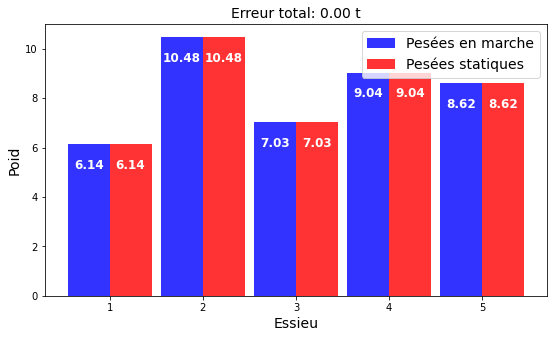

ERREUR :  2.4420698707672273e-06
Comparing weights


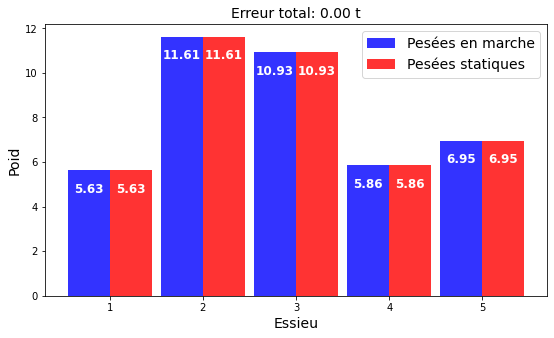

ERREUR :  1.5631940186722204e-13
Comparing weights


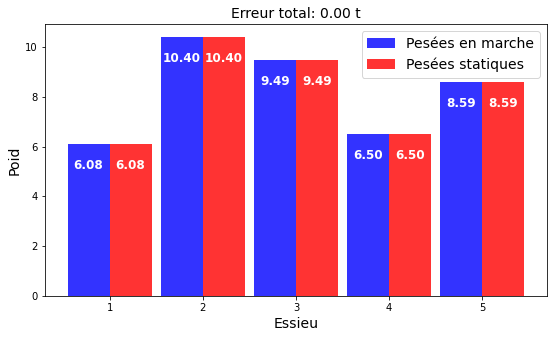

ERREUR :  4.973799150320701e-14
Comparing weights


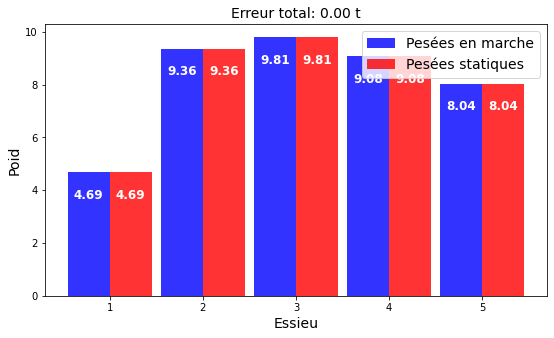

ERREUR :  0.01668973362620818
Comparing weights


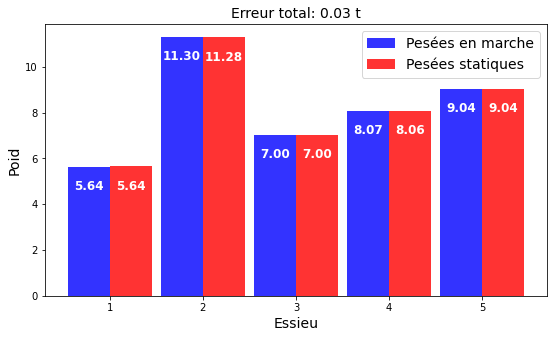

ERREUR :  2.1316282072803006e-14
Comparing weights


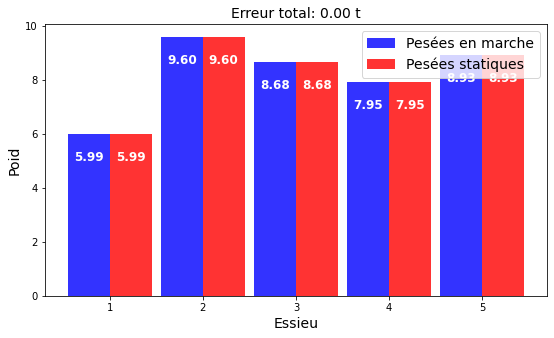

ERREUR :  1.4210854715202004e-14
Comparing weights


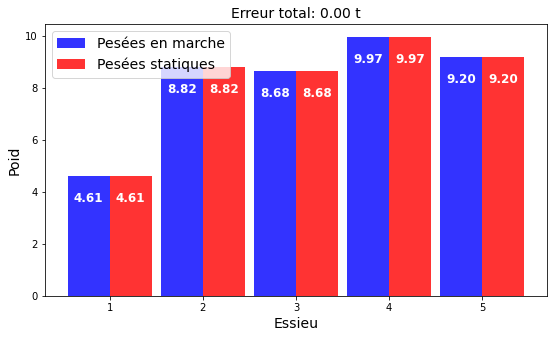

ERREUR :  4.263256414560601e-14
Comparing weights


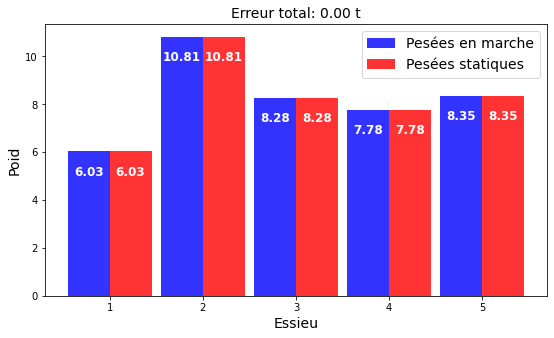

Itération n° : 5/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 357, 476, 507, 536]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [271, 356, 478, 507, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 478, 507, 534]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [271, 356, 480, 507, 535]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  480
Décalage trouvé
decalage found :  480
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [273, 357, 477, 508, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 354, 480, 508

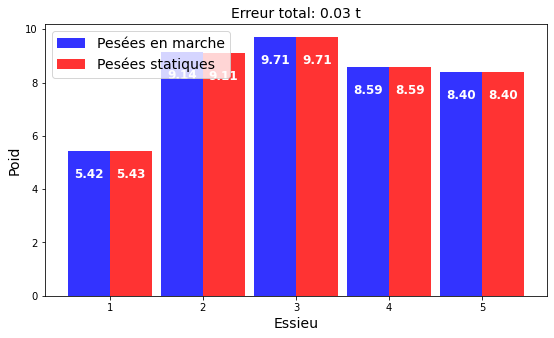

ERREUR :  0.017010800268657533
Comparing weights


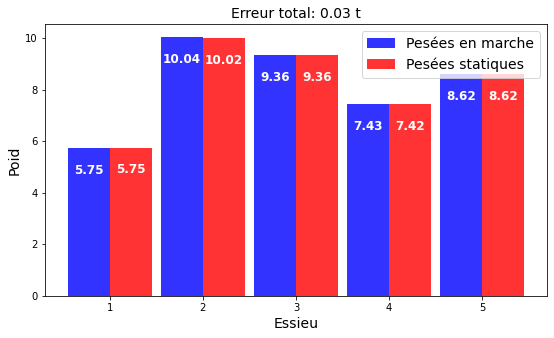

ERREUR :  0.013204549595783988
Comparing weights


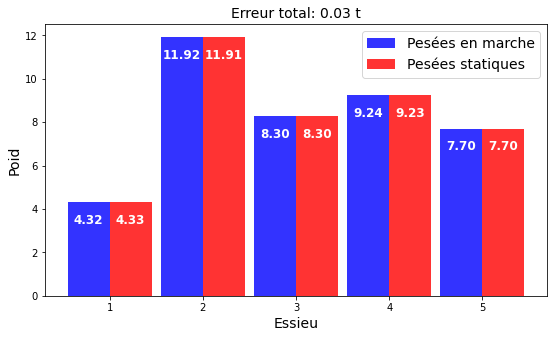

ERREUR :  0.01900876635838955
Comparing weights


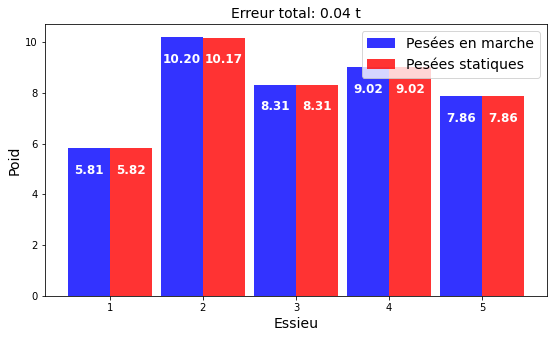

ERREUR :  -2.1316282072803006e-14
Comparing weights


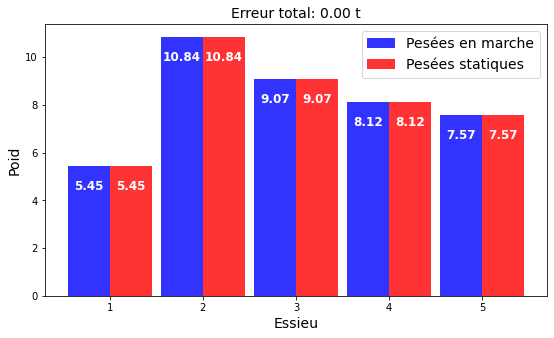

ERREUR :  -4.715282134526433e-05
Comparing weights


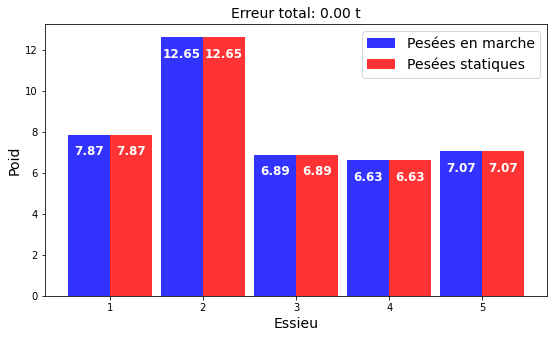

ERREUR :  0.016546552767067624
SPEED :  16.9749710167466
ERREUR :  0.021228829379680292
Comparing weights


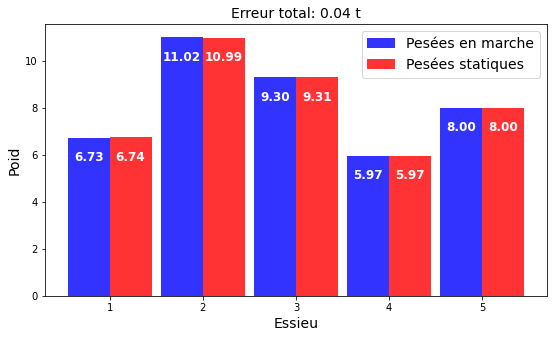

ERREUR :  0.017924770618144237
SPEED :  16.11665639466353
ERREUR :  -7.125433017307614e-05
Comparing weights


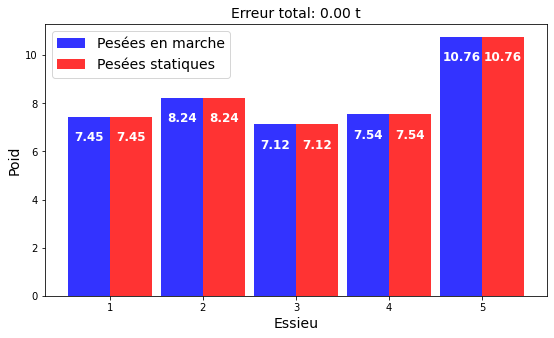

ERREUR :  -4.050093593832571e-13
Comparing weights


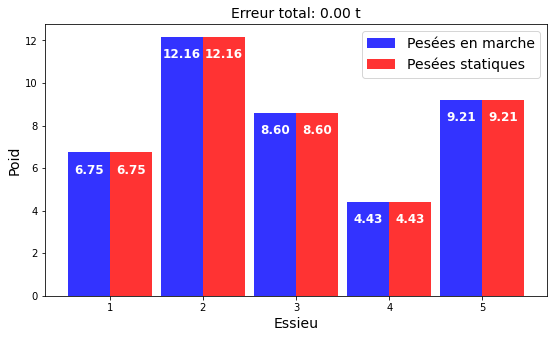

ERREUR :  0.01880977668817252
Comparing weights


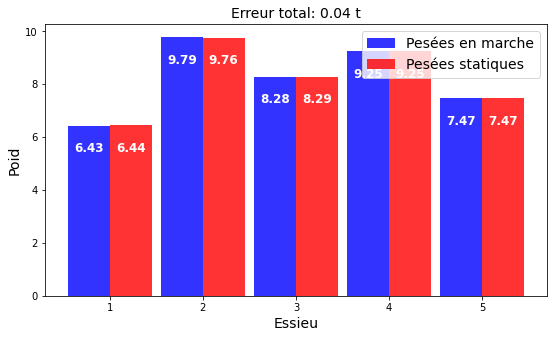

ERREUR :  0.0210617348022879
Comparing weights


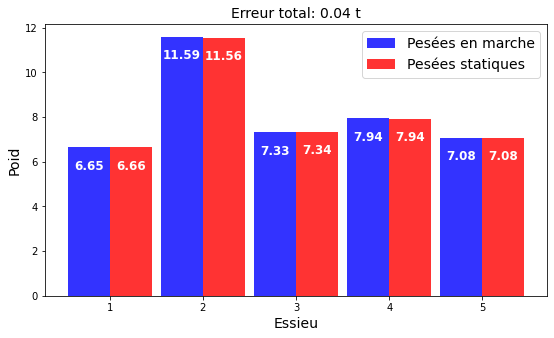

ERREUR :  0.02168953389605832
Comparing weights


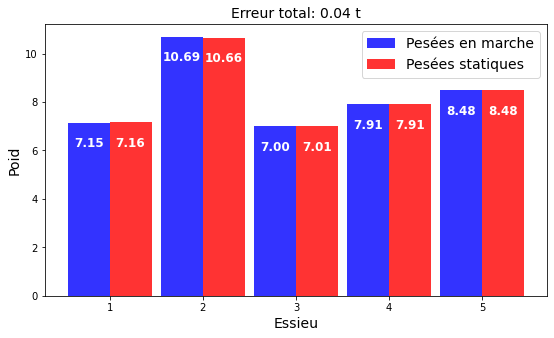

ERREUR :  -1.2789769243681803e-13
Comparing weights


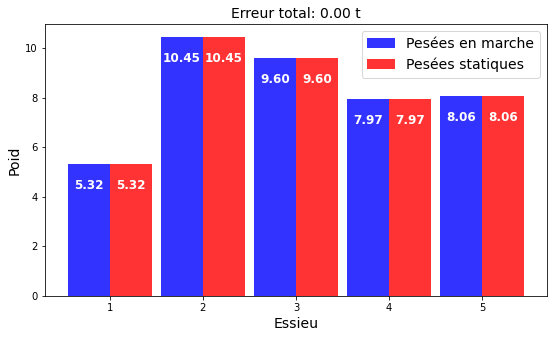

ERREUR :  0.023855436428902976
Comparing weights


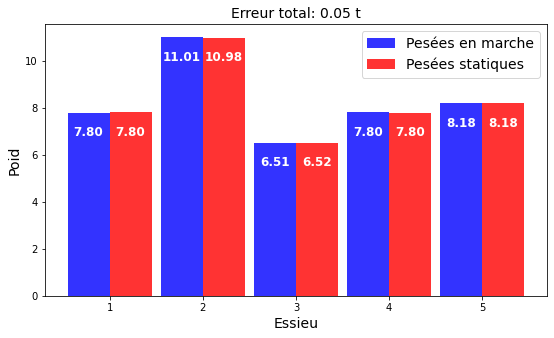

ERREUR :  0.0179318991255073
Comparing weights


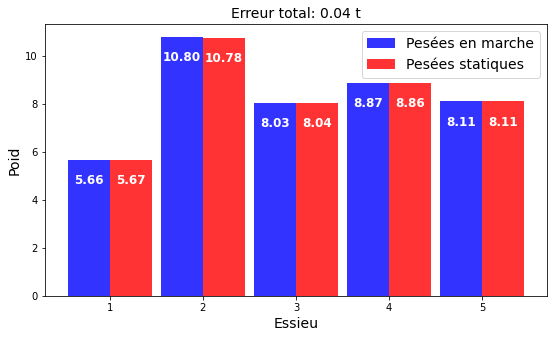

ERREUR :  -5.6660781261541615e-05
Comparing weights


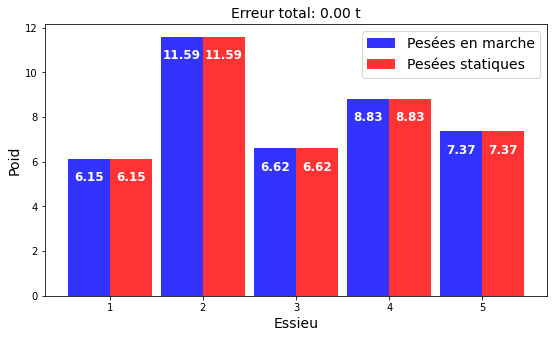

ERREUR :  2.5579538487363607e-13
Comparing weights


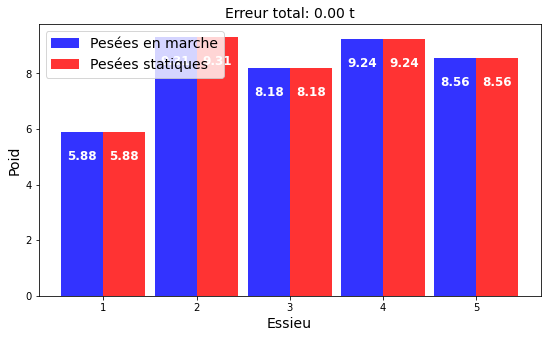

ERREUR :  -3.190358773963453e-05
Comparing weights


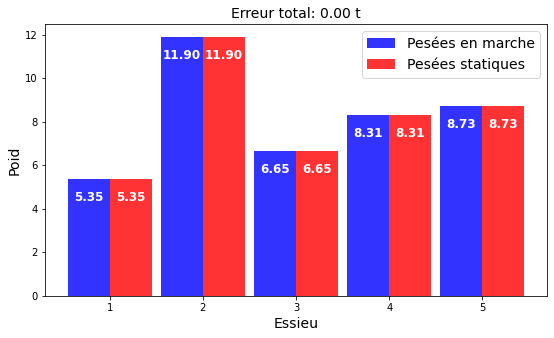

ERREUR :  -0.02851458121030248
Comparing weights


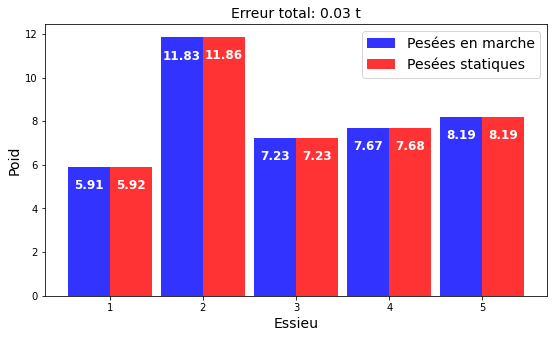

ERREUR :  0.017917441503222165
Comparing weights


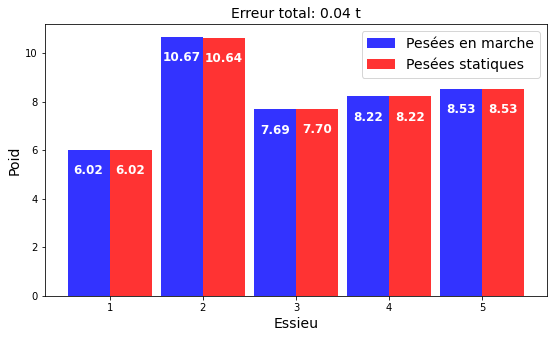

ERREUR :  0.017266963706774163
SPEED :  24.67240902981619
ERREUR :  -7.105427357601002e-15
Comparing weights


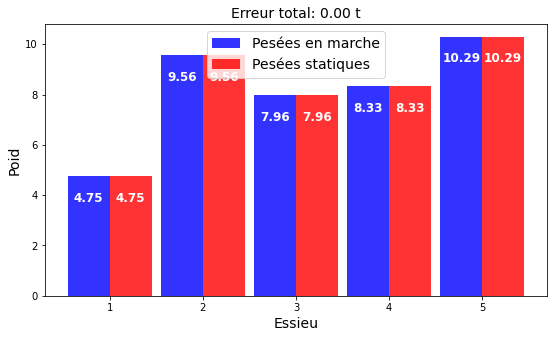

ERREUR :  2.6290081223123707e-13
Comparing weights


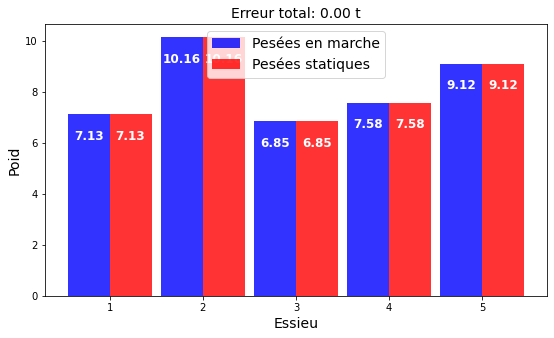

SIGMA FOR NOISE :  0.02777777777777778
Itération n° : 1/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 357, 479, 507, 535]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [272, 355, 477, 507, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [273, 356, 477, 507, 534]
positi

Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [271, 355, 477, 507, 537]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  537
Décalage trouvé
decalage found :  537
PEAKS :  [273, 354, 478, 507, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  354
Décalage trouvé
decalage found :  354
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :

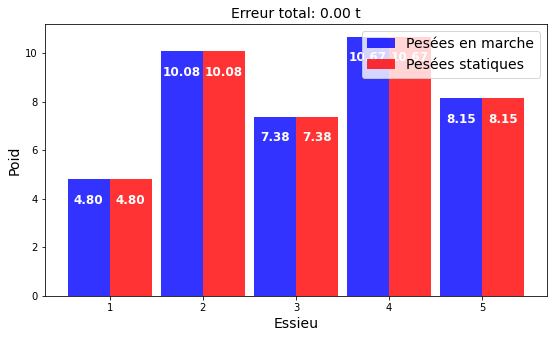

ERREUR :  1.6342482922482304e-13
SPEED :  18.79721024130277
ERREUR :  0.0245455719958656
Comparing weights


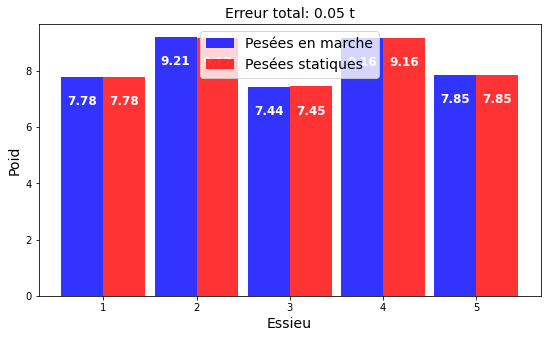

ERREUR :  -4.937528167658911e-06
Comparing weights


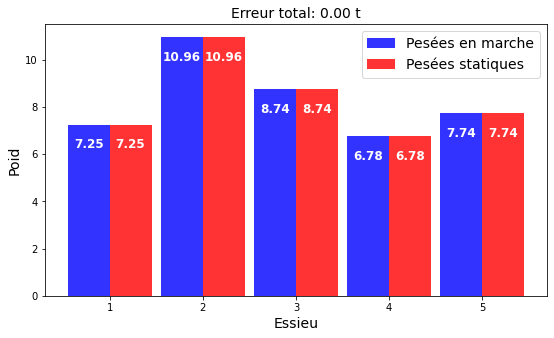

ERREUR :  0.018500456227712903
SPEED :  18.375621718813616
ERREUR :  1.4210854715202004e-14
Comparing weights


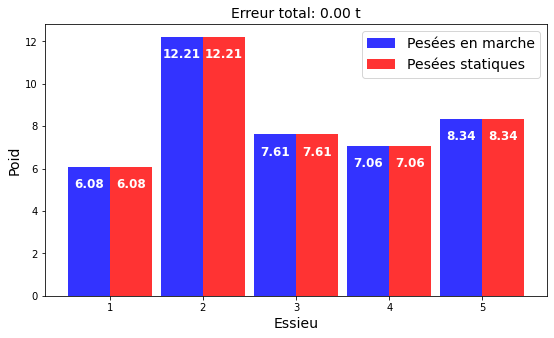

ERREUR :  0.01772676089588998
Comparing weights


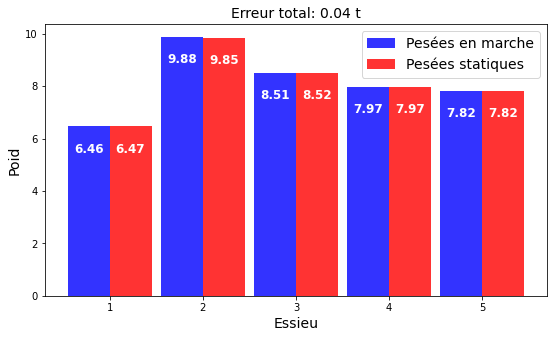

ERREUR :  0.019293685313769515
Comparing weights


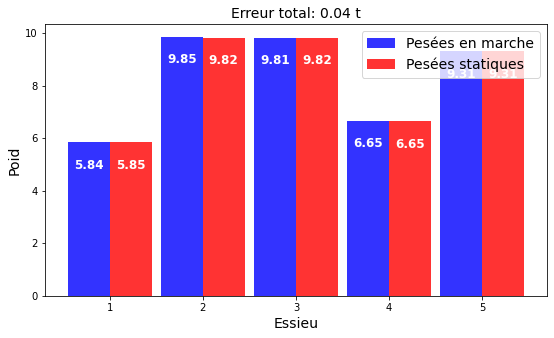

ERREUR :  0.01316760253816085
Comparing weights


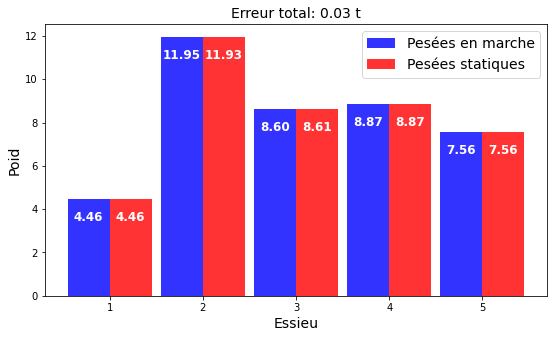

ERREUR :  0.020128230954775006
Comparing weights


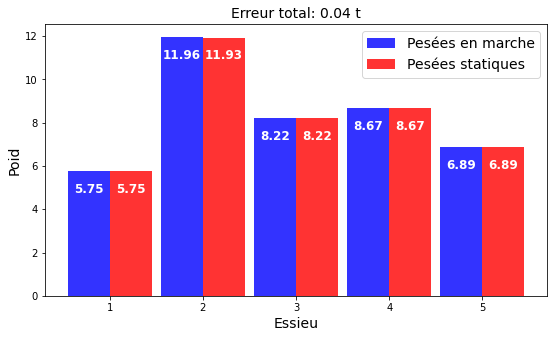

ERREUR :  0.021561816936689127
Comparing weights


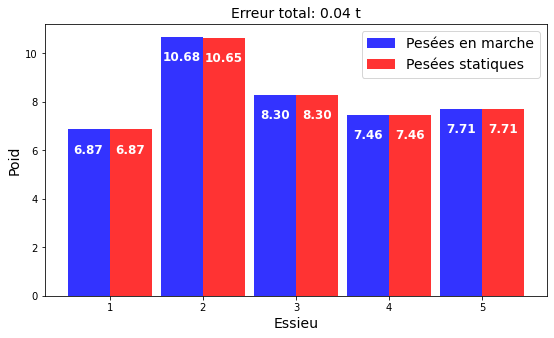

ERREUR :  -0.019854194495174227
Comparing weights


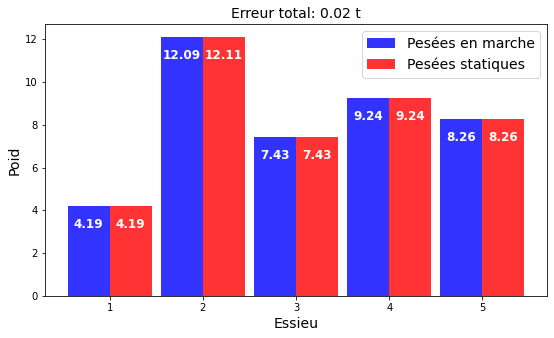

ERREUR :  0.018946200785308065
Comparing weights


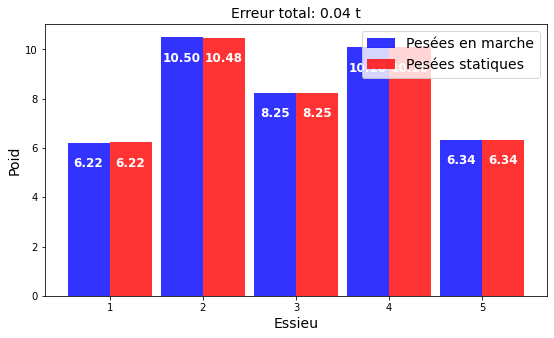

ERREUR :  0.02233528013338315
SPEED :  17.055715841709507
ERREUR :  7.318590178329032e-13
Comparing weights


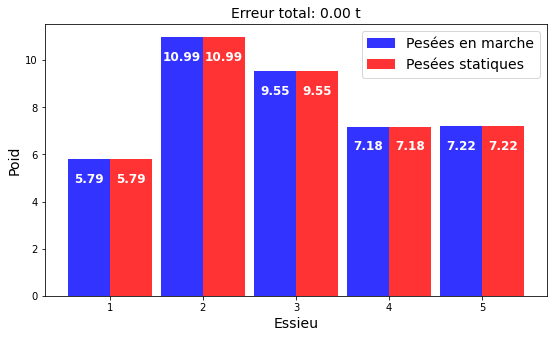

ERREUR :  -0.03648406159320672
Comparing weights


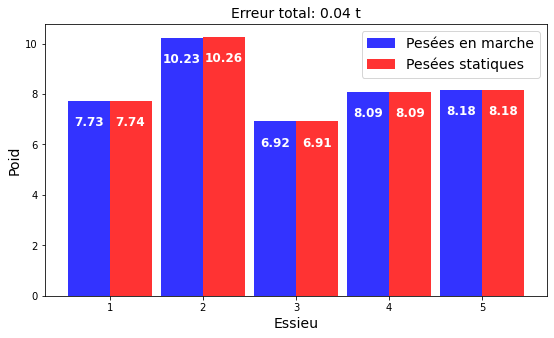

ERREUR :  4.973799150320701e-14
Comparing weights


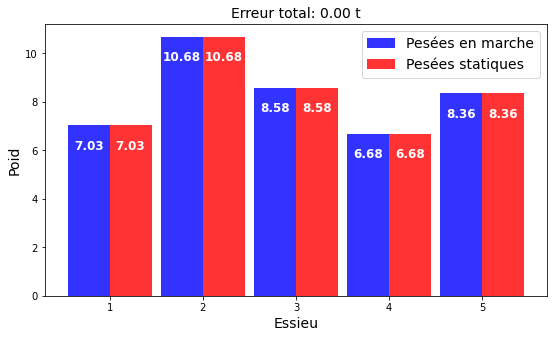

ERREUR :  7.744915819785092e-13
Comparing weights


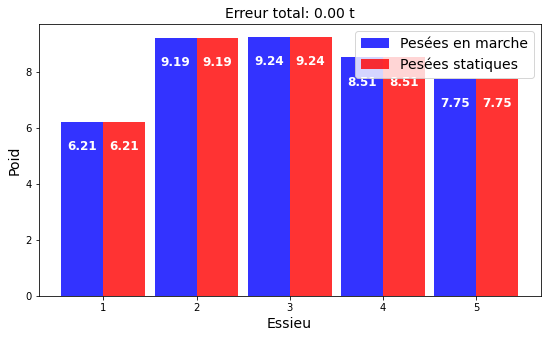

ERREUR :  0.024408119845723775
SPEED :  16.47514771998943
ERREUR :  1.5631940186722204e-13
SPEED :  18.303949150647597
ERREUR :  1.2101560429300662e-06
Comparing weights


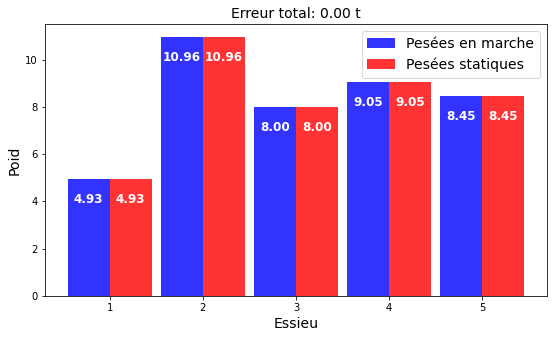

ERREUR :  0.017306874191589827
Comparing weights


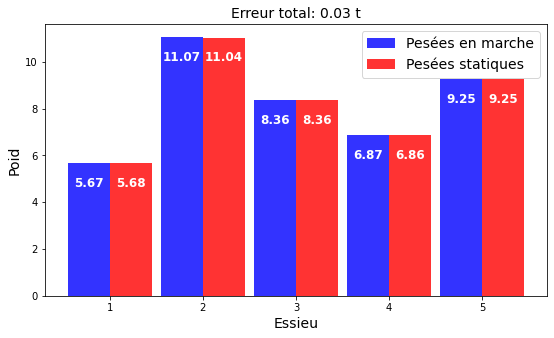

ERREUR :  0.017313152173223045
Comparing weights


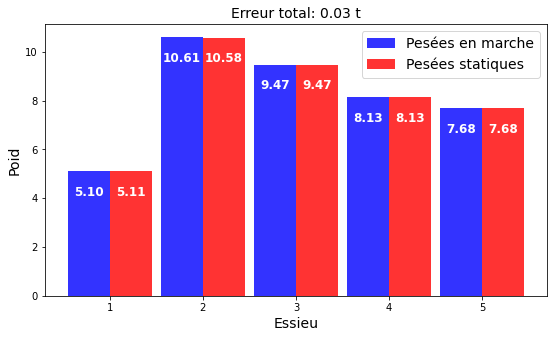

ERREUR :  0.01535724929807003
Comparing weights


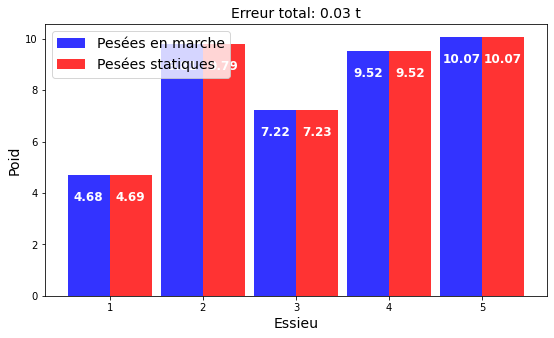

ERREUR :  0.018722711283338356
Comparing weights


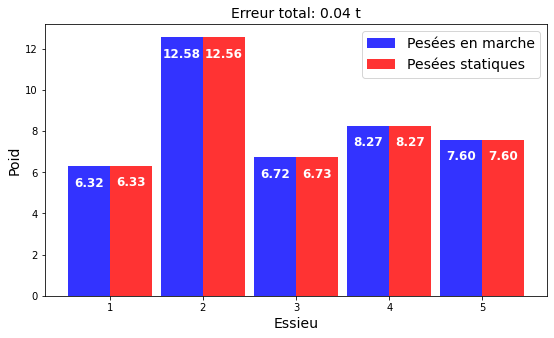

Itération n° : 2/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [271, 355, 479, 505, 534]
position décalage 0
peaks0 :  271
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 478, 506, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 357, 477, 507, 533]
position décalage 0
peaks0 :  274
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [270, 356, 478, 508, 533]
position décalage 0
peaks0 :  270
Décalage trouvé
decalage found :  270
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [274, 355, 478, 507, 534]
position décalage 0
peaks0 :  274
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  478
Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [272, 356, 479, 507

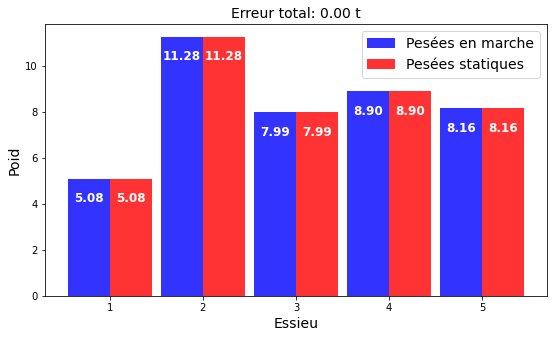

ERREUR :  3.552713678800501e-14
Comparing weights


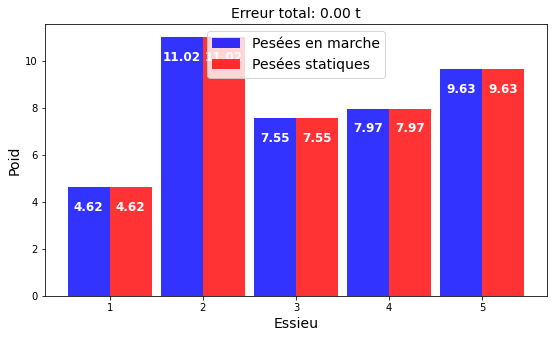

ERREUR :  0.018490813287201036
Comparing weights


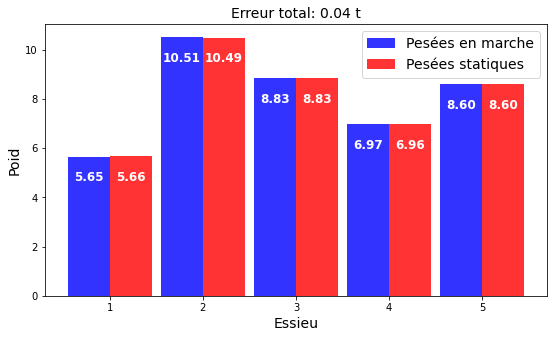

ERREUR :  0.0
Comparing weights


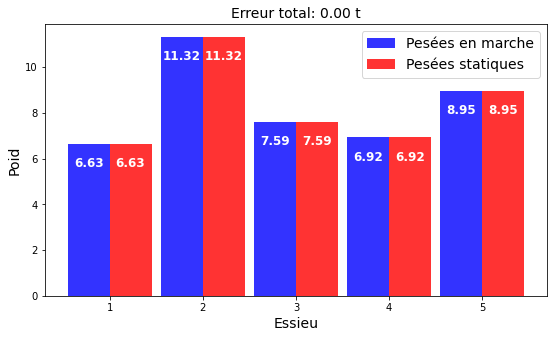

ERREUR :  0.0
Comparing weights


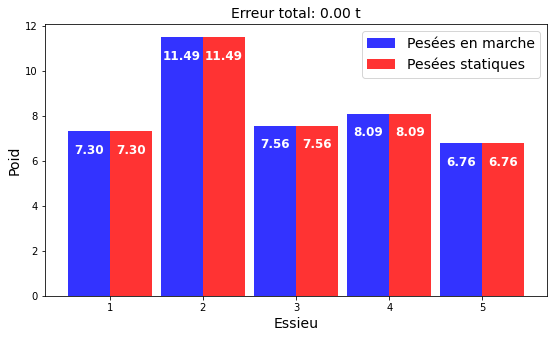

ERREUR :  -7.105427357601002e-15
Comparing weights


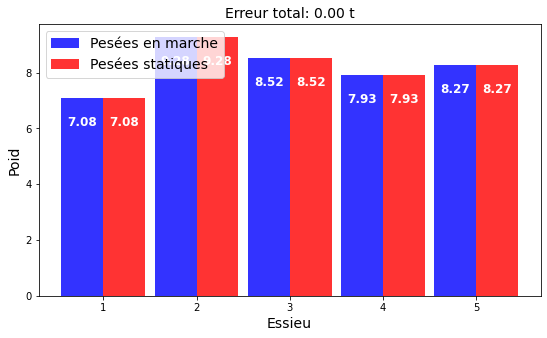

ERREUR :  4.263256414560601e-14
Comparing weights


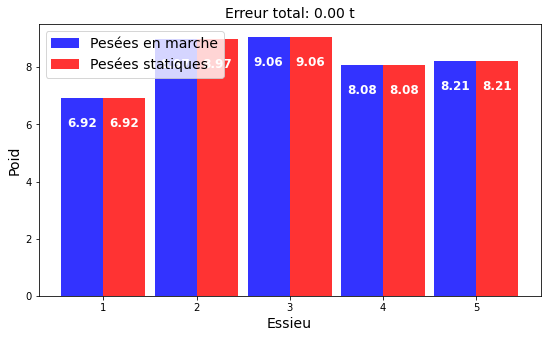

ERREUR :  -1.2789769243681803e-13
Comparing weights


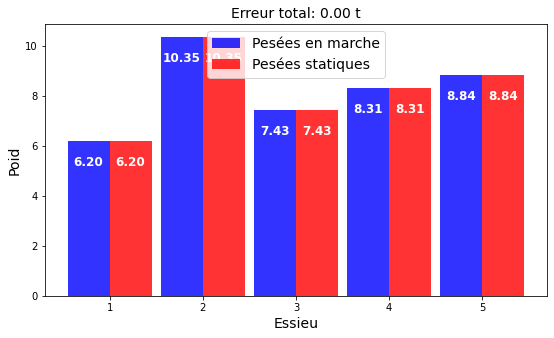

ERREUR :  0.013114417862738037
Comparing weights


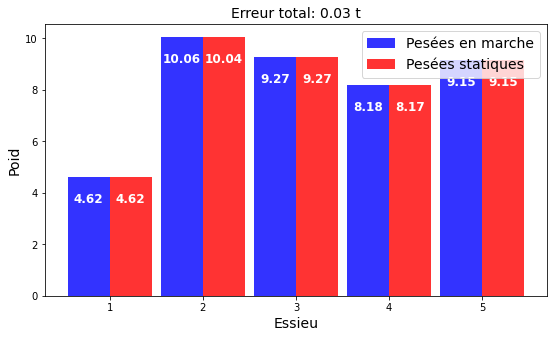

ERREUR :  8.526512829121202e-14
Comparing weights


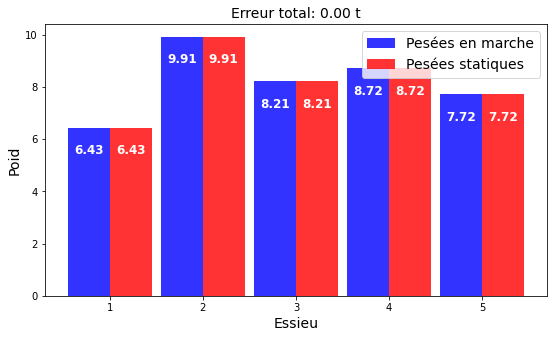

ERREUR :  0.015489333200683575
Comparing weights


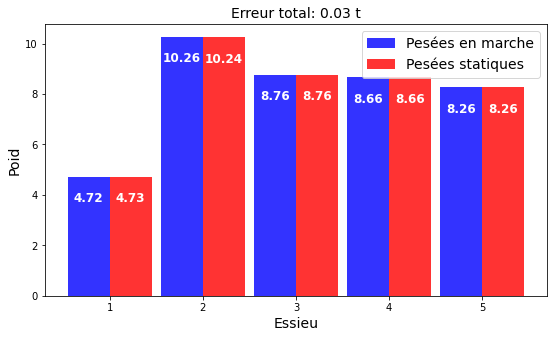

ERREUR :  -3.765876499528531e-13
Comparing weights


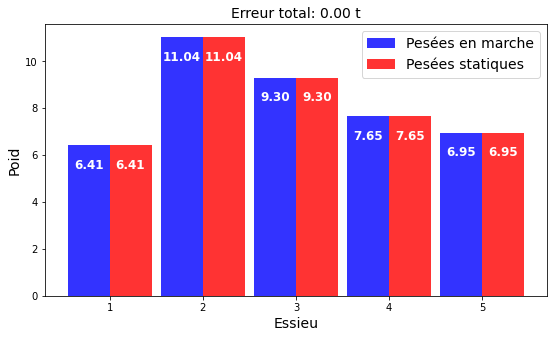

ERREUR :  0.018198894069769267
Comparing weights


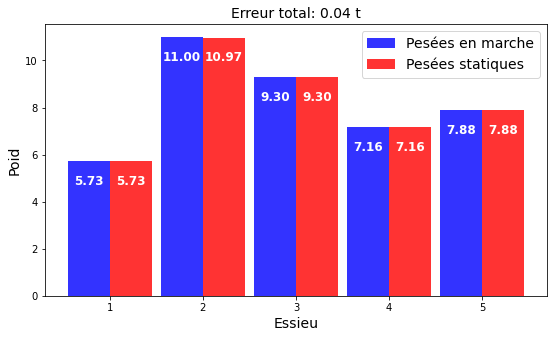

ERREUR :  1.2079226507921703e-13
Comparing weights


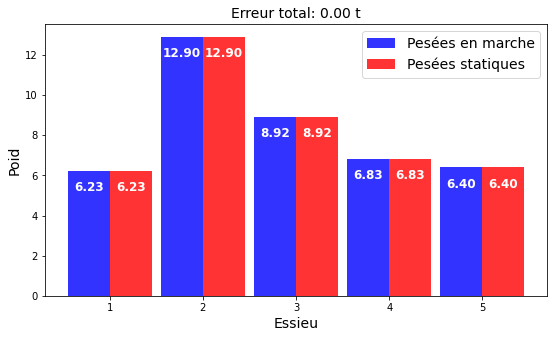

ERREUR :  -2.6290081223123707e-13
Comparing weights


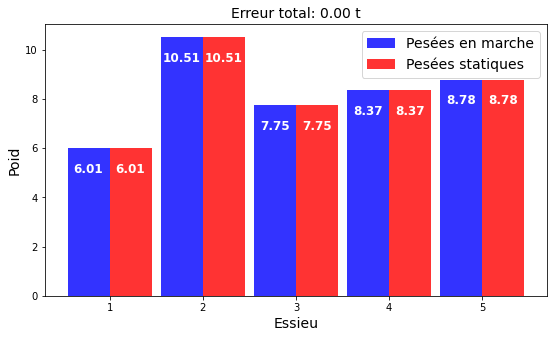

ERREUR :  0.017674887580447773
Comparing weights


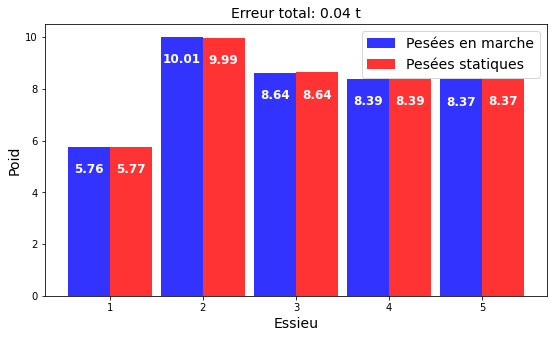

ERREUR :  0.013558796469183676
Comparing weights


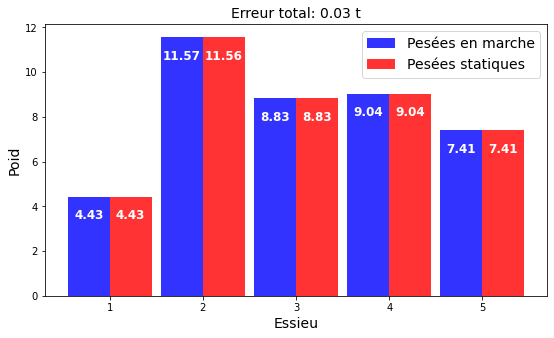

ERREUR :  -0.035539278286009335
Comparing weights


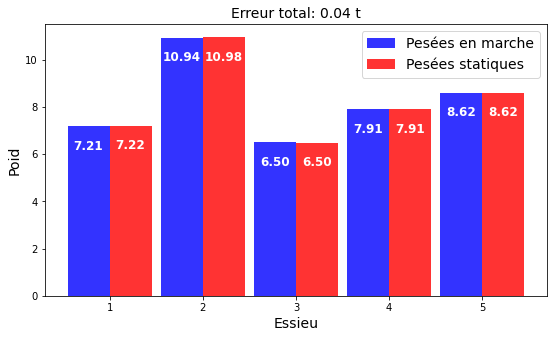

ERREUR :  6.394884621840902e-14
Comparing weights


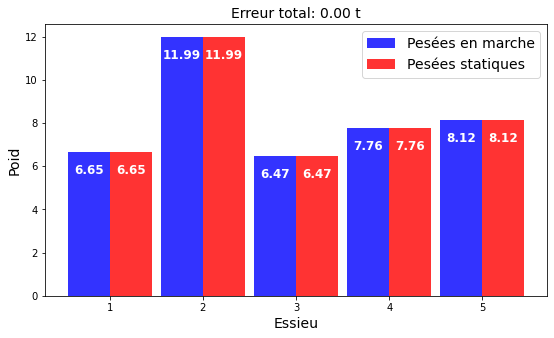

ERREUR :  0.011549388750630385
Comparing weights


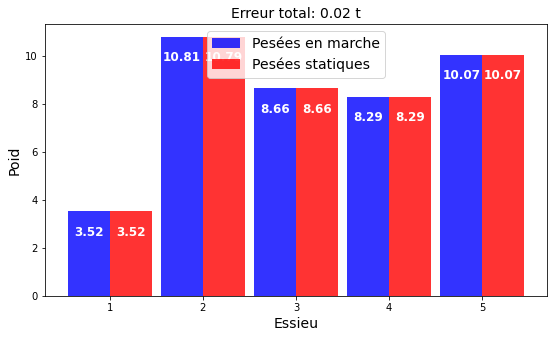

ERREUR :  2.1316282072803006e-14
Comparing weights


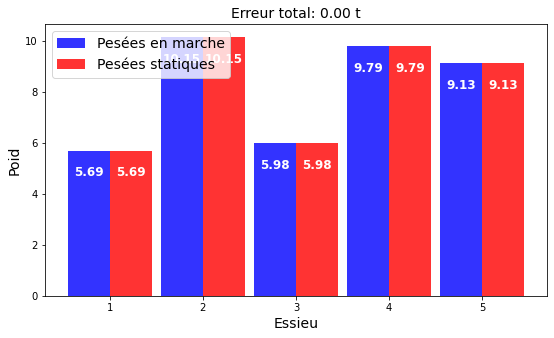

ERREUR :  -9.17340117467802e-05
Comparing weights


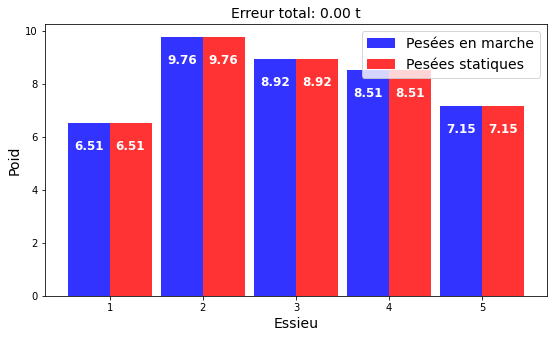

ERREUR :  -9.947598300641403e-14
Comparing weights


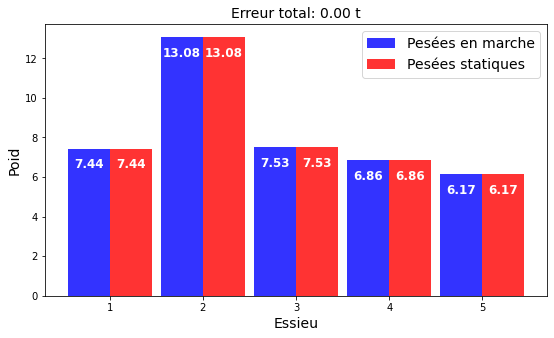

ERREUR :  2.842170943040401e-14
Comparing weights


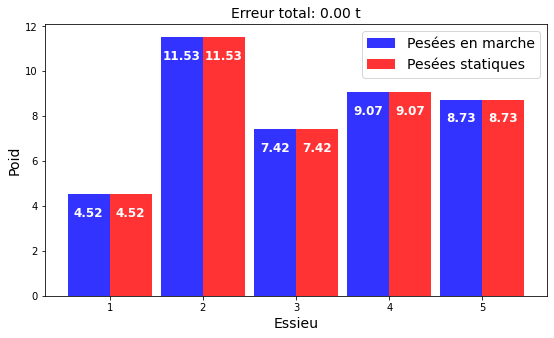

Itération n° : 3/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [273, 355, 477, 507, 535]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  535
Décalage trouvé
decalage found :  535
PEAKS :  [275, 355, 477, 508, 534]
position décalage 0
peaks0 :  275
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  508
Décalage trouvé
decalage found :  508
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 356, 478, 506, 534]
position décalage 0
peaks0 :  273
Décalage tr

Décalage trouvé
decalage found :  478
position décalage 3
peaks0 :  507
Décalage trouvé
decalage found :  507
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 357, 479, 505, 536]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  274
position décalage 1
peaks0 :  357
Décalage trouvé
decalage found :  357
position décalage 2
peaks0 :  479
Décalage trouvé
decalage found :  479
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  536
Décalage trouvé
decalage found :  536
PEAKS :  [272, 356, 476, 505, 533]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  356
Décalage trouvé
decalage found :  356
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  505
Décalage trouvé
decalage found :  505
position décalage 4
peaks0 :  533
Décalage trouvé
decalage found :  533
PEAKS :  [272, 358, 476, 506

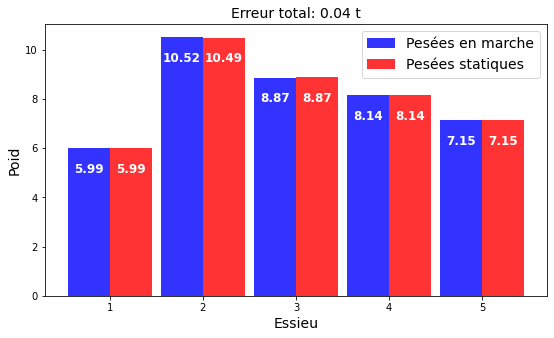

ERREUR :  0.022111597591219834
Comparing weights


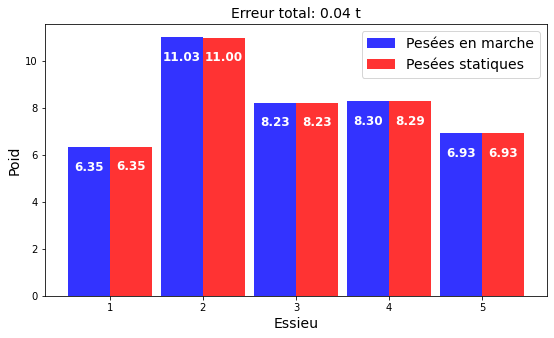

ERREUR :  0.019685278639620662
Comparing weights


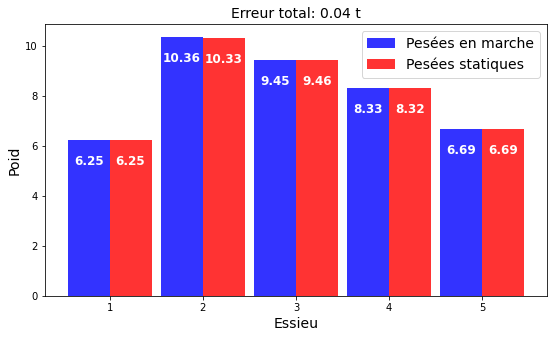

ERREUR :  0.014780053617769795
Comparing weights


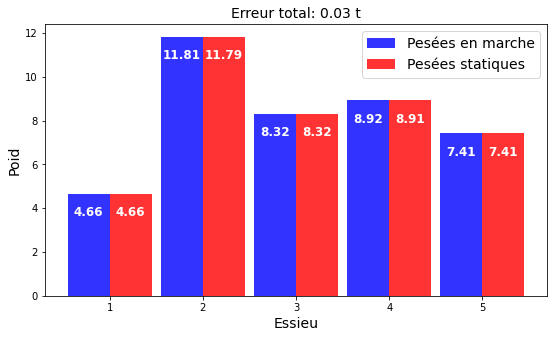

ERREUR :  -1.0682585127597122e-07
Comparing weights


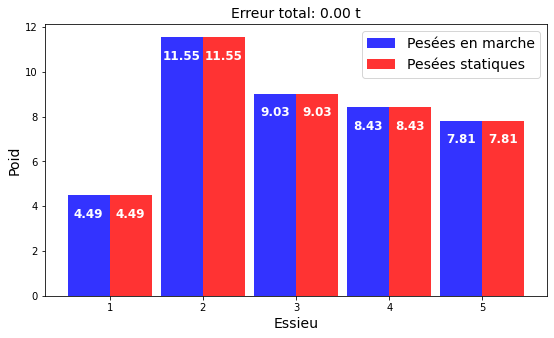

ERREUR :  0.015883879332797335
Comparing weights


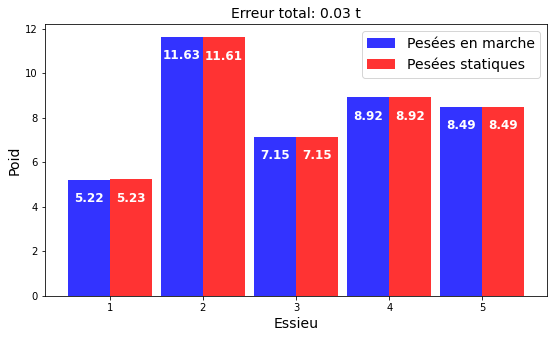

ERREUR :  0.02039293942411291
Comparing weights


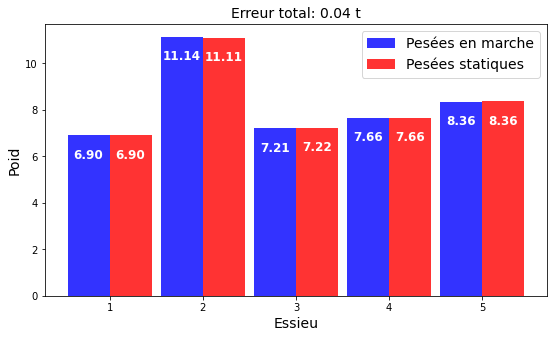

ERREUR :  -2.1493382007520268e-07
Comparing weights


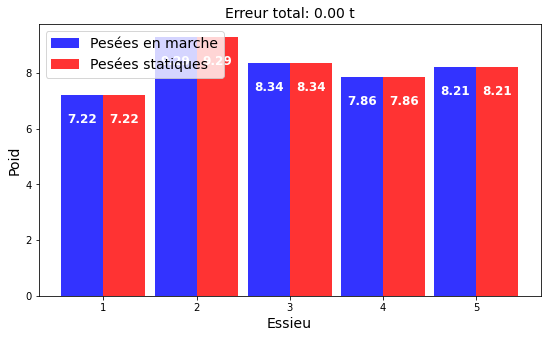

ERREUR :  2.1316282072803006e-14
Comparing weights


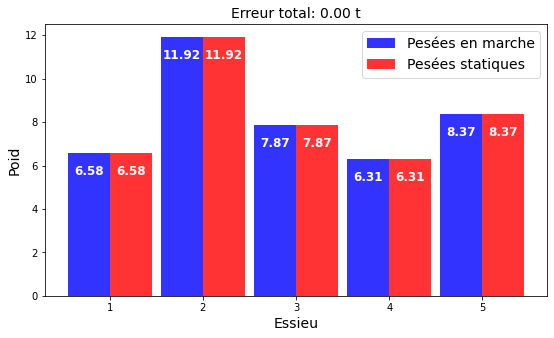

ERREUR :  0.01833473444455791
Comparing weights


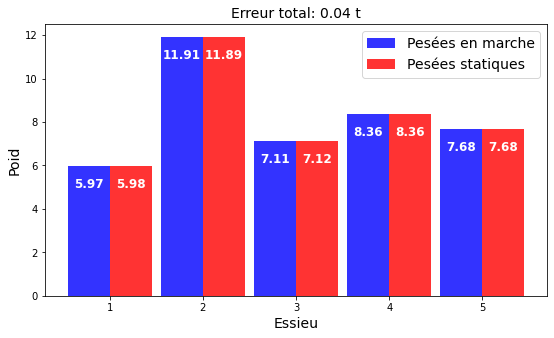

ERREUR :  -0.03167020207060034
Comparing weights


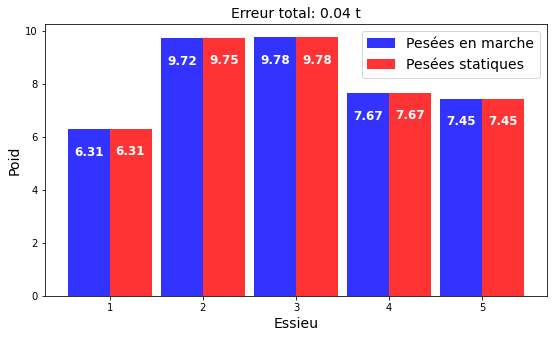

ERREUR :  -4.532351780994759e-06
Comparing weights


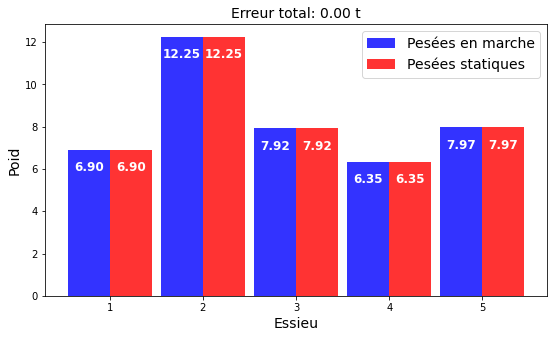

ERREUR :  0.02264392041616503
Comparing weights


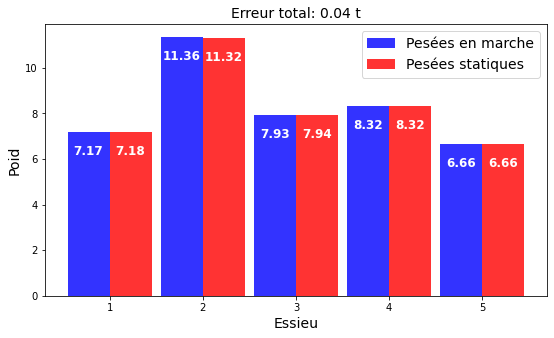

ERREUR :  -2.9859398225084988e-06
Comparing weights


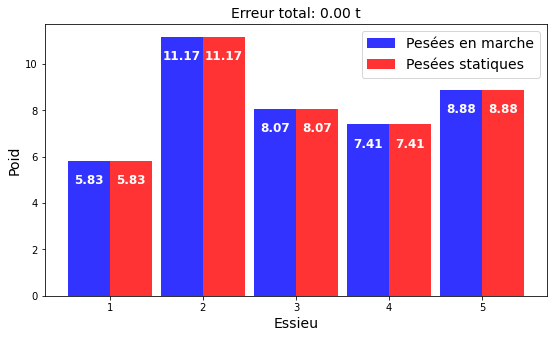

ERREUR :  -7.427154912420519e-06
Comparing weights


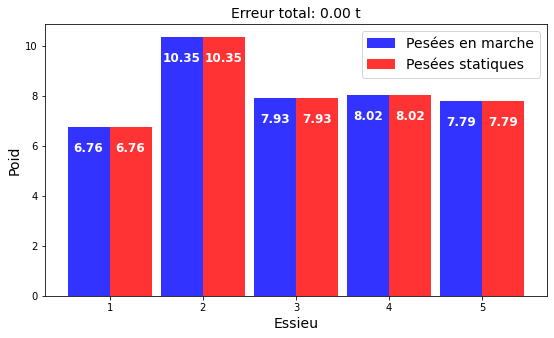

ERREUR :  2.1316282072803006e-14
Comparing weights


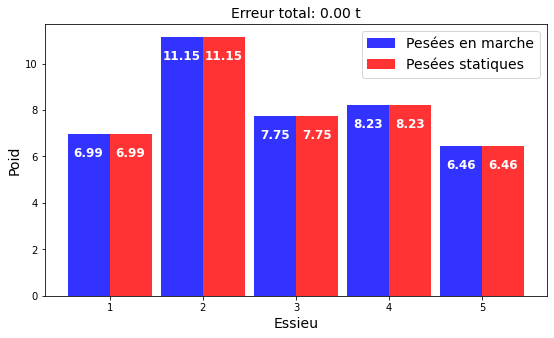

ERREUR :  0.015086825073694854
Comparing weights


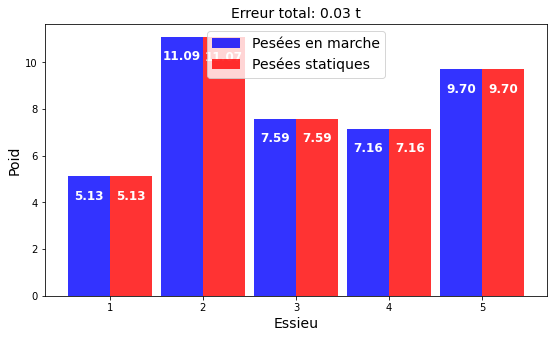

ERREUR :  -0.03610857802242862
Comparing weights


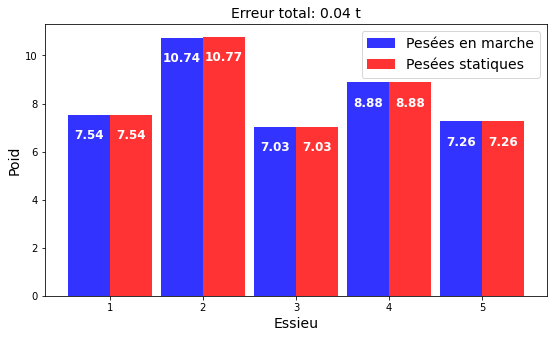

ERREUR :  -2.1316282072803006e-14
Comparing weights


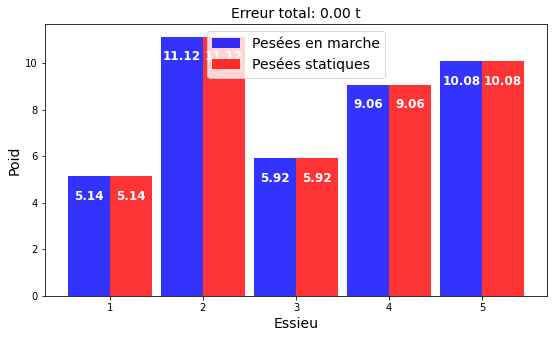

ERREUR :  9.237055564881302e-14
Comparing weights


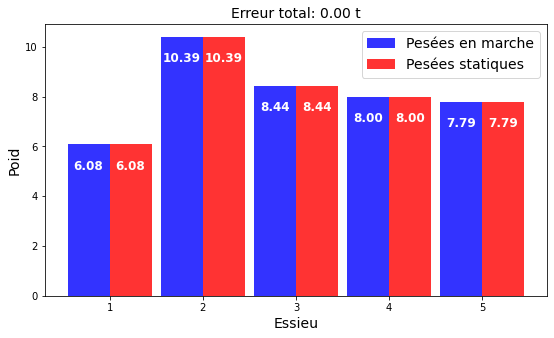

ERREUR :  -4.069883176782696e-05
Comparing weights


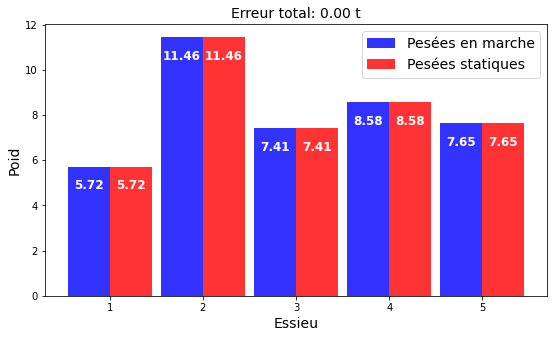

ERREUR :  -0.01735434749749487
Comparing weights


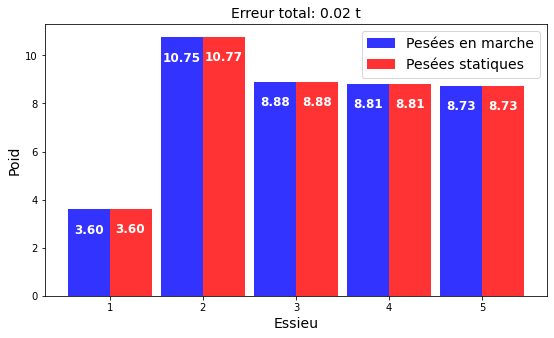

ERREUR :  -3.0537679407416363e-07
Comparing weights


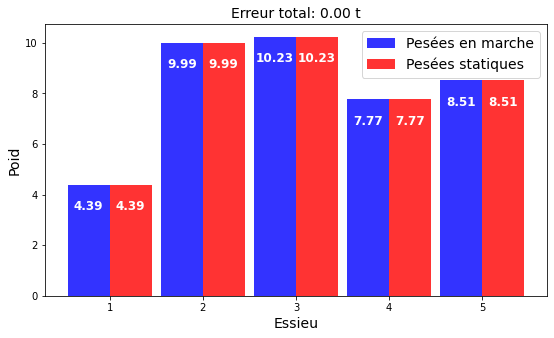

ERREUR :  -4.122703151665519e-05
Comparing weights


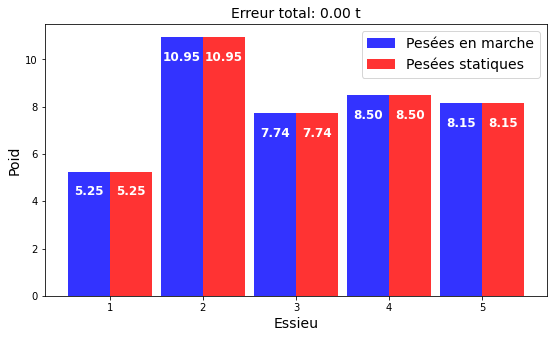

ERREUR :  0.01798236825220556
Comparing weights


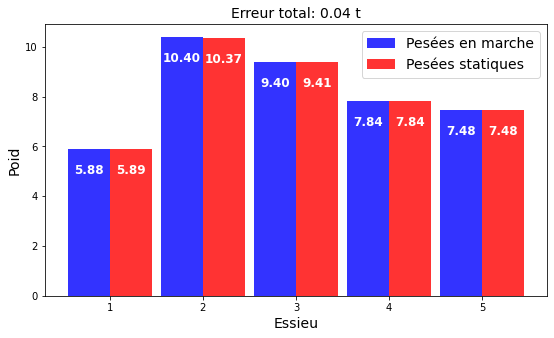

Itération n° : 4/5
LEN SE1 :  25
LEN SE2 :  25
********** Working on LI... **********
********** Working on weights... **********
PEAKS :  [272, 355, 477, 506, 534]
position décalage 0
peaks0 :  272
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  355
Décalage trouvé
decalage found :  355
position décalage 2
peaks0 :  477
Décalage trouvé
decalage found :  477
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [273, 358, 476, 506, 534]
position décalage 0
peaks0 :  273
Décalage trouvé
decalage found :  272
position décalage 1
peaks0 :  358
Décalage trouvé
decalage found :  358
position décalage 2
peaks0 :  476
Décalage trouvé
decalage found :  476
position décalage 3
peaks0 :  506
Décalage trouvé
decalage found :  506
position décalage 4
peaks0 :  534
Décalage trouvé
decalage found :  534
PEAKS :  [274, 356, 478, 507, 533]
position décalage 0
peaks0 :  274
Décalage tr

In [ ]:
sigmas = np.linspace(0,0.05,10)
for i in sigmas:
    lta,let,letr,lpt,lee1,lee2,lee3,lee4,lee5= get_stats3_noise(5,0.5,sigma =i)